In [1]:
import pandas as pd
import numpy as np
import random
from numpy.random import RandomState
from scipy import stats
from scipy.optimize import minimize
import scipy
import os
os.environ['R_HOME'] = '/Library/Frameworks/R.framework/Versions/4.1/Resources/'
import rpy2
from rpy2.robjects.packages import importr
from rpy2.robjects.packages import SignatureTranslatedAnonymousPackage
import datetime
from rpy2.robjects.vectors import FloatVector
from statsmodels.tsa.stattools import adfuller
from sklearn.linear_model import LinearRegression
import math

real_data_folder = "/Users/changmao/Desktop/OneDrive - Imperial College London/InferStat - MSc Summer Project/GitHub/Summer-Research-Project/Data/sp500_mixed_period_2000_2021/"
np.random.seed(12001)



# Define the model that generates pair simulations.
yuima = importr("yuima")
n_jumpou_NIG_sim_string = """
n_jumpou_NIG = function(random_seed, num_sim,
                        mu11, mu12, mu21, mu22, 
                        sigma11, sigma12, sigma21, sigma22,
                        j11, j12, j21, j22,
                        alpha, beta1, beta2, delta0, mu1, mu2, 
                        lambda11, lambda12, lambda21, lambda22,
                        xinit_vec, T0, T, length){
  
  set.seed(random_seed)
  
  drift = c("mu11*t-mu12*X1", "mu21*t-mu22*X2")
  diffusion = matrix(c("exp(sigma11)", "exp(sigma12)", "exp(sigma21)", "exp(sigma22)"), 2, 2, byrow=TRUE)
  jumpcoef = matrix(c("j11", "j12", "j21", "j22"), 2, 2, byrow=TRUE) 
  
  
  beta = c(beta1, beta2)
  delta0 = delta0
  mu = c(mu1, mu2)
  lambda11 = sum(lambda11)
  alpha = beta1^2*lambda11 + beta2^2/lambda11 + 1
  Lambda = matrix(c(lambda11, 0, 0, 1/lambda11), 2, 2, byrow=TRUE)
  
  ou_model = setModel(drift=drift, diffusion=diffusion, jump.coeff=jumpcoef, 
                      measure.type="code",
                      measure=list(df="rNIG(z, alpha, beta, delta0, mu, Lambda)"), 
                      time.variable = "t",
                      state.var=c("X1","X2"), solve.variable=c("X1","X2"))
  newsamp = setSampling(Initial=T0, Terminal=T, n=length)
  
  n_sim_data = data.frame(matrix(nrow=length+1, ncol=2*num_sim))
  for (i in 1:num_sim){
    jumpou_sim = simulate(ou_model, 
                          true.par=list(
                            mu11=mu11, mu12=mu12, mu21=mu21, mu22=mu22, 
                            sigma11=sigma11, sigma12=sigma12, sigma21=sigma21, sigma22=sigma22,
                            j11=j11, j12=j12, j21=j21, j22=j22,
                            alpha=alpha, beta=beta, delta0=delta0, mu=mu, Lambda=Lambda), 
                          xinit=xinit_vec[[i]], sampling=newsamp)
    original_data = jumpou_sim@data@original.data
    one_sim_jumpou = data.frame(original_data[,1], original_data[,2])
    colnames(one_sim_jumpou) = c('series1', 'series2')
    n_sim_data[, (2*i-1):(2*i)] = one_sim_jumpou
  }
  return(n_sim_data)
}
"""

n_jumpou_NIG_sim = SignatureTranslatedAnonymousPackage(n_jumpou_NIG_sim_string, "n_jumpou_NIG_sim")
def n_jumpou_simulation(random_seed, num_sim,
                        mu11, mu12, mu21, mu22, 
                        sigma11, sigma12, sigma21, sigma22,
                        j11, j12, j21, j22,
                        alpha, beta1, beta2, delta0, mu1, mu2, 
                        lambda11, lambda12, lambda21, lambda22,
                        xinit_vec, T0, T, length):

    n_sim_data = pd.DataFrame(
        n_jumpou_NIG_sim.n_jumpou_NIG(random_seed, num_sim,
                                      mu11, mu12, mu21, mu22, 
                                      sigma11, sigma12, sigma21, sigma22,
                                      j11, j12, j21, j22,
                                      alpha, beta1, beta2, delta0, mu1, mu2, 
                                      lambda11, lambda12, lambda21, lambda22,
                                      xinit_vec, T0, T, length)).transpose()
    return n_sim_data


def price_to_log_price(n_price):
    return(np.log(n_price))

def log_price_to_price(n_log_price):
    return(np.exp(n_log_price))

def price_to_return(n_price):
    n_return = pd.DataFrame()
    for i in range(n_price.shape[1]):
        ith_column_price_series = n_price.iloc[:, i]
        n_return = pd.concat([n_return, 100 * (np.log(ith_column_price_series[1:].values) - np.log(ith_column_price_series[:-1]))], axis=1)
    return n_return

def log_price_to_return(n_log_price):
    n_real_return = pd.DataFrame()
    for i in range(n_log_price.shape[1]):
        ith_column_price_series = n_log_price.iloc[:, i]
        n_real_return = pd.concat([n_real_return, 100 * (ith_column_price_series[1:].values - ith_column_price_series[:-1])], axis=1)
    return n_real_return


def cross_corr_coef(lag_time_series, lead_time_series, lag):
    # calculate the cross correlation between two time series
    # if the result is not zero, then 'lead_time_series' leads 'lag_time_series'
    lag_time_series = lag_time_series.iloc[lag:]
    corr_coef = np.corrcoef(lag_time_series, lead_time_series.iloc[0:((lead_time_series.size)-lag)])[0][1]
    return corr_coef

def cal_stats(n_return, n_price):
    
    return_series1 = n_return.iloc[:, ::2]
    return_series2 = n_return.iloc[:, 1::2]
    price_series1 = n_price.iloc[:, ::2]
    price_series2 = n_price.iloc[:, 1::2]
    sq_return_series1 = return_series1**2
    sq_return_series2 = return_series2**2

    
    mean1 = return_series1.mean(axis=0).values
    sd1 = return_series1.std(axis=0).values
    skew1 = return_series1.skew(axis=0).values
    kurtosis1 = return_series1.kurtosis(axis=0).values
       
    
    mean2 = return_series2.mean(axis=0).values
    sd2 = return_series2.std(axis=0).values
    skew2 = return_series2.skew(axis=0).values
    kurtosis2 = return_series2.kurtosis(axis=0).values #8(8)
    
    
    
    # Autocorrelation of the 2 return series with 3 lags respectively
    autocorr1_lag_1 = return_series1.apply(lambda x: x.autocorr(lag=1))
    autocorr1_lag_2 = return_series1.apply(lambda x: x.autocorr(lag=2))
    autocorr1_lag_3 = return_series1.apply(lambda x: x.autocorr(lag=3))
    autocorr2_lag_1 = return_series2.apply(lambda x: x.autocorr(lag=1)) 
    autocorr2_lag_2 = return_series2.apply(lambda x: x.autocorr(lag=2)) 
    autocorr2_lag_3 = return_series2.apply(lambda x: x.autocorr(lag=3)) #6(14)
    
    # Cross-correlation between return series
    corr_ts1_lag_0 = []
    corr_ts1_lag_1 = [] # if not zero, return series 2 leads return series 1
    corr_ts1_lag_2 = []
    corr_ts1_lag_3 = []
    corr_ts2_lag_1 = [] # if not zero, return series 1 lead return series 2
    corr_ts2_lag_2 = []
    corr_ts2_lag_3 = []
    for i in range(int(real_price.shape[1]/2)):
        corr_ts1_lag_0.append(cross_corr_coef(return_series1.iloc[:, i], return_series2.iloc[:, i], 0))
        corr_ts1_lag_1.append(cross_corr_coef(return_series1.iloc[:, i], return_series2.iloc[:, i], 1))
        corr_ts1_lag_2.append(cross_corr_coef(return_series1.iloc[:, i], return_series2.iloc[:, i], 2))
        corr_ts1_lag_3.append(cross_corr_coef(return_series1.iloc[:, i], return_series2.iloc[:, i], 3))
        corr_ts2_lag_1.append(cross_corr_coef(return_series2.iloc[:, i], return_series1.iloc[:, i], 1))
        corr_ts2_lag_2.append(cross_corr_coef(return_series2.iloc[:, i], return_series1.iloc[:, i], 2))
        corr_ts2_lag_3.append(cross_corr_coef(return_series2.iloc[:, i], return_series1.iloc[:, i], 3))
    corr_ts1_lag_0 = pd.Series(corr_ts1_lag_0)
    corr_ts1_lag_1 = pd.Series(corr_ts1_lag_1)
    corr_ts1_lag_2 = pd.Series(corr_ts1_lag_2)
    corr_ts1_lag_3 = pd.Series(corr_ts1_lag_3)
    corr_ts2_lag_1 = pd.Series(corr_ts2_lag_1)
    corr_ts2_lag_2 = pd.Series(corr_ts2_lag_2)
    corr_ts2_lag_3 = pd.Series(corr_ts2_lag_3)#7(21)
    
    
    
    # Autocorrelation of the 2 squared returns with 3 lags respectively
    autocorr_sqreturn_1_lag_1 = sq_return_series1.apply(lambda x: x.autocorr(lag=1))
    autocorr_sqreturn_1_lag_2 = sq_return_series1.apply(lambda x: x.autocorr(lag=2))
    autocorr_sqreturn_1_lag_3 = sq_return_series1.apply(lambda x: x.autocorr(lag=3))
    autocorr_sqreturn_2_lag_1 = sq_return_series2.apply(lambda x: x.autocorr(lag=1)) 
    autocorr_sqreturn_2_lag_2 = sq_return_series2.apply(lambda x: x.autocorr(lag=2)) 
    autocorr_sqreturn_2_lag_3 = sq_return_series2.apply(lambda x: x.autocorr(lag=3))#6(27)
    
    # Cross-correlation between squared returns series
    corr_sqts1_lag_0 = []
    corr_sqts1_lag_1 = [] # if not zero, return series 2 leads return series 1
    corr_sqts1_lag_2 = []
    corr_sqts1_lag_3 = []
    corr_sqts2_lag_1 = [] # if not zero, return series 1 lead return series 2
    corr_sqts2_lag_2 = []
    corr_sqts2_lag_3 = []
    for i in range(int(real_price.shape[1]/2)):
        corr_sqts1_lag_0.append(cross_corr_coef(sq_return_series1.iloc[:, i], sq_return_series2.iloc[:, i], 0))
        corr_sqts1_lag_1.append(cross_corr_coef(sq_return_series1.iloc[:, i], sq_return_series2.iloc[:, i], 1))
        corr_sqts1_lag_2.append(cross_corr_coef(sq_return_series1.iloc[:, i], sq_return_series2.iloc[:, i], 2))
        corr_sqts1_lag_3.append(cross_corr_coef(sq_return_series1.iloc[:, i], sq_return_series2.iloc[:, i], 3))
        corr_sqts2_lag_1.append(cross_corr_coef(sq_return_series2.iloc[:, i], sq_return_series1.iloc[:, i], 1))
        corr_sqts2_lag_2.append(cross_corr_coef(sq_return_series2.iloc[:, i], sq_return_series1.iloc[:, i], 2))
        corr_sqts2_lag_3.append(cross_corr_coef(sq_return_series2.iloc[:, i], sq_return_series1.iloc[:, i], 3))
    corr_sqts1_lag_0 = pd.Series(corr_ts1_lag_0)
    corr_sqts1_lag_1 = pd.Series(corr_ts1_lag_1)
    corr_sqts1_lag_2 = pd.Series(corr_ts1_lag_2)
    corr_sqts1_lag_3 = pd.Series(corr_ts1_lag_3)
    corr_sqts2_lag_1 = pd.Series(corr_ts2_lag_1)
    corr_sqts2_lag_2 = pd.Series(corr_ts2_lag_2)
    corr_sqts2_lag_3 = pd.Series(corr_ts2_lag_3)#7(34)
    
    
    
    
    stats_data = pd.DataFrame([mean1, mean2, sd1, sd2, 
                               skew1, skew2, kurtosis1, kurtosis2, #8(8)
                               
                               autocorr1_lag_1, autocorr1_lag_2, autocorr1_lag_3,
                               autocorr2_lag_1, autocorr2_lag_2, autocorr2_lag_3,#6(14)
                               
                               corr_ts1_lag_0, 
                               corr_ts1_lag_1, corr_ts1_lag_2, corr_ts1_lag_3,
                               corr_ts2_lag_1, corr_ts2_lag_2, corr_ts2_lag_3, #7(21)
                               
                               autocorr_sqreturn_1_lag_1, autocorr_sqreturn_1_lag_2, autocorr_sqreturn_1_lag_3,
                               autocorr_sqreturn_2_lag_1, autocorr_sqreturn_2_lag_2, autocorr_sqreturn_2_lag_3,#6(27)
                               
                               corr_sqts1_lag_0,
                               corr_sqts1_lag_1, corr_sqts1_lag_2, corr_sqts1_lag_3,
                               corr_sqts2_lag_1, corr_sqts2_lag_2, corr_sqts2_lag_3])#7(34)
    stats_data = stats_data.transpose()
#     stats_data.columns = [
#         'return_mean1', 'return_mean2',
#         'return_sd1', 'return_sd2',
#         'return_skew1', 'return_skew2',
#         'return_kurtosis1', 'return_kurtosis2',
        
#         'return_autocorrelation_ts1_lag1', 'return_autocorrelation_ts1_lag2', 'return_autocorrelation_ts1_lag3',
#         'return_autocorrelation_ts2_lag1', 'return_autocorrelation_ts2_lag2', 'return_autocorrelation_ts2_lag3',
        
#         'return_correlation_ts1_lag_0',
#         'return_correlation_ts1_lag_1', 'return_correlation_ts1_lag_2', 'return_correlation_ts1_lag_3',
#         'return_correlation_ts2_lag_1', 'return_correlation_ts2_lag_2', 'return_correlation_ts2_lag_3',
        
#         'sqreturn_autocorrelation_ts1_lag1', 'sqreturn_autocorrelation_ts1_lag2', 'sqreturn_autocorrelation_ts1_lag3',
#         'sqreturn_autocorrelation_ts2_lag1', 'sqreturn_autocorrelation_ts2_lag2', 'sqreturn_autocorrelation_ts2_lag3',
    
#         'sqreturn_correlation_ts1_lag_0',
#         'sqreturn_correlation_ts1_lag_1', 'sqreturn_correlation_ts1_lag_2', 'sqreturn_correlation_ts1_lag_3', 
#         'sqreturn_correlation_ts2_lag_1', 'sqreturn_correlation_ts2_lag_2', 'sqreturn_correlation_ts2_lag_3']
    
    return stats_data


losses_vec = []
params_vec = []
def loss_function(params):

    params = FloatVector(params)
    print(params)
    
    params_vec.append(params)
    
    moment_loss = pd.DataFrame().reindex_like(real_stats)
    
    n_sim_log_price = n_jumpou_simulation(
        random_seed=int(np.random.randint(low=0, high=980608, size=(1,))), num_sim=num_sim,
        mu11=params[0], mu12=params[1], 
        mu21=params[2], mu22=params[3], 
        sigma11=params[4], sigma12=params[5], 
        sigma21=params[6], sigma22=params[7],
        j11=params[8], j12=params[9], 
        j21=params[10], j22=params[11],
        
        alpha=2*params[12]*params[13]+0.5, 
        beta1=params[12], beta2=params[13], 
        delta0=params[14], 
        mu1=0, mu2=0, 
        lambda11=params[15], lambda12=0, 
        lambda21=0, lambda22=1/params[15],

        xinit_vec=xinit_vec, T0=T0, T=T, length=length)
    
    n_sim_price = log_price_to_price(n_sim_log_price)
    n_sim_return = price_to_return(n_sim_price)
    n_sim_stats = cal_stats(n_sim_return, n_sim_price)

    moment_loss = np.abs(n_real_stats - n_sim_stats)
    sum_loss = np.sum(moment_loss)

    sum_loss[6] = sum_loss[6]/10 
    sum_loss[7] = sum_loss[7]/10 
    
    loss = np.sum(sum_loss)
    
    losses_vec.append(loss)

    print(sum_loss)
    print(loss)
    print('----------')

    return loss


real_price = pd.read_csv(real_data_folder + "pair_prices_cal.csv", index_col=[0])
real_log_price = price_to_log_price(n_price=real_price)
real_return = pd.read_csv(real_data_folder + "pair_returns_cal.csv", index_col=[0])
real_stats = cal_stats(n_return=real_return, n_price=real_price)

xinit_vec = []
for i in range(int(real_log_price.shape[1]/2)):
    init_pair_log_price = [real_log_price.iloc[0, 2*i], real_log_price.iloc[0, 2*i+1]]
    init_pair_log_price = FloatVector(init_pair_log_price)
    xinit_vec.append(init_pair_log_price)
    
num_sim, T0, T, length = real_stats.shape[0], 0, 2, real_price.shape[0]
n_real_stats = real_stats


initial0 = [0.5, 1, 0.5, 1,
            -1, -1, -1, -1,
            0.1, 0.1, 0.1, 0.1,
            
            1, 1, 
            1, 
            1]

begin_time = datetime.datetime.now()
res = minimize(loss_function, initial0, method='powell',
               tol=1e-6, 
               options={'disp': True},
               bounds=[                       
                   (0, 1), (0, None), (0, 1), (0, None),
                   (None, None), (None, None), (None, None), (None, None),
                   (None, None), (None, None), (None, None), (None, None),
                   
                   (0, None), (0, None), 
                   (0, None), 
                   (0, None)])
print(res.x)

time = datetime.datetime.now() - begin_time
print(time)

params = (res.x)
loss = loss_function((params))
print(loss)




 [1]  0.5  1.0  0.5  1.0 -1.0 -1.0 -1.0 -1.0  0.1  0.1  0.1  0.1  1.0  1.0  1.0
[16]  1.0

0     126.823739
1     121.596639
2     393.552788
3     384.641901
4     154.980123
5     163.257734
6     158.375836
7     172.247791
8      16.311422
9      14.026603
10     14.443337
11     16.089668
12     14.726756
13     14.638022
14    166.463491
15     14.182038
16     14.260939
17     14.942886
18     15.484818
19     12.066208
20     14.612462
21     28.402128
22     24.474941
23     22.620498
24     30.692985
25     26.320592
26     22.890913
27    166.463491
28     14.182038
29     14.260939
30     14.942886
31     15.484818
32     12.066208
33     14.612462
dtype: float64
2425.1401000906817
----------
 [1]  0.381966  1.000000  0.500000  1.000000 -1.000000 -1.000000 -1.000000
 [8] -1.000000  0.100000  0.100000  0.100000  0.100000  1.000000  1.000000
[15]  1.000000  1.000000

0     135.598237
1     123.225968
2     388.013922
3     380.004098
4     157.935561
5     166.332421
6     15

0     112.898543
1     122.014760
2     397.429806
3     388.455961
4     158.947047
5     172.827420
6     164.516497
7     181.628961
8      16.717174
9      14.253218
10     13.895357
11     16.356411
12     14.536624
13     14.595788
14    166.448228
15     13.884915
16     13.834577
17     14.351766
18     16.320728
19     12.806307
20     14.439824
21     26.136216
22     24.686041
23     22.455121
24     28.490678
25     27.133416
26     21.474345
27    166.448228
28     13.884915
29     13.834577
30     14.351766
31     16.320728
32     12.806307
33     14.439824
dtype: float64
2443.6220758098107
----------
 [1]  0.7634604  1.0000000  0.5000000  1.0000000 -1.0000000 -1.0000000
 [7] -1.0000000 -1.0000000  0.1000000  0.1000000  0.1000000  0.1000000
[13]  1.0000000  1.0000000  1.0000000  1.0000000

0     110.604449
1     119.613552
2     394.125377
3     385.912567
4     153.606716
5     168.157249
6     152.821089
7     170.915361
8      15.832411
9      15.168834
10     14.08116

0     112.479371
1     121.445696
2     390.057798
3     382.677305
4     155.103777
5     162.273290
6     151.051614
7     170.161697
8      16.167833
9      14.360295
10     14.568526
11     16.399874
12     16.018867
13     15.424494
14    166.447428
15     14.670144
16     13.908709
17     14.423092
18     14.758361
19     13.326812
20     14.292854
21     26.703057
22     25.433749
23     22.311355
24     29.338481
25     27.293459
26     21.888380
27    166.447428
28     14.670144
29     13.908709
30     14.423092
31     14.758361
32     13.326812
33     14.292854
dtype: float64
2394.813720782144
----------
 [1]  0.7639349  1.0000000  0.5000000  1.0000000 -1.0000000 -1.0000000
 [7] -1.0000000 -1.0000000  0.1000000  0.1000000  0.1000000  0.1000000
[13]  1.0000000  1.0000000  1.0000000  1.0000000

0     112.664504
1     121.429270
2     396.606099
3     386.665680
4     152.628072
5     160.653876
6     154.421507
7     169.662344
8      17.042377
9      14.721137
10     13.411332

0      45.245803
1     123.149288
2     391.571622
3     386.196412
4     156.887077
5     168.194439
6     158.460038
7     173.609860
8      15.920363
9      14.029742
10     14.309773
11     16.045175
12     14.881265
13     13.786092
14    166.144405
15     13.918434
16     13.472367
17     14.050009
18     14.359396
19     12.427473
20     14.460030
21     28.063312
22     24.868421
23     21.074020
24     29.688457
25     26.600504
26     21.576064
27    166.144405
28     13.918434
29     13.472367
30     14.050009
31     14.359396
32     12.427473
33     14.460030
dtype: float64
2341.82195596785
----------
 [1]  0.7639324  0.5233555  0.5000000  1.0000000 -1.0000000 -1.0000000
 [7] -1.0000000 -1.0000000  0.1000000  0.1000000  0.1000000  0.1000000
[13]  1.0000000  1.0000000  1.0000000  1.0000000

0      66.251732
1     123.982784
2     390.242109
3     383.621276
4     158.744446
5     174.210930
6     158.295795
7     177.588377
8      14.538345
9      14.002550
10     14.167305


0      67.116653
1     121.978954
2     388.073875
3     383.641095
4     149.328106
5     165.688155
6     152.174592
7     168.948308
8      16.068182
9      13.928553
10     13.405726
11     15.626948
12     14.751707
13     14.479014
14    166.302687
15     14.580383
16     13.517244
17     14.038276
18     15.158920
19     12.962954
20     13.893869
21     27.305126
22     25.448734
23     21.560504
24     29.104089
25     27.192364
26     21.201903
27    166.302687
28     14.580383
29     13.517244
30     14.038276
31     15.158920
32     12.962954
33     13.893869
dtype: float64
2337.93125626836
----------
 [1]  0.7639324  0.5272213  0.5000000  1.0000000 -1.0000000 -1.0000000
 [7] -1.0000000 -1.0000000  0.1000000  0.1000000  0.1000000  0.1000000
[13]  1.0000000  1.0000000  1.0000000  1.0000000

0      62.950486
1     120.071172
2     389.534747
3     384.349811
4     149.783082
5     162.781106
6     150.508846
7     168.256712
8      16.428693
9      15.175649
10     13.654857


0      67.352069
1     110.231933
2     390.837800
3     385.766941
4     144.961101
5     158.707799
6     151.530818
7     169.100176
8      15.505582
9      13.819439
10     13.826046
11     16.229240
12     15.602521
13     15.028115
14    166.243285
15     13.963648
16     14.480686
17     14.335525
18     15.041264
19     13.276947
20     12.987965
21     26.874051
22     25.632729
23     21.887005
24     28.925828
25     26.750233
26     22.056243
27    166.243285
28     13.963648
29     14.480686
30     14.335525
31     15.041264
32     13.276947
33     12.987965
dtype: float64
2321.284309435545
----------
 [1]  0.7639324  0.5272218  0.7231061  1.0000000 -1.0000000 -1.0000000
 [7] -1.0000000 -1.0000000  0.1000000  0.1000000  0.1000000  0.1000000
[13]  1.0000000  1.0000000  1.0000000  1.0000000

0      65.975568
1     109.664286
2     392.184629
3     386.825544
4     147.258880
5     163.064538
6     150.010824
7     171.483440
8      15.519295
9      14.461540
10     15.264772

0      66.940829
1     110.330151
2     389.518301
3     383.901980
4     150.925650
5     161.173613
6     153.463206
7     168.553296
8      15.665586
9      14.426847
10     13.689152
11     17.410695
12     15.134716
13     13.696858
14    166.249213
15     15.206350
16     14.417025
17     13.851415
18     15.535620
19     13.695261
20     14.014789
21     28.267585
22     26.359478
23     22.362449
24     30.481073
25     27.725053
26     20.972527
27    166.249213
28     15.206350
29     14.417025
30     13.851415
31     15.535620
32     13.695261
33     14.014789
dtype: float64
2336.938388875471
----------
 [1]  0.7639324  0.5272218  0.7244695  1.0000000 -1.0000000 -1.0000000
 [7] -1.0000000 -1.0000000  0.1000000  0.1000000  0.1000000  0.1000000
[13]  1.0000000  1.0000000  1.0000000  1.0000000

0      64.073438
1     108.177280
2     392.786338
3     387.227100
4     157.525477
5     165.310221
6     155.785429
7     169.622210
8      15.652876
9      14.111853
10     14.131519

0      67.250606
1      38.784292
2     391.904207
3     381.490655
4     150.197263
5     161.477990
6     152.914982
7     169.178334
8      15.882099
9      13.606091
10     14.034544
11     16.328474
12     13.864894
13     14.502258
14    166.533820
15     13.400943
16     13.969053
17     14.358038
18     15.662262
19     12.651000
20     13.546703
21     27.352941
22     24.816232
23     22.403572
24     30.247326
25     27.031333
26     22.330749
27    166.533820
28     13.400943
29     13.969053
30     14.358038
31     15.662262
32     12.651000
33     13.546703
dtype: float64
2255.8424820744312
----------
 [1]  0.7639324  0.5272218  0.7244735  0.2168899 -1.0000000 -1.0000000
 [7] -1.0000000 -1.0000000  0.1000000  0.1000000  0.1000000  0.1000000
[13]  1.0000000  1.0000000  1.0000000  1.0000000

0      67.380774
1      32.970024
2     389.539107
3     381.370939
4     155.268013
5     163.546225
6     152.985968
7     172.546033
8      16.265591
9      14.036212
10     14.98985

0      64.535544
1      42.103175
2     391.011093
3     383.554945
4     154.323464
5     163.871902
6     151.076675
7     169.002333
8      15.612948
9      14.310491
10     13.022934
11     16.737124
12     14.638554
13     13.465527
14    166.544522
15     14.272454
16     13.726161
17     13.256641
18     14.693697
19     13.185315
20     13.420795
21     26.609416
22     24.579493
23     21.105836
24     29.384179
25     27.376192
26     21.085943
27    166.544522
28     14.272454
29     13.726161
30     13.256641
31     14.693697
32     13.185315
33     13.420795
dtype: float64
2255.606939601988
----------
 [1]  0.7639324  0.5272218  0.7244735  0.3613891 -1.0000000 -1.0000000
 [7] -1.0000000 -1.0000000  0.1000000  0.1000000  0.1000000  0.1000000
[13]  1.0000000  1.0000000  1.0000000  1.0000000

0      64.673465
1      42.813691
2     387.479194
3     379.775092
4     152.156623
5     159.240642
6     153.298330
7     172.420317
8      14.990369
9      14.112472
10     14.866856

0      64.266175
1      42.337820
2     389.444370
3     381.950673
4     156.273713
5     166.685110
6     150.139902
7     169.251019
8      17.092749
9      14.521863
10     14.400161
11     15.711612
12     14.986494
13     15.064480
14    166.543770
15     14.756972
16     14.421043
17     14.614701
18     15.254167
19     13.304685
20     14.606899
21     26.405277
22     24.492102
23     21.881344
24     28.365131
25     26.321412
26     21.487206
27    166.543770
28     14.756972
29     14.421043
30     14.614701
31     15.254167
32     13.304685
33     14.606899
dtype: float64
2268.0830848759488
----------
 [1]  0.7639324  0.5272218  0.7244735  0.3618964 -1.0000000 -1.0000000
 [7] -1.0000000 -1.0000000  0.1000000  0.1000000  0.1000000  0.1000000
[13]  1.0000000  1.0000000  1.0000000  1.0000000

0      65.905929
1      42.382588
2     391.364183
3     380.854819
4     151.589538
5     165.232482
6     150.657734
7     166.600499
8      14.937671
9      14.956428
10     13.64953

0      64.286639
1      39.749173
2     215.815916
3     380.237286
4     178.058226
5     168.665992
6     166.461183
7     171.353558
8      16.554226
9      14.797687
10     14.144713
11     16.199210
12     14.491139
13     13.892533
14    104.851834
15     14.633752
16     13.497178
17     14.739695
18     15.695728
19     13.106874
20     14.539692
21     26.385556
22     25.994113
23     21.324650
24     29.064587
25     27.637512
26     20.509980
27    104.851834
28     14.633752
29     13.497178
30     14.739695
31     15.695728
32     13.106874
33     14.539692
dtype: float64
2007.7533838302686
----------
 [1]  0.7639324  0.5272218  0.7244735  0.3618932 -2.6180340 -1.0000000
 [7] -1.0000000 -1.0000000  0.1000000  0.1000000  0.1000000  0.1000000
[13]  1.0000000  1.0000000  1.0000000  1.0000000

0      61.483180
1      41.321771
2     223.988819
3     381.654845
4     164.916526
5     164.344150
6     147.495786
7     169.424018
8      15.548730
9      14.483173
10     15.15735

0      62.939934
1      40.152195
2     216.585325
3     381.471093
4     178.242964
5     162.791810
6     163.186889
7     170.040754
8      15.901150
9      15.489784
10     13.990183
11     15.548723
12     14.377977
13     14.509093
14    110.463629
15     13.386610
16     14.676754
17     14.989040
18     15.746149
19     13.324439
20     14.095457
21     26.387759
22     26.023226
23     21.559223
24     29.558149
25     27.720946
26     21.526901
27    110.463629
28     13.386610
29     14.676754
30     14.989040
31     15.746149
32     13.324439
33     14.095457
dtype: float64
2011.3682377359446
----------
 [1]  0.7639324  0.5272218  0.7244735  0.3618932 -3.5332191 -1.0000000
 [7] -1.0000000 -1.0000000  0.1000000  0.1000000  0.1000000  0.1000000
[13]  1.0000000  1.0000000  1.0000000  1.0000000

0      65.070751
1      43.083326
2     216.699783
3     380.642148
4     162.895082
5     165.879544
6     150.430105
7     168.464186
8      15.492951
9      14.428750
10     15.20088

0      64.692486
1      41.065985
2     181.589258
3     378.179851
4     192.795832
5     165.003850
6     175.389309
7     170.972800
8      15.854369
9      13.918752
10     14.558557
11     15.301703
12     14.130763
13     14.288126
14    110.533335
15     13.837152
16     13.084306
17     14.105784
18     13.618106
19     13.343646
20     14.997299
21     26.052504
22     24.725126
23     22.448603
24     29.930734
25     27.029952
26     22.290221
27    110.533335
28     13.837152
29     13.084306
30     14.105784
31     13.618106
32     13.343646
33     14.997299
dtype: float64
1997.2580336808774
----------
 [1]  0.7639324  0.5272218  0.7244735  0.3618932 -3.5334724 -1.0908620
 [7] -1.0000000 -1.0000000  0.1000000  0.1000000  0.1000000  0.1000000
[13]  1.0000000  1.0000000  1.0000000  1.0000000

0      64.429680
1      43.505696
2     192.205392
3     378.341710
4     180.978289
5     168.937809
6     167.486228
7     171.327949
8      15.959568
9      14.544153
10     14.89949

0      64.496367
1      42.397661
2     188.566066
3     381.631307
4     193.006231
5     166.177527
6     166.885095
7     167.028420
8      16.422526
9      14.503206
10     15.078906
11     16.233125
12     14.858566
13     14.319888
14    110.711115
15     14.543833
16     13.586515
17     13.536772
18     15.057004
19     13.775260
20     13.500496
21     26.076471
22     25.643734
23     22.646455
24     30.016627
25     27.283764
26     21.197292
27    110.711115
28     14.543833
29     13.586515
30     13.536772
31     15.057004
32     13.775260
33     13.500496
dtype: float64
2003.891221519535
----------
 [1]  0.7639324  0.5272218  0.7244735  0.3618932 -3.5334724 -1.1225031
 [7] -1.0000000 -1.0000000  0.1000000  0.1000000  0.1000000  0.1000000
[13]  1.0000000  1.0000000  1.0000000  1.0000000

0      63.899143
1      43.573858
2     192.394257
3     381.299225
4     181.972885
5     160.434711
6     160.876671
7     170.026575
8      16.551703
9      14.274954
10     14.507064

0      62.759714
1      39.505220
2     189.586137
3     242.890029
4     192.342190
5     188.762193
6     173.196835
7     167.841430
8      17.075995
9      14.175087
10     14.998852
11     15.805203
12     14.492511
13     15.309491
14    160.704065
15     14.567593
16     13.923475
17     14.813814
18     14.665597
19     13.512720
20     14.951295
21     26.602274
22     25.075114
23     21.617504
24     28.979942
25     26.005844
26     21.472495
27    160.704065
28     14.567593
29     13.923475
30     14.813814
31     14.665597
32     13.512720
33     14.951295
dtype: float64
1992.7711771273027
----------
 [1]  0.7639324  0.5272218  0.7244735  0.3618932 -3.5334724 -1.1224908
 [7] -1.8571559 -1.0000000  0.1000000  0.1000000  0.1000000  0.1000000
[13]  1.0000000  1.0000000  1.0000000  1.0000000

0      64.821445
1      40.810504
2     188.977973
3     251.683580
4     186.926017
5     177.726498
6     161.944193
7     174.945481
8      16.823631
9      14.940220
10     15.15584

0      65.645245
1      42.574979
2     188.401189
3     251.621632
4     184.949769
5     183.607859
6     164.938454
7     172.320962
8      16.436149
9      15.166159
10     14.584668
11     15.375774
12     14.643276
13     13.698944
14    154.445862
15     13.818228
16     14.314459
17     14.403560
18     15.844224
19     12.845626
20     13.944450
21     25.847209
22     25.472153
23     22.287874
24     28.510197
25     26.462760
26     22.447302
27    154.445862
28     13.818228
29     14.314459
30     14.403560
31     15.844224
32     12.845626
33     13.944450
dtype: float64
1974.2253750972786
----------
 [1]  0.7639324  0.5272218  0.7244735  0.3618932 -3.5334724 -1.1224908
 [7] -1.8390563 -1.0000000  0.1000000  0.1000000  0.1000000  0.1000000
[13]  1.0000000  1.0000000  1.0000000  1.0000000

0      62.965519
1      38.285776
2     190.515802
3     254.745270
4     187.793749
5     195.963983
6     186.367312
7     190.775824
8      17.612482
9      14.187090
10     15.22744

0      63.111600
1      37.631545
2     185.197333
3     188.546129
4     176.389016
5     276.353095
6     161.116137
7     217.000421
8      15.116773
9      14.634278
10     15.876124
11     16.899281
12     16.299357
13     16.478442
14    106.050974
15     14.095980
16     15.134568
17     14.970137
18     14.440716
19     14.536664
20     14.721774
21     25.989525
22     24.992385
23     22.185744
24     28.232817
25     26.819803
26     21.773532
27    106.050974
28     14.095980
29     15.134568
30     14.970137
31     14.440716
32     14.536664
33     14.721774
dtype: float64
1938.5449595972977
----------
 [1]  0.7639324  0.5272218  0.7244735  0.3618932 -3.5334724 -1.1224908
 [7] -1.8391615 -2.0344418  0.1000000  0.1000000  0.1000000  0.1000000
[13]  1.0000000  1.0000000  1.0000000  1.0000000

0      65.153211
1      38.257642
2     193.189884
3     191.590011
4     203.013628
5     341.268573
6     183.379000
7     309.897079
8      15.736518
9      14.625230
10     14.70049

0      63.006887
1      38.561936
2     185.833865
3     188.571830
4     178.717976
5     278.960141
6     160.159478
7     215.492995
8      15.768249
9      15.620202
10     15.100595
11     16.060921
12     15.636172
13     14.407239
14    102.837545
15     13.526002
16     14.617906
17     14.445478
18     16.713270
19     13.257722
20     13.915340
21     26.469975
22     25.106732
23     22.153429
24     29.172823
25     26.961058
26     21.233754
27    102.837545
28     13.526002
29     14.617906
30     14.445478
31     16.713270
32     13.257722
33     13.915340
dtype: float64
1931.622786526884
----------
 [1]  0.7639324  0.5272218  0.7244735  0.3618932 -3.5334724 -1.1224908
 [7] -1.8391615 -1.9998269  0.1000000  0.1000000  0.1000000  0.1000000
[13]  1.0000000  1.0000000  1.0000000  1.0000000

0      64.152422
1      38.742038
2     190.244097
3     187.645070
4     179.088764
5     284.020325
6     164.785805
7     251.919267
8      16.269186
9      14.185872
10     14.714567

0      68.440674
1      40.678668
2     180.359994
3     189.742626
4     150.108276
5     302.233712
6     154.413405
7     243.109557
8      17.491509
9      15.012441
10     14.160059
11     17.717242
12     15.772653
13     14.414906
14     92.291107
15     15.402570
16     15.203015
17     13.688213
18     15.843634
19     14.106164
20     14.031742
21     27.037778
22     23.847621
23     22.292752
24     28.490340
25     25.429262
26     21.167963
27     92.291107
28     15.402570
29     15.203015
30     13.688213
31     15.843634
32     14.106164
33     14.031742
dtype: float64
1933.0543288158137
----------
 [1]  0.7639324  0.5272218  0.7244735  0.3618932 -3.5334724 -1.1224908
 [7] -1.8391615 -2.0000000 -0.2152659  0.1000000  0.1000000  0.1000000
[13]  1.0000000  1.0000000  1.0000000  1.0000000

0      72.312445
1      37.891844
2     199.904213
3     190.115501
4     221.592202
5     315.659647
6     193.299559
7     284.380589
8      16.139190
9      14.632529
10     14.99286

0      68.336287
1      38.081215
2     185.548300
3     190.954583
4     155.273506
5     297.878595
6     153.271724
7     240.404042
8      16.116141
9      14.699378
10     14.444793
11     17.306024
12     15.933932
13     14.728089
14     82.941352
15     14.712202
16     14.585010
17     14.394646
18     16.070908
19     13.920494
20     14.231774
21     27.143134
22     25.640565
23     21.409139
24     29.112150
25     26.744204
26     21.006865
27     82.941352
28     14.712202
29     14.585010
30     14.394646
31     16.070908
32     13.920494
33     14.231774
dtype: float64
1915.7454365436927
----------
 [1]  0.76393244  0.52722176  0.72447346  0.36189319 -3.53347245 -1.12249084
 [7] -1.83916151 -1.99999998 -0.05740634  0.10000000  0.10000000  0.10000000
[13]  1.00000000  1.00000000  1.00000000  1.00000000

0      67.863755
1      38.846188
2     186.436437
3     191.919006
4     154.460642
5     270.380490
6     152.263865
7     236.596833
8      15.741261
9      15.375612

0      70.048577
1      38.507845
2     181.408314
3     187.597342
4     141.924826
5     296.653025
6     155.457812
7     237.928189
8      16.799271
9      16.313117
10     14.737699
11     16.724203
12     16.610827
13     15.223646
14     71.079390
15     14.260336
16     15.354365
17     15.339547
18     15.239642
19     14.267844
20     14.504103
21     26.869259
22     25.099585
23     22.718095
24     28.997173
25     26.167557
26     20.975870
27     71.079390
28     14.260336
29     15.354365
30     15.339547
31     15.239642
32     14.267844
33     14.504103
dtype: float64
1876.852685959705
----------
 [1]  0.76393244  0.52722176  0.72447346  0.36189319 -3.53347245 -1.12249084
 [7] -1.83916151 -1.99999998 -0.05738532  0.03310591  0.10000000  0.10000000
[13]  1.00000000  1.00000000  1.00000000  1.00000000

0      69.159654
1      38.880972
2     180.081487
3     188.255360
4     145.475970
5     298.995156
6     154.932176
7     246.833220
8      16.014777
9      14.172235


0      70.348536
1      39.841493
2     178.117393
3     190.010137
4     146.369065
5     251.940133
6     154.331315
7     213.326082
8      15.733966
9      14.356195
10     15.069546
11     16.524279
12     15.353504
13     15.061324
14     75.671534
15     15.584156
16     14.913895
17     14.638423
18     16.001239
19     13.557679
20     14.875819
21     26.881041
22     24.424931
23     21.266694
24     28.495537
25     25.709898
26     20.499588
27     75.671534
28     15.584156
29     14.913895
30     14.638423
31     16.001239
32     13.557679
33     14.875819
dtype: float64
1814.1461476347627
----------
 [1]  0.763932442  0.527221759  0.724473463  0.361893187 -3.533472448
 [6] -1.122490838 -1.839161505 -1.999999984 -0.057385318  0.008592336
[11]  0.100000000  0.100000000  1.000000000  1.000000000  1.000000000
[16]  1.000000000

0      69.577485
1      38.647240
2     179.874913
3     189.571952
4     144.294104
5     266.309806
6     156.597794
7     214.317196
8      17.45

0       70.568245
1       34.711099
2      180.339276
3      249.541701
4      143.551828
5      974.245923
6      154.397094
7     1302.378350
8       15.132809
9       14.621617
10      13.987234
11      16.718063
12      14.911033
13      14.123428
14      40.487849
15      13.631255
16      14.148683
17      13.131853
18      15.097177
19      13.685449
20      14.238492
21      27.520470
22      25.884568
23      22.675399
24      29.045664
25      25.727332
26      20.027531
27      40.487849
28      13.631255
29      14.148683
30      13.131853
31      15.097177
32      13.685449
33      14.238492
dtype: float64
3598.9501805772147
----------
 [1]  0.763932442  0.527221759  0.724473463  0.361893187 -3.533472448
 [6] -1.122490838 -1.839161505 -1.999999984 -0.057385318  0.008467513
[11] -0.016811781  0.100000000  1.000000000  1.000000000  1.000000000
[16]  1.000000000

0      70.701857
1      40.172400
2     180.703009
3     194.443428
4     142.501971
5     192.660002
6     155.63

0      69.879998
1      39.687685
2     181.191480
3     192.882204
4     144.112059
5     196.903174
6     155.495649
7     183.612572
8      16.782187
9      15.355376
10     14.386326
11     17.653946
12     15.586420
13     14.647610
14     87.729032
15     15.453596
16     14.404989
17     13.942774
18     16.049266
19     13.674176
20     14.077674
21     26.785522
22     24.066665
23     21.952109
24     30.394132
25     26.813653
26     21.225356
27     87.729032
28     15.453596
29     14.404989
30     13.942774
31     16.049266
32     13.674176
33     14.077674
dtype: float64
1760.077136548863
----------
 [1]  0.763932442  0.527221759  0.724473463  0.361893187 -3.533472448
 [6] -1.122490838 -1.839161505 -1.999999984 -0.057385318  0.008467513
[11]  0.004419150  0.100000000  1.000000000  1.000000000  1.000000000
[16]  1.000000000

0      69.112423
1      40.178988
2     180.155848
3     195.122960
4     143.996940
5     213.326407
6     153.831403
7     203.245323
8      15.913

0      70.096387
1      39.969722
2     180.623716
3     192.050022
4     145.995301
5     196.023119
6     155.426508
7     183.278232
8      16.350543
9      15.429769
10     14.591346
11     16.353359
12     15.621730
13     15.733930
14     87.581655
15     14.600752
16     13.774893
17     15.343659
18     16.298520
19     13.284974
20     14.828662
21     27.574272
22     25.183442
23     22.515007
24     29.693813
25     26.557742
26     21.759212
27     87.581655
28     14.600752
29     13.774893
30     15.343659
31     16.298520
32     13.284974
33     14.828662
dtype: float64
1762.2534036856985
----------
 [1]  0.763932442  0.527221759  0.724473463  0.361893187 -3.533472448
 [6] -1.122490838 -1.839161505 -1.999999984 -0.057385318  0.008467513
[11]  0.004995931  1.100000000  1.000000000  1.000000000  1.000000000
[16]  1.000000000

0       70.376986
1       37.598612
2      181.931161
3      631.264714
4      142.636426
5     1277.011597
6      155.821715
7     1901.262202
8   

0      69.512636
1      40.825216
2     183.007585
3     197.711990
4     143.798659
5     160.219290
6     154.960955
7     171.765486
8      16.041697
9      15.767501
10     14.236526
11     17.511418
12     15.353016
13     14.545024
14     93.203142
15     14.339991
16     14.915357
17     14.049188
18     15.166259
19     13.917214
20     14.194300
21     26.823989
22     26.240568
23     22.240468
24     30.425156
25     26.910333
26     22.036515
27     93.203142
28     14.339991
29     14.915357
30     14.049188
31     15.166259
32     13.917214
33     14.194300
dtype: float64
1729.5049280811936
----------
 [1]  0.763932442  0.527221759  0.724473463  0.361893187 -3.533472448
 [6] -1.122490838 -1.839161505 -1.999999984 -0.057385318  0.008467513
[11]  0.004995931  0.050709344  1.000000000  1.000000000  1.000000000
[16]  1.000000000

0      72.229534
1      42.863961
2     182.522185
3     196.246354
4     143.038929
5     160.137518
6     154.361411
7     170.229666
8      15.91

0      69.794679
1      41.561634
2     181.894076
3     198.474765
4     145.624083
5     156.221948
6     155.757749
7     173.474277
8      15.934280
9      15.696361
10     14.675454
11     17.279714
12     16.223206
13     15.568205
14     95.248525
15     14.866985
16     14.782720
17     14.232722
18     14.485900
19     14.273583
20     14.092232
21     26.949927
22     25.147538
23     21.532793
24     29.877535
25     26.398865
26     22.200467
27     95.248525
28     14.866985
29     14.782720
30     14.232722
31     14.485900
32     14.273583
33     14.092232
dtype: float64
1734.2528914881602
----------
 [1]  0.763932442  0.527221759  0.724473463  0.361893187 -3.533472448
 [6] -1.122490838 -1.839161505 -1.999999984 -0.057385318  0.008467513
[11]  0.004995931  0.052926057  0.766725544  1.000000000  1.000000000
[16]  1.000000000

0      70.365364
1      41.273067
2     182.660048
3     198.976724
4     145.937588
5     157.263731
6     155.179392
7     171.081589
8      16.20

0      68.430785
1      41.213073
2     182.047535
3     197.697663
4     145.578023
5     162.738991
6     155.254309
7     170.304745
8      16.835946
9      15.154258
10     14.557349
11     16.671045
12     15.958127
13     15.934012
14     93.052723
15     15.273165
16     14.617606
17     14.006711
18     15.096979
19     13.887045
20     15.082665
21     28.803173
22     25.007519
23     21.923771
24     30.441898
25     27.007107
26     21.503470
27     93.052723
28     15.273165
29     14.617606
30     14.006711
31     15.096979
32     13.887045
33     15.082665
dtype: float64
1735.0965886529837
----------
 [1]  0.763932442  0.527221759  0.724473463  0.361893187 -3.533472448
 [6] -1.122490838 -1.839161505 -1.999999984 -0.057385318  0.008467513
[11]  0.004995931  0.052926057  0.910787978  1.000000000  1.000000000
[16]  1.000000000

0      69.134544
1      41.361811
2     178.611335
3     198.872604
4     141.381722
5     168.519331
6     155.171568
7     178.347111
8      16.32

0      68.050360
1      39.857094
2     181.940164
3     196.790167
4     142.898268
5     159.120247
6     155.493235
7     170.171356
8      16.411587
9      14.031382
10     14.371788
11     17.134078
12     16.616029
13     15.121452
14     93.468758
15     14.912071
16     15.055971
17     14.403561
18     15.734756
19     13.838222
20     14.372013
21     26.637191
22     25.307737
23     21.959435
24     30.231943
25     27.593270
26     20.777460
27     93.468758
28     14.912071
29     15.055971
30     14.403561
31     15.734756
32     13.838222
33     14.372013
dtype: float64
1724.0849484943874
----------
 [1]  0.763932442  0.527221759  0.724473463  0.361893187 -3.533472448
 [6] -1.122490838 -1.839161505 -1.999999984 -0.057385318  0.008467513
[11]  0.004995931  0.052926057  0.913720633  1.000000000  1.000000000
[16]  1.000000000

0      69.477348
1      41.213094
2     178.921365
3     196.649821
4     142.755034
5     158.481603
6     155.164110
7     169.573280
8      15.59

0      68.959298
1      41.854157
2     180.439272
3     199.167766
4     147.832365
5     154.424195
6     156.543730
7     173.486628
8      15.711063
9      14.910412
10     14.396397
11     17.453154
12     15.361784
13     14.771388
14     94.394314
15     14.923259
16     13.567568
17     14.825643
18     15.347348
19     13.821719
20     13.781236
21     26.793903
22     26.064348
23     21.825091
24     29.862604
25     27.010801
26     21.304604
27     94.394314
28     14.923259
29     13.567568
30     14.825643
31     15.347348
32     13.821719
33     13.781236
dtype: float64
1729.4951359421686
----------
 [1]  0.763932442  0.527221759  0.724473463  0.361893187 -3.533472448
 [6] -1.122490838 -1.839161505 -1.999999984 -0.057385318  0.008467513
[11]  0.004995931  0.052926057  0.913709087  0.766725544  1.000000000
[16]  1.000000000

0      69.398697
1      40.245691
2     180.358701
3     197.771765
4     143.786483
5     160.041943
6     155.167276
7     169.692630
8      16.68

0      69.022430
1      40.132227
2     179.321551
3     197.358319
4     142.888527
5     164.220496
6     155.160115
7     172.265016
8      16.102058
9      14.997313
10     14.520461
11     15.796931
12     15.805735
13     15.963479
14     92.164453
15     15.605915
16     13.850366
17     14.375530
18     14.383168
19     12.877359
20     15.024345
21     26.373751
22     25.227924
23     21.562905
24     29.419429
25     27.160107
26     22.453194
27     92.164453
28     15.605915
29     13.850366
30     14.375530
31     14.383168
32     12.877359
33     15.024345
dtype: float64
1722.314237084508
----------
 [1]  0.763932442  0.527221759  0.724473463  0.361893187 -3.533472448
 [6] -1.122490838 -1.839161505 -1.999999984 -0.057385318  0.008467513
[11]  0.004995931  0.052926057  0.913709087  0.769187583  1.000000000
[16]  1.000000000

0      71.057668
1      41.903140
2     180.628518
3     196.586660
4     145.604435
5     159.246758
6     155.224951
7     171.288799
8      16.271

0      70.692303
1      41.301334
2     180.218300
3     197.044856
4     147.725936
5     166.886517
6     156.117454
7     175.070600
8      15.891607
9      15.277665
10     13.627958
11     16.146856
12     16.480551
13     14.848513
14     92.001924
15     13.769499
16     15.156758
17     14.950914
18     15.710849
19     14.534736
20     14.607916
21     27.596816
22     25.553347
23     23.529599
24     29.482577
25     26.179204
26     23.189378
27     92.001924
28     13.769499
29     15.156758
30     14.950914
31     15.710849
32     14.534736
33     14.607916
dtype: float64
1744.326566332152
----------
 [1]  0.763932442  0.527221759  0.724473463  0.361893187 -3.533472448
 [6] -1.122490838 -1.839161505 -1.999999984 -0.057385318  0.008467513
[11]  0.004995931  0.052926057  0.913709087  0.766757951  1.000000000
[16]  1.000000000

0      70.430163
1      41.781980
2     181.688421
3     196.304707
4     140.059508
5     159.996946
6     153.398276
7     170.822810
8      16.052

0      72.340293
1      39.586623
2     185.230203
3     192.461788
4     150.506128
5     176.926750
6     151.907474
7     159.297517
8      16.089009
9      14.504429
10     15.325402
11     15.124173
12     15.892254
13     15.558766
14     81.766401
15     13.288188
16     13.904275
17     14.902000
18     14.954863
19     13.715893
20     14.453242
21     26.208678
22     25.224991
23     21.448550
24     28.520093
25     26.833554
26     20.952667
27     81.766401
28     13.288188
29     13.904275
30     14.902000
31     14.954863
32     13.715893
33     14.453242
dtype: float64
1703.9090682616074
----------
 [1]  0.763932442  0.527221759  0.724473463  0.361893187 -3.533472448
 [6] -1.122490838 -1.839161505 -1.999999984 -0.057385318  0.008467513
[11]  0.004995931  0.052926057  0.913709087  0.766757951  3.076591551
[16]  1.000000000

0      72.604733
1      38.992325
2     184.490961
3     192.815874
4     141.561491
5     178.141277
6     150.682835
7     162.614869
8      15.92

0      73.392898
1      39.572566
2     181.747924
3     191.594013
4     144.660265
5     195.716250
6     150.277125
7     153.575803
8      17.798112
9      14.491014
10     14.553868
11     17.764585
12     16.409626
13     15.040259
14     81.301059
15     14.616948
16     14.327333
17     14.887355
18     15.371518
19     13.491600
20     14.671286
21     27.346763
22     24.301626
23     21.446929
24     29.092938
25     25.970323
26     21.411986
27     81.301059
28     14.616948
29     14.327333
30     14.887355
31     15.371518
32     13.491600
33     14.671286
dtype: float64
1713.4990703319997
----------
 [1]  0.763932442  0.527221759  0.724473463  0.361893187 -3.533472448
 [6] -1.122490838 -1.839161505 -1.999999984 -0.057385318  0.008467513
[11]  0.004995931  0.052926057  0.913709087  0.766757951  3.325509332
[16]  1.000000000

0      70.612896
1      36.774107
2     184.221057
3     192.500091
4     145.588476
5     177.776987
6     152.149407
7     161.815336
8      17.46

0      70.618672
1      36.928753
2     185.202845
3     190.986532
4     148.991683
5     187.870898
6     152.077883
7     160.476180
8      16.571402
9      15.686287
10     15.400453
11     17.958266
12     15.670032
13     14.569416
14     83.102134
15     15.147659
16     14.242453
17     14.479333
18     16.119087
19     13.748814
20     14.422678
21     25.860287
22     26.317905
23     21.687429
24     30.026954
25     27.817730
26     21.230207
27     83.102134
28     15.147659
29     14.242453
30     14.479333
31     16.119087
32     13.748814
33     14.422678
dtype: float64
1724.4741306152375
----------
 [1]  0.763932442  0.527221759  0.724473463  0.361893187 -3.533472448
 [6] -1.122490838 -1.839161505 -1.999999984 -0.057385318  0.008467513
[11]  0.004995931  0.052926057  0.913709087  0.766757951  3.325537470
[16]  0.952248391

0      71.923865
1      37.128084
2     183.175789
3     191.289757
4     143.855323
5     190.352509
6     148.439399
7     168.193073
8      16.77

0      71.205283
1      37.960917
2     184.477537
3     191.358967
4     145.696618
5     179.096615
6     150.867195
7     162.557041
8      15.648339
9      14.422213
10     14.512271
11     17.349441
12     15.566194
13     14.791416
14     83.361327
15     14.312183
16     14.958838
17     13.418765
18     15.168764
19     13.691647
20     13.046962
21     27.164802
22     25.901381
23     23.016692
24     30.102962
25     27.433103
26     22.023561
27     83.361327
28     14.312183
29     14.958838
30     13.418765
31     15.168764
32     13.691647
33     13.046962
dtype: float64
1707.0695190521228
----------
 [1]  0.763932442  0.527221759  0.724473463  0.361893187 -3.533472448
 [6] -1.122490838 -1.839161505 -1.999999984 -0.057385318  0.008467513
[11]  0.004995931  0.052926057  0.913709087  0.766757951  3.325537470
[16]  0.984600239

0      74.028382
1      39.088963
2     185.125831
3     191.203812
4     146.466473
5     182.706298
6     150.611390
7     163.557210
8      14.81

0      73.518758
1      38.963808
2     185.075651
3     191.436278
4     143.008719
5     174.043581
6     151.748891
7     160.436388
8      16.981313
9      15.451992
10     13.725509
11     15.993825
12     15.618364
13     15.201133
14     83.426768
15     14.828280
16     14.876501
17     14.030724
18     15.365374
19     13.747923
20     13.927955
21     28.141447
22     25.840644
23     22.165491
24     29.867574
25     26.343814
26     20.296827
27     83.426768
28     14.828280
29     14.876501
30     14.030724
31     15.365374
32     13.747923
33     13.927955
dtype: float64
1704.2670584215214
----------
 [1]  0.763932442  0.527221759  0.724473463  0.361893187 -3.533472448
 [6] -1.122490838 -1.839161505 -1.999999984 -0.057385318  0.008467513
[11]  0.004995931  0.052926057  0.913709087  0.766757951  3.325537470
[16]  0.984350202

0      73.127897
1      38.660713
2     185.439426
3     191.219044
4     151.787406
5     185.035650
6     158.199534
7     161.430914
8      17.20

0      65.405639
1      38.624090
2     185.768487
3     192.955051
4     147.674691
5     179.657701
6     151.375977
7     166.212775
8      17.361376
9      14.179420
10     14.250536
11     17.289210
12     16.395879
13     13.971409
14     81.825829
15     15.108097
16     13.455925
17     14.921601
18     16.760455
19     13.181463
20     14.381871
21     27.390958
22     25.884971
23     21.316640
24     29.533886
25     26.914463
26     22.659435
27     81.825829
28     15.108097
29     13.455925
30     14.921601
31     16.760455
32     13.181463
33     14.381871
dtype: float64
1714.0930758480813
----------
 [1]  0.786038980  0.527221759  0.724473463  0.361893187 -3.533472448
 [6] -1.122490838 -1.839161505 -1.999999984 -0.057385318  0.008467513
[11]  0.004995931  0.052926057  0.913709087  0.766757951  3.325537470
[16]  0.984348152

0      71.076959
1      37.495804
2     183.212397
3     193.652771
4     144.863430
5     182.489039
6     151.486905
7     169.371178
8      15.83

0      73.973968
1      38.359024
2     185.495869
3     191.881937
4     148.737249
5     178.566170
6     152.718513
7     165.125856
8      15.364137
9      14.069811
10     14.357231
11     17.192400
12     15.263725
13     14.682031
14     81.754563
15     13.335097
16     15.546700
17     14.436745
18     14.944704
19     12.619308
20     13.781924
21     26.015356
22     25.199391
23     22.452668
24     29.501426
25     26.062140
26     22.352510
27     81.754563
28     13.335097
29     15.546700
30     14.436745
31     14.944704
32     12.619308
33     13.781924
dtype: float64
1710.2094937978245
----------
 [1]  0.756254508  0.527221759  0.724473463  0.361893187 -3.533472448
 [6] -1.122490838 -1.839161505 -1.999999984 -0.057385318  0.008467513
[11]  0.004995931  0.052926057  0.913709087  0.766757951  3.325537470
[16]  0.984348152

0      72.156146
1      37.545472
2     183.114568
3     191.623389
4     149.088654
5     182.432086
6     151.022864
7     162.478395
8      16.00

0      72.512567
1      38.752943
2     184.750510
3     191.714103
4     147.124302
5     198.367255
6     149.627025
7     175.591609
8      16.941535
9      15.650016
10     14.090761
11     16.644209
12     15.301399
13     16.173081
14     81.985414
15     14.677293
16     14.556549
17     14.410338
18     16.415522
19     13.131243
20     15.102315
21     27.858073
22     24.198860
23     21.315736
24     29.369097
25     26.497788
26     22.058203
27     81.985414
28     14.677293
29     14.556549
30     14.410338
31     16.415522
32     13.131243
33     15.102315
dtype: float64
1745.0964179687564
----------
 [1]  0.755970790  0.527221759  0.724473463  0.361893187 -3.533472448
 [6] -1.122490838 -1.839161505 -1.999999984 -0.057385318  0.008467513
[11]  0.004995931  0.052926057  0.913709087  0.766757951  3.325537470
[16]  0.984348152

0      73.622523
1      39.005060
2     185.695362
3     193.632709
4     148.431657
5     175.632123
6     151.574372
7     166.520291
8      16.06

0      43.326312
1      39.029633
2     184.582470
3     193.656166
4     145.386230
5     182.094932
6     149.960347
7     161.102687
8      16.736681
9      15.264435
10     14.545634
11     16.727714
12     15.505192
13     13.733521
14     81.142816
15     15.127028
16     14.659023
17     14.513512
18     15.511000
19     14.042262
20     14.030883
21     26.647390
22     24.529804
23     22.014390
24     29.567361
25     25.883344
26     22.189893
27     81.142816
28     15.127028
29     14.659023
30     14.513512
31     15.511000
32     14.042262
33     14.030883
dtype: float64
1680.5371844222511
----------
 [1]  0.755973067  0.218105510  0.724473463  0.361893187 -3.533472448
 [6] -1.122490838 -1.839161505 -1.999999984 -0.057385318  0.008467513
[11]  0.004995931  0.052926057  0.913709087  0.766757951  3.325537470
[16]  0.984348152

0      25.615051
1      37.816035
2     183.106790
3     192.892830
4     148.606992
5     184.425003
6     152.244597
7     166.277621
8      15.28

0      25.373994
1      39.218856
2     185.365674
3     191.989179
4     147.145569
5     192.045323
6     151.752647
7     161.789159
8      15.175894
9      15.042050
10     13.866720
11     16.824871
12     15.561495
13     15.716028
14     80.954969
15     13.904123
16     15.213190
17     15.133005
18     14.843060
19     13.117256
20     13.993533
21     27.382319
22     25.009897
23     21.825830
24     28.524177
25     26.685446
26     21.665996
27     80.954969
28     13.904123
29     15.213190
30     15.133005
31     14.843060
32     13.117256
33     13.993533
dtype: float64
1672.2793970046785
----------
 [1]  0.755973067  0.162595871  0.724473463  0.361893187 -3.533472448
 [6] -1.122490838 -1.839161505 -1.999999984 -0.057385318  0.008467513
[11]  0.004995931  0.052926057  0.913709087  0.766757951  3.325537470
[16]  0.984348152

0      22.605491
1      38.469883
2     182.361220
3     191.482615
4     145.954795
5     182.211507
6     151.716903
7     169.787187
8      15.49

0      24.930256
1      38.908409
2     185.849120
3     192.422878
4     148.136630
5     182.352509
6     152.402482
7     165.716686
8      16.352786
9      14.298479
10     14.032973
11     16.756979
12     16.011564
13     15.201973
14     80.781404
15     13.597525
16     13.923317
17     14.115719
18     16.570380
19     13.817782
20     13.570607
21     26.141160
22     25.025051
23     21.544361
24     28.566257
25     27.141733
26     21.822385
27     80.781404
28     13.597525
29     13.923317
30     14.115719
31     16.570380
32     13.817782
33     13.570607
dtype: float64
1666.3681386710157
----------
 [1]  0.755973067  0.162546519  0.724473463  0.361893187 -3.533472448
 [6] -1.122490838 -1.839161505 -1.999999984 -0.057385318  0.008467513
[11]  0.004995931  0.052926057  0.913709087  0.766757951  3.325537470
[16]  0.984348152

0      24.660216
1      37.530672
2     182.616906
3     192.543671
4     148.216499
5     190.091421
6     151.164485
7     162.474273
8      15.60

0      25.371724
1      34.060652
2     183.089542
3     189.795086
4     145.254509
5     179.363642
6     150.216160
7     165.759064
8      15.968779
9      14.082841
10     15.295089
11     17.394297
12     16.792907
13     16.018856
14     81.093278
15     15.256046
16     14.990330
17     15.453307
18     15.146739
19     12.597499
20     14.723808
21     25.598206
22     25.975206
23     21.507154
24     29.053022
25     26.588761
26     21.992266
27     81.093278
28     15.256046
29     14.990330
30     15.453307
31     15.146739
32     12.597499
33     14.723808
dtype: float64
1657.6997763374127
----------
 [1]  0.755973067  0.162547359  0.798263404  0.361893187 -3.533472448
 [6] -1.122490838 -1.839161505 -1.999999984 -0.057385318  0.008467513
[11]  0.004995931  0.052926057  0.913709087  0.766757951  3.325537470
[16]  0.984348152

0      24.447382
1      35.735638
2     182.516310
3     193.200487
4     148.720954
5     187.438922
6     152.984556
7     166.751383
8      15.54

0      25.221208
1      36.640602
2     182.692636
3     191.744504
4     152.796282
5     176.790168
6     154.576111
7     156.476042
8      15.679083
9      14.168577
10     13.326925
11     17.246946
12     16.199500
13     15.264894
14     82.325340
15     13.447734
16     14.218758
17     15.019272
18     15.658305
19     13.949926
20     13.658246
21     26.730950
22     26.136950
23     21.574336
24     28.073005
25     27.050547
26     21.997734
27     82.325340
28     13.447734
29     14.218758
30     15.019272
31     15.658305
32     13.949926
33     13.658246
dtype: float64
1656.942161489909
----------
 [1]  0.755973067  0.162547359  0.798431452  0.361893187 -3.533472448
 [6] -1.122490838 -1.839161505 -1.999999984 -0.057385318  0.008467513
[11]  0.004995931  0.052926057  0.913709087  0.766757951  3.325537470
[16]  0.984348152

0      24.364583
1      34.554749
2     182.479025
3     192.821988
4     151.296873
5     190.286644
6     151.240635
7     179.933028
8      16.256

0      24.114717
1      26.598443
2     182.502917
3     191.307455
4     147.739901
5     188.484304
6     150.530694
7     160.734280
8      15.814362
9      13.386200
10     13.669400
11     15.662910
12     15.606090
13     15.462302
14     81.675149
15     14.011324
16     14.255818
17     14.827794
18     14.408827
19     12.663197
20     13.851685
21     27.579904
22     25.009864
23     22.462507
24     29.943056
25     26.341447
26     21.352360
27     81.675149
28     14.011324
29     14.255818
30     14.827794
31     14.408827
32     12.663197
33     13.851685
dtype: float64
1645.6907028063774
----------
 [1]  0.755973067  0.162547359  0.798374880  0.185824743 -3.533472448
 [6] -1.122490838 -1.839161505 -1.999999984 -0.057385318  0.008467513
[11]  0.004995931  0.052926057  0.913709087  0.766757951  3.325537470
[16]  0.984348152

0      24.167150
1      22.412077
2     182.368544
3     192.480708
4     144.420366
5     192.097238
6     152.052886
7     172.508977
8      15.40

0      23.518032
1      27.379025
2     184.282550
3     191.347414
4     152.397857
5     186.444256
6     159.455323
7     163.478945
8      14.923586
9      14.657161
10     14.913827
11     16.605419
12     15.599136
13     14.439103
14     81.399265
15     14.580956
16     14.860059
17     14.547879
18     14.979428
19     13.260786
20     13.893544
21     27.086156
22     25.690002
23     21.487658
24     29.656266
25     27.351962
26     21.985395
27     81.399265
28     14.580956
29     14.860059
30     14.547879
31     14.979428
32     13.260786
33     13.893544
dtype: float64
1667.7429064039916
----------
 [1]  0.755973067  0.162547359  0.798374880  0.294049702 -3.533472448
 [6] -1.122490838 -1.839161505 -1.999999984 -0.057385318  0.008467513
[11]  0.004995931  0.052926057  0.913709087  0.766757951  3.325537470
[16]  0.984348152

0      27.362950
1      25.545176
2     183.894871
3     192.671448
4     144.244822
5     180.776493
6     149.836413
7     163.430338
8      15.19

0      25.841311
1      25.424367
2     185.759424
3     190.768752
4     146.350174
5     198.639142
6     150.746267
7     173.369906
8      15.861224
9      13.931121
10     13.690712
11     16.010746
12     15.703628
13     15.374148
14     81.623816
15     14.059546
16     14.604286
17     13.940663
18     14.648008
19     12.995888
20     13.838548
21     27.518186
22     26.535042
23     21.748868
24     28.580743
25     27.506983
26     21.292079
27     81.623816
28     14.059546
29     14.604286
30     13.940663
31     14.648008
32     12.995888
33     13.838548
dtype: float64
1672.07433268544
----------
 [1]  0.755973067  0.162547359  0.798374880  0.294445408 -3.533472448
 [6] -1.122490838 -1.839161505 -1.999999984 -0.057385318  0.008467513
[11]  0.004995931  0.052926057  0.913709087  0.766757951  3.325537470
[16]  0.984348152

0      25.871368
1      26.046082
2     183.883523
3     191.243447
4     146.323212
5     188.531364
6     150.610282
7     160.210804
8      15.4965

0      24.995171
1      27.680549
2     183.313202
3     192.218249
4     148.922115
5     193.161900
6     149.634685
7     173.438061
8      16.266136
9      13.595517
10     13.874391
11     18.092476
12     15.886545
13     15.507731
14     67.874495
15     14.035209
16     13.442722
17     14.601385
18     16.235949
19     13.250727
20     14.734672
21     26.656723
22     24.311267
23     20.892144
24     29.362203
25     28.074925
26     21.629603
27     67.874495
28     14.035209
29     13.442722
30     14.601385
31     16.235949
32     13.250727
33     14.734672
dtype: float64
1645.8639112275218
----------
 [1]  0.755973067  0.162547359  0.798374880  0.294445967 -6.387574403
 [6] -1.122490838 -1.839161505 -1.999999984 -0.057385318  0.008467513
[11]  0.004995931  0.052926057  0.913709087  0.766757951  3.325537470
[16]  0.984348152

0      24.944678
1      26.725209
2     183.712284
3     194.480942
4     146.724049
5     175.643726
6     153.779330
7     164.434096
8      15.98

0      24.305070
1      26.109177
2     181.775713
3     191.469155
4     146.456358
5     193.954962
6     150.256167
7     177.518612
8      15.757799
9      13.941829
10     13.552675
11     17.390681
12     15.113061
13     15.668370
14     68.346702
15     14.629575
16     13.376893
17     14.094916
18     14.952730
19     13.853593
20     15.229608
21     27.750820
22     25.503091
23     23.107802
24     28.084354
25     26.226460
26     21.079708
27     68.346702
28     14.629575
29     13.376893
30     14.094916
31     14.952730
32     13.853593
33     15.229608
dtype: float64
1643.9898952763078
----------
 [1]  0.755973067  0.162547359  0.798374880  0.294445967 -6.162742670
 [6] -1.122490838 -1.839161505 -1.999999984 -0.057385318  0.008467513
[11]  0.004995931  0.052926057  0.913709087  0.766757951  3.325537470
[16]  0.984348152

0      23.783642
1      26.645562
2     183.673403
3     193.213033
4     141.454506
5     186.088384
6     150.251978
7     166.053292
8      15.55

0      20.933214
1      26.673782
2     203.492330
3     191.301334
4     199.504333
5     183.148710
6     167.337417
7     158.530598
8      16.724940
9      15.842166
10     13.863943
11     17.700486
12     14.773241
13     15.003737
14     60.373449
15     15.399191
16     15.377259
17     14.878398
18     16.034949
19     13.758150
20     13.607110
21     26.531527
22     25.192510
23     21.498988
24     29.840155
25     27.555184
26     21.226341
27     60.373449
28     15.399191
29     15.377259
30     14.878398
31     16.034949
32     13.758150
33     13.607110
dtype: float64
1695.53194528811
----------
 [1]  0.755973067  0.162547359  0.798374880  0.294445967 -6.164662048
 [6] -0.740524838 -1.839161505 -1.999999984 -0.057385318  0.008467513
[11]  0.004995931  0.052926057  0.913709087  0.766757951  3.325537470
[16]  0.984348152

0      31.436366
1      26.827301
2     327.780377
3     191.358040
4     146.428735
5     185.950270
6     153.021570
7     163.918076
8      15.1462

0      21.331940
1      25.704265
2     171.149402
3     192.535137
4     151.650870
5     183.260024
6     145.565129
7     162.660605
8      16.676809
9      14.174105
10     13.490946
11     16.820156
12     14.688380
13     15.528380
14     67.196071
15     14.984431
16     14.032407
17     14.495989
18     15.422555
19     13.341759
20     14.034428
21     26.952007
22     25.500098
23     21.670215
24     29.142539
25     27.386537
26     21.259762
27     67.196071
28     14.984431
29     14.032407
30     14.495989
31     15.422555
32     13.341759
33     14.034428
dtype: float64
1604.1625841467394
----------
 [1]  0.755973067  0.162547359  0.798374880  0.294445967 -6.164662048
 [6] -1.462481003 -1.839161505 -1.999999984 -0.057385318  0.008467513
[11]  0.004995931  0.052926057  0.913709087  0.766757951  3.325537470
[16]  0.984348152

0      20.838335
1      27.830074
2     169.438736
3     191.806670
4     151.485719
5     188.454465
6     144.431634
7     162.300199
8      16.60

0      23.133307
1      25.955170
2     169.364789
3     256.226525
4     154.484536
5     237.522275
6     142.892502
7     167.126595
8      16.233057
9      14.484725
10     14.389991
11     19.702827
12     17.067380
13     15.582309
14    123.067210
15     14.838325
16     14.265875
17     14.222950
18     15.872792
19     13.954942
20     14.804685
21     27.751756
22     24.796812
23     21.893814
24     28.512230
25     26.341755
26     20.797155
27    123.067210
28     14.838325
29     14.265875
30     14.222950
31     15.872792
32     13.954942
33     14.804685
dtype: float64
1846.3130691964357
----------
 [1]  0.755973067  0.162547359  0.798374880  0.294445967 -6.164662048
 [6] -1.468087092 -1.839161505 -1.999999984 -0.057385318  0.008467513
[11]  0.004995931  0.052926057  0.913709087  0.766757951  3.325537470
[16]  0.984348152

0      21.609887
1      26.010305
2     171.866134
3     195.464963
4     161.888323
5     190.617913
6     153.910160
7     170.957848
8      15.19

0      21.245818
1      27.996748
2     171.552105
3     187.031933
4     167.281865
5     164.810392
6     152.978237
7     171.537881
8      16.849094
9      14.803913
10     14.118030
11     15.925905
12     15.569159
13     14.643123
14     36.717872
15     13.806142
16     14.662406
17     15.311452
18     15.493275
19     13.181434
20     14.984057
21     26.979887
22     25.452688
23     22.176796
24     30.048570
25     26.719804
26     22.067423
27     36.717872
28     13.806142
29     14.662406
30     15.311452
31     15.493275
32     13.181434
33     14.984057
dtype: float64
1558.102646749129
----------
 [1]  0.755973067  0.162547359  0.798374880  0.294445967 -6.164662048
 [6] -1.468087092 -1.299664129 -1.999999984 -0.057385318  0.008467513
[11]  0.004995931  0.052926057  0.913709087  0.766757951  3.325537470
[16]  0.984348152

0      21.020899
1      28.334537
2     170.410079
3     188.678341
4     162.772942
5     162.391814
6     146.791515
7     168.515766
8      16.844

0      21.165354
1      25.807682
2     170.473416
3     182.703075
4     156.554835
5     164.986005
6     150.003205
7     168.944395
8      16.987261
9      15.291476
10     14.305657
11     16.650098
12     15.698019
13     14.768082
14     34.024855
15     14.225266
16     13.993769
17     15.169167
18     15.978669
19     13.126214
20     14.852251
21     27.462975
22     24.973019
23     22.391364
24     28.870937
25     27.224986
26     21.550179
27     34.024855
28     14.225266
29     13.993769
30     15.169167
31     15.978669
32     13.126214
33     14.852251
dtype: float64
1529.5523996526158
----------
 [1]  0.755973067  0.162547359  0.798374880  0.294445967 -6.164662048
 [6] -1.468087092 -1.298062818 -2.999999969 -0.057385318  0.008467513
[11]  0.004995931  0.052926057  0.913709087  0.766757951  3.325537470
[16]  0.984348152

0      21.688504
1      26.292900
2     170.806320
3     183.656741
4     154.029336
5     171.251970
6     143.044186
7     170.685133
8      14.98

0      22.156428
1      26.783540
2     170.372617
3     183.529073
4     156.207629
5     167.712987
6     147.176959
7     170.428449
8      15.756654
9      14.485853
10     15.280957
11     16.299797
12     14.379430
13     15.057857
14     38.856277
15     13.594487
16     14.293400
17     15.059122
18     14.895559
19     12.430081
20     13.836980
21     27.736536
22     26.139372
23     22.464442
24     29.473281
25     27.648585
26     21.372607
27     38.856277
28     13.594487
29     14.293400
30     15.059122
31     14.895559
32     12.430081
33     13.836980
dtype: float64
1536.3948654366677
----------
 [1]  0.755973067  0.162547359  0.798374880  0.294445967 -6.164662048
 [6] -1.468087092 -1.298062818 -2.801479460 -0.057385318  0.008467513
[11]  0.004995931  0.052926057  0.913709087  0.766757951  3.325537470
[16]  0.984348152

0      21.009530
1      28.935945
2     171.115607
3     182.075526
4     154.586755
5     164.269359
6     142.500973
7     170.602960
8      15.46

0      22.456786
1      27.729309
2     171.832152
3     182.701379
4     159.153649
5     171.546914
6     145.601176
7     166.984033
8      16.234152
9      14.419410
10     14.497152
11     16.331531
12     16.787991
13     14.930173
14     40.724174
15     14.531313
16     15.479971
17     14.810782
18     14.709935
19     12.654492
20     15.047137
21     26.876393
22     25.417828
23     21.572917
24     29.111435
25     26.387093
26     22.629192
27     40.724174
28     14.531313
29     15.479971
30     14.810782
31     14.709935
32     12.654492
33     15.047137
dtype: float64
1549.1162713717954
----------
 [1]  0.755973067  0.162547359  0.798374880  0.294445967 -6.164662048
 [6] -1.468087092 -1.298062818 -2.798373840  0.942614682  0.008467513
[11]  0.004995931  0.052926057  0.913709087  0.766757951  3.325537470
[16]  0.984348152

0      118.054833
1       28.212746
2     1472.161494
3      184.217886
4     1061.614534
5      171.401989
6     1359.596490
7      171.559607
8   

0      25.756418
1      29.024671
2     170.026030
3     182.707384
4     179.437806
5     165.517011
6     147.220444
7     165.178945
8      15.962032
9      13.893586
10     14.135010
11     16.687323
12     14.277724
13     14.778305
14     36.007538
15     14.262365
16     14.170295
17     15.071070
18     14.849177
19     12.567013
20     14.522913
21     26.714260
22     25.071827
23     22.765972
24     29.630594
25     27.414434
26     22.508563
27     36.007538
28     14.262365
29     14.170295
30     15.071070
31     14.849177
32     12.567013
33     14.522913
dtype: float64
1551.6090789773955
----------
 [1]  0.755973067  0.162547359  0.798374880  0.294445967 -6.164662048
 [6] -1.468087092 -1.298062818 -2.798373840  0.036691139  0.008467513
[11]  0.004995931  0.052926057  0.913709087  0.766757951  3.325537470
[16]  0.984348152

0      24.553784
1      28.357287
2     173.136591
3     184.328606
4     154.938619
5     166.542983
6     154.974739
7     170.301538
8      15.65

0      21.876600
1      27.151472
2     175.145700
3     182.512134
4     145.390588
5     163.917256
6     155.002764
7     167.148387
8      16.196206
9      14.478486
10     14.742295
11     16.156719
12     14.987685
13     14.775305
14     35.470657
15     14.773024
16     15.415953
17     14.503440
18     15.817533
19     13.143469
20     14.088149
21     27.143455
22     25.865410
23     21.882585
24     29.303614
25     26.950467
26     22.641084
27     35.470657
28     14.773024
29     15.415953
30     14.503440
31     15.817533
32     13.143469
33     14.088149
dtype: float64
1529.6926591015485
----------
 [1]  0.755973067  0.162547359  0.798374880  0.294445967 -6.164662048
 [6] -1.468087092 -1.298062818 -2.798373840  0.019838907  0.008467513
[11]  0.004995931  0.052926057  0.913709087  0.766757951  3.325537470
[16]  0.984348152

0      24.436305
1      27.969865
2     176.838075
3     183.577996
4     146.078832
5     165.936142
6     154.753566
7     164.231046
8      16.10

0      126.649260
1       27.073181
2     1696.156532
3      184.275354
4     1170.648397
5      171.440760
6     1569.269970
7      173.275126
8       15.753801
9       13.519454
10      13.134171
11      15.957548
12      15.650977
13      14.415526
14      34.188716
15      14.806530
16      15.272003
17      14.185441
18      15.318359
19      12.375539
20      13.795283
21      26.314420
22      24.044210
23      20.290644
24      29.807978
25      26.517576
26      22.036063
27      34.188716
28      14.806530
29      15.272003
30      14.185441
31      15.318359
32      12.375539
33      13.795283
dtype: float64
5596.1146919812645
----------
 [1]  0.755973067  0.162547359  0.798374880  0.294445967 -6.164662048
 [6] -1.468087092 -1.298062818 -2.798373840  0.019700765 -1.609566487
[11]  0.004995931  0.052926057  0.913709087  0.766757951  3.325537470
[16]  0.984348152

0      163.837464
1       27.521162
2     2759.177412
3      185.823714
4     1049.427620
5      165.307699
6     

0      22.755942
1      27.319590
2     174.617793
3     183.092177
4     147.608393
5     163.397509
6     155.702370
7     164.557802
8      16.943081
9      15.475787
10     14.975699
11     16.282814
12     14.945822
13     14.567972
14     35.700387
15     15.491932
16     14.607068
17     14.025105
18     15.212088
19     12.502545
20     15.003092
21     26.299314
22     24.879575
23     21.855578
24     29.940839
25     26.610267
26     21.074524
27     35.700387
28     15.491932
29     14.607068
30     14.025105
31     15.212088
32     12.502545
33     15.003092
dtype: float64
1527.987282003657
----------
 [1]  0.755973067  0.162547359  0.798374880  0.294445967 -6.164662048
 [6] -1.468087092 -1.298062818 -2.798373840  0.019700765  0.007773047
[11]  0.004995931  0.052926057  0.913709087  0.766757951  3.325537470
[16]  0.984348152

0      24.151859
1      27.748623
2     175.295354
3     184.280616
4     144.749206
5     168.937164
6     155.927474
7     163.280117
8      16.426

0      24.593122
1      27.787862
2     175.174256
3     180.726580
4     146.271979
5     162.726688
6     155.356542
7     167.034694
8      17.178127
9      15.180949
10     14.680177
11     16.625531
12     14.604574
13     14.561456
14     33.960118
15     15.078554
16     13.842637
17     14.232049
18     15.742711
19     13.586778
20     13.197127
21     27.277617
22     25.127575
23     21.488864
24     29.216373
25     26.443481
26     21.288004
27     33.960118
28     15.078554
29     13.842637
30     14.232049
31     15.742711
32     13.586778
33     13.197127
dtype: float64
1522.6243983600245
----------
 [1]  0.755973067  0.162547359  0.798374880  0.294445967 -6.164662048
 [6] -1.468087092 -1.298062818 -2.798373840  0.019700765  0.008811933
[11]  0.004995931  0.052926057  0.913709087  0.766757951  3.325537470
[16]  0.984348152

0      22.894207
1      27.185118
2     174.918989
3     183.668507
4     147.136461
5     167.593952
6     155.809945
7     166.041905
8      16.11

0      23.731615
1      29.130528
2     173.529139
3     181.254249
4     143.778813
5     166.992833
6     155.331695
7     162.226501
8      15.969482
9      15.444624
10     15.294613
11     16.225218
12     15.125097
13     14.308111
14     35.560739
15     13.944123
16     15.550859
17     14.160847
18     14.671507
19     12.691316
20     14.476228
21     26.869456
22     25.022028
23     21.097679
24     30.034654
25     26.685962
26     21.311078
27     35.560739
28     13.944123
29     15.550859
30     14.160847
31     14.671507
32     12.691316
33     14.476228
dtype: float64
1521.4746145098854
----------
 [1]  0.755973067  0.162547359  0.798374880  0.294445967 -6.164662048
 [6] -1.468087092 -1.298062818 -2.798373840  0.019700765  0.008810370
[11]  0.004995931  0.052926057  0.913709087  0.766757951  3.325537470
[16]  0.984348152

0      23.602861
1      28.166430
2     174.287490
3     182.680484
4     140.258105
5     164.195952
6     154.684557
7     167.550855
8      16.97

0      23.138599
1      28.107201
2     175.069022
3     182.074969
4     142.828847
5     160.303680
6     153.661928
7     166.474733
8      16.023965
9      14.171755
10     14.541092
11     16.412999
12     15.149265
13     13.865232
14     37.109259
15     14.761869
16     13.785473
17     13.459850
18     15.655123
19     13.018163
20     13.883656
21     26.109721
22     24.642818
23     21.256343
24     30.059656
25     26.903137
26     21.090472
27     37.109259
28     14.761869
29     13.785473
30     13.459850
31     15.655123
32     13.018163
33     13.883656
dtype: float64
1515.232221183564
----------
 [1]  0.755973067  0.162547359  0.798374880  0.294445967 -6.164662048
 [6] -1.468087092 -1.298062818 -2.798373840  0.019700765  0.008810370
[11] -0.003343146  0.052926057  0.913709087  0.766757951  3.325537470
[16]  0.984348152

0      22.386203
1      27.279162
2     175.155947
3     184.887732
4     147.572501
5     163.852311
6     154.501216
7     164.982083
8      15.710

0      22.034051
1      27.711267
2     174.531375
3     182.051456
4     146.317429
5     160.781782
6     155.475189
7     168.075704
8      16.897952
9      15.295932
10     13.953399
11     16.793591
12     14.985968
13     14.502023
14     35.919192
15     14.114093
16     14.961613
17     15.416981
18     15.724668
19     14.093169
20     12.850295
21     26.998546
22     25.803834
23     22.941513
24     28.877906
25     26.607284
26     21.836970
27     35.919192
28     14.114093
29     14.961613
30     15.416981
31     15.724668
32     14.093169
33     12.850295
dtype: float64
1528.6331897891548
----------
 [1]  0.755973067  0.162547359  0.798374880  0.294445967 -6.164662048
 [6] -1.468087092 -1.298062818 -2.798373840  0.019700765  0.008810370
[11] -0.006570294  0.052926057  0.913709087  0.766757951  3.325537470
[16]  0.984348152

0      23.323777
1      29.472058
2     175.991840
3     183.100550
4     144.344169
5     163.634881
6     156.174335
7     166.343107
8      16.44

0      23.968547
1      28.236594
2     175.222532
3     182.892831
4     146.215688
5     167.752039
6     155.105547
7     169.164558
8      16.123314
9      14.399771
10     14.035054
11     16.918036
12     15.612410
13     14.951445
14     35.332589
15     13.868337
16     14.474944
17     14.499879
18     15.525515
19     14.019014
20     15.028175
21     27.293871
22     24.864615
23     22.141165
24     29.188839
25     27.320516
26     22.361389
27     35.332589
28     13.868337
29     14.474944
30     14.499879
31     15.525515
32     14.019014
33     15.028175
dtype: float64
1539.265665753346
----------
 [1]  0.75597307  0.16254736  0.79837488  0.29444597 -6.16466205 -1.46808709
 [7] -1.29806282 -2.79837384  0.01970077  0.00881037 -0.00652839  1.05292606
[13]  0.91370909  0.76675795  3.32553747  0.98434815

0       23.084027
1       86.589195
2      174.200512
3     1689.961160
4      147.000976
5     1050.913938
6      154.897009
7     1325.511908
8       17.441488
9       

0      22.696428
1      30.557012
2     176.092990
3     181.739629
4     145.384971
5     154.311222
6     154.531402
7     174.567659
8      17.131087
9      15.781111
10     14.607628
11     17.574749
12     14.433536
13     14.408507
14     35.769069
15     15.423556
16     14.408294
17     14.594450
18     16.192820
19     13.917490
20     13.953364
21     27.150472
22     25.916978
23     22.169117
24     28.822496
25     26.473562
26     21.390821
27     35.769069
28     15.423556
29     14.408294
30     14.594450
31     16.192820
32     13.917490
33     13.953364
dtype: float64
1534.2594634283723
----------
 [1]  0.755973067  0.162547359  0.798374880  0.294445967 -6.164662048
 [6] -1.468087092 -1.298062818 -2.798373840  0.019700765  0.008810370
[11] -0.006528390  0.007438841  0.913709087  0.766757951  3.325537470
[16]  0.984348152

0      23.605417
1      31.820005
2     176.677366
3     181.623452
4     144.150464
5     157.567795
6     155.023477
7     174.334127
8      15.61

0      24.771051
1      30.121031
2     175.961599
3     181.030347
4     143.723294
5     152.761504
6     156.186681
7     173.455976
8      16.286864
9      14.769812
10     14.252731
11     16.456767
12     14.651230
13     14.358216
14     35.461236
15     14.872449
16     14.148866
17     14.633312
18     15.830838
19     13.430126
20     13.346105
21     27.258230
22     26.196052
23     22.007849
24     29.252320
25     26.967833
26     21.917005
27     35.461236
28     14.872449
29     14.148866
30     14.633312
31     15.830838
32     13.430126
33     13.346105
dtype: float64
1525.8322563943732
----------
 [1]  0.755973067  0.162547359  0.798374880  0.294445967 -6.164662048
 [6] -1.468087092 -1.298062818 -2.798373840  0.019700765  0.008810370
[11] -0.006528390  0.004719327  1.735724661  0.766757951  3.325537470
[16]  0.984348152

0      23.564195
1      28.194591
2     175.186225
3     180.573659
4     143.715493
5     155.565737
6     156.371620
7     173.376666
8      16.38

0      24.025240
1      30.399486
2     175.097791
3     182.698108
4     146.257652
5     153.397397
6     156.751809
7     173.454231
8      16.829863
9      14.851931
10     13.884717
11     16.177677
12     14.585019
13     14.419385
14     36.098798
15     14.133886
16     13.960231
17     14.624315
18     14.793353
19     13.458738
20     14.471116
21     26.879027
22     25.794268
23     22.727112
24     30.544301
25     27.087089
26     22.403597
27     36.098798
28     14.133886
29     13.960231
30     14.624315
31     14.793353
32     13.458738
33     14.471116
dtype: float64
1531.3465732280945
----------
 [1]  0.755973067  0.162547359  0.798374880  0.294445967 -6.164662048
 [6] -1.468087092 -1.298062818 -2.798373840  0.019700765  0.008810370
[11] -0.006528390  0.004719327  1.728642282  0.766757951  3.325537470
[16]  0.984348152

0      23.425327
1      29.702904
2     175.999967
3     182.154832
4     141.077220
5     151.440066
6     156.190461
7     174.013901
8      17.21

0      23.322422
1      30.045625
2     176.059803
3     181.454427
4     140.835217
5     153.742894
6     156.119014
7     174.625827
8      16.278744
9      14.543489
10     14.168743
11     17.371962
12     15.454217
13     13.832234
14     37.311603
15     14.403274
16     14.287133
17     14.211788
18     15.473739
19     12.423281
20     14.413945
21     26.069407
22     25.179851
23     21.338295
24     28.604142
25     27.405447
26     20.759306
27     37.311603
28     14.403274
29     14.287133
30     14.211788
31     15.473739
32     12.423281
33     14.413945
dtype: float64
1522.2605897436138
----------
 [1]  0.755973067  0.162547359  0.798374880  0.294445967 -6.164662048
 [6] -1.468087092 -1.298062818 -2.798373840  0.019700765  0.008810370
[11] -0.006528390  0.004719327  1.735666878  0.766757951  3.325537470
[16]  0.984348152

0      23.379553
1      29.077348
2     175.641625
3     182.303505
4     143.193209
5     151.341750
6     155.705801
7     174.105939
8      16.60

0      23.426260
1      30.170343
2     175.069969
3     180.830895
4     143.045588
5     153.502004
6     157.052284
7     174.308984
8      17.012636
9      13.571349
10     15.055249
11     15.791128
12     14.748083
13     14.637495
14     36.219820
15     14.882240
16     14.611130
17     15.166004
18     15.981442
19     13.351372
20     14.946116
21     27.401760
22     25.457388
23     22.186842
24     29.598784
25     26.411911
26     22.336741
27     36.219820
28     14.882240
29     14.611130
30     15.166004
31     15.981442
32     13.351372
33     14.946116
dtype: float64
1531.9319386971113
----------
 [1]  0.755973067  0.162547359  0.798374880  0.294445967 -6.164662048
 [6] -1.468087092 -1.298062818 -2.798373840  0.019700765  0.008810370
[11] -0.006528390  0.004719327  1.735724086  0.766757951  3.325537470
[16]  0.984348152

0      23.652058
1      29.703111
2     175.878533
3     181.761701
4     146.532637
5     153.438504
6     156.600431
7     174.378118
8      16.99

0      23.073548
1      30.331461
2     176.083577
3     182.034141
4     144.344267
5     152.014594
6     156.411338
7     174.553185
8      16.627893
9      15.348083
10     14.488034
11     15.712410
12     15.221571
13     14.958560
14     36.616565
15     13.810717
16     14.337471
17     13.760275
18     15.786901
19     13.143633
20     14.096423
21     26.725643
22     24.970584
23     22.344560
24     28.999340
25     26.992232
26     22.467579
27     36.616565
28     13.810717
29     14.337471
30     13.760275
31     15.786901
32     13.143633
33     14.096423
dtype: float64
1526.8065694348106
----------
 [1]  0.755973067  0.162547359  0.798374880  0.294445967 -6.164662048
 [6] -1.468087092 -1.298062818 -2.798373840  0.019700765  0.008810370
[11] -0.006528390  0.004719327  1.735724661  1.583206980  3.325537470
[16]  0.984348152

0      24.230100
1      28.409279
2     176.074846
3     182.622552
4     143.795944
5     154.424410
6     156.155592
7     174.118719
8      16.65

0      22.729195
1      29.634903
2     176.073111
3     182.208818
4     145.553965
5     153.711286
6     156.599265
7     173.669185
8      15.327802
9      13.754167
10     14.528492
11     16.492304
12     14.237585
13     14.685148
14     36.093323
15     15.246332
16     14.621851
17     14.143984
18     15.768140
19     12.885759
20     14.627629
21     26.243976
22     25.731814
23     22.304722
24     29.354224
25     27.362599
26     23.166315
27     36.093323
28     15.246332
29     14.621851
30     14.143984
31     15.768140
32     12.885759
33     14.627629
dtype: float64
1530.1429146457256
----------
 [1]  0.755973067  0.162547359  0.798374880  0.294445967 -6.164662048
 [6] -1.468087092 -1.298062818 -2.798373840  0.019700765  0.008810370
[11] -0.006528390  0.004719327  1.735724661  1.594717655  3.325537470
[16]  0.984348152

0      23.744277
1      29.059146
2     175.114699
3     181.356265
4     145.244698
5     154.675120
6     156.447020
7     173.438075
8      18.14

0      22.612212
1      29.902090
2     176.366923
3     181.604144
4     142.285836
5     155.540529
6     156.357660
7     174.219928
8      15.575423
9      14.033936
10     13.512648
11     16.346041
12     13.480941
13     14.051973
14     35.866988
15     13.166902
16     13.777997
17     14.815129
18     15.237992
19     13.074579
20     14.026839
21     27.554803
22     24.679776
23     21.708008
24     30.024456
25     25.978767
26     21.589223
27     35.866988
28     13.166902
29     13.777997
30     14.815129
31     15.237992
32     13.074579
33     14.026839
dtype: float64
1517.3581711759475
----------
 [1]  0.755973067  0.162547359  0.798374880  0.294445967 -6.164662048
 [6] -1.468087092 -1.298062818 -2.798373840  0.019700765  0.008810370
[11] -0.006528390  0.004719327  1.735724661  1.594814571  3.325537470
[16]  0.984348152

0      21.802791
1      29.766075
2     176.144966
3     180.299659
4     143.146517
5     153.995711
6     156.449541
7     174.107325
8      15.80

0      22.754589
1      30.063348
2     176.311040
3     181.406731
4     143.827627
5     154.209539
6     156.640478
7     173.815349
8      16.736598
9      14.536299
10     14.429248
11     16.404246
12     15.044654
13     15.504311
14     36.056192
15     13.724957
16     14.509786
17     14.553591
18     15.482921
19     13.969176
20     14.293073
21     26.351692
22     25.715972
23     23.328113
24     30.152158
25     27.760825
26     21.468078
27     36.056192
28     13.724957
29     14.509786
30     14.553591
31     15.482921
32     13.969176
33     14.293073
dtype: float64
1531.640286774687
----------
 [1]  0.755973067  0.162547359  0.798374880  0.294445967 -6.164662048
 [6] -1.468087092 -1.298062818 -2.798373840  0.019700765  0.008810370
[11] -0.006528390  0.004719327  1.735724661  1.594813799  4.094461783
[16]  0.984348152

0      22.517186
1      29.214228
2     175.488541
3     182.736146
4     142.537726
5     154.568551
6     156.059162
7     174.286642
8      16.187

0      22.266231
1      29.809855
2     175.650196
3     181.228854
4     142.076268
5     156.646253
6     156.328880
7     173.677439
8      14.423773
9      13.906624
10     14.366103
11     16.084397
12     14.846963
13     15.345988
14     37.334699
15     14.553653
16     14.889078
17     15.457909
18     15.727919
19     12.782010
20     15.735680
21     28.057660
22     25.035081
23     22.411842
24     29.718750
25     26.896062
26     21.650180
27     37.334699
28     14.553653
29     14.889078
30     15.457909
31     15.727919
32     12.782010
33     15.735680
dtype: float64
1533.3892922332004
----------
 [1]  0.755973067  0.162547359  0.798374880  0.294445967 -6.164662048
 [6] -1.468087092 -1.298062818 -2.798373840  0.019700765  0.008810370
[11] -0.006528390  0.004719327  1.735724661  1.594813799  4.075177319
[16]  0.984348152

0      22.112032
1      30.524796
2     175.900652
3     182.798896
4     143.015327
5     154.764449
6     156.454357
7     174.259330
8      15.95

0      22.572020
1      29.150806
2     177.194000
3     182.634244
4     145.267805
5     155.275490
6     156.010080
7     174.332378
8      15.928940
9      14.978842
10     13.589636
11     16.140792
12     15.191655
13     15.719881
14     36.238064
15     14.473470
16     13.628061
17     14.556334
18     15.448936
19     13.718045
20     14.693468
21     27.246413
22     25.431127
23     21.883732
24     29.095038
25     26.596319
26     22.356569
27     36.238064
28     14.473470
29     13.628061
30     14.556334
31     15.448936
32     13.718045
33     14.693468
dtype: float64
1532.1085218041899
----------
 [1]  0.755973067  0.162547359  0.798374880  0.294445967 -6.164662048
 [6] -1.468087092 -1.298062818 -2.798373840  0.019700765  0.008810370
[11] -0.006528390  0.004719327  1.735724661  1.594813799  4.075181808
[16]  0.781941001

0      22.894310
1      30.595871
2     175.948082
3     181.665504
4     142.230995
5     153.361752
6     156.200713
7     174.282765
8      16.21

0      23.568135
1      30.310174
2     174.941502
3     180.990424
4     145.698944
5     151.643776
6     156.446071
7     174.703762
8      16.199706
9      15.913046
10     14.581204
11     16.304348
12     14.535383
13     14.550237
14     35.838893
15     15.121622
16     14.452429
17     15.610779
18     14.681569
19     13.417440
20     14.216651
21     27.091542
22     24.890453
23     22.418870
24     28.902219
25     26.997834
26     22.584169
27     35.838893
28     15.121622
29     14.452429
30     15.610779
31     14.681569
32     13.417440
33     14.216651
dtype: float64
1529.950561979664
----------
 [1]  0.755973067  0.162547359  0.798374880  0.294445967 -6.164662048
 [6] -1.468087092 -1.298062818 -2.798373840  0.019700765  0.008810370
[11] -0.006528390  0.004719327  1.735724661  1.594813799  4.075181808
[16]  0.757618650

0      23.319925
1      30.285829
2     177.061925
3     182.154140
4     141.010985
5     156.596876
6     156.288377
7     173.501268
8      16.123

0      22.708970
1      30.162636
2     175.185248
3     182.757327
4     142.157922
5     154.019820
6     155.983758
7     174.326692
8      16.052653
9      15.984485
10     14.634384
11     15.912854
12     15.186562
13     14.669373
14     36.353199
15     14.475254
16     15.009029
17     14.066013
18     16.218467
19     13.845096
20     14.207209
21     26.817864
22     25.956644
23     22.621740
24     31.039971
25     27.131186
26     21.007538
27     36.353199
28     14.475254
29     15.009029
30     14.066013
31     16.218467
32     13.845096
33     14.207209
dtype: float64
1532.6661599921592
----------
 [1]  0.755973067  0.162547359  0.798374880  0.294445967 -6.164662048
 [6] -1.468087092 -1.298062818 -2.798373840  0.019700765  0.008810370
[11] -0.006528390  0.004719327  1.735724661  1.594813799  4.075181808
[16]  0.757419879

0      23.137482
1      28.469816
2     175.550290
3     179.749370
4     143.095489
5     156.063473
6     156.715663
7     174.420542
8      16.64

0      20.415963
1      31.056395
2     176.397987
3     182.505574
4     142.277678
5     154.797661
6     156.284269
7     173.937675
8      17.047888
9      14.652233
10     14.350202
11     15.786861
12     14.878408
13     14.904252
14     36.867535
15     14.549678
16     13.893343
17     13.608628
18     16.314835
19     13.794950
20     14.054036
21     26.385022
22     25.468045
23     23.202838
24     29.389498
25     27.125442
26     21.847371
27     36.867535
28     14.549678
29     13.893343
30     13.608628
31     16.314835
32     13.794950
33     14.054036
dtype: float64
1528.8772733029584
----------
 [1]  0.619759390  0.162547359  0.798374880  0.294445967 -6.164662048
 [6] -1.468087092 -1.298062818 -2.798373840  0.019700765  0.008810370
[11] -0.006528390  0.004719327  1.735724661  1.594813799  4.075181808
[16]  0.757418249

0      22.541980
1      28.855481
2     174.729488
3     181.457613
4     143.059576
5     155.163044
6     156.578903
7     174.122783
8      15.61

0      22.594730
1      29.622158
2     175.467963
3     181.869631
4     144.317906
5     152.737615
6     156.344490
7     173.941484
8      15.443561
9      15.761146
10     13.573095
11     16.544006
12     15.650963
13     15.070362
14     36.759317
15     14.713114
16     13.966864
17     13.435002
18     14.861012
19     13.773333
20     13.294064
21     27.445143
22     24.598811
23     22.437188
24     29.144261
25     27.635533
26     23.124305
27     36.759317
28     14.713114
29     13.966864
30     13.435002
31     14.861012
32     13.773333
33     13.294064
dtype: float64
1524.9297617982631
----------
 [1]  0.617623281  0.162547359  0.798374880  0.294445967 -6.164662048
 [6] -1.468087092 -1.298062818 -2.798373840  0.019700765  0.008810370
[11] -0.006528390  0.004719327  1.735724661  1.594813799  4.075181808
[16]  0.757418249

0      20.853421
1      29.377438
2     174.716093
3     180.321273
4     146.074312
5     154.675798
6     156.359518
7     173.601326
8      15.98

0      20.984722
1      29.311986
2     177.074924
3     181.727536
4     143.420175
5     153.967158
6     156.816381
7     174.347057
8      16.747204
9      13.339416
10     13.324714
11     17.225213
12     15.092713
13     15.893331
14     36.084380
15     14.585537
16     14.432248
17     13.592723
18     15.155745
19     12.951343
20     13.413688
21     26.384661
22     24.586221
23     22.329448
24     27.838010
25     27.417999
26     22.919086
27     36.084380
28     14.585537
29     14.432248
30     13.592723
31     15.155745
32     12.951343
33     13.413688
dtype: float64
1521.179278779536
----------
 [1]  0.617649758  0.709371964  0.798374880  0.294445967 -6.164662048
 [6] -1.468087092 -1.298062818 -2.798373840  0.019700765  0.008810370
[11] -0.006528390  0.004719327  1.735724661  1.594813799  4.075181808
[16]  0.757418249

0      98.072598
1      29.827101
2     175.440231
3     181.469396
4     146.185854
5     153.651037
6     155.897118
7     174.145151
8      18.641

0      25.421870
1      29.334750
2     175.625156
3     181.946491
4     144.627056
5     154.721542
6     156.694546
7     173.497178
8      16.632041
9      13.565693
10     14.054470
11     16.403554
12     15.771923
13     13.432548
14     35.162913
15     14.650190
16     14.446468
17     14.462914
18     15.173109
19     12.989767
20     13.382894
21     26.622819
22     25.013762
23     22.649467
24     28.436591
25     26.975544
26     20.947684
27     35.162913
28     14.650190
29     14.446468
30     14.462914
31     15.173109
32     12.989767
33     13.382894
dtype: float64
1522.911194347679
----------
 [1]  0.617649758  0.084414461  0.798374880  0.294445967 -6.164662048
 [6] -1.468087092 -1.298062818 -2.798373840  0.019700765  0.008810370
[11] -0.006528390  0.004719327  1.735724661  1.594813799  4.075181808
[16]  0.757418249

0      27.324387
1      29.937194
2     175.488775
3     181.917360
4     143.380784
5     154.565670
6     156.508413
7     173.630368
8      16.062

0      25.580535
1      28.272857
2     176.589182
3     180.548362
4     144.390836
5     154.536988
6     156.137030
7     173.580598
8      15.409531
9      14.225003
10     14.469884
11     15.633365
12     14.982940
13     14.661255
14     36.872001
15     14.856280
16     14.252322
17     13.989074
18     14.308918
19     14.090587
20     13.856350
21     26.046032
22     25.602353
23     21.835936
24     28.859028
25     26.147957
26     22.400767
27     36.872001
28     14.856280
29     14.252322
30     13.989074
31     14.308918
32     14.090587
33     13.856350
dtype: float64
1524.3615047658795
----------
 [1]  0.617649758  0.094337975  0.798374880  0.294445967 -6.164662048
 [6] -1.468087092 -1.298062818 -2.798373840  0.019700765  0.008810370
[11] -0.006528390  0.004719327  1.735724661  1.594813799  4.075181808
[16]  0.757418249

0      27.263097
1      30.498465
2     177.573833
3     181.419602
4     140.991301
5     155.993602
6     156.159175
7     174.052845
8      16.14

0      27.388904
1      27.994393
2     175.695731
3     182.368231
4     145.126358
5     155.315369
6     156.919956
7     173.602705
8      15.262045
9      12.840517
10     13.632601
11     16.164625
12     13.938719
13     14.904294
14     35.575287
15     14.729391
16     14.691866
17     13.689935
18     16.005734
19     12.838209
20     13.885762
21     26.966350
22     24.969217
23     22.701758
24     30.576408
25     27.663992
26     22.250221
27     35.575287
28     14.729391
29     14.691866
30     13.689935
31     16.005734
32     12.838209
33     13.885762
dtype: float64
1529.1147601045805
----------
 [1]  0.617649758  0.094283705  0.798374880  0.294445967 -6.164662048
 [6] -1.468087092 -1.298062818 -2.798373840  0.019700765  0.008810370
[11] -0.006528390  0.004719327  1.735724661  1.594813799  4.075181808
[16]  0.757418249

0      25.295758
1      29.695023
2     177.397957
3     181.344898
4     143.486504
5     155.358477
6     155.934011
7     174.227240
8      16.72

0      26.217814
1      28.339394
2     176.363461
3     180.921099
4     142.687095
5     156.448824
6     156.626121
7     174.746980
8      16.554513
9      13.863975
10     13.699282
11     17.455077
12     14.598286
13     15.808823
14     35.894926
15     15.110700
16     14.964493
17     14.446151
18     15.710849
19     13.542987
20     13.966864
21     26.738356
22     25.669563
23     22.076536
24     29.421868
25     26.685308
26     20.680915
27     35.894926
28     15.110700
29     14.964493
30     14.446151
31     15.710849
32     13.542987
33     13.966864
dtype: float64
1532.8772307060524
----------
 [1]  0.617649758  0.094283260  0.851086589  0.294445967 -6.164662048
 [6] -1.468087092 -1.298062818 -2.798373840  0.019700765  0.008810370
[11] -0.006528390  0.004719327  1.735724661  1.594813799  4.075181808
[16]  0.757418249

0      27.307575
1      27.439564
2     175.473954
3     181.921280
4     145.437872
5     153.367636
6     157.133323
7     173.580687
8      15.94

0      26.343771
1      26.902793
2     176.072650
3     180.179969
4     143.651367
5     152.096625
6     156.423383
7     174.645765
8      16.359377
9      14.306366
10     15.568458
11     16.924246
12     15.304949
13     15.008103
14     36.475129
15     14.431778
16     15.651159
17     14.835056
18     15.484281
19     13.025692
20     14.244581
21     27.069141
22     25.625642
23     22.433747
24     29.202680
25     26.579811
26     21.737612
27     36.475129
28     14.431778
29     15.651159
30     14.835056
31     15.484281
32     13.025692
33     14.244581
dtype: float64
1530.7318058705362
----------
 [1]  0.617649758  0.094283260  0.855305135  0.294445967 -6.164662048
 [6] -1.468087092 -1.298062818 -2.798373840  0.019700765  0.008810370
[11] -0.006528390  0.004719327  1.735724661  1.594813799  4.075181808
[16]  0.757418249

0      26.160009
1      28.860737
2     175.611836
3     181.231419
4     144.306258
5     151.489109
6     156.892360
7     174.265478
8      16.57

0      27.405791
1      83.761534
2     176.301708
3     183.033994
4     144.284014
5     155.580173
6     156.980121
7     174.149695
8      16.555688
9      14.691400
10     14.226329
11     18.358055
12     17.010535
13     16.255138
14     35.755426
15     15.703991
16     15.347245
17     15.818652
18     16.301032
19     12.990090
20     14.577148
21     26.893333
22     24.180401
23     21.104030
24     28.937115
25     26.997840
26     22.001143
27     35.755426
28     15.703991
29     15.347245
30     15.818652
31     16.301032
32     12.990090
33     14.577148
dtype: float64
1601.6952005740206
----------
 [1]  0.617649758  0.094283260  0.855288208  1.459362497 -6.164662048
 [6] -1.468087092 -1.298062818 -2.798373840  0.019700765  0.008810370
[11] -0.006528390  0.004719327  1.735724661  1.594813799  4.075181808
[16]  0.757418249

0      25.257279
1     126.689569
2     176.035619
3     186.370376
4     145.677098
5     151.855962
6     156.566376
7     173.775603
8      15.78

0      27.067765
1      27.008325
2     175.262208
3     181.952830
4     144.895631
5     154.131706
6     156.529877
7     174.177600
8      16.663175
9      15.660536
10     13.060327
11     16.755301
12     14.775729
13     14.534374
14     37.569649
15     13.967606
16     13.409743
17     15.224409
18     15.806797
19     13.701231
20     14.163972
21     27.962571
22     26.029241
23     22.624712
24     28.434947
25     26.047804
26     21.625462
27     37.569649
28     13.967606
29     13.409743
30     15.224409
31     15.806797
32     13.701231
33     14.163972
dtype: float64
1532.8869340714868
----------
 [1]  0.617649758  0.094283260  0.855288208  0.179477535 -6.164662048
 [6] -1.468087092 -1.298062818 -2.798373840  0.019700765  0.008810370
[11] -0.006528390  0.004719327  1.735724661  1.594813799  4.075181808
[16]  0.757418249

0      26.686710
1      26.871100
2     176.362088
3     180.329353
4     142.793606
5     154.180904
6     156.243972
7     173.985817
8      15.15

0      25.349732
1      25.677181
2     175.921585
3     181.243992
4     143.582096
5     154.162176
6     156.369143
7     174.149864
8      15.268244
9      15.440225
10     14.666014
11     17.143458
12     16.113215
13     14.357318
14     36.294030
15     14.924690
16     14.130172
17     13.632943
18     15.761966
19     13.687856
20     13.531659
21     27.135321
22     26.067429
23     21.966851
24     29.171947
25     27.317907
26     22.017920
27     36.294030
28     14.924690
29     14.130172
30     13.632943
31     15.761966
32     13.687856
33     13.531659
dtype: float64
1527.0482501547087
----------
 [1]  0.617649758  0.094283260  0.855288208  0.175024585 -6.164662048
 [6] -1.468087092 -1.298062818 -2.798373840  0.019700765  0.008810370
[11] -0.006528390  0.004719327  1.735724661  1.594813799  4.075181808
[16]  0.757418249

0      25.218393
1      25.515635
2     176.028381
3     183.201865
4     148.117955
5     155.984681
6     155.582298
7     174.714446
8      15.97

0      27.553801
1      25.819506
2     175.805860
3     181.815324
4     146.665326
5     155.824460
6     156.566100
7     173.848833
8      16.162400
9      15.235937
10     13.966929
11     17.033284
12     15.672775
13     13.780878
14     34.445578
15     14.859767
16     13.953315
17     14.038697
18     15.304218
19     13.606282
20     13.598634
21     26.599293
22     25.503093
23     22.877795
24     29.875637
25     26.313716
26     20.676575
27     34.445578
28     14.859767
29     13.953315
30     14.038697
31     15.304218
32     13.606282
33     13.598634
dtype: float64
1527.2105060363824
----------
 [1]  0.617649758  0.094283260  0.855288208  0.174988403 -6.164662048
 [6] -1.468087092 -1.298062818 -2.798373840  0.019700765  0.008810370
[11] -0.006528390  0.004719327  1.735724661  1.594813799  4.075181808
[16]  0.757418249

0      26.113413
1      25.648507
2     176.473985
3     180.657986
4     144.873580
5     152.829798
6     156.549702
7     173.978514
8      16.39

0      28.197839
1      27.772965
2     176.781778
3     180.599831
4     145.429173
5     155.977829
6     156.435278
7     173.965200
8      15.796159
9      14.518352
10     14.429500
11     16.464728
12     15.606538
13     14.508609
14     32.971332
15     13.549019
16     14.328508
17     14.230593
18     15.540106
19     14.048200
20     15.132178
21     26.564387
22     24.855606
23     21.812756
24     29.667125
25     27.661832
26     20.706862
27     32.971332
28     13.549019
29     14.328508
30     14.230593
31     15.540106
32     14.048200
33     15.132178
dtype: float64
1527.3522209065077
----------
 [1]  0.617649758  0.094283260  0.855288208  0.174988063 -3.951052627
 [6] -1.468087092 -1.298062818 -2.798373840  0.019700765  0.008810370
[11] -0.006528390  0.004719327  1.735724661  1.594813799  4.075181808
[16]  0.757418249

0      25.861881
1      26.550079
2     176.430838
3     182.469938
4     143.446592
5     154.605773
6     156.659007
7     174.103653
8      15.82

0      25.883107
1      24.784514
2     176.373741
3     184.088724
4     146.123062
5     156.627809
6     156.680118
7     174.056552
8      16.176596
9      14.812951
10     14.086057
11     16.343239
12     15.918200
13     16.113312
14     31.305619
15     13.845282
16     14.557478
17     14.706791
18     16.236279
19     14.099221
20     15.209201
21     26.401546
22     24.819568
23     21.777425
24     29.226012
25     27.031195
26     22.238810
27     31.305619
28     13.845282
29     14.557478
30     14.706791
31     16.236279
32     14.099221
33     15.209201
dtype: float64
1529.4822801998755
----------
 [1]  0.617649758  0.094283260  0.855288208  0.174988063 -3.869690620
 [6] -1.468087092 -1.298062818 -2.798373840  0.019700765  0.008810370
[11] -0.006528390  0.004719327  1.735724661  1.594813799  4.075181808
[16]  0.757418249

0      26.082924
1      25.597303
2     174.925650
3     182.338127
4     145.395817
5     152.393663
6     157.115274
7     173.981047
8      16.08

0      25.948481
1      25.943754
2     164.216412
3     183.392346
4     144.959864
5     152.234535
6     156.628563
7     173.656462
8      16.073327
9      15.833423
10     14.830295
11     16.738159
12     14.726093
13     13.892924
14     32.132533
15     14.505852
16     14.878646
17     14.130996
18     15.819286
19     13.115662
20     13.949723
21     26.241020
22     24.836971
23     21.208491
24     30.087650
25     27.063994
26     21.712314
27     32.132533
28     14.505852
29     14.878646
30     14.130996
31     15.819286
32     13.115662
33     13.949723
dtype: float64
1507.2904740648553
----------
 [1]  0.617649758  0.094283260  0.855288208  0.174988063 -3.869690620
 [6] -1.326374076 -1.298062818 -2.798373840  0.019700765  0.008810370
[11] -0.006528390  0.004719327  1.735724661  1.594813799  4.075181808
[16]  0.757418249

0      27.404255
1      24.818770
2     165.227504
3     180.356773
4     145.048999
5     154.946588
6     156.869066
7     173.967791
8      17.10

0      26.426990
1      26.190571
2     165.209553
3     182.865772
4     144.854559
5     152.238549
6     156.332796
7     173.803553
8      14.935975
9      14.812303
10     14.941224
11     16.898871
12     15.394554
13     14.417337
14     31.595097
15     13.299371
16     13.681817
17     14.535827
18     14.104150
19     12.966674
20     14.343560
21     26.715440
22     25.654856
23     22.030103
24     30.834318
25     26.630369
26     23.348012
27     31.595097
28     13.299371
29     13.681817
30     14.535827
31     14.104150
32     12.966674
33     14.343560
dtype: float64
1503.588696131718
----------
 [1]  0.617649758  0.094283260  0.855288208  0.174988063 -3.869690620
 [6] -1.333283625 -0.298062818 -2.798373840  0.019700765  0.008810370
[11] -0.006528390  0.004719327  1.735724661  1.594813799  4.075181808
[16]  0.757418249

0      26.766921
1      42.287128
2     164.744023
3     681.563589
4     144.168880
5     155.749068
6     156.448589
7     174.905204
8      15.391

0      27.032883
1      25.688519
2     164.237922
3     179.995330
4     142.768138
5     149.404167
6     156.742034
7     174.065514
8      14.948993
9      14.252823
10     14.339287
11     15.459722
12     16.797049
13     15.163590
14     31.143653
15     13.694119
16     14.694457
17     14.144550
18     15.121243
19     12.650222
20     13.712676
21     27.145865
22     26.954177
23     22.170641
24     28.829653
25     27.233400
26     21.382645
27     31.143653
28     13.694119
29     14.694457
30     14.144550
31     15.121243
32     12.650222
33     13.712676
dtype: float64
1494.9341936127694
----------
 [1]  0.617649758  0.094283260  0.855288208  0.174988063 -3.869690620
 [6] -1.333283625 -1.349858645 -2.798373840  0.019700765  0.008810370
[11] -0.006528390  0.004719327  1.735724661  1.594813799  4.075181808
[16]  0.757418249

0      27.632637
1      26.965507
2     164.380756
3     181.267142
4     143.860152
5     157.507633
6     156.577201
7     173.950123
8      15.74

0      25.830296
1      25.015119
2     165.486862
3     180.916990
4     146.681016
5     152.839851
6     156.794571
7     174.223190
8      15.578525
9      14.509115
10     14.771516
11     17.792936
12     15.143540
13     14.407376
14     31.922060
15     14.264369
16     13.821477
17     14.412399
18     15.149443
19     12.513358
20     14.044636
21     26.423599
22     25.818724
23     21.914042
24     27.812050
25     27.054251
26     21.938482
27     31.922060
28     14.264369
29     13.821477
30     14.412399
31     15.149443
32     12.513358
33     14.044636
dtype: float64
1503.2075336403739
----------
 [1]  0.617649758  0.094283260  0.855288208  0.174988063 -3.869690620
 [6] -1.333283625 -1.354601791 -2.798373840  0.019700765  0.008810370
[11] -0.006528390  0.004719327  1.735724661  1.594813799  4.075181808
[16]  0.757418249

0      27.364072
1      24.877032
2     164.773201
3     179.622685
4     143.060468
5     156.964687
6     156.279124
7     173.918263
8      15.35

0      28.517631
1      25.847942
2     164.380965
3     181.251599
4     144.488893
5     153.014468
6     156.168322
7     174.669138
8      16.301137
9      14.664528
10     14.453424
11     15.759607
12     14.334791
13     15.286011
14     43.772463
15     14.047748
16     13.932767
17     14.882091
18     14.644166
19     12.908851
20     14.453095
21     26.635421
22     24.890412
23     23.315678
24     29.190261
25     27.909638
26     21.401743
27     43.772463
28     14.047748
29     13.932767
30     14.882091
31     14.644166
32     12.908851
33     14.453095
dtype: float64
1529.7639718376606
----------
 [1]  0.617649758  0.094283260  0.855288208  0.174988063 -3.869690620
 [6] -1.333283625 -1.354607446 -2.562305865  0.019700765  0.008810370
[11] -0.006528390  0.004719327  1.735724661  1.594813799  4.075181808
[16]  0.757418249

0      26.550717
1      24.516796
2     166.165676
3     179.475611
4     143.955372
5     153.485220
6     156.676697
7     173.518626
8      16.83

0      27.238178
1      26.452002
2     165.781189
3     181.240895
4     144.067563
5     153.747076
6     156.259624
7     174.037712
8      15.653582
9      13.623872
10     13.768773
11     16.277939
12     14.518724
13     15.439672
14     33.154114
15     14.531179
16     14.551271
17     14.936298
18     15.414669
19     12.606695
20     13.303381
21     26.848307
22     24.494164
23     21.203736
24     29.004156
25     26.676095
26     22.630125
27     33.154114
28     14.531179
29     14.551271
30     14.936298
31     15.414669
32     12.606695
33     13.303381
dtype: float64
1505.9585982175197
----------
 [1]  0.617649758  0.094283260  0.855288208  0.174988063 -3.869690620
 [6] -1.333283625 -1.354607446 -2.562695532  0.019700765  0.008810370
[11] -0.006528390  0.004719327  1.735724661  1.594813799  4.075181808
[16]  0.757418249

0      26.699670
1      25.994373
2     165.248245
3     181.178801
4     143.303949
5     155.339585
6     156.332839
7     173.978449
8      15.84

0      26.572451
1      25.994412
2     165.408758
3     178.943400
4     145.364357
5     154.133830
6     156.872584
7     173.983372
8      16.099822
9      14.690450
10     13.312259
11     16.210008
12     14.863613
13     15.400966
14     32.400277
15     14.000357
16     14.375512
17     14.191081
18     15.388931
19     13.571846
20     13.517398
21     28.423422
22     26.200472
23     21.723940
24     30.101320
25     27.325042
26     22.429060
27     32.400277
28     14.000357
29     14.375512
30     14.191081
31     15.388931
32     13.571846
33     13.517398
dtype: float64
1508.9443433888955
----------
 [1]  0.617649758  0.094283260  0.855288208  0.174988063 -3.869690620
 [6] -1.333283625 -1.354607446 -2.562454705 -0.598333210  0.008810370
[11] -0.006528390  0.004719327  1.735724661  1.594813799  4.075181808
[16]  0.757418249

0      38.989943
1      25.431984
2     367.148677
3     180.957271
4     375.498644
5     154.640795
6     301.562370
7     174.269196
8      15.97

0      28.766826
1      25.228142
2     164.078188
3     181.431438
4     146.069763
5     154.943536
6     154.949447
7     173.764407
8      15.827054
9      14.074743
10     14.177150
11     15.588995
12     15.402257
13     14.749985
14     32.014319
15     14.186558
16     14.182741
17     13.473279
18     16.001781
19     13.987195
20     15.126631
21     27.709099
22     25.549767
23     22.189236
24     29.923384
25     27.884584
26     22.381983
27     32.014319
28     14.186558
29     14.182741
30     13.473279
31     16.001781
32     13.987195
33     15.126631
dtype: float64
1512.6349923510172
----------
 [1]  0.617649758  0.094283260  0.855288208  0.174988063 -3.869690620
 [6] -1.333283625 -1.354607446 -2.562454705  0.084235148  0.008810370
[11] -0.006528390  0.004719327  1.735724661  1.594813799  4.075181808
[16]  0.757418249

0      30.775467
1      25.059187
2     165.332291
3     181.637981
4     144.030388
5     156.080264
6     154.351502
7     174.483666
8      15.18

0      179.258272
1       25.738103
2     1961.033864
3      180.086911
4      526.740621
5      155.049166
6      484.926440
7      174.335330
8       14.455355
9       14.480151
10      13.608289
11      15.865028
12      15.540488
13      14.749323
14      70.834703
15      14.926348
16      14.419828
17      14.174236
18      15.130472
19      13.234265
20      15.190296
21      26.898237
22      24.316407
23      21.280169
24      28.869914
25      26.933332
26      22.099253
27      70.834703
28      14.926348
29      14.419828
30      14.174236
31      15.130472
32      13.234265
33      15.190296
dtype: float64
4242.084947031688
----------
 [1]  0.617649758  0.094283260  0.855288208  0.174988063 -3.869690620
 [6] -1.333283625 -1.354607446 -2.562454705  0.086237409  0.008810370
[11] -0.006528390  0.004719327  1.735724661  1.594813799  4.075181808
[16]  0.757418249

0      31.759741
1      27.415384
2     163.895362
3     180.751128
4     143.716712
5     155.896280
6     154.146

0      26.739883
1      24.929665
2     165.263866
3     180.662669
4     143.433286
5     154.371098
6     154.184323
7     173.744119
8      16.176321
9      14.626985
10     14.672073
11     15.883518
12     14.869205
13     14.401003
14     32.679942
15     14.214435
16     15.022767
17     15.083832
18     15.664416
19     12.276739
20     15.337804
21     27.228409
22     25.824102
23     22.775072
24     28.326638
25     26.975787
26     21.414390
27     32.679942
28     14.214435
29     15.022767
30     15.083832
31     15.664416
32     12.276739
33     15.337804
dtype: float64
1507.062282373926
----------
 [1]  0.617649758  0.094283260  0.855288208  0.174988063 -3.869690620
 [6] -1.333283625 -1.354607446 -2.562454705  0.086237409 -0.018346896
[11] -0.006528390  0.004719327  1.735724661  1.594813799  4.075181808
[16]  0.757418249

0      27.136411
1      25.116169
2     163.762085
3     180.983200
4     142.574744
5     155.075525
6     154.642169
7     174.083081
8      16.122

0      28.287851
1      25.869872
2     165.698224
3     180.352986
4     147.701089
5     153.425540
6     154.713678
7     174.624928
8      15.981267
9      15.293551
10     14.675723
11     16.454146
12     16.194987
13     14.551551
14     31.486537
15     14.999404
16     14.901430
17     14.722184
18     15.483835
19     13.030428
20     13.856071
21     27.940669
22     24.589902
23     21.987334
24     29.348014
25     27.025732
26     21.940900
27     31.486537
28     14.999404
29     14.901430
30     14.722184
31     15.483835
32     13.030428
33     13.856071
dtype: float64
1513.61772244326
----------
 [1]  0.617649758  0.094283260  0.855288208  0.174988063 -3.869690620
 [6] -1.333283625 -1.354607446 -2.562454705  0.086237409 -0.018328633
[11] -0.006528390  0.004719327  1.735724661  1.594813799  4.075181808
[16]  0.757418249

0      26.867031
1      27.244756
2     165.660342
3     180.714524
4     148.620325
5     149.194992
6     155.566129
7     174.297738
8      15.7401

0      28.185808
1      40.986155
2     166.080644
3     374.653720
4     145.586896
5     382.385276
6     153.439734
7     313.325723
8      15.367890
9      14.484213
10     14.093866
11     15.429274
12     14.621158
13     13.714436
14     83.726816
15     14.923563
16     13.847488
17     13.779449
18     14.785553
19     12.586120
20     14.319325
21     25.989596
22     25.002993
23     22.468756
24     28.971724
25     26.210667
26     21.929166
27     83.726816
28     14.923563
29     13.847488
30     13.779449
31     14.785553
32     12.586120
33     14.319325
dtype: float64
2178.8643246653282
----------
 [1]  0.617649758  0.094283260  0.855288208  0.174988063 -3.869690620
 [6] -1.333283625 -1.354607446 -2.562454705  0.086237409 -0.018346896
[11]  0.375437610  0.004719327  1.735724661  1.594813799  4.075181808
[16]  0.757418249

0      28.188882
1      48.250370
2     164.704333
3     224.820163
4     144.054633
5     305.773432
6     154.079704
7     178.340123
8      16.48

0      27.517589
1      27.198191
2     164.412464
3     180.939801
4     143.734335
5     153.077362
6     153.339199
7     173.075321
8      15.141749
9      14.081484
10     14.591781
11     16.923656
12     15.771357
13     14.805413
14     31.989670
15     14.184486
16     15.421598
17     14.508527
18     14.847622
19     12.402732
20     14.023514
21     27.287575
22     25.478746
23     21.518908
24     30.292977
25     27.614275
26     22.539771
27     31.989670
28     14.184486
29     15.421598
30     14.508527
31     14.847622
32     12.402732
33     14.023514
dtype: float64
1504.0982517897905
----------
 [1]  0.617649758  0.094283260  0.855288208  0.174988063 -3.869690620
 [6] -1.333283625 -1.354607446 -2.562454705  0.086237409 -0.018346896
[11] -0.005180648  0.004719327  1.735724661  1.594813799  4.075181808
[16]  0.757418249

0      27.405484
1      24.134273
2     165.229712
3     180.823395
4     144.699572
5     154.963370
6     154.070465
7     174.289538
8      15.38

0      27.413394
1      26.320926
2     163.185915
3     181.036843
4     143.865561
5     155.952582
6     155.171977
7     174.159354
8      16.514050
9      14.710232
10     13.289510
11     15.547317
12     15.149208
13     14.638463
14     31.226095
15     13.798079
16     14.828741
17     13.187280
18     15.404926
19     13.758264
20     13.901076
21     27.499056
22     26.084014
23     22.201017
24     29.212078
25     26.170381
26     21.039601
27     31.226095
28     13.798079
29     14.828741
30     13.187280
31     15.404926
32     13.758264
33     13.901076
dtype: float64
1501.3704028691568
----------
 [1]  0.617649758  0.094283260  0.855288208  0.174988063 -3.869690620
 [6] -1.333283625 -1.354607446 -2.562454705  0.086237409 -0.018346896
[11] -0.004354470  0.004719327  1.735724661  1.594813799  4.075181808
[16]  0.757418249

0      29.440817
1      27.637426
2     162.471970
3     180.762751
4     143.432327
5     153.205088
6     154.897395
7     174.155285
8      15.54

0       26.817531
1      126.407793
2      164.453319
3     1074.855905
4      145.782104
5      568.927374
6      153.365656
7      467.533122
8       16.950218
9       13.572025
10      14.360778
11      16.139268
12      14.972336
13      15.668599
14      70.267286
15      13.723053
16      14.381042
17      14.059026
18      15.151667
19      13.262736
20      13.661003
21      26.710868
22      24.747963
23      22.078540
24      29.383816
25      26.415745
26      21.070059
27      70.267286
28      13.723053
29      14.381042
30      14.059026
31      15.151667
32      13.262736
33      13.661003
dtype: float64
3279.224643622326
----------
 [1]  0.617649758  0.094283260  0.855288208  0.174988063 -3.869690620
 [6] -1.333283625 -1.354607446 -2.562454705  0.086237409 -0.018346896
[11] -0.004348075 -1.613314673  1.735724661  1.594813799  4.075181808
[16]  0.757418249

0       27.270747
1      170.311154
2      164.586748
3     1989.878448
4      149.791722
5      532.930681
6      

0      27.258308
1      24.212926
2     163.663667
3     181.214003
4     144.439963
5     154.385451
6     154.262555
7     174.287514
8      14.758378
9      14.333041
10     13.239323
11     16.680279
12     14.972327
13     15.143488
14     31.146593
15     13.677939
16     14.260286
17     14.937912
18     14.378639
19     12.710232
20     13.858505
21     27.440119
22     25.183001
23     22.249496
24     29.761205
25     27.030671
26     21.952205
27     31.146593
28     13.677939
29     14.260286
30     14.937912
31     14.378639
32     12.710232
33     13.858505
dtype: float64
1496.408132520134
----------
 [1]  0.617649758  0.094283260  0.855288208  0.174988063 -3.869690620
 [6] -1.333283625 -1.354607446 -2.562454705  0.086237409 -0.018346896
[11] -0.004348075 -0.043182992  1.735724661  1.594813799  4.075181808
[16]  0.757418249

0      27.391852
1      24.999362
2     164.157975
3     181.723587
4     148.622254
5     155.685182
6     154.162505
7     172.757138
8      15.869

0      29.032653
1      24.057524
2     163.397685
3     182.796643
4     144.344592
5     154.825252
6     154.272582
7     173.665460
8      14.987988
9      13.266934
10     13.422395
11     17.138063
12     15.471864
13     14.504057
14     32.134364
15     14.362529
16     14.282002
17     13.117724
18     15.850645
19     12.917541
20     14.051491
21     26.591612
22     25.468669
23     23.717728
24     29.057150
25     27.914832
26     22.253695
27     32.134364
28     14.362529
29     14.282002
30     13.117724
31     15.850645
32     12.917541
33     14.051491
dtype: float64
1503.619966598627
----------
 [1]  0.617649758  0.094283260  0.855288208  0.174988063 -3.869690620
 [6] -1.333283625 -1.354607446 -2.562454705  0.086237409 -0.018346896
[11] -0.004348075 -0.043347552  1.687908657  1.594813799  4.075181808
[16]  0.757418249

0      28.591586
1      23.806509
2     163.941234
3     180.026190
4     144.420164
5     156.233261
6     154.148827
7     173.398595
8      15.792

0      27.411825
1      23.586337
2     163.815160
3     179.900302
4     145.342339
5     154.637506
6     155.085925
7     173.649304
8      16.354901
9      14.672368
10     12.843415
11     16.734449
12     16.104386
13     14.352692
14     31.479160
15     14.492217
16     14.761003
17     14.526550
18     15.831956
19     12.663982
20     13.597319
21     27.157989
22     25.545193
23     23.354672
24     28.891455
25     27.427960
26     21.438176
27     31.479160
28     14.492217
29     14.761003
30     14.526550
31     15.831956
32     12.663982
33     13.597319
dtype: float64
1503.0107237013187
----------
 [1]  0.617649758  0.094283260  0.855288208  0.174988063 -3.869690620
 [6] -1.333283625 -1.354607446 -2.562454705  0.086237409 -0.018346896
[11] -0.004348075 -0.043347552  1.707648289  1.594813799  4.075181808
[16]  0.757418249

0      28.697915
1      23.554099
2     163.955983
3     180.892074
4     144.790350
5     151.149801
6     154.699308
7     173.292262
8      16.17

0      27.932858
1      24.064884
2     163.829112
3     179.580246
4     147.109542
5     153.760444
6     154.438129
7     173.178341
8      17.107189
9      13.971514
10     13.906522
11     16.206373
12     15.462824
13     14.705178
14     32.469942
15     14.241891
16     14.061060
17     14.835933
18     15.619092
19     13.499353
20     13.137287
21     27.035443
22     25.674946
23     21.877462
24     28.439580
25     26.216291
26     22.172346
27     32.469942
28     14.241891
29     14.061060
30     14.835933
31     15.619092
32     13.499353
33     13.137287
dtype: float64
1502.3983390339606
----------
 [1]  0.617649758  0.094283260  0.855288208  0.174988063 -3.869690620
 [6] -1.333283625 -1.354607446 -2.562454705  0.086237409 -0.018346896
[11] -0.004348075 -0.043347552  1.710990220  1.594813799  4.075181808
[16]  0.757418249

0      27.047749
1      24.251685
2     165.392934
3     181.196208
4     141.189307
5     153.162224
6     154.726919
7     173.799856
8      16.10

0      29.061656
1      24.682817
2     164.367252
3     181.025515
4     148.994872
5     157.001582
6     154.169119
7     173.860047
8      15.965254
9      13.889622
10     14.604342
11     16.987529
12     15.158438
13     15.833159
14     31.165075
15     15.078445
16     13.894107
17     13.726691
18     14.695458
19     13.399667
20     14.426039
21     25.928732
22     25.246020
23     22.375963
24     29.889218
25     26.376554
26     22.738333
27     31.165075
28     15.078445
29     13.894107
30     13.726691
31     14.695458
32     13.399667
33     14.426039
dtype: float64
1510.9269880139132
----------
 [1]  0.617649758  0.094283260  0.855288208  0.174988063 -3.869690620
 [6] -1.333283625 -1.354607446 -2.562454705  0.086237409 -0.018346896
[11] -0.004348075 -0.043347552  1.711017613  1.570129892  4.075181808
[16]  0.757418249

0      28.837273
1      23.846396
2     164.495799
3     180.104553
4     144.440604
5     151.848134
6     154.084951
7     173.294165
8      16.65

0      25.962119
1      24.179521
2     164.971968
3     181.149721
4     144.960012
5     152.763954
6     155.604026
7     173.753657
8      15.380221
9      14.248001
10     14.386090
11     17.475570
12     14.984398
13     16.096347
14     32.232010
15     14.478357
16     14.027539
17     14.597924
18     15.433155
19     13.290724
20     14.305503
21     25.404333
22     25.779613
23     22.138758
24     29.273272
25     26.808134
26     21.597594
27     32.232010
28     14.478357
29     14.027539
30     14.597924
31     15.433155
32     13.290724
33     14.305503
dtype: float64
1503.6477316227629
----------
 [1]  0.617649758  0.094283260  0.855288208  0.174988063 -3.869690620
 [6] -1.333283625 -1.354607446 -2.562454705  0.086237409 -0.018346896
[11] -0.004348075 -0.043347552  1.711017613  2.199029903  4.075181808
[16]  0.757418249

0      26.233159
1      22.989831
2     164.264195
3     179.452157
4     146.565982
5     157.946006
6     155.924870
7     173.333452
8      16.42

0      27.694915
1      26.383616
2     164.958234
3     180.965249
4     142.650882
5     153.977708
6     156.060706
7     174.241368
8      15.020827
9      13.892940
10     14.425288
11     15.504794
12     15.913001
13     16.007454
14     31.891562
15     13.414782
16     14.923353
17     14.241270
18     14.660504
19     12.429676
20     13.590853
21     27.108475
22     25.220967
23     23.098203
24     29.873941
25     27.155884
26     21.666253
27     31.891562
28     13.414782
29     14.923353
30     14.241270
31     14.660504
32     12.429676
33     13.590853
dtype: float64
1502.1247051537537
----------
 [1]  0.617649758  0.094283260  0.855288208  0.174988063 -3.869690620
 [6] -1.333283625 -1.354607446 -2.562454705  0.086237409 -0.018346896
[11] -0.004348075 -0.043347552  1.711017613  2.212386178  4.075181808
[16]  0.757418249

0      26.647445
1      23.556922
2     166.080486
3     181.139289
4     145.517192
5     150.850054
6     156.575199
7     173.821870
8      15.05

0      26.904173
1      24.363158
2     164.686848
3     180.579523
4     146.170205
5     155.998170
6     155.600117
7     173.838558
8      16.101630
9      14.213967
10     14.976571
11     16.567558
12     14.951016
13     14.112718
14     33.073785
15     13.657812
16     14.170338
17     14.613100
18     14.067701
19     12.060021
20     14.358797
21     27.501878
22     25.823811
23     22.220268
24     29.261623
25     27.020621
26     21.743200
27     33.073785
28     13.657812
29     14.170338
30     14.613100
31     14.067701
32     12.060021
33     14.358797
dtype: float64
1504.638721815979
----------
 [1]  0.617649758  0.094283260  0.855288208  0.174988063 -3.869690620
 [6] -1.333283625 -1.354607446 -2.562454705  0.086237409 -0.018346896
[11] -0.004348075 -0.043347552  1.711017613  2.212392494  4.927934618
[16]  0.757418249

0      28.152381
1      21.974445
2     164.056422
3     180.999589
4     145.735402
5     155.109527
6     155.329918
7     174.151272
8      16.055

0      28.179976
1      24.013207
2     164.793778
3     180.582746
4     146.087374
5     157.305433
6     155.695061
7     174.007319
8      15.376890
9      14.327081
10     14.100491
11     16.617768
12     15.616009
13     13.812073
14     31.847021
15     14.619374
16     14.009284
17     14.453886
18     16.047054
19     12.846286
20     13.727246
21     28.223154
22     25.025653
23     22.125270
24     29.380442
25     26.830838
26     22.265049
27     31.847021
28     14.619374
29     14.009284
30     14.453886
31     16.047054
32     12.846286
33     13.727246
dtype: float64
1509.465913500077
----------
 [1]  0.617649758  0.094283260  0.855288208  0.174988063 -3.869690620
 [6] -1.333283625 -1.354607446 -2.562454705  0.086237409 -0.018346896
[11] -0.004348075 -0.043347552  1.711017613  2.212392494  4.775958087
[16]  0.757418249

0      28.487703
1      24.326576
2     163.791942
3     181.292559
4     143.167609
5     154.424355
6     155.117790
7     173.681326
8      15.070

0      26.385967
1      24.005890
2     165.339256
3     180.310145
4     144.737687
5     151.984736
6     155.507006
7     173.960557
8      16.048845
9      14.378931
10     14.579646
11     16.095784
12     15.133147
13     14.582919
14     33.116814
15     15.016658
16     14.811373
17     13.261324
18     15.461551
19     13.222204
20     13.697275
21     27.215391
22     25.221608
23     22.033234
24     28.923626
25     27.956300
26     21.804831
27     33.116814
28     15.016658
29     14.811373
30     13.261324
31     15.461551
32     13.222204
33     13.697275
dtype: float64
1503.379902315274
----------
 [1]  0.617649758  0.094283260  0.855288208  0.174988063 -3.869690620
 [6] -1.333283625 -1.354607446 -2.562454705  0.086237409 -0.018346896
[11] -0.004348075 -0.043347552  1.711017613  2.212392494  4.775793637
[16]  1.010106811

0      28.490625
1      24.353120
2     164.164512
3     180.173632
4     147.058351
5     153.215960
6     155.269101
7     174.001637
8      15.773

0      27.727388
1      22.801822
2     164.122485
3     179.995741
4     144.254345
5     150.833384
6     154.790419
7     174.457877
8      15.234335
9      15.125995
10     13.880511
11     16.440679
12     15.198681
13     15.004268
14     32.508745
15     14.254320
16     14.792468
17     14.063404
18     14.604329
19     13.441641
20     15.061378
21     28.452287
22     25.304901
23     21.061271
24     29.120357
25     27.255476
26     22.138047
27     32.508745
28     14.254320
29     14.792468
30     14.063404
31     14.604329
32     13.441641
33     15.061378
dtype: float64
1500.6528406939688
----------
 [1]  0.617649758  0.094283260  0.855288208  0.174988063 -3.869690620
 [6] -1.333283625 -1.354607446 -2.562454705  0.086237409 -0.018346896
[11] -0.004348075 -0.043347552  1.711017613  2.212392494  4.775793637
[16]  0.956924525

0      27.000398
1      24.908354
2     163.248259
3     182.192436
4     143.644247
5     155.113585
6     155.290607
7     174.430704
8      16.08

0      28.529872
1      23.112310
2     164.388740
3     180.723344
4     147.448634
5     154.707275
6     155.087271
7     173.892931
8      16.527773
9      15.514528
10     14.494033
11     17.546117
12     14.394831
13     14.430482
14     32.617480
15     15.522692
16     14.488190
17     14.263605
18     16.403465
19     12.604765
20     14.429989
21     27.101720
22     25.444462
23     21.829755
24     29.671550
25     25.972279
26     22.221109
27     32.617480
28     15.522692
29     14.488190
30     14.263605
31     16.403465
32     12.604765
33     14.429989
dtype: float64
1513.6993883126827
----------
 [1]  0.236067977  0.094283260  0.855288208  0.174988063 -3.869690620
 [6] -1.333283625 -1.354607446 -2.562454705  0.086237409 -0.018346896
[11] -0.004348075 -0.043347552  1.711017613  2.212392494  4.775793637
[16]  0.956724932

0      24.326334
1      24.055682
2     163.961824
3     182.292012
4     146.782188
5     153.461272
6     155.102834
7     174.568392
8      15.92

0      32.105006
1      22.850310
2     164.331585
3     179.178066
4     147.259849
5     151.811646
6     154.903764
7     173.447647
8      15.907851
9      14.390175
10     14.674762
11     15.845592
12     14.484759
13     15.706743
14     31.860204
15     14.031249
16     13.271840
17     14.152024
18     14.925228
19     12.883688
20     15.433325
21     26.566541
22     25.757634
23     22.453035
24     28.811010
25     26.704479
26     21.939059
27     31.860204
28     14.031249
29     13.271840
30     14.152024
31     14.925228
32     12.883688
33     15.433325
dtype: float64
1502.2446277360903
----------
 [1]  0.114413478  0.094283260  0.855288208  0.174988063 -3.869690620
 [6] -1.333283625 -1.354607446 -2.562454705  0.086237409 -0.018346896
[11] -0.004348075 -0.043347552  1.711017613  2.212392494  4.775793637
[16]  0.956724932

0      31.856817
1      23.498753
2     164.532226
3     180.185158
4     148.773431
5     151.175285
6     155.059168
7     173.994848
8      15.87

0      31.221040
1      25.505657
2     165.393902
3     180.432044
4     145.442987
5     154.223622
6     154.282546
7     173.966209
8      14.962713
9      13.857250
10     14.368645
11     14.988955
12     14.866674
13     15.039242
14     32.856962
15     14.535179
16     14.774971
17     14.616002
18     14.967052
19     12.909518
20     14.036919
21     26.146639
22     25.341342
23     21.843190
24     29.374782
25     27.130718
26     22.109565
27     32.856962
28     14.535179
29     14.774971
30     14.616002
31     14.967052
32     12.909518
33     14.036919
dtype: float64
1507.8909275665765
----------
 [1]  0.112570461  0.094283260  0.855288208  0.174988063 -3.869690620
 [6] -1.333283625 -1.354607446 -2.562454705  0.086237409 -0.018346896
[11] -0.004348075 -0.043347552  1.711017613  2.212392494  4.775793637
[16]  0.956724932

0      31.415953
1      24.203515
2     165.253842
3     181.039646
4     146.200082
5     155.695415
6     154.986354
7     173.452436
8      15.22

0     127.398925
1      23.552593
2     165.486410
3     180.667043
4     143.984728
5     153.940377
6     155.839744
7     174.122812
8      16.628003
9      15.213636
10     14.018306
11     15.137153
12     14.497464
13     13.941944
14     31.503706
15     15.073450
16     14.707364
17     14.196955
18     15.336559
19     13.273003
20     12.896355
21     26.017816
22     25.946739
23     21.519546
24     29.757426
25     26.973991
26     21.600695
27     31.503706
28     15.073450
29     14.707364
30     14.196955
31     15.336559
32     13.273003
33     12.896355
dtype: float64
1600.2201356434568
----------
 [1]  0.112555354  1.448954004  0.855288208  0.174988063 -3.869690620
 [6] -1.333283625 -1.354607446 -2.562454705  0.086237409 -0.018346896
[11] -0.004348075 -0.043347552  1.711017613  2.212392494  4.775793637
[16]  0.956724932

0     164.379918
1      22.593581
2     166.580409
3     181.019397
4     146.164507
5     154.133002
6     155.226521
7     173.908098
8      28.35

0      29.959308
1      24.141826
2     165.750002
3     179.396223
4     144.136336
5     158.903124
6     154.828452
7     173.812992
8      15.357415
9      13.670537
10     14.373574
11     16.416522
12     15.796091
13     14.847130
14     31.730130
15     14.141829
16     13.540375
17     14.270144
18     14.593210
19     12.895639
20     13.533367
21     26.221363
22     25.491419
23     21.770651
24     29.032440
25     26.874520
26     21.703128
27     31.730130
28     14.141829
29     13.540375
30     14.270144
31     14.593210
32     12.895639
33     13.533367
dtype: float64
1501.892440727148
----------
 [1]  0.112555354  0.082974978  0.855288208  0.174988063 -3.869690620
 [6] -1.333283625 -1.354607446 -2.562454705  0.086237409 -0.018346896
[11] -0.004348075 -0.043347552  1.711017613  2.212392494  4.775793637
[16]  0.956724932

0      29.186835
1      24.062732
2     163.956632
3     180.650558
4     145.901812
5     158.450636
6     154.999968
7     173.731370
8      16.657

0      29.441688
1      23.428813
2     165.305582
3     180.964067
4     143.549170
5     152.511812
6     155.597499
7     173.289530
8      15.044196
9      14.170796
10     13.796400
11     17.032301
12     15.445338
13     14.732053
14     31.739809
15     13.553218
16     13.583406
17     14.578691
18     15.348759
19     13.607232
20     13.532201
21     27.480093
22     25.909241
23     22.497845
24     29.992751
25     28.091225
26     22.400384
27     31.739809
28     13.553218
29     13.583406
30     14.578691
31     15.348759
32     13.607232
33     13.532201
dtype: float64
1502.5674185335831
----------
 [1]  0.112555354  0.081791470  0.855288208  0.174988063 -3.869690620
 [6] -1.333283625 -1.354607446 -2.562454705  0.086237409 -0.018346896
[11] -0.004348075 -0.043347552  1.711017613  2.212392494  4.775793637
[16]  0.956724932

0      28.011938
1      22.651862
2     164.688609
3     180.849381
4     142.526149
5     150.659196
6     154.754707
7     173.803105
8      15.68

0      29.867185
1      24.503181
2     164.376821
3     180.281738
4     147.833927
5     155.583252
6     154.641650
7     174.204367
8      15.177174
9      13.956887
10     13.171055
11     15.989827
12     14.895922
13     14.583720
14     32.360767
15     14.057690
16     14.102337
17     14.668645
18     14.993063
19     13.462391
20     13.195563
21     27.844447
22     24.327234
23     22.884081
24     29.585054
25     27.477600
26     22.195694
27     32.360767
28     14.057690
29     14.102337
30     14.668645
31     14.993063
32     13.462391
33     13.195563
dtype: float64
1507.061725654968
----------
 [1]  0.112555354  0.081791470  0.236067977  0.174988063 -3.869690620
 [6] -1.333283625 -1.354607446 -2.562454705  0.086237409 -0.018346896
[11] -0.004348075 -0.043347552  1.711017613  2.212392494  4.775793637
[16]  0.956724932

0      29.453950
1      45.718780
2     165.489301
3     181.513219
4     145.586618
5     154.232846
6     154.579894
7     173.824560
8      15.466

0      29.563208
1      30.179344
2     164.097156
3     180.997504
4     144.173250
5     154.799921
6     155.446034
7     173.629583
8      15.981281
9      14.065766
10     13.963491
11     16.272357
12     14.907943
13     14.883649
14     31.951461
15     13.648301
16     14.000418
17     14.598326
18     15.242595
19     12.625247
20     15.695449
21     26.351208
22     25.481625
23     22.138049
24     28.897118
25     27.205204
26     21.366905
27     31.951461
28     13.648301
29     14.000418
30     14.598326
31     15.242595
32     12.625247
33     15.695449
dtype: float64
1509.9241905128317
----------
 [1]  0.112555354  0.081791470  0.487609636  0.174988063 -3.869690620
 [6] -1.333283625 -1.354607446 -2.562454705  0.086237409 -0.018346896
[11] -0.004348075 -0.043347552  1.711017613  2.212392494  4.775793637
[16]  0.956724932

0      29.530655
1      30.331546
2     163.990639
3     180.793283
4     142.241392
5     152.967457
6     155.020994
7     174.209810
8      15.34

0      29.474759
1      44.291264
2     163.211060
3     179.786458
4     146.024106
5     154.121788
6     155.203296
7     173.701948
8      15.213730
9      14.928747
10     13.974678
11     16.939626
12     14.449861
13     14.597883
14     33.197617
15     14.010449
16     13.670702
17     14.435137
18     14.625930
19     12.384868
20     13.827514
21     26.851904
22     24.703193
23     21.931825
24     29.903106
25     26.954143
26     22.799879
27     33.197617
28     14.010449
29     13.670702
30     14.435137
31     14.625930
32     12.384868
33     13.827514
dtype: float64
1521.3676879376305
----------
 [1]  0.112555354  0.081791470  0.487651972  0.159011744 -3.869690620
 [6] -1.333283625 -1.354607446 -2.562454705  0.086237409 -0.018346896
[11] -0.004348075 -0.043347552  1.711017613  2.212392494  4.775793637
[16]  0.956724932

0      28.815136
1      26.958346
2     163.958190
3     181.471027
4     144.948715
5     151.855567
6     154.877088
7     173.650148
8      15.89

0      29.241968
1      26.183793
2     163.605500
3     180.360563
4     146.281000
5     156.772430
6     154.586763
7     174.145249
8      15.708453
9      13.809191
10     14.511028
11     15.987721
12     14.860711
13     14.640876
14     33.167627
15     13.598687
16     13.959649
17     15.246207
18     15.227538
19     12.785825
20     14.197823
21     26.589106
22     25.260636
23     22.170493
24     29.334897
25     26.782826
26     22.177397
27     33.167627
28     13.598687
29     13.959649
30     15.246207
31     15.227538
32     12.785825
33     14.197823
dtype: float64
1509.377311897211
----------
 [1]  0.112555354  0.081791470  0.487651972  0.154403348 -3.869690620
 [6] -1.333283625 -1.354607446 -2.562454705  0.086237409 -0.018346896
[11] -0.004348075 -0.043347552  1.711017613  2.212392494  4.775793637
[16]  0.956724932

0      29.077543
1      27.408662
2     165.923762
3     182.015199
4     143.432926
5     153.684933
6     154.559533
7     174.236957
8      15.163

0      28.216173
1      25.970618
2     165.427688
3     181.226332
4     143.402030
5     151.208803
6     154.933401
7     173.917899
8      15.474389
9      14.031367
10     13.722544
11     16.832387
12     14.686272
13     15.060616
14     32.914516
15     12.813307
16     12.928191
17     14.127460
18     14.100318
19     12.551759
20     14.817686
21     27.385051
22     25.480410
23     22.419041
24     29.683900
25     27.003068
26     22.560733
27     32.914516
28     12.813307
29     12.928191
30     14.127460
31     14.100318
32     12.551759
33     14.817686
dtype: float64
1497.1491963350304
----------
 [1]  0.112555354  0.081791470  0.487651972  0.153612156 -3.869690620
 [6] -1.333283625 -1.354607446 -2.562454705  0.086237409 -0.018346896
[11] -0.004348075 -0.043347552  1.711017613  2.212392494  4.775793637
[16]  0.956724932

0      29.678994
1      27.695583
2     165.844234
3     180.305721
4     143.209105
5     152.808172
6     154.872571
7     174.002975
8      15.69

0      31.195072
1      26.652624
2     165.986070
3     181.170630
4     143.195363
5     155.634745
6     154.540319
7     174.406410
8      15.521942
9      14.533280
10     14.040184
11     16.028504
12     14.364465
13     14.758440
14     32.603325
15     14.396579
16     13.623716
17     14.844835
18     13.940450
19     11.967541
20     14.434667
21     27.467513
22     25.142173
23     22.341285
24     29.662804
25     26.925496
26     22.158413
27     32.603325
28     14.396579
29     13.623716
30     14.844835
31     13.940450
32     11.967541
33     14.434667
dtype: float64
1507.347957641795
----------
 [1]  0.112555354  0.081791470  0.487651972  0.153616058 -4.487724595
 [6] -1.333283625 -1.354607446 -2.562454705  0.086237409 -0.018346896
[11] -0.004348075 -0.043347552  1.711017613  2.212392494  4.775793637
[16]  0.956724932

0      27.967965
1      27.873063
2     165.265250
3     182.238760
4     144.999835
5     153.254628
6     155.044009
7     174.206811
8      15.925

0      29.789109
1      26.809264
2     164.561282
3     180.848970
4     146.780061
5     151.814208
6     155.246019
7     173.411915
8      16.246948
9      14.605441
10     14.729036
11     16.223181
12     13.654700
13     14.195356
14     31.245220
15     13.034248
16     13.986035
17     14.379872
18     15.402764
19     13.424004
20     13.184516
21     26.575499
22     25.485624
23     22.463907
24     29.292904
25     26.493606
26     22.201431
27     31.245220
28     13.034248
29     13.986035
30     14.379872
31     15.402764
32     13.424004
33     13.184516
dtype: float64
1500.741779447289
----------
 [1]  0.112555354  0.081791470  0.487651972  0.153616058 -4.362955547
 [6] -1.333283625 -1.354607446 -2.562454705  0.086237409 -0.018346896
[11] -0.004348075 -0.043347552  1.711017613  2.212392494  4.775793637
[16]  0.956724932

0      28.699577
1      26.326892
2     165.689826
3     181.036639
4     143.189739
5     155.653582
6     154.717570
7     173.201753
8      15.000

0      30.701207
1      27.055639
2     164.572910
3     181.188013
4     143.063088
5     152.712126
6     155.148848
7     173.547616
8      15.645198
9      15.065223
10     13.369540
11     15.768573
12     15.217036
13     13.829061
14     32.548874
15     13.691841
16     14.019659
17     13.908929
18     15.276125
19     12.078293
20     14.328607
21     25.567716
22     25.578049
23     22.165745
24     28.728758
25     26.819452
26     22.574583
27     32.548874
28     13.691841
29     14.019659
30     13.908929
31     15.276125
32     12.078293
33     14.328607
dtype: float64
1500.0230391330265
----------
 [1]  0.112555354  0.081791470  0.487651972  0.153616058 -4.367960157
 [6] -1.333283625 -1.354607446 -2.562454705  0.086237409 -0.018346896
[11] -0.004348075 -0.043347552  1.711017613  2.212392494  4.775793637
[16]  0.956724932

0      29.289306
1      28.311635
2     164.651584
3     181.064792
4     142.294943
5     154.875004
6     154.375126
7     173.573003
8      14.99

0      29.548204
1      26.942196
2     165.049340
3     181.516509
4     145.686754
5     153.194917
6     156.366567
7     173.434296
8      15.349090
9      15.020028
10     13.679101
11     16.020902
12     14.076132
13     14.801558
14     31.378924
15     14.375092
16     14.465555
17     15.154222
18     15.720589
19     13.021679
20     15.422633
21     27.257978
22     24.610583
23     23.368693
24     28.970418
25     27.028907
26     22.392171
27     31.378924
28     14.375092
29     14.465555
30     15.154222
31     15.720589
32     13.021679
33     15.422633
dtype: float64
1513.3917339166678
----------
 [1]  0.112555354  0.081791470  0.487651972  0.153616058 -4.367960157
 [6] -1.311997391 -1.354607446 -2.562454705  0.086237409 -0.018346896
[11] -0.004348075 -0.043347552  1.711017613  2.212392494  4.775793637
[16]  0.956724932

0      29.367117
1      27.628073
2     165.329487
3     181.955115
4     144.597038
5     154.805065
6     155.527092
7     174.403979
8      15.15

0      29.247488
1      25.947836
2     164.791644
3     179.405167
4     141.677052
5     153.253050
6     155.050740
7     173.914790
8      15.719261
9      14.904777
10     14.039301
11     16.063899
12     14.195747
13     14.743077
14     31.150027
15     13.696404
16     14.525136
17     15.172540
18     14.790095
19     13.662287
20     14.155976
21     27.822981
22     26.355813
23     22.462683
24     29.012909
25     25.657280
26     21.767567
27     31.150027
28     13.696404
29     14.525136
30     15.172540
31     14.790095
32     13.662287
33     14.155976
dtype: float64
1500.3379912610562
----------
 [1]  0.112555354  0.081791470  0.487651972  0.153616058 -4.367960157
 [6] -1.328192520 -1.354607446 -2.562454705  0.086237409 -0.018346896
[11] -0.004348075 -0.043347552  1.711017613  2.212392494  4.775793637
[16]  0.956724932

0      28.673321
1      26.042670
2     166.136588
3     181.829149
4     143.824670
5     151.362161
6     155.088061
7     173.825599
8      14.98

0      28.267116
1      25.745410
2     164.506342
3     181.284922
4     142.581568
5     152.900816
6     155.040346
7     174.035483
8      14.719450
9      12.820358
10     13.840467
11     15.307664
12     14.636880
13     14.026668
14     30.605396
15     13.663351
16     13.705143
17     14.981958
18     14.587185
19     13.355602
20     13.882693
21     26.264598
22     25.189165
23     22.204341
24     29.413088
25     27.523199
26     21.267704
27     30.605396
28     13.663351
29     13.705143
30     14.981958
31     14.587185
32     13.355602
33     13.882693
dtype: float64
1491.1382410660478
----------
 [1]  0.112555354  0.081791470  0.487651972  0.153616058 -4.367960157
 [6] -1.328260034 -1.354607446 -2.562454705  0.086237409 -0.018346896
[11] -0.004348075 -0.043347552  1.711017613  2.212392494  4.775793637
[16]  0.956724932

0      31.700902
1      26.662362
2     163.890811
3     180.528663
4     144.366823
5     153.710647
6     155.052838
7     174.215759
8      15.74

0      29.066345
1      26.192073
2     164.785449
3     180.360767
4     148.027325
5     152.310539
6     154.284110
7     173.509898
8      15.517402
9      14.872309
10     15.302847
11     15.062933
12     14.620262
13     14.861362
14     31.494445
15     14.201664
16     14.225398
17     14.657371
18     14.677397
19     12.692505
20     14.285167
21     25.767934
22     25.206614
23     22.310642
24     28.392702
25     26.943640
26     22.317149
27     31.494445
28     14.201664
29     14.225398
30     14.657371
31     14.677397
32     12.692505
33     14.285167
dtype: float64
1502.1801962418688
----------
 [1]  0.112555354  0.081791470  0.487651972  0.153616058 -4.367960157
 [6] -1.328259497 -1.405135668 -2.562454705  0.086237409 -0.018346896
[11] -0.004348075 -0.043347552  1.711017613  2.212392494  4.775793637
[16]  0.956724932

0      29.421919
1      26.619254
2     165.687827
3     180.303958
4     144.975516
5     154.043009
6     155.065826
7     174.200373
8      16.01

0      30.911995
1      27.430640
2     164.792090
3     180.702136
4     144.999209
5     156.175904
6     154.874046
7     174.444368
8      15.541365
9      14.090544
10     15.653058
11     15.720985
12     13.477371
13     15.693131
14     31.694488
15     13.700734
16     13.861451
17     13.846348
18     15.016504
19     13.541447
20     15.370099
21     27.076113
22     25.491980
23     21.723108
24     30.119779
25     26.439644
26     20.811340
27     31.694488
28     13.700734
29     13.861451
30     13.846348
31     15.016504
32     13.541447
33     15.370099
dtype: float64
1510.2309469395154
----------
 [1]  0.112555354  0.081791470  0.487651972  0.153616058 -4.367960157
 [6] -1.328259497 -1.400460861 -2.562454705  0.086237409 -0.018346896
[11] -0.004348075 -0.043347552  1.711017613  2.212392494  4.775793637
[16]  0.956724932

0      29.097807
1      26.657496
2     163.350990
3     180.198480
4     144.882964
5     153.587927
6     155.401757
7     174.779972
8      15.19

0      29.154897
1      26.208808
2     164.462928
3     180.125607
4     146.098198
5     155.647436
6     154.816821
7     173.574208
8      15.846349
9      14.502778
10     14.220086
11     16.342346
12     14.343448
13     14.328721
14     33.694199
15     13.637698
16     13.852181
17     14.616257
18     14.984382
19     12.368120
20     14.503558
21     27.384438
22     24.895172
23     22.505343
24     29.827399
25     26.260262
26     22.096385
27     33.694199
28     13.637698
29     13.852181
30     14.616257
31     14.984382
32     12.368120
33     14.503558
dtype: float64
1507.954423177932
----------
 [1]  0.112555354  0.081791470  0.487651972  0.153616058 -4.367960157
 [6] -1.328259497 -1.400460861 -2.722564678  0.086237409 -0.018346896
[11] -0.004348075 -0.043347552  1.711017613  2.212392494  4.775793637
[16]  0.956724932

0      29.047479
1      26.385610
2     165.625149
3     180.762172
4     144.507888
5     153.277376
6     155.577200
7     173.513985
8      16.487

0      29.886130
1      25.212102
2     164.529273
3     179.667194
4     145.583350
5     153.730808
6     154.180077
7     173.206476
8      15.244132
9      14.493697
10     13.346471
11     15.326763
12     13.930607
13     14.799395
14     31.805099
15     14.106226
16     14.000607
17     14.413552
18     14.106456
19     12.472387
20     14.954951
21     27.324607
22     25.104144
23     21.679470
24     30.516218
25     26.774738
26     21.785851
27     31.805099
28     14.106226
29     14.000607
30     14.413552
31     14.106456
32     12.472387
33     14.954951
dtype: float64
1498.040057727598
----------
 [1]  0.112555354  0.081791470  0.487651972  0.153616058 -4.367960157
 [6] -1.328259497 -1.400460861 -2.719372629  0.086237409 -0.018346896
[11] -0.004348075 -0.043347552  1.711017613  2.212392494  4.775793637
[16]  0.956724932

0      29.598172
1      26.018559
2     163.732980
3     180.539553
4     147.015884
5     153.520767
6     155.385988
7     173.724874
8      15.419

0      24.283367
1      25.959052
2     174.638304
3     181.668773
4     170.931067
5     153.824980
6     132.400185
7     173.254453
8      15.195774
9      14.630411
10     14.109515
11     15.857157
12     14.509731
13     14.445402
14     35.422014
15     13.628774
16     13.941305
17     14.004578
18     14.445504
19     12.853897
20     13.639866
21     26.463031
22     25.445181
23     23.366305
24     30.126353
25     27.296321
26     21.853605
27     35.422014
28     13.628774
29     13.941305
30     14.004578
31     14.445504
32     12.853897
33     13.639866
dtype: float64
1516.130843351197
----------
 [1]  0.112555354  0.081791470  0.487651972  0.153616058 -4.367960157
 [6] -1.328259497 -1.400460861 -2.719388322  0.141965495 -0.018346896
[11] -0.004348075 -0.043347552  1.711017613  2.212392494  4.775793637
[16]  0.956724932

0      28.116812
1      26.553184
2     163.870248
3     180.528594
4     151.857220
5     153.421824
6     147.644151
7     173.807041
8      14.305

0      31.276210
1      27.582269
2     163.943682
3     180.639152
4     147.759950
5     154.640416
6     152.786524
7     174.149739
8      15.668910
9      14.196073
10     13.994346
11     16.535636
12     14.122201
13     15.422850
14     32.900803
15     14.278574
16     13.762342
17     14.350307
18     14.868851
19     13.795299
20     14.169834
21     27.984514
22     25.269821
23     21.985884
24     29.295941
25     27.278534
26     22.308470
27     32.900803
28     14.278574
29     13.762342
30     14.350307
31     14.868851
32     13.795299
33     14.169834
dtype: float64
1513.0931433458406
----------
 [1]  0.112555354  0.081791470  0.487651972  0.153616058 -4.367960157
 [6] -1.328259497 -1.400460861 -2.719388322  0.107491034 -0.018346896
[11] -0.004348075 -0.043347552  1.711017613  2.212392494  4.775793637
[16]  0.956724932

0      28.353042
1      26.775768
2     164.912582
3     181.200515
4     145.771045
5     153.588825
6     153.199131
7     174.316961
8      16.49

0      210.836897
1       27.176926
2     1587.726797
3      182.543061
4      428.582745
5      152.901862
6      323.763270
7      173.805695
8       14.853333
9       13.432673
10      14.070689
11      17.140931
12      13.919023
13      15.326666
14      40.800769
15      15.022377
16      13.999578
17      14.240764
18      15.428391
19      12.436786
20      14.216136
21      27.111280
22      24.116738
23      21.026389
24      29.769185
25      27.388083
26      21.469540
27      40.800769
28      15.022377
29      13.999578
30      14.240764
31      15.428391
32      12.436786
33      14.216136
dtype: float64
3579.2513857023337
----------
 [1]  0.112555354  0.081791470  0.487651972  0.153616058 -4.367960157
 [6] -1.328259497 -1.400460861 -2.719388322  0.107523643 -0.018346896
[11] -0.004348075 -0.043347552  1.711017613  2.212392494  4.775793637
[16]  0.956724932

0      27.586651
1      26.566357
2     163.555634
3     181.446693
4     147.462218
5     154.890000
6     153.54

0      30.398432
1      25.806461
2     165.131308
3     179.864485
4     145.377700
5     153.934976
6     153.164532
7     174.445679
8      16.331000
9      13.913917
10     14.843313
11     16.141538
12     14.636151
13     14.551820
14     32.440143
15     13.235800
16     14.229482
17     14.278493
18     14.503762
19     13.093204
20     13.845150
21     26.984496
22     24.295391
23     21.482342
24     29.864874
25     27.024266
26     21.107168
27     32.440143
28     13.235800
29     14.229482
30     14.278493
31     14.503762
32     13.093204
33     13.845150
dtype: float64
1500.5519176793207
----------
 [1]  0.112555354  0.081791470  0.487651972  0.153616058 -4.367960157
 [6] -1.328259497 -1.400460861 -2.719388322  0.107523643 -0.035087284
[11] -0.004348075 -0.043347552  1.711017613  2.212392494  4.775793637
[16]  0.956724932

0      30.160257
1      25.028151
2     165.202000
3     179.932725
4     146.545550
5     153.680608
6     152.612380
7     174.322747
8      15.75

0      27.884340
1      26.220960
2     162.889846
3     181.474696
4     148.365617
5     153.529854
6     153.042739
7     173.771982
8      15.294498
9      13.710417
10     13.257631
11     15.750798
12     14.192860
13     14.701738
14     32.073309
15     13.012756
16     13.203898
17     14.875759
18     14.659229
19     12.931796
20     13.941229
21     26.475154
22     25.169941
23     21.808880
24     29.007184
25     27.240128
26     21.581225
27     32.073309
28     13.012756
29     13.203898
30     14.875759
31     14.659229
32     12.931796
33     13.941229
dtype: float64
1494.7664403524504
----------
 [1]  0.112555354  0.081791470  0.487651972  0.153616058 -4.367960157
 [6] -1.328259497 -1.400460861 -2.719388322  0.107523643 -0.035459632
[11] -0.004348075 -0.043347552  1.711017613  2.212392494  4.775793637
[16]  0.956724932

0      29.165511
1      25.422731
2     164.098483
3     180.287349
4     150.545167
5     152.984861
6     152.794102
7     174.365555
8      16.19

0      30.713625
1      27.998687
2     166.871970
3     180.835361
4     145.113702
5     153.913290
6     153.475507
7     173.388233
8      15.554943
9      13.521488
10     14.536563
11     15.788197
12     14.750865
13     14.635529
14     34.573332
15     14.416863
16     13.462931
17     13.542190
18     15.656305
19     13.625857
20     13.375410
21     27.044782
22     26.422520
23     22.496614
24     29.740637
25     26.975626
26     21.885899
27     34.573332
28     14.416863
29     13.462931
30     13.542190
31     15.656305
32     13.625857
33     13.375410
dtype: float64
1512.9698131137618
----------
 [1]  0.11255535  0.08179147  0.48765197  0.15361606 -4.36796016 -1.32825950
 [7] -1.40046086 -2.71938832  0.10752364 -0.03545648  0.01760571 -0.04334755
[13]  1.71101761  2.21239249  4.77579364  0.95672493

0      31.350164
1      26.237228
2     164.294153
3     181.846214
4     147.881464
5     151.541317
6     152.396610
7     174.028490
8      14.721725
9      13.614246

0      30.399023
1      27.539414
2     165.000641
3     181.895121
4     147.373356
5     152.210355
6     153.009454
7     174.111136
8      16.218412
9      13.520868
10     13.771972
11     16.840146
12     14.102116
13     14.651311
14     33.316629
15     14.153772
16     13.257572
17     14.673629
18     14.899407
19     12.824138
20     13.875948
21     26.824758
22     25.105535
23     22.069816
24     30.482357
25     27.633831
26     21.580095
27     33.316629
28     14.153772
29     13.257572
30     14.673629
31     14.899407
32     12.824138
33     13.875948
dtype: float64
1508.341908296791
----------
 [1]  0.11255535  0.08179147  0.48765197  0.15361606 -4.36796016 -1.32825950
 [7] -1.40046086 -2.71938832  0.10752364 -0.03545648 -0.02119778 -0.04334755
[13]  1.71101761  2.21239249  4.77579364  0.95672493

0      29.720055
1      26.865535
2     165.613906
3     182.134675
4     145.119478
5     150.832008
6     153.344963
7     174.050757
8      16.472351
9      14.212840


0      29.321535
1      26.856791
2     163.130467
3     179.835421
4     146.173697
5     153.018556
6     152.636500
7     173.672500
8      14.945586
9      14.146565
10     13.811936
11     15.584890
12     15.354310
13     14.738383
14     32.477179
15     13.338583
16     13.691452
17     14.714973
18     15.415924
19     13.353738
20     13.392310
21     26.754508
22     25.292357
23     21.645818
24     28.768220
25     26.553538
26     21.012383
27     32.477179
28     13.338583
29     13.691452
30     14.714973
31     15.415924
32     13.353738
33     13.392310
dtype: float64
1496.0222812318914
----------
 [1]  0.11255535  0.08179147  0.48765197  0.15361606 -4.36796016 -1.32825950
 [7] -1.40046086 -2.71938832  0.10752364 -0.03545648 -0.02119778 -0.02124242
[13]  1.71101761  2.21239249  4.77579364  0.95672493

0      29.946550
1      27.111237
2     165.701089
3     180.484697
4     144.995411
5     151.563785
6     153.192929
7     173.968608
8      15.531562
9      13.413169

0      29.616372
1      26.209253
2     165.347866
3     180.869043
4     146.988446
5     154.831888
6     153.219158
7     173.777549
8      15.050202
9      14.872096
10     14.732637
11     15.526561
12     15.067314
13     14.939493
14     32.361228
15     13.769587
16     13.065928
17     15.529554
18     14.108778
19     12.401192
20     14.681983
21     25.933746
22     25.043599
23     23.244270
24     29.781906
25     27.249300
26     21.586883
27     32.361228
28     13.769587
29     13.065928
30     15.529554
31     14.108778
32     12.401192
33     14.681983
dtype: float64
1505.7240870337198
----------
 [1]  0.11255535  0.08179147  0.48765197  0.15361606 -4.36796016 -1.32825950
 [7] -1.40046086 -2.71938832  0.10752364 -0.03545648 -0.02119778 -0.02852260
[13]  1.71101761  2.21239249  4.77579364  0.95672493

0      28.956875
1      25.030977
2     162.820285
3     181.422774
4     143.324633
5     153.823605
6     153.013407
7     173.594863
8      16.122998
9      14.166965

0      29.756271
1      26.063618
2     164.952683
3     181.609311
4     143.752230
5     155.119521
6     152.934073
7     174.146962
8      15.566525
9      14.397702
10     14.784242
11     15.078603
12     14.847714
13     14.381163
14     31.866789
15     13.094288
16     14.506193
17     15.327466
18     15.538570
19     13.057283
20     14.662503
21     26.947574
22     25.019203
23     21.208820
24     29.850136
25     27.467936
26     21.274636
27     31.866789
28     13.094288
29     14.506193
30     15.327466
31     15.538570
32     13.057283
33     14.662503
dtype: float64
1505.2651076530342
----------
 [1]  0.11255535  0.08179147  0.48765197  0.15361606 -4.36796016 -1.32825950
 [7] -1.40046086 -2.71938832  0.10752364 -0.03545648 -0.02119778 -0.02852260
[13]  2.35599826  2.21239249  4.77579364  0.95672493

0      29.524708
1      25.795040
2     163.961961
3     179.954349
4     146.451167
5     156.603885
6     155.321967
7     174.973780
8      15.543898
9      13.747071

0      28.803438
1      26.584554
2     165.251732
3     180.101334
4     145.271189
5     154.723560
6     153.094431
7     174.526885
8      15.505747
9      14.469712
10     14.530174
11     15.074123
12     15.102829
13     14.536833
14     32.368067
15     14.467028
16     14.394874
17     14.400673
18     15.207564
19     13.255357
20     14.368372
21     27.449275
22     25.047852
23     22.329445
24     27.898724
25     26.064382
26     21.542240
27     32.368067
28     14.467028
29     14.394874
30     14.400673
31     15.207564
32     13.255357
33     14.368372
dtype: float64
1504.8323282035724
----------
 [1]  0.11255535  0.08179147  0.48765197  0.15361606 -4.36796016 -1.32825950
 [7] -1.40046086 -2.71938832  0.10752364 -0.03545648 -0.02119778 -0.02852260
[13]  1.92451234  2.21239249  4.77579364  0.95672493

0      28.975314
1      27.326172
2     164.834933
3     181.132205
4     144.584516
5     153.016777
6     153.700202
7     173.852150
8      15.180010
9      14.740849

0      28.559949
1      27.198073
2     164.232849
3     180.599308
4     145.479458
5     155.730936
6     153.795853
7     174.680652
8      15.204235
9      14.339405
10     13.795370
11     16.604749
12     14.634052
13     14.557757
14     33.427450
15     14.505939
16     13.878316
17     15.463153
18     15.727642
19     12.667339
20     14.569987
21     27.516987
22     25.457989
23     22.011587
24     29.152055
25     26.834441
26     22.631448
27     33.427450
28     14.505939
29     13.878316
30     15.463153
31     15.727642
32     12.667339
33     14.569987
dtype: float64
1513.4968057971475
----------
 [1]  0.11255535  0.08179147  0.48765197  0.15361606 -4.36796016 -1.32825950
 [7] -1.40046086 -2.71938832  0.10752364 -0.03545648 -0.02119778 -0.02852260
[13]  1.92340304  2.80229953  4.77579364  0.95672493

0      29.153914
1      25.678444
2     164.136963
3     180.976426
4     145.722001
5     154.832423
6     154.750087
7     173.913063
8      15.578035
9      14.158219

0      29.256585
1      24.809263
2     163.464571
3     180.363563
4     145.538500
5     155.898604
6     155.864123
7     174.140829
8      15.944890
9      14.282511
10     12.842582
11     15.900799
12     14.981766
13     14.476423
14     32.213414
15     13.684770
16     13.982683
17     13.554369
18     14.752417
19     12.405963
20     14.408227
21     27.578660
22     25.001650
23     23.013432
24     28.924420
25     26.288073
26     21.143598
27     32.213414
28     13.684770
29     13.982683
30     13.554369
31     14.752417
32     12.405963
33     14.408227
dtype: float64
1499.7185309128529
----------
 [1]  0.11255535  0.08179147  0.48765197  0.15361606 -4.36796016 -1.32825950
 [7] -1.40046086 -2.71938832  0.10752364 -0.03545648 -0.02119778 -0.02852260
[13]  1.92340304  3.07921049  4.77579364  0.95672493

0      30.773302
1      25.033691
2     164.742427
3     179.527829
4     144.361962
5     153.918695
6     155.435718
7     173.906252
8      15.174460
9      13.632279

0      31.899757
1      26.122017
2     164.707421
3     182.128697
4     145.682961
5     151.258207
6     155.780241
7     173.858122
8      15.747291
9      14.478889
10     14.111185
11     14.958784
12     14.182797
13     14.786277
14     33.407484
15     14.382662
16     13.457717
17     14.181518
18     14.904145
19     13.280769
20     13.968525
21     27.353916
22     24.113839
23     23.281243
24     29.599246
25     26.468421
26     21.505548
27     33.407484
28     14.382662
29     13.457717
30     14.181518
31     14.904145
32     13.280769
33     13.968525
dtype: float64
1507.1905022814988
----------
 [1]  0.11255535  0.08179147  0.48765197  0.15361606 -4.36796016 -1.32825950
 [7] -1.40046086 -2.71938832  0.10752364 -0.03545648 -0.02119778 -0.02852260
[13]  1.92340304  3.08682405  4.77579364  0.95672493

0      31.903069
1      28.714262
2     163.863209
3     182.257718
4     142.761532
5     154.044310
6     155.145924
7     174.318330
8      15.665859
9      13.863918

0      31.375339
1      26.479860
2     165.608899
3     181.242140
4     144.491953
5     154.285862
6     154.939248
7     174.260792
8      14.865555
9      13.714670
10     14.759836
11     15.687129
12     14.661130
13     13.557752
14     32.365769
15     15.338985
16     14.034250
17     15.169916
18     15.125192
19     13.119135
20     14.375490
21     27.653120
22     25.410761
23     21.984727
24     28.999671
25     27.629125
26     21.367792
27     32.365769
28     15.338985
29     14.034250
30     15.169916
31     15.125192
32     13.119135
33     14.375490
dtype: float64
1512.0328325316373
----------
 [1]  0.11255535  0.08179147  0.48765197  0.15361606 -4.36796016 -1.32825950
 [7] -1.40046086 -2.71938832  0.10752364 -0.03545648 -0.02119778 -0.02852260
[13]  1.92340304  3.08682538  4.98506610  0.95672493

0      31.886009
1      25.961286
2     164.216015
3     181.655589
4     146.288346
5     154.167199
6     155.613072
7     173.364381
8      15.893839
9      14.844606

0      30.692613
1      25.687986
2     163.012463
3     180.712917
4     143.587987
5     156.465534
6     155.859208
7     173.830434
8      15.617079
9      13.798630
10     14.240883
11     16.842794
12     14.686129
13     14.547423
14     32.683789
15     15.213603
16     15.244610
17     14.801369
18     14.311197
19     12.485984
20     14.327109
21     26.911182
22     25.342330
23     22.293288
24     29.730275
25     27.378485
26     23.043564
27     32.683789
28     15.213603
29     15.244610
30     14.801369
31     14.311197
32     12.485984
33     14.327109
dtype: float64
1512.4165222013996
----------
 [1]  0.11255535  0.08179147  0.48765197  0.15361606 -4.36796016 -1.32825950
 [7] -1.40046086 -2.71938832  0.10752364 -0.03545648 -0.02119778 -0.02852260
[13]  1.92340304  3.08682538  5.00019740  0.95672493

0      31.148041
1      25.384072
2     165.044686
3     181.010134
4     145.366950
5     153.818178
6     155.951066
7     173.850415
8      17.067572
9      13.913077

0      31.260641
1      25.676885
2     165.287691
3     179.873966
4     143.080066
5     154.571329
6     155.934437
7     174.734834
8      15.823988
9      14.308969
10     14.056391
11     16.057124
12     14.541443
13     14.328408
14     33.054137
15     14.240625
16     14.386130
17     13.512162
18     14.296149
19     13.205974
20     13.292830
21     27.168523
22     26.344267
23     21.767568
24     29.327882
25     27.567358
26     21.422133
27     33.054137
28     14.240625
29     14.386130
30     13.512162
31     14.296149
32     13.205974
33     13.292830
dtype: float64
1505.109917204613
----------
 [1]  0.11255535  0.08179147  0.48765197  0.15361606 -4.36796016 -1.32825950
 [7] -1.40046086 -2.71938832  0.10752364 -0.03545648 -0.02119778 -0.02852260
[13]  1.92340304  3.08682538  4.99990691  0.95672493

0      30.806601
1      26.045824
2     166.070587
3     181.712772
4     144.141568
5     151.828501
6     155.714686
7     174.016516
8      14.866170
9      14.076671


0      23.822066
1      25.668237
2     164.994902
3     180.453862
4     147.149253
5     155.234990
6     151.792791
7     173.969459
8      15.174994
9      14.602195
10     13.795134
11     14.502424
12     15.155339
13     14.272126
14     34.884916
15     13.057350
16     13.308272
17     14.328544
18     14.426283
19     13.544804
20     13.775636
21     26.667295
22     25.713957
23     21.920888
24     29.017083
25     27.419253
26     21.788021
27     34.884916
28     13.057350
29     13.308272
30     14.328544
31     14.426283
32     13.544804
33     13.775636
dtype: float64
1497.7658752972782
----------
 [1]  0.11255535  0.08179147  0.48765197  0.15361606 -4.36796016 -1.32825950
 [7] -1.40046086 -2.71938832  0.10752364 -0.03545648 -0.02119778 -0.02852260
[13]  1.92340304  3.08682538  4.99990530  2.70206398

0      25.773588
1      26.284857
2     165.852501
3     181.167124
4     147.378905
5     154.391150
6     150.253686
7     174.105718
8      15.533897
9      15.059538

0      24.089192
1      25.957684
2     166.643393
3     180.436687
4     147.427073
5     155.412102
6     149.517671
7     174.153064
8      16.359919
9      14.039795
10     14.432372
11     17.028751
12     15.063649
13     13.919735
14     34.775246
15     13.269904
16     13.948533
17     13.951599
18     14.448920
19     12.859853
20     13.687014
21     26.345462
22     25.656097
23     22.552582
24     30.338004
25     25.987318
26     21.364272
27     34.775246
28     13.269904
29     13.948533
30     13.951599
31     14.448920
32     12.859853
33     13.687014
dtype: float64
1500.6069601010843
----------
 [1]  0.11255535  0.08179147  0.48765197  0.15361606 -4.36796016 -1.32825950
 [7] -1.40046086 -2.71938832  0.10752364 -0.03545648 -0.02119778 -0.02852260
[13]  1.92340304  3.08682538  4.99990530  2.58501586

0      24.856418
1      26.451498
2     165.254090
3     181.565017
4     146.409089
5     155.704488
6     150.287098
7     173.710288
8      15.497789
9      14.496303

0      24.152832
1      25.840136
2     164.435094
3     180.493388
4     149.101522
5     153.939966
6     150.337226
7     174.182739
8      15.823046
9      13.601841
10     13.918908
11     15.436573
12     14.420724
13     14.395064
14     35.125102
15     13.502633
16     14.049678
17     14.265225
18     15.329530
19     12.679555
20     14.626055
21     26.533192
22     25.844619
23     21.134089
24     28.934562
25     26.658383
26     21.403385
27     35.125102
28     13.502633
29     14.049678
30     14.265225
31     15.329530
32     12.679555
33     14.626055
dtype: float64
1499.7428419963449
----------
 [1]  0.11255535  0.08179147  0.48765197  0.15361606 -4.36796016 -1.32825950
 [7] -1.40046086 -2.71938832  0.10752364 -0.03545648 -0.02119778 -0.02852260
[13]  1.92340304  3.08682538  4.99990530  2.58411205

0      22.931191
1      25.896808
2     165.048608
3     182.135732
4     148.964528
5     154.077611
6     150.965816
7     174.155188
8      13.673322
9      13.387543

0      22.448711
1      24.834870
2     164.653771
3     180.949213
4     151.659300
5     153.860042
6     151.593797
7     173.759929
8      15.358447
9      14.428817
10     14.337634
11     15.655719
12     15.161439
13     14.934122
14     33.692915
15     14.190558
16     14.079352
17     14.601163
18     14.868330
19     13.327238
20     13.641300
21     26.802512
22     25.549625
23     21.579679
24     28.171758
25     27.195997
26     22.268799
27     33.692915
28     14.190558
29     14.079352
30     14.601163
31     14.868330
32     13.327238
33     13.641300
dtype: float64
1502.0058919791106
----------
 [1]  0.07988013  0.08179147  0.48765197  0.15361606 -4.36796016 -1.32825950
 [7] -1.40046086 -2.71938832  0.10752364 -0.03545648 -0.02119778 -0.02852260
[13]  1.92340304  3.08682538  4.99990530  2.58410464

0      23.625742
1      26.718761
2     165.800802
3     181.078527
4     148.088423
5     153.939765
6     149.685557
7     174.138685
8      15.584842
9      14.886562

0      23.213813
1      26.471415
2     166.295539
3     180.452455
4     148.389792
5     155.261045
6     151.169434
7     174.165387
8      15.866961
9      13.709931
10     13.831346
11     16.411366
12     15.479614
13     14.135828
14     33.955658
15     13.130989
16     13.619287
17     15.228022
18     14.432851
19     13.331232
20     13.564198
21     26.129209
22     25.279876
23     22.718103
24     29.378106
25     26.590355
26     21.703572
27     33.955658
28     13.130989
29     13.619287
30     15.228022
31     14.432851
32     13.331232
33     13.564198
dtype: float64
1501.1776192029859
----------
 [1]  0.19439346  0.08179147  0.48765197  0.15361606 -4.36796016 -1.32825950
 [7] -1.40046086 -2.71938832  0.10752364 -0.03545648 -0.02119778 -0.02852260
[13]  1.92340304  3.08682538  4.99990530  2.58410464

0      23.271323
1      26.950119
2     165.522595
3     181.534466
4     146.910037
5     157.278126
6     151.824552
7     173.770679
8      15.808302
9      13.677657

0      21.375401
1      24.053024
2     162.641617
3     179.473107
4     149.391676
5     154.762883
6     150.533199
7     173.518952
8      15.167670
9      13.274377
10     14.170921
11     16.516295
12     14.797486
13     15.512253
14     35.144008
15     14.137414
16     13.415283
17     14.875846
18     14.943375
19     12.740645
20     14.466927
21     26.065455
22     25.288644
23     22.247632
24     29.855235
25     27.684330
26     22.131127
27     35.144008
28     14.137414
29     13.415283
30     14.875846
31     14.943375
32     12.740645
33     14.466927
dtype: float64
1497.9082796845207
----------
 [1]  0.19384309  0.69428206  0.48765197  0.15361606 -4.36796016 -1.32825950
 [7] -1.40046086 -2.71938832  0.10752364 -0.03545648 -0.02119778 -0.02852260
[13]  1.92340304  3.08682538  4.99990530  2.58410464

0     116.836002
1      25.770001
2     166.248482
3     181.432130
4     150.203576
5     154.520446
6     150.808249
7     173.600506
8      15.724649
9      15.640557

0      23.474211
1      26.613222
2     166.025630
3     180.469521
4     150.439126
5     152.954185
6     150.694493
7     174.274590
8      14.981426
9      13.577721
10     14.414728
11     16.559642
12     14.859195
13     14.478975
14     34.367315
15     13.653431
16     15.197781
17     14.360787
18     14.865663
19     12.766255
20     14.156786
21     27.218984
22     24.939509
23     22.150133
24     29.193310
25     26.364520
26     21.095387
27     34.367315
28     13.653431
29     15.197781
30     14.360787
31     14.865663
32     12.766255
33     14.156786
dtype: float64
1503.5145445271355
----------
 [1]  0.19384309  0.06082428  0.48765197  0.15361606 -4.36796016 -1.32825950
 [7] -1.40046086 -2.71938832  0.10752364 -0.03545648 -0.02119778 -0.02852260
[13]  1.92340304  3.08682538  4.99990530  2.58410464

0      23.895021
1      24.982806
2     165.317006
3     181.030110
4     149.655616
5     157.261257
6     151.229921
7     174.727840
8      15.337357
9      12.860713

0      22.296260
1      27.572017
2     165.140973
3     180.394961
4     146.774734
5     154.307015
6     150.540596
7     173.446833
8      15.578914
9      14.028744
10     13.587771
11     15.460135
12     14.461801
13     13.675332
14     34.671980
15     14.321219
16     14.653516
17     13.787832
18     14.625540
19     12.600409
20     13.708653
21     27.134787
22     25.777556
23     21.528400
24     29.562273
25     28.243133
26     21.140792
27     34.671980
28     14.321219
29     14.653516
30     13.787832
31     14.625540
32     12.600409
33     13.708653
dtype: float64
1497.3913264512082
----------
 [1]  0.19384309  0.05785451  0.48765197  0.15361606 -4.36796016 -1.32825950
 [7] -1.40046086 -2.71938832  0.10752364 -0.03545648 -0.02119778 -0.02852260
[13]  1.92340304  3.08682538  4.99990530  2.58410464

0      22.107625
1      26.335045
2     166.437026
3     180.569529
4     148.617708
5     155.379464
6     152.001098
7     173.883188
8      14.655871
9      13.617959

0      24.095515
1      22.403733
2     164.086970
3     180.367354
4     145.252248
5     155.727794
6     151.193091
7     174.266564
8      15.059317
9      14.318532
10     14.464471
11     17.155695
12     14.965650
13     13.916044
14     34.986870
15     13.807172
16     12.537512
17     14.044658
18     15.325570
19     13.161786
20     12.702843
21     26.793671
22     24.836007
23     23.473528
24     30.356571
25     26.998537
26     22.491197
27     34.986870
28     13.807172
29     12.537512
30     14.044658
31     15.325570
32     13.161786
33     12.702843
dtype: float64
1495.355312180679
----------
 [1]  0.19384309  0.05785746  0.66799705  0.15361606 -4.36796016 -1.32825950
 [7] -1.40046086 -2.71938832  0.10752364 -0.03545648 -0.02119778 -0.02852260
[13]  1.92340304  3.08682538  4.99990530  2.58410464

0      21.467120
1      21.151308
2     164.477428
3     180.179177
4     143.804551
5     154.357847
6     150.662840
7     173.699801
8      15.119549
9      14.370153


0      21.677215
1      20.288547
2     164.410095
3     180.409932
4     148.564992
5     154.272488
6     151.441123
7     173.797953
8      16.093239
9      13.673512
10     14.637313
11     16.334867
12     14.465791
13     14.439036
14     35.158954
15     14.148518
16     13.140049
17     13.987100
18     15.472053
19     13.790967
20     13.797152
21     26.764366
22     25.883594
23     22.226427
24     28.688434
25     27.176078
26     22.349603
27     35.158954
28     14.148518
29     13.140049
30     13.987100
31     15.472053
32     13.790967
33     13.797152
dtype: float64
1496.5841878405608
----------
 [1]  0.19384309  0.05785746  0.66763764  0.15361606 -4.36796016 -1.32825950
 [7] -1.40046086 -2.71938832  0.10752364 -0.03545648 -0.02119778 -0.02852260
[13]  1.92340304  3.08682538  4.99990530  2.58410464

0      23.178715
1      22.904972
2     167.198613
3     181.422013
4     149.055297
5     154.130458
6     150.904267
7     173.878765
8      15.306645
9      13.900026

0      22.321042
1      21.608497
2     165.873156
3     179.666491
4     153.388638
5     154.333712
6     150.857557
7     174.298432
8      15.639889
9      13.921671
10     13.831450
11     15.954401
12     14.908069
13     15.023688
14     33.083041
15     14.073787
16     13.843644
17     13.955154
18     15.021954
19     13.059099
20     13.432636
21     26.663349
22     25.557281
23     21.968258
24     29.072168
25     26.944061
26     21.867109
27     33.083041
28     14.073787
29     13.843644
30     13.955154
31     15.021954
32     13.059099
33     13.432636
dtype: float64
1496.6375502276076
----------
 [1]  0.19384309  0.05785746  0.66799413  0.15361606 -4.36796016 -1.32825950
 [7] -1.40046086 -2.71938832  0.10752364 -0.03545648 -0.02119778 -0.02852260
[13]  1.92340304  3.08682538  4.99990530  2.58410464

0      23.029232
1      21.568130
2     165.422475
3     181.905121
4     149.283931
5     151.086581
6     151.707952
7     174.146165
8      14.987005
9      14.805850

0      24.950627
1      24.366376
2     165.423801
3     181.392500
4     151.013489
5     151.726986
6     150.915388
7     174.067675
8      14.498486
9      13.296804
10     14.055035
11     16.676353
12     13.755725
13     14.523486
14     35.496746
15     14.319679
16     13.670814
17     14.476353
18     14.633784
19     13.145119
20     14.714785
21     26.414577
22     25.829473
23     21.806458
24     29.069593
25     26.734531
26     21.724391
27     35.496746
28     14.319679
29     13.670814
30     14.476353
31     14.633784
32     13.145119
33     14.714785
dtype: float64
1503.1563150691597
----------
 [1]  0.19384309  0.05785746  0.66799705  0.16384209 -4.36796016 -1.32825950
 [7] -1.40046086 -2.71938832  0.10752364 -0.03545648 -0.02119778 -0.02852260
[13]  1.92340304  3.08682538  4.99990530  2.58410464

0      22.453068
1      21.964901
2     166.566537
3     181.323056
4     150.514556
5     154.554426
6     150.769040
7     174.384921
8      16.142302
9      14.596264

0      22.131282
1      20.919642
2     164.418467
3     180.189467
4     144.493848
5     155.692791
6     150.789368
7     174.154729
8      15.882193
9      13.856055
10     14.975119
11     15.935975
12     15.283236
13     14.166376
14     34.574155
15     13.707738
16     13.963007
17     13.856122
18     14.680457
19     12.519182
20     14.430451
21     26.649189
22     25.288963
23     21.819310
24     29.682542
25     26.471326
26     22.902541
27     34.574155
28     13.707738
29     13.963007
30     13.856122
31     14.680457
32     12.519182
33     14.430451
dtype: float64
1491.1646409648956
----------
 [1]  0.19384309  0.05785746  0.66799705  0.15612990 -4.36796016 -1.32825950
 [7] -1.40046086 -2.71938832  0.10752364 -0.03545648 -0.02119778 -0.02852260
[13]  1.92340304  3.08682538  4.99990530  2.58410464

0      23.516705
1      22.909144
2     165.508323
3     180.998639
4     147.652817
5     156.304108
6     151.254912
7     174.340489
8      16.390159
9      13.930009

0      22.728623
1      21.801216
2     165.059453
3     180.357552
4     146.058789
5     156.626824
6     150.644032
7     173.744906
8      15.330058
9      14.350107
10     15.018857
11     16.081301
12     14.969627
13     14.575964
14     34.747035
15     13.623342
16     13.276938
17     14.088794
18     14.442104
19     12.192662
20     15.277167
21     26.455626
22     24.028882
23     21.902307
24     29.609043
25     27.636558
26     22.095328
27     34.747035
28     13.623342
29     13.276938
30     14.088794
31     14.442104
32     12.192662
33     15.277167
dtype: float64
1494.3711362187257
----------
 [1]  0.19384309  0.05785746  0.66799705  0.15621775 -4.36796016 -1.32825950
 [7] -1.40046086 -2.71938832  0.10752364 -0.03545648 -0.02119778 -0.02852260
[13]  1.92340304  3.08682538  4.99990530  2.58410464

0      22.946888
1      22.411094
2     165.954012
3     180.569055
4     147.757046
5     153.618427
6     150.730834
7     174.076585
8      16.003439
9      14.356566

0      23.235362
1      21.708249
2     165.750434
3     180.865374
4     146.978726
5     154.822254
6     151.225181
7     174.057381
8      15.550135
9      14.346146
10     13.911819
11     15.336895
12     14.024652
13     14.439342
14     37.619214
15     14.511835
16     14.118410
17     14.356710
18     14.245034
19     14.048662
20     13.877197
21     26.576428
22     25.774635
23     22.379073
24     28.718849
25     26.603364
26     21.217030
27     37.619214
28     14.511835
29     14.118410
30     14.356710
31     14.245034
32     14.048662
33     13.877197
dtype: float64
1503.0754537237437
----------
 [1]  0.19384309  0.05785746  0.66799705  0.15621847 -5.26612266 -1.32825950
 [7] -1.40046086 -2.71938832  0.10752364 -0.03545648 -0.02119778 -0.02852260
[13]  1.92340304  3.08682538  4.99990530  2.58410464

0      23.101848
1      22.874960
2     167.043438
3     180.106998
4     150.646823
5     155.197359
6     150.455248
7     173.851209
8      15.972692
9      14.309463

0      23.007394
1      23.071162
2     166.515585
3     181.227773
4     147.765050
5     152.546487
6     151.478744
7     173.733014
8      16.510515
9      13.394634
10     14.762432
11     16.039488
12     14.602555
13     15.231154
14     36.965827
15     13.300457
16     14.179568
17     14.406508
18     15.510220
19     13.943747
20     14.528410
21     26.647063
22     24.606340
23     22.935576
24     28.720804
25     27.503823
26     21.478632
27     36.965827
28     13.300457
29     14.179568
30     14.406508
31     15.510220
32     13.943747
33     14.528410
dtype: float64
1507.4477011708175
----------
 [1]  0.19384309  0.05785746  0.66799705  0.15621847 -5.38038262 -1.32825950
 [7] -1.40046086 -2.71938832  0.10752364 -0.03545648 -0.02119778 -0.02852260
[13]  1.92340304  3.08682538  4.99990530  2.58410464

0      24.107360
1      21.415658
2     164.402365
3     180.103531
4     148.911098
5     153.621890
6     150.623903
7     174.299278
8      15.411109
9      13.196842

0      19.934330
1      22.501928
2     219.947634
3     181.430814
4     169.448518
5     155.594666
6     133.814550
7     173.308642
8      16.374572
9      13.867545
10     14.216156
11     15.373314
12     14.300640
13     14.787689
14     42.399745
15     14.040802
16     14.541973
17     14.008149
18     15.223407
19     13.668966
20     14.057513
21     25.428201
22     25.120776
23     23.195543
24     29.830348
25     27.551258
26     22.118449
27     42.399745
28     14.040802
29     14.541973
30     14.008149
31     15.223407
32     13.668966
33     14.057513
dtype: float64
1574.0266845231222
----------
 [1]  0.19384309  0.05785746  0.66799705  0.15621847 -5.38111576 -0.94629350
 [7] -1.40046086 -2.71938832  0.10752364 -0.03545648 -0.02119778 -0.02852260
[13]  1.92340304  3.08682538  4.99990530  2.58410464

0      28.496976
1      22.635793
2     234.689373
3     180.295420
4     146.684216
5     155.310994
6     155.329114
7     173.726254
8      15.079440
9      13.358398

0      20.765257
1      21.873313
2     166.806008
3     180.964454
4     150.835364
5     155.612122
6     148.398845
7     174.435316
8      15.468420
9      14.743704
10     12.664360
11     16.391699
12     14.652006
13     14.330965
14     37.412092
15     15.041921
16     13.938016
17     13.727901
18     15.770851
19     12.294853
20     14.481744
21     27.364362
22     24.906281
23     21.626934
24     28.581916
25     26.970411
26     21.336640
27     37.412092
28     15.041921
29     13.938016
30     13.727901
31     15.770851
32     12.294853
33     14.481744
dtype: float64
1504.0631307322428
----------
 [1]  0.19384309  0.05785746  0.66799705  0.15621847 -5.38111576 -1.44639325
 [7] -1.40046086 -2.71938832  0.10752364 -0.03545648 -0.02119778 -0.02852260
[13]  1.92340304  3.08682538  4.99990530  2.58410464

0      21.325084
1      22.703878
2     165.340891
3     181.134605
4     152.830366
5     152.976858
6     148.803640
7     174.045099
8      15.513057
9      13.771181

0      21.871814
1      21.325572
2     165.818650
3     181.040519
4     149.812616
5     157.240875
6     148.215479
7     174.541939
8      16.207325
9      14.093550
10     13.386248
11     16.166775
12     15.744988
13     15.028246
14     36.912386
15     14.533822
16     14.131301
17     14.836392
18     14.582203
19     13.741726
20     14.001514
21     27.812026
22     25.640463
23     21.538544
24     29.500113
25     27.338415
26     21.720041
27     36.912386
28     14.533822
29     14.131301
30     14.836392
31     14.582203
32     13.741726
33     14.001514
dtype: float64
1509.5228860627042
----------
 [1]  0.19384309  0.05785746  0.66799705  0.15621847 -5.38111576 -1.44766421
 [7] -1.40046086 -2.71938832  0.10752364 -0.03545648 -0.02119778 -0.02852260
[13]  1.92340304  3.08682538  4.99990530  2.58410464

0      21.302239
1      22.485100
2     165.544576
3     180.515173
4     149.549857
5     154.242910
6     148.142012
7     173.726524
8      14.743852
9      13.955870

0      21.020254
1      20.999408
2     166.308981
3     182.041908
4     151.213855
5     152.872656
6     149.421424
7     174.588839
8      16.244609
9      14.369409
10     13.823926
11     16.003450
12     15.392213
13     15.240315
14     36.732442
15     14.160070
16     14.440821
17     14.181585
18     14.839129
19     13.509735
20     14.163189
21     25.983210
22     25.863144
23     22.825240
24     30.654495
25     26.318332
26     22.808713
27     36.732442
28     14.160070
29     14.440821
30     14.181585
31     14.839129
32     13.509735
33     14.163189
dtype: float64
1508.0483248630283
----------
 [1]  0.19384309  0.05785746  0.66799705  0.15621847 -5.38111576 -1.44767615
 [7] -1.37791231 -2.71938832  0.10752364 -0.03545648 -0.02119778 -0.02852260
[13]  1.92340304  3.08682538  4.99990530  2.58410464

0      20.769395
1      23.466073
2     168.148952
3     180.611434
4     151.818982
5     154.243579
6     149.035398
7     174.303636
8      14.548109
9      14.441516

0      22.338654
1      21.411120
2     165.911677
3     180.538212
4     149.052429
5     154.463603
6     148.925551
7     173.577097
8      15.740759
9      13.978990
10     14.099716
11     15.420768
12     15.263555
13     14.892843
14     38.256146
15     13.563503
16     13.320148
17     13.804650
18     14.796609
19     13.197530
20     14.016512
21     27.209207
22     25.479778
23     21.540802
24     28.733761
25     27.215489
26     21.420117
27     38.256146
28     13.563503
29     13.320148
30     13.804650
31     14.796609
32     13.197530
33     14.016512
dtype: float64
1499.1243255113352
----------
 [1]  0.19384309  0.05785746  0.66799705  0.15621847 -5.38111576 -1.44767615
 [7] -1.40111865 -2.71938832  0.10752364 -0.03545648 -0.02119778 -0.02852260
[13]  1.92340304  3.08682538  4.99990530  2.58410464

0      22.005420
1      21.733581
2     166.095961
3     180.661024
4     150.900191
5     154.704802
6     149.267041
7     173.329493
8      16.196224
9      13.944280

0      21.938207
1      21.992702
2     166.170443
3     180.343653
4     147.958844
5     153.458802
6     147.857953
7     173.896923
8      15.589998
9      13.056837
10     14.096242
11     16.056795
12     15.421803
13     14.421804
14     36.791915
15     13.030859
16     14.862028
17     14.521513
18     14.588385
19     12.728405
20     13.195307
21     27.249981
22     25.068223
23     22.885406
24     28.912801
25     26.753156
26     20.636320
27     36.791915
28     13.030859
29     14.862028
30     14.521513
31     14.588385
32     12.728405
33     13.195307
dtype: float64
1493.2037140326377
----------
 [1]  0.19384309  0.05785746  0.66799705  0.15621847 -5.38111576 -1.44767615
 [7] -1.40099035 -2.71938832  0.10752364 -0.03545648 -0.02119778 -0.02852260
[13]  1.92340304  3.08682538  4.99990530  2.58410464

0      22.833870
1      22.524576
2     167.329161
3     181.365435
4     148.372823
5     153.838447
6     148.562562
7     173.768191
8      15.205562
9      13.188752

0      21.672069
1      21.337359
2     166.641123
3     181.856781
4     149.577028
5     155.044825
6     149.210540
7     173.494128
8      14.630576
9      13.099934
10     14.325537
11     17.060064
12     15.342136
13     13.380691
14     72.668532
15     14.200392
16     14.021556
17     14.187840
18     15.564167
19     12.957486
20     14.487493
21     27.497927
22     24.931268
23     21.982646
24     29.563487
25     26.623522
26     22.457866
27     72.668532
28     14.200392
29     14.021556
30     14.187840
31     15.564167
32     12.957486
33     14.487493
dtype: float64
1575.9044406571118
----------
 [1]  0.19384309  0.05785746  0.66799705  0.15621847 -5.38111576 -1.44767615
 [7] -1.40099137 -2.71938832  0.10752364 -0.03545648 -0.02119778 -0.02852260
[13]  1.92340304  3.08682538  4.99990530  2.58410464

0      21.998667
1      22.747741
2     165.760221
3     180.108951
4     149.853577
5     155.466345
6     146.982140
7     174.155993
8      15.182764
9      14.372030

0      22.578772
1      24.320343
2     165.838625
3     181.399642
4     152.292857
5     156.249570
6     147.587153
7     173.645236
8      15.628774
9      14.252826
10     14.455739
11     16.058282
12     15.816990
13     14.491530
14     31.294208
15     14.340426
16     14.256582
17     14.549331
18     15.159529
19     12.994344
20     14.338522
21     27.029109
22     24.983823
23     21.195904
24     30.040907
25     27.026938
26     21.936521
27     31.294208
28     14.340426
29     14.256582
30     14.549331
31     15.159529
32     12.994344
33     14.338522
dtype: float64
1500.6954253227952
----------
 [1]  0.19384309  0.05785746  0.66799705  0.15621847 -5.38111576 -1.44767615
 [7] -1.40099137 -2.34344173  0.10752364 -0.03545648 -0.02119778 -0.02852260
[13]  1.92340304  3.08682538  4.99990530  2.58410464

0      22.470164
1      21.400716
2     166.875023
3     179.562161
4     151.167393
5     156.824958
6     149.855175
7     174.138681
8      15.064584
9      13.249850

0      168.035377
1       22.363712
2     1243.913350
3      180.047522
4      335.675046
5      150.563332
6      191.172668
7      173.826870
8       14.943722
9       13.729437
10      14.410567
11      15.580777
12      14.728791
13      13.958180
14      79.384482
15      13.518021
16      13.872192
17      14.212908
18      15.522444
19      13.530570
20      14.006783
21      26.437415
22      24.042022
23      21.008957
24      30.001273
25      26.208090
26      22.264605
27      79.384482
28      13.518021
29      13.872192
30      14.212908
31      15.522444
32      13.530570
33      14.006783
dtype: float64
3031.0065135135073
----------
 [1]  0.19384309  0.05785746  0.66799705  0.15621847 -5.38111576 -1.44767615
 [7] -1.40099137 -2.34229212 -1.51051036 -0.03545648 -0.02119778 -0.02852260
[13]  1.92340304  3.08682538  4.99990530  2.58410464

0      276.283049
1       22.705137
2     1901.107647
3      181.103954
4      355.169736
5      152.792884
6      238.067270
7      17

0      24.894162
1      21.607903
2     165.756908
3     182.135511
4     155.500688
5     151.831536
6     143.018821
7     174.673638
8      14.587249
9      13.749390
10     14.786909
11     15.764746
12     14.646105
13     15.207295
14     31.990468
15     13.549463
16     13.923096
17     14.571436
18     14.355160
19     12.901169
20     13.820581
21     25.816906
22     24.956379
23     22.234507
24     28.816881
25     25.997420
26     21.630027
27     31.990468
28     13.549463
29     13.923096
30     14.571436
31     14.355160
32     12.901169
33     13.820581
dtype: float64
1487.835728437907
----------
 [1]  0.19384309  0.05785746  0.66799705  0.15621847 -5.38111576 -1.44767615
 [7] -1.40099137 -2.34229212  0.12035157 -0.03545648 -0.02119778 -0.02852260
[13]  1.92340304  3.08682538  4.99990530  2.58410464

0      23.080328
1      22.378343
2     164.421131
3     181.504174
4     150.964972
5     154.910988
6     145.644349
7     173.817232
8      15.107745
9      14.485512


0      23.099980
1      23.215360
2     166.537738
3     179.075295
4     151.037794
5     153.990374
6     145.254434
7     174.421413
8      16.118862
9      13.633382
10     13.776604
11     15.162531
12     14.955061
13     14.324534
14     31.057283
15     13.735602
16     14.275967
17     15.566062
18     14.884137
19     12.649221
20     13.240476
21     26.842402
22     25.738397
23     22.474940
24     29.393744
25     27.062672
26     21.641206
27     31.057283
28     13.735602
29     14.275967
30     15.566062
31     14.884137
32     12.649221
33     13.240476
dtype: float64
1488.574217711724
----------
 [1]  0.19384309  0.05785746  0.66799705  0.15621847 -5.38111576 -1.44767615
 [7] -1.40099137 -2.34229212  0.12046679 -0.03545648 -0.02119778 -0.02852260
[13]  1.92340304  3.08682538  4.99990530  2.58410464

0      22.258937
1      23.949075
2     165.484002
3     178.723381
4     148.685409
5     153.269267
6     146.303518
7     173.696975
8      15.608209
9      13.895731


0      22.422521
1      22.356439
2     166.862476
3     180.665710
4     149.410181
5     154.556742
6     145.445809
7     173.611985
8      15.754505
9      14.556964
10     13.414511
11     17.051453
12     14.840398
13     15.089721
14     31.786909
15     13.821045
16     14.032566
17     14.407660
18     15.152056
19     13.656934
20     14.224088
21     26.953563
22     25.117596
23     21.918831
24     30.031338
25     27.355737
26     21.131929
27     31.786909
28     13.821045
29     14.032566
30     14.407660
31     15.152056
32     13.656934
33     14.224088
dtype: float64
1492.7109267433493
----------
 [1]  0.19384309  0.05785746  0.66799705  0.15621847 -5.38111576 -1.44767615
 [7] -1.40099137 -2.34229212  0.12054046  0.96454352 -0.02119778 -0.02852260
[13]  1.92340304  3.08682538  4.99990530  2.58410464

0      50.633307
1      23.005541
2     291.393325
3     180.789398
4     260.864324
5     152.597851
6     147.144154
7     174.058700
8      15.497547
9      14.064678

0      21.298961
1      23.134931
2     164.050062
3     179.085476
4     154.034200
5     153.138333
6     140.468610
7     174.209341
8      15.054887
9      14.150285
10     14.086483
11     16.612856
12     14.731592
13     14.359301
14     31.674824
15     14.035163
16     13.755256
17     14.703515
18     14.867137
19     13.449293
20     14.304726
21     27.151593
22     25.661673
23     22.014715
24     28.569990
25     27.224087
26     21.390784
27     31.674824
28     14.035163
29     13.755256
30     14.703515
31     14.867137
32     13.449293
33     14.304726
dtype: float64
1484.007988768793
----------
 [1]  0.19384309  0.05785746  0.66799705  0.15621847 -5.38111576 -1.44767615
 [7] -1.40099137 -2.34229212  0.12054046 -0.23514547 -0.02119778 -0.02852260
[13]  1.92340304  3.08682538  4.99990530  2.58410464

0      22.221321
1      22.712661
2     162.967148
3     181.308483
4     150.230640
5     154.469454
6     142.101156
7     174.147290
8      15.724454
9      13.568537


0      22.101993
1      20.464478
2     165.635295
3     179.843204
4     154.232181
5     156.456787
6     142.396166
7     174.184620
8      14.923761
9      13.701255
10     14.217864
11     17.079222
12     15.031477
13     14.159920
14     31.389866
15     14.401119
16     14.565077
17     14.104156
18     14.347788
19     12.690054
20     12.918715
21     26.785770
22     25.228067
23     21.145245
24     29.546872
25     26.669233
26     21.949139
27     31.389866
28     14.401119
29     14.565077
30     14.104156
31     14.347788
32     12.690054
33     12.918715
dtype: float64
1484.5861029869093
----------
 [1]  0.19384309  0.05785746  0.66799705  0.15621847 -5.38111576 -1.44767615
 [7] -1.40099137 -2.34229212  0.12054046 -0.21954819 -0.02119778 -0.02852260
[13]  1.92340304  3.08682538  4.99990530  2.58410464

0      22.231738
1      21.604957
2     165.150348
3     181.365810
4     151.299977
5     152.648946
6     138.552998
7     174.182169
8      15.695582
9      13.696637

0       23.379761
1      250.694901
2      164.430766
3     2072.729919
4      156.323669
5      282.852562
6      141.250181
7      201.476171
8       15.807186
9       14.242982
10      15.134136
11      14.878818
12      15.273833
13      14.377403
14     169.855447
15      13.600893
16      13.609960
17      15.307789
18      15.156032
19      11.868645
20      13.851435
21      26.799363
22      25.221301
23      22.320973
24      28.688404
25      27.338257
26      21.567766
27     169.855447
28      13.600893
29      13.609960
30      15.307789
31      15.156032
32      11.868645
33      13.851435
dtype: float64
4041.2887555351563
----------
 [1]  0.19384309  0.05785746  0.66799705  0.15621847 -5.38111576 -1.44767615
 [7] -1.40099137 -2.34229212  0.12054046 -0.21928645 -0.02119778 -0.02852260
[13]  1.92340304  3.08682538  4.99990530  2.58410464

0      22.705270
1      22.811758
2     165.205006
3     179.323637
4     150.791425
5     154.976509
6     140.060868
7     174.072471

0      21.488060
1      22.724926
2     165.024590
3     180.532668
4     148.944218
5     156.882670
6     142.592229
7     174.367634
8      16.189032
9      13.420611
10     12.864358
11     16.027202
12     16.060915
13     14.665276
14     32.354245
15     14.310435
16     14.183534
17     13.808821
18     14.539281
19     13.737764
20     14.433768
21     27.941480
22     25.617733
23     22.563469
24     29.672018
25     27.261806
26     22.446779
27     32.354245
28     14.310435
29     14.183534
30     13.808821
31     14.539281
32     13.737764
33     14.433768
dtype: float64
1492.0233707553127
----------
 [1]  0.19384309  0.05785746  0.66799705  0.15621847 -5.38111576 -1.44767615
 [7] -1.40099137 -2.34229212  0.12054046 -0.21928645 -0.03665376 -0.02852260
[13]  1.92340304  3.08682538  4.99990530  2.58410464

0      22.213014
1      21.970687
2     166.028218
3     181.172356
4     156.839077
5     153.971040
6     141.522353
7     173.962801
8      15.092300
9      15.252571

0      20.919677
1      21.475275
2     164.359748
3     180.459157
4     149.688792
5     155.364060
6     140.807582
7     174.250292
8      15.749866
9      12.391517
10     13.994117
11     15.414588
12     13.433379
13     14.185839
14     32.897391
15     13.553293
16     13.143128
17     14.659488
18     14.334313
19     13.467084
20     14.657170
21     26.066960
22     25.179578
23     21.227114
24     29.275793
25     27.356665
26     22.186821
27     32.897391
28     13.553293
29     13.143128
30     14.659488
31     14.334313
32     13.467084
33     14.657170
dtype: float64
1477.2105521750943
----------
 [1]  0.19384309  0.05785746  0.66799705  0.15621847 -5.38111576 -1.44767615
 [7] -1.40099137 -2.34229212  0.12054046 -0.21928645 -0.03195843 -0.02852260
[13]  1.92340304  3.08682538  4.99990530  2.58410464

0      22.321094
1      22.859385
2     164.863172
3     181.053679
4     160.540536
5     154.744536
6     141.175269
7     173.762124
8      15.496846
9      14.663647

0      21.065924
1      24.991492
2     167.591359
3     183.410494
4     155.800142
5     157.012919
6     139.477822
7     163.076816
8      16.284742
9      13.644303
10     14.191131
11     15.817223
12     14.876298
13     14.285360
14     56.358675
15     14.299340
16     14.442504
17     14.380572
18     15.461048
19     12.871554
20     13.708261
21     26.754458
22     25.598402
23     22.502621
24     30.423487
25     25.968547
26     21.545284
27     56.358675
28     14.299340
29     14.442504
30     14.380572
31     15.461048
32     12.871554
33     13.708261
dtype: float64
1537.362731262243
----------
 [1]  0.19384309  0.05785746  0.66799705  0.15621847 -5.38111576 -1.44767615
 [7] -1.40099137 -2.34229212  0.12054046 -0.21928645 -0.03196405 -0.21620963
[13]  1.92340304  3.08682538  4.99990530  2.58410464

0      21.417928
1      23.106505
2     162.573393
3     181.842607
4     151.536758
5     150.430697
6     142.145304
7     171.437254
8      16.457628
9      14.897559


0      22.845287
1      23.266641
2     163.729678
3     182.863624
4     156.076594
5     154.872268
6     141.845951
7     173.982364
8      16.626854
9      14.100235
10     14.558593
11     14.939182
12     14.598259
13     14.963051
14     31.467331
15     13.259067
16     14.489014
17     13.943287
18     14.897424
19     13.641506
20     14.208079
21     26.257821
22     24.761668
23     22.005569
24     28.478032
25     27.427931
26     22.089871
27     31.467331
28     13.259067
29     14.489014
30     13.943287
31     14.897424
32     13.641506
33     14.208079
dtype: float64
1492.1008920477896
----------
 [1]  0.19384309  0.05785746  0.66799705  0.15621847 -5.38111576 -1.44767615
 [7] -1.40099137 -2.34229212  0.12054046 -0.21928645 -0.03196405 -0.12658604
[13]  1.92340304  3.08682538  4.99990530  2.58410464

0      22.779252
1      23.892298
2     163.502063
3     179.770323
4     154.569044
5     155.719047
6     138.714006
7     173.547904
8      15.104612
9      15.447596

0      22.286945
1      22.146688
2     164.806007
3     180.943710
4     151.656246
5     154.288071
6     141.735946
7     173.364993
8      15.374047
9      14.096320
10     14.040838
11     16.214706
12     15.392090
13     14.642779
14     32.314065
15     13.905693
16     14.151484
17     14.638855
18     15.520700
19     12.668162
20     13.299299
21     26.051483
22     23.988892
23     21.678149
24     29.205428
25     26.677400
26     21.396252
27     32.314065
28     13.905693
29     14.151484
30     14.638855
31     15.520700
32     12.668162
33     13.299299
dtype: float64
1482.9835052201406
----------
 [1]  0.19384309  0.05785746  0.66799705  0.15621847 -5.38111576 -1.44767615
 [7] -1.40099137 -2.34229212  0.12054046 -0.21928645 -0.03196405 -0.12441122
[13]  1.92340304  3.08682538  4.99990530  2.58410464

0      21.864932
1      22.143117
2     165.136318
3     180.523054
4     156.205416
5     154.540162
6     139.330178
7     173.875883
8      15.063687
9      13.872591

0      21.668435
1      22.944768
2     166.664292
3     182.001906
4     149.512033
5     153.867009
6     150.838053
7     174.181518
8      16.595607
9      13.544257
10     13.757696
11     16.412477
12     14.935366
13     14.697732
14     31.335561
15     14.665882
16     13.873426
17     13.472853
18     14.325661
19     13.707828
20     14.198431
21     27.238651
22     25.212351
23     23.188848
24     29.308415
25     27.328614
26     21.843374
27     31.335561
28     14.665882
29     13.873426
30     13.472853
31     14.325661
32     13.707828
33     14.198431
dtype: float64
1496.9006847371568
----------
 [1]  0.19384309  0.05785746  0.66799705  0.15621847 -5.38111576 -1.44767615
 [7] -1.40099137 -2.34229212  0.12054046 -0.21928645 -0.03196405 -0.12442151
[13]  2.54721447  3.08682538  4.99990530  2.58410464

0      21.672729
1      23.383551
2     165.492441
3     180.390256
4     148.099939
5     156.838033
6     150.489985
7     173.334553
8      15.339952
9      14.659381

0      20.702653
1      24.478190
2     165.320697
3     180.089691
4     144.408607
5     152.924919
6     150.809465
7     173.895876
8      15.143132
9      13.863547
10     14.810528
11     17.808051
12     15.317367
13     15.435155
14     33.080811
15     12.314843
16     13.805264
17     14.170211
18     15.029050
19     12.427057
20     15.111209
21     27.039354
22     24.859540
23     23.163269
24     28.972565
25     26.549999
26     21.494119
27     33.080811
28     12.314843
29     13.805264
30     14.170211
31     15.029050
32     12.427057
33     15.111209
dtype: float64
1488.963613238073
----------
 [1]  0.19384309  0.05785746  0.66799705  0.15621847 -5.38111576 -1.44767615
 [7] -1.40099137 -2.34229212  0.12054046 -0.21928645 -0.03196405 -0.12442151
[13]  2.54195292  2.41750769  4.99990530  2.58410464

0      21.366837
1      20.797567
2     164.002679
3     179.880454
4     143.944651
5     154.517497
6     149.528327
7     173.620036
8      15.569185
9      14.092689


0      21.544851
1      22.906397
2     165.554466
3     179.914697
4     151.144213
5     155.153951
6     149.512910
7     174.299311
8      15.545348
9      15.096504
10     15.127323
11     16.258079
12     15.366986
13     14.423852
14     30.872892
15     14.201391
16     15.369662
17     14.380890
18     14.570706
19     13.518394
20     15.232890
21     26.717909
22     24.473217
23     21.969978
24     28.205900
25     26.487818
26     22.048610
27     30.872892
28     14.201391
29     15.369662
30     14.380890
31     14.570706
32     13.518394
33     15.232890
dtype: float64
1498.0459702736603
----------
 [1]  0.19384309  0.05785746  0.66799705  0.15621847 -5.38111576 -1.44767615
 [7] -1.40099137 -2.34229212  0.12054046 -0.21928645 -0.03196405 -0.12442151
[13]  2.54195292  2.41923012  4.99990530  2.58410464

0      22.195315
1      24.407598
2     164.459851
3     180.224755
4     147.322104
5     154.123169
6     148.699736
7     174.256914
8      15.813228
9      14.492751

0      22.655129
1      24.172059
2     165.194952
3     179.595447
4     147.874213
5     154.342640
6     148.608069
7     174.587210
8      16.351486
9      14.682451
10     14.608237
11     16.321130
12     14.767448
13     15.074199
14     31.229400
15     12.975645
16     14.043078
17     15.301153
18     15.663587
19     12.274381
20     14.978414
21     27.474473
22     24.824333
23     22.162680
24     30.300132
25     26.061560
26     21.561452
27     31.229400
28     12.975645
29     14.043078
30     15.301153
31     15.663587
32     12.274381
33     14.978414
dtype: float64
1494.1506160137528
----------
 [1]  0.19384309  0.05785746  0.66799705  0.15621847 -5.38111576 -1.44767615
 [7] -1.40099137 -2.34229212  0.12054046 -0.21928645 -0.03196405 -0.12442151
[13]  2.54195292  2.41752170  4.99990530  2.58410464

0      19.668722
1      22.131823
2     164.962942
3     180.435644
4     147.324205
5     154.524029
6     148.631929
7     173.383187
8      15.743768
9      14.669449

0      22.249036
1      23.495848
2     165.994823
3     179.561481
4     144.295111
5     157.406671
6     148.511506
7     173.965580
8      16.008042
9      14.756877
10     14.569763
11     15.908751
12     14.869607
13     14.301750
14     31.607361
15     13.778657
16     14.067091
17     14.623699
18     14.352604
19     13.161399
20     13.845428
21     26.542414
22     25.127686
23     22.282146
24     29.895562
25     26.807661
26     21.976854
27     31.607361
28     13.778657
29     14.067091
30     14.623699
31     14.352604
32     13.161399
33     13.845428
dtype: float64
1489.3996465231025
----------
 [1]  0.19384309  0.05785746  0.66799705  0.15621847 -5.38111576 -1.44767615
 [7] -1.40099137 -2.34229212  0.12054046 -0.21928645 -0.03196405 -0.12442151
[13]  2.54195292  2.41750769  4.19394070  2.58410464

0      21.079118
1      22.634045
2     166.736653
3     180.231283
4     148.727177
5     156.088669
6     148.167823
7     174.221312
8      17.011130
9      14.463807

0      22.299961
1      23.760049
2     167.164305
3     181.260011
4     151.300709
5     150.752924
6     149.187275
7     173.215427
8      15.630731
9      14.135869
10     14.472697
11     16.732348
12     14.563958
13     14.074956
14     31.908964
15     13.735373
16     15.031581
17     13.927514
18     14.227834
19     13.076233
20     14.769825
21     27.190143
22     25.088587
23     22.384518
24     29.905245
25     27.040786
26     21.673869
27     31.908964
28     13.735373
29     15.031581
30     13.927514
31     14.227834
32     13.076233
33     14.769825
dtype: float64
1495.1890194774285
----------
 [1]  0.19384309  0.05785746  0.66799705  0.15621847 -5.38111576 -1.44767615
 [7] -1.40099137 -2.34229212  0.12054046 -0.21928645 -0.03196405 -0.12442151
[13]  2.54195292  2.41750769  4.74210364  2.58410464

0      21.679484
1      21.804423
2     166.403297
3     180.476757
4     145.932914
5     154.065134
6     149.763359
7     173.906112
8      15.310956
9      13.787728

0      22.677622
1      21.905321
2     165.441641
3     182.731411
4     146.928561
5     152.990858
6     148.423925
7     173.884467
8      15.598652
9      13.066745
10     13.711311
11     15.535049
12     14.712001
13     14.672787
14     30.855899
15     13.858889
16     13.896917
17     13.339705
18     14.778184
19     13.451995
20     14.074137
21     27.551491
22     24.447537
23     22.592123
24     29.349292
25     26.336724
26     22.071043
27     30.855899
28     13.858889
29     13.896917
30     13.339705
31     14.778184
32     13.451995
33     14.074137
dtype: float64
1483.14001373154
----------
 [1]  0.19384309  0.05785746  0.66799705  0.15621847 -5.38111576 -1.44767615
 [7] -1.40099137 -2.34229212  0.12054046 -0.21928645 -0.03196405 -0.12442151
[13]  2.54195292  2.41750769  4.74422783  2.58410464

0      21.763957
1      23.905460
2     164.115894
3     180.859541
4     148.989119
5     154.995417
6     148.585614
7     174.530386
8      15.652765
9      13.377385
1

0      22.004464
1      23.433462
2     166.109881
3     181.406414
4     145.857162
5     152.656478
6     149.672093
7     173.929032
8      15.597788
9      13.709217
10     14.355749
11     16.108341
12     15.225348
13     15.337124
14     31.440947
15     13.716487
16     14.627438
17     14.457885
18     14.548717
19     12.476407
20     14.067422
21     26.003240
22     26.425226
23     22.502098
24     29.102160
25     27.372119
26     21.124370
27     31.440947
28     13.716487
29     14.627438
30     14.457885
31     14.548717
32     12.476407
33     14.067422
dtype: float64
1488.6023719526072
----------
 [1]  0.19384309  0.05785746  0.66799705  0.15621847 -5.38111576 -1.44767615
 [7] -1.40099137 -2.34229212  0.12054046 -0.21928645 -0.03196405 -0.12442151
[13]  2.54195292  2.41750769  4.74422819  3.05530350

0      22.049802
1      23.677690
2     165.425096
3     181.405580
4     148.262918
5     150.733634
6     149.006647
7     174.344019
8      13.966935
9      13.425392

0      22.513710
1      23.242441
2     165.364523
3     179.844570
4     148.860242
5     157.298803
6     149.969929
7     173.670622
8      15.765169
9      13.944395
10     13.735663
11     16.101625
12     14.974711
13     14.602877
14     31.616584
15     13.741036
16     13.815587
17     14.671523
18     16.042483
19     12.681815
20     14.501722
21     27.193034
22     24.129136
23     21.864250
24     30.793935
25     27.271078
26     22.443035
27     31.616584
28     13.741036
29     13.815587
30     14.671523
31     16.042483
32     12.681815
33     14.501722
dtype: float64
1497.725250011724
----------
 [1]  0.19384309  0.05785746  0.66799705  0.15621847 -5.38111576 -1.44767615
 [7] -1.40099137 -2.34229212  0.12054046 -0.21928645 -0.03196405 -0.12442151
[13]  2.54195292  2.41750769  4.74422819  3.05529947

0      22.676816
1      22.529995
2     166.597816
3     180.460510
4     148.197011
5     152.878542
6     149.805227
7     173.558633
8      14.314926
9      14.606329


0      21.671717
1      22.462357
2     165.205391
3     180.087244
4     149.977317
5     153.936178
6     149.845962
7     172.937876
8      14.443462
9      12.738858
10     13.533449
11     16.140293
12     14.634903
13     14.548596
14     32.188983
15     14.579337
16     12.950171
17     13.541236
18     14.836856
19     13.090589
20     14.027900
21     26.581418
22     25.065520
23     22.250971
24     29.926130
25     27.738881
26     22.242461
27     32.188983
28     14.579337
29     12.950171
30     13.541236
31     14.836856
32     13.090589
33     14.027900
dtype: float64
1486.3991268053658
----------
 [1]  0.21143679  0.05785746  0.66799705  0.15621847 -5.38111576 -1.44767615
 [7] -1.40099137 -2.34229212  0.12054046 -0.21928645 -0.03196405 -0.12442151
[13]  2.54195292  2.41750769  4.74422819  3.05530350

0      21.375198
1      23.382031
2     164.436937
3     180.961030
4     145.931121
5     152.076470
6     150.531563
7     173.776049
8      15.416168
9      13.992452

0      22.845017
1      23.385690
2     165.081305
3     180.209140
4     150.839980
5     151.406960
6     150.541085
7     174.122113
8      13.786136
9      13.923384
10     13.847754
11     15.737551
12     15.068664
13     14.975878
14     31.847326
15     14.067365
16     14.002536
17     14.343256
18     14.973421
19     13.502024
20     13.453166
21     27.873725
22     25.783389
23     21.817093
24     28.977625
25     27.055190
26     22.272722
27     31.847326
28     14.067365
29     14.002536
30     14.343256
31     14.973421
32     13.502024
33     13.453166
dtype: float64
1491.9285864588592
----------
 [1]  0.21828143  0.05785746  0.66799705  0.15621847 -5.38111576 -1.44767615
 [7] -1.40099137 -2.34229212  0.12054046 -0.21928645 -0.03196405 -0.12442151
[13]  2.54195292  2.41750769  4.74422819  3.05530350

0      21.737689
1      22.777790
2     165.873467
3     180.449656
4     145.622157
5     153.938702
6     150.420697
7     173.462979
8      14.716148
9      14.425969

0      22.498724
1      22.223251
2     164.080516
3     181.779092
4     149.602720
5     153.727222
6     150.147396
7     174.309391
8      15.556770
9      15.379014
10     13.855794
11     15.443044
12     14.987204
13     14.150131
14     31.815295
15     13.598258
16     14.256178
17     15.057329
18     14.308531
19     12.369167
20     13.792767
21     26.282542
22     25.732196
23     20.843298
24     29.498698
25     27.007313
26     22.346206
27     31.815295
28     13.598258
29     14.256178
30     15.057329
31     14.308531
32     12.369167
33     13.792767
dtype: float64
1489.8455736896942
----------
 [1]  0.21816723  0.05785746  0.66799705  0.15621847 -5.38111576 -1.44767615
 [7] -1.40099137 -2.34229212  0.12054046 -0.21928645 -0.03196405 -0.12442151
[13]  2.54195292  2.41750769  4.74422819  3.05530350

0      22.925599
1      20.649408
2     166.164409
3     182.147920
4     144.339993
5     154.330659
6     150.300469
7     173.985231
8      16.549940
9      14.493238

0      28.969882
1      23.244317
2     165.137434
3     179.612841
4     147.188209
5     154.071172
6     150.512120
7     173.272034
8      15.520888
9      13.795943
10     14.045269
11     16.658564
12     14.913133
13     14.594356
14     31.207532
15     13.652450
16     13.557549
17     13.535788
18     15.391069
19     12.400324
20     14.541536
21     27.597324
22     25.512953
23     22.422995
24     29.886476
25     27.647492
26     22.403647
27     31.207532
28     13.652450
29     13.557549
30     13.535788
31     15.391069
32     12.400324
33     14.541536
dtype: float64
1495.579543816066
----------
 [1]  0.21816817  0.18221596  0.66799705  0.15621847 -5.38111576 -1.44767615
 [7] -1.40099137 -2.34229212  0.12054046 -0.21928645 -0.03196405 -0.12442151
[13]  2.54195292  2.41750769  4.74422819  3.05530350

0      35.533132
1      23.224478
2     165.863463
3     180.567335
4     148.569046
5     153.760339
6     150.424763
7     173.857081
8      14.511572
9      13.069217


0      30.199780
1      22.066416
2     165.928497
3     181.402241
4     144.930249
5     152.737500
6     150.943383
7     173.991684
8      16.617484
9      13.446211
10     15.411472
11     16.329605
12     15.039704
13     14.532822
14     31.234953
15     14.188915
16     13.634167
17     15.001229
18     15.016473
19     12.928424
20     14.410078
21     27.235767
22     26.294149
23     22.403435
24     29.799112
25     26.829227
26     22.131223
27     31.234953
28     14.188915
29     13.634167
30     15.001229
31     15.016473
32     12.928424
33     14.410078
dtype: float64
1501.0984384305004
----------
 [1]  0.21816817  0.14725895  0.66799705  0.15621847 -5.38111576 -1.44767615
 [7] -1.40099137 -2.34229212  0.12054046 -0.21928645 -0.03196405 -0.12442151
[13]  2.54195292  2.41750769  4.74422819  3.05530350

0      29.974214
1      22.963377
2     165.227934
3     181.407884
4     143.302265
5     155.226086
6     150.828328
7     174.498890
8      15.663105
9      14.447107

0      29.253573
1      22.313346
2     162.993697
3     180.572104
4     149.352803
5     154.063650
6     149.216746
7     173.954083
8      14.879817
9      14.401739
10     14.330133
11     16.385849
12     14.551034
13     14.677372
14     31.730719
15     13.272652
16     13.572158
17     14.768182
18     15.815086
19     12.279203
20     14.380395
21     25.986044
22     26.619830
23     22.086908
24     29.819796
25     26.418810
26     21.372191
27     31.730719
28     13.272652
29     13.572158
30     14.768182
31     15.815086
32     12.279203
33     14.380395
dtype: float64
1494.8863143611388
----------
 [1]  0.21816817  0.14715131  0.66799705  0.15621847 -5.38111576 -1.44767615
 [7] -1.40099137 -2.34229212  0.12054046 -0.21928645 -0.03196405 -0.12442151
[13]  2.54195292  2.41750769  4.74422819  3.05530350

0      30.055457
1      22.703797
2     165.137862
3     180.734601
4     146.586405
5     154.587523
6     151.503029
7     174.372786
8      15.745068
9      14.543785

0      28.683635
1      24.948179
2     166.113060
3     180.667865
4     147.716098
5     155.031543
6     150.724644
7     174.191264
8      16.060368
9      14.045245
10     14.477368
11     16.280254
12     14.949717
13     15.196873
14     32.368240
15     13.988838
16     13.413738
17     13.746607
18     14.438040
19     13.369543
20     14.420440
21     27.061616
22     25.341720
23     21.321809
24     28.174806
25     27.289293
26     22.164217
27     32.368240
28     13.988838
29     13.413738
30     13.746607
31     14.438040
32     13.369543
33     14.420440
dtype: float64
1501.9304653356987
----------
 [1]  0.21816817  0.14715043  0.78521826  0.15621847 -5.38111576 -1.44767615
 [7] -1.40099137 -2.34229212  0.12054046 -0.21928645 -0.03196405 -0.12442151
[13]  2.54195292  2.41750769  4.74422819  3.05530350

0      26.562502
1      23.792526
2     166.217585
3     181.603760
4     150.824236
5     152.053012
6     149.456312
7     173.572826
8      15.648292
9      13.933237

0      29.868774
1      22.569611
2     165.266149
3     178.421773
4     148.586890
5     156.046858
6     151.275120
7     174.221681
8      16.499501
9      13.238926
10     14.247088
11     17.424732
12     15.423072
13     14.972039
14     31.469863
15     14.482411
16     13.659664
17     14.484875
18     14.687461
19     12.380182
20     14.251013
21     26.131694
22     26.465122
23     22.512450
24     28.662766
25     26.482861
26     21.203615
27     31.469863
28     14.482411
29     13.659664
30     14.484875
31     14.687461
32     12.380182
33     14.251013
dtype: float64
1500.3516552750102
----------
 [1]  0.21816817  0.14715043  0.79820081  0.15621847 -5.38111576 -1.44767615
 [7] -1.40099137 -2.34229212  0.12054046 -0.21928645 -0.03196405 -0.12442151
[13]  2.54195292  2.41750769  4.74422819  3.05530350

0      28.968999
1      21.770652
2     165.189812
3     180.501166
4     147.652699
5     152.291328
6     150.582619
7     173.892493
8      15.324974
9      14.544778

0      31.540466
1      22.953306
2     164.941898
3     181.158564
4     150.780230
5     153.435389
6     150.316471
7     174.778456
8      15.843017
9      13.302076
10     14.863459
11     16.911074
12     15.814140
13     15.026908
14     31.283058
15     15.086610
16     13.208864
17     14.749283
18     14.828737
19     12.960603
20     13.870241
21     26.264014
22     25.779884
23     22.711738
24     28.523026
25     27.860851
26     22.741174
27     31.283058
28     15.086610
29     13.208864
30     14.749283
31     14.828737
32     12.960603
33     13.870241
dtype: float64
1507.5209327236137
----------
 [1]  0.21816817  0.14715043  0.79809471  0.15621847 -5.38111576 -1.44767615
 [7] -1.40099137 -2.34229212  0.12054046 -0.21928645 -0.03196405 -0.12442151
[13]  2.54195292  2.41750769  4.74422819  3.05530350

0      28.220190
1      24.051773
2     164.680354
3     181.191219
4     151.941829
5     153.499634
6     149.886478
7     174.378660
8      15.371380
9      14.651805

0      28.998372
1      32.446581
2     164.392997
3     181.896219
4     144.171073
5     153.500326
6     148.765070
7     174.057587
8      15.962562
9      14.898968
10     13.944756
11     17.140088
12     16.004119
13     15.326385
14     32.430301
15     13.001116
16     14.736609
17     14.325493
18     14.850537
19     12.885486
20     15.176389
21     27.193938
22     24.605128
23     21.814887
24     29.883839
25     26.840401
26     21.844118
27     32.430301
28     13.001116
29     14.736609
30     14.325493
31     14.850537
32     12.885486
33     15.176389
dtype: float64
1508.4992755133376
----------
 [1]  0.21816817  0.14715043  0.79809384  0.13415735 -5.38111576 -1.44767615
 [7] -1.40099137 -2.34229212  0.12054046 -0.21928645 -0.03196405 -0.12442151
[13]  2.54195292  2.41750769  4.74422819  3.05530350

0      28.022863
1      24.886307
2     166.982551
3     179.441960
4     146.198430
5     153.112021
6     150.622007
7     174.413960
8      16.759940
9      14.692136

0      28.927541
1      23.578779
2     165.637586
3     181.566381
4     149.972298
5     155.900113
6     149.379939
7     173.807233
8      15.917059
9      14.297498
10     13.589927
11     16.412944
12     15.100026
13     14.127570
14     31.894334
15     14.677089
16     14.295251
17     14.348974
18     15.550631
19     13.501702
20     14.344788
21     26.591131
22     26.017928
23     21.700007
24     29.532893
25     26.805350
26     22.200651
27     31.894334
28     14.677089
29     14.295251
30     14.348974
31     15.550631
32     13.501702
33     14.344788
dtype: float64
1508.288392805502
----------
 [1]  0.21816817  0.14715043  0.79809384  0.17426525 -5.38111576 -1.44767615
 [7] -1.40099137 -2.34229212  0.12054046 -0.21928645 -0.03196405 -0.12442151
[13]  2.54195292  2.41750769  4.74422819  3.05530350

0      28.754328
1      22.662054
2     164.969204
3     179.898638
4     144.312093
5     155.235450
6     150.320062
7     174.322333
8      15.018565
9      14.453268


0      30.167815
1      22.249966
2     166.222454
3     179.855941
4     147.774763
5     152.369386
6     150.082366
7     173.995635
8      14.614156
9      13.770772
10     15.378952
11     17.379978
12     14.320779
13     16.021198
14     32.161983
15     13.653850
16     15.033249
17     13.914935
18     14.770986
19     12.053521
20     14.849206
21     26.843940
22     24.869632
23     21.875274
24     29.813897
25     27.482467
26     20.967531
27     32.161983
28     13.653850
29     15.033249
30     13.914935
31     14.770986
32     12.053521
33     14.849206
dtype: float64
1498.9323640347034
----------
 [1]  0.21816817  0.14715043  0.79809384  0.17455514 -5.38111576 -1.44767615
 [7] -1.40099137 -2.34229212  0.12054046 -0.21928645 -0.03196405 -0.12442151
[13]  2.54195292  2.41750769  4.74422819  3.05530350

0      29.857599
1      23.282824
2     165.250890
3     181.010209
4     148.204303
5     154.762960
6     150.099793
7     174.231879
8      14.712768
9      14.249151

0      30.180142
1      23.789222
2     164.700371
3     180.410588
4     146.261775
5     156.017878
6     148.980496
7     174.406843
8      15.680006
9      13.908008
10     13.344514
11     16.928373
12     15.995449
13     14.488057
14     32.799791
15     13.679856
16     14.305353
17     13.701940
18     15.096902
19     13.009208
20     13.336673
21     27.314827
22     24.965758
23     22.236804
24     29.612406
25     26.586848
26     21.665619
27     32.799791
28     13.679856
29     14.305353
30     13.701940
31     15.096902
32     13.009208
33     13.336673
dtype: float64
1499.333428612194
----------
 [1]  0.21816817  0.14715043  0.79809384  0.17455437 -5.23521773 -1.44767615
 [7] -1.40099137 -2.34229212  0.12054046 -0.21928645 -0.03196405 -0.12442151
[13]  2.54195292  2.41750769  4.74422819  3.05530350

0      29.446077
1      22.104464
2     164.710810
3     180.976450
4     147.518274
5     155.299849
6     150.039777
7     174.126867
8      15.129744
9      14.011408


0      30.055198
1      22.340872
2     163.163238
3     180.875863
4     152.896722
5     153.118931
6     149.534829
7     174.362034
8      14.793301
9      13.772535
10     14.051705
11     16.536895
12     16.895106
13     14.088744
14     31.474464
15     14.585412
16     14.555847
17     14.438903
18     15.268349
19     12.511887
20     14.571013
21     25.964747
22     24.550534
23     22.684123
24     29.974581
25     27.149877
26     22.373467
27     31.474464
28     14.585412
29     14.555847
30     14.438903
31     15.268349
32     12.511887
33     14.571013
dtype: float64
1503.9950510961514
----------
 [1]  0.21816817  0.14715043  0.79809384  0.17455437 -5.38112957 -1.44767615
 [7] -1.40099137 -2.34229212  0.12054046 -0.21928645 -0.03196405 -0.12442151
[13]  2.54195292  2.41750769  4.74422819  3.05530350

0      30.508898
1      23.431231
2     165.291298
3     181.889082
4     149.456127
5     155.937545
6     151.068360
7     174.297193
8      16.850579
9      14.249979

0      28.654962
1      21.248880
2     165.934921
3     180.910132
4     147.569126
5     155.056082
6     150.924519
7     173.665953
8      15.984786
9      14.574094
10     13.391216
11     15.756650
12     14.974865
13     15.092022
14     31.518830
15     14.091342
16     13.836555
17     14.818067
18     14.691992
19     12.898890
20     14.555179
21     26.002562
22     24.778657
23     21.715170
24     28.903397
25     27.008817
26     21.878478
27     31.518830
28     14.091342
29     13.836555
30     14.818067
31     14.691992
32     12.898890
33     14.555179
dtype: float64
1496.847000527062
----------
 [1]  0.21816817  0.14715043  0.79809384  0.17455437 -5.38111992 -1.44767615
 [7] -1.40099137 -2.34229212  0.12054046 -0.21928645 -0.03196405 -0.12442151
[13]  2.54195292  2.41750769  4.74422819  3.05530350

0      30.457169
1      22.991795
2     163.947478
3     179.828570
4     152.254854
5     155.945444
6     150.015086
7     173.871523
8      15.645263
9      13.123580


0      30.154742
1      22.006741
2     163.971780
3     181.405893
4     146.325984
5     152.694010
6     150.445077
7     173.845419
8      15.554948
9      14.196310
10     14.169885
11     16.423888
12     15.436310
13     14.897304
14     31.717419
15     14.824093
16     13.963501
17     13.926416
18     14.957562
19     12.857835
20     13.799617
21     26.917569
22     24.539280
23     22.136030
24     30.140262
25     26.850301
26     21.192941
27     31.717419
28     14.824093
29     13.963501
30     13.926416
31     14.957562
32     12.857835
33     13.799617
dtype: float64
1495.3975645259136
----------
 [1]  0.21816817  0.14715043  0.79809384  0.17455437 -5.38112003 -1.44767615
 [7] -1.40099137 -2.34229212  0.12054046 -0.21928645 -0.03196405 -0.12442151
[13]  2.54195292  2.41750769  4.74422819  3.05530350

0      30.277978
1      22.242713
2     165.587752
3     180.433655
4     149.771673
5     155.643603
6     150.612258
7     173.908841
8      16.467653
9      13.297185

0      28.710704
1      21.176295
2     163.297224
3     180.419414
4     147.483171
5     156.035640
6     151.194851
7     173.866884
8      15.091591
9      14.462825
10     13.235271
11     16.686439
12     14.490731
13     14.405551
14     32.091483
15     14.340357
16     13.590270
17     14.341974
18     15.954870
19     13.023024
20     14.221278
21     28.355896
22     24.969973
23     23.022849
24     29.284483
25     27.324625
26     22.137897
27     32.091483
28     14.340357
29     13.590270
30     14.341974
31     15.954870
32     13.023024
33     14.221278
dtype: float64
1500.778825173865
----------
 [1]  0.21816817  0.14715043  0.79809384  0.17455437 -5.38112003 -1.47219967
 [7] -1.40099137 -2.34229212  0.12054046 -0.21928645 -0.03196405 -0.12442151
[13]  2.54195292  2.41750769  4.74422819  3.05530350

0      29.043898
1      23.254690
2     164.965797
3     179.527141
4     144.829906
5     156.024807
6     150.971481
7     174.070980
8      15.628898
9      14.568641


0      28.901975
1      23.171331
2     166.049462
3     180.616065
4     144.674117
5     155.042144
6     150.006726
7     174.362465
8      15.439312
9      13.958829
10     14.495771
11     15.198614
12     14.384899
13     15.890200
14     32.574387
15     13.832021
16     13.506344
17     15.418765
18     14.720708
19     12.665770
20     15.280135
21     26.882254
22     24.162900
23     21.542107
24     29.327842
25     26.640759
26     21.076864
27     32.574387
28     13.832021
29     13.506344
30     15.418765
31     14.720708
32     12.665770
33     15.280135
dtype: float64
1497.8208955735881
----------
 [1]  0.21816817  0.14715043  0.79809384  0.17455437 -5.38112003 -1.47629840
 [7] -1.40099137 -2.34229212  0.12054046 -0.21928645 -0.03196405 -0.12442151
[13]  2.54195292  2.41750769  4.74422819  3.05530350

0      28.519707
1      23.308663
2     165.279251
3     180.883116
4     146.578051
5     154.945255
6     149.997871
7     173.872154
8      15.668720
9      15.050455

0      29.023601
1      40.014440
2     166.772944
3     587.906691
4     146.132452
5     156.276443
6     150.419544
7     173.398836
8      16.191420
9      13.676507
10     14.445055
11     15.617749
12     14.353346
13     14.815325
14     50.894602
15     14.334874
16     13.159885
17     13.614422
18     14.653701
19     12.775064
20     13.977999
21     27.179823
22     24.696591
23     22.618324
24     28.806177
25     25.901096
26     22.264120
27     50.894602
28     14.334874
29     13.159885
30     13.614422
31     14.653701
32     12.775064
33     13.977999
dtype: float64
1957.3315737450548
----------
 [1]  0.21816817  0.14715043  0.79809384  0.17455437 -5.38112003 -1.47639290
 [7] -3.01902537 -2.34229212  0.12054046 -0.21928645 -0.03196405 -0.12442151
[13]  2.54195292  2.41750769  4.74422819  3.05530350

0      30.548179
1      19.281294
2     167.727278
3     316.217766
4     145.787930
5     153.584814
6     149.486670
7     170.940561
8      14.792432
9      13.335747

0      29.160285
1      21.445896
2     166.275861
3     179.989330
4     147.623149
5     153.672095
6     150.137776
7     173.861105
8      16.006558
9      13.602182
10     14.566836
11     16.390212
12     15.084293
13     15.021345
14     31.159085
15     13.281484
16     13.790700
17     14.745762
18     15.020943
19     13.084033
20     13.209756
21     27.399403
22     25.494344
23     22.436433
24     29.214720
25     27.758757
26     21.015725
27     31.159085
28     13.281484
29     13.790700
30     14.745762
31     15.020943
32     13.084033
33     13.209756
dtype: float64
1494.73983333658
----------
 [1]  0.21816817  0.14715043  0.79809384  0.17455437 -5.38112003 -1.47639290
 [7] -1.45231201 -2.34229212  0.12054046 -0.21928645 -0.03196405 -0.12442151
[13]  2.54195292  2.41750769  4.74422819  3.05530350

0      29.684737
1      22.171836
2     165.735553
3     181.464845
4     148.374803
5     152.446082
6     149.596856
7     173.667912
8      15.590721
9      13.654631
1

0      28.737748
1      23.115534
2     166.062653
3     181.123240
4     147.539469
5     151.649451
6     149.956947
7     173.723828
8      16.002602
9      13.472817
10     14.147957
11     16.152041
12     14.746763
13     14.912613
14     31.653494
15     13.975859
16     13.429257
17     14.954848
18     15.545444
19     13.477262
20     14.485164
21     28.423031
22     25.012527
23     21.910382
24     30.126208
25     25.824751
26     22.535336
27     31.653494
28     13.975859
29     13.429257
30     14.954848
31     15.545444
32     13.477262
33     14.485164
dtype: float64
1500.2185555640763
----------
 [1]  0.21816817  0.14715043  0.79809384  0.17455437 -5.38112003 -1.47639290
 [7] -1.45850898 -2.34229212  0.12054046 -0.21928645 -0.03196405 -0.12442151
[13]  2.54195292  2.41750769  4.74422819  3.05530350

0      28.507575
1      22.418227
2     166.762440
3     180.886668
4     149.269949
5     155.972250
6     148.601093
7     173.391579
8      16.030667
9      13.785889

0      29.002936
1      22.882457
2     166.803836
3     181.382227
4     147.189672
5     153.467973
6     148.580843
7     174.147042
8      15.162860
9      13.394785
10     14.798485
11     15.408179
12     15.223943
13     14.101318
14     43.270057
15     13.831631
16     14.692824
17     13.630004
18     14.150879
19     12.328492
20     13.845425
21     26.663541
22     24.656363
23     22.001443
24     30.023182
25     26.833825
26     21.924421
27     43.270057
28     13.831631
29     14.692824
30     13.630004
31     14.150879
32     12.328492
33     13.845425
dtype: float64
1515.1479547488962
----------
 [1]  0.21816817  0.14715043  0.79809384  0.17455437 -5.38112003 -1.47639290
 [7] -1.45848739 -2.46197230  0.12054046 -0.21928645 -0.03196405 -0.12442151
[13]  2.54195292  2.41750769  4.74422819  3.05530350

0      29.193509
1      22.689482
2     166.164547
3     182.081435
4     149.562273
5     153.282507
6     149.998003
7     173.690581
8      15.465350
9      13.986459

0      28.815897
1      21.976132
2     167.441947
3     180.019928
4     147.276703
5     152.193893
6     149.061230
7     174.169362
8      15.175156
9      13.559310
10     12.793353
11     16.611426
12     14.868257
13     14.010185
14     31.639652
15     14.189160
16     13.835280
17     13.139335
18     15.968966
19     12.608099
20     14.218736
21     25.801281
22     25.235911
23     21.250813
24     29.968615
25     27.283852
26     22.228889
27     31.639652
28     14.189160
29     13.835280
30     13.139335
31     15.968966
32     12.608099
33     14.218736
dtype: float64
1490.9405961307773
----------
 [1]  0.21816817  0.14715043  0.79809384  0.17455437 -5.38112003 -1.47639290
 [7] -1.45848739 -2.32923333  0.12054046 -0.21928645 -0.03196405 -0.12442151
[13]  2.54195292  2.41750769  4.74422819  3.05530350

0      29.212278
1      22.554682
2     166.191268
3     181.784679
4     149.630036
5     154.325531
6     149.026383
7     173.687819
8      15.507075
9      14.060972

0      29.573095
1      21.297225
2     166.711195
3     181.450922
4     146.251196
5     153.424810
6     152.107279
7     174.138349
8      15.820170
9      14.675958
10     14.783120
11     15.802046
12     14.960032
13     13.833255
14     32.353038
15     13.817096
16     14.197177
17     14.419575
18     14.727567
19     13.536815
20     14.992881
21     27.564774
22     24.714152
23     21.222832
24     29.669623
25     27.264494
26     22.236978
27     32.353038
28     13.817096
29     14.197177
30     14.419575
31     14.727567
32     13.536815
33     14.992881
dtype: float64
1503.5897998013406
----------
 [1]  0.21816817  0.14715043  0.79809384  0.17455437 -5.38112003 -1.47639290
 [7] -1.45848739 -2.32963099  0.12054046 -0.21928645 -0.03196405 -0.12442151
[13]  2.54195292  2.41750769  4.74422819  3.05530350

0      30.826291
1      22.788575
2     166.481211
3     180.366430
4     144.481725
5     153.012922
6     150.126724
7     173.998678
8      16.377786
9      13.289045

0      39.240604
1      22.107673
2     316.308537
3     180.735982
4     217.724177
5     156.819588
6     126.309609
7     173.833070
8      16.200719
9      14.207523
10     15.561185
11     18.150009
12     15.332091
13     15.477067
14     54.439021
15     13.810551
16     13.844188
17     14.991365
18     15.791150
19     13.485520
20     13.721538
21     26.753654
22     24.760952
23     22.115453
24     29.610894
25     28.339251
26     21.699845
27     54.439021
28     13.810551
29     13.844188
30     14.991365
31     15.791150
32     13.485520
33     13.721538
dtype: float64
1761.4545453440846
----------
 [1]  0.21816817  0.14715043  0.79809384  0.17455437 -5.38112003 -1.47639290
 [7] -1.45848739 -2.32962583  0.01111539 -0.21928645 -0.03196405 -0.12442151
[13]  2.54195292  2.41750769  4.74422819  3.05530350

0      40.280625
1      22.906323
2     174.830028
3     180.469166
4     141.952118
5     152.357648
6     155.927995
7     173.790537
8      15.835806
9      13.809711

0      29.421152
1      21.918119
2     168.624114
3     181.595461
4     149.220623
5     154.721777
6     151.121338
7     173.748559
8      15.898586
9      14.143553
10     14.319071
11     15.905951
12     15.279831
13     15.372305
14     31.948396
15     13.834330
16     14.229580
17     15.398502
18     14.815667
19     13.200065
20     13.058804
21     26.471168
22     25.642160
23     22.117164
24     29.740442
25     26.852963
26     22.226127
27     31.948396
28     13.834330
29     14.229580
30     15.398502
31     14.815667
32     13.200065
33     13.058804
dtype: float64
1507.3111533790252
----------
 [1]  0.21816817  0.14715043  0.79809384  0.17455437 -5.38112003 -1.47639290
 [7] -1.45848739 -2.32962583  0.10607765 -0.21928645 -0.03196405 -0.12442151
[13]  2.54195292  2.41750769  4.74422819  3.05530350

0      30.128469
1      22.043899
2     168.788089
3     180.057195
4     146.679700
5     153.263025
6     150.527893
7     173.695453
8      16.683915
9      14.795207

0      29.246275
1      23.069390
2     167.274300
3     182.812037
4     141.936653
5     154.648635
6     151.716119
7     173.707300
8      15.629106
9      13.715447
10     13.905803
11     16.595155
12     15.255395
13     14.360413
14     32.386335
15     13.888595
16     13.606474
17     13.619642
18     14.866321
19     12.839520
20     13.082936
21     26.878973
22     24.878482
23     22.442607
24     29.395955
25     25.592453
26     22.125694
27     32.386335
28     13.888595
29     13.606474
30     13.619642
31     14.866321
32     12.839520
33     13.082936
dtype: float64
1493.7658415131018
----------
 [1]  0.21816817  0.14715043  0.79809384  0.17455437 -5.38112003 -1.47639290
 [7] -1.45848739 -2.32962583  0.10597217 -0.21928645 -0.03196405 -0.12442151
[13]  2.54195292  2.41750769  4.74422819  3.05530350

0      31.693262
1      21.275462
2     168.637376
3     181.151804
4     140.780790
5     153.098847
6     151.233764
7     173.759314
8      15.033028
9      13.356017

0      34.584435
1      22.653509
2     167.082435
3     180.479497
4     151.006307
5     156.305626
6     136.423553
7     173.262581
8      15.497672
9      14.553151
10     13.586062
11     16.871356
12     15.172287
13     14.967985
14     33.109392
15     14.353625
16     14.817815
17     14.562471
18     15.409397
19     12.962360
20     13.789310
21     27.321854
22     24.730862
23     22.864045
24     29.672682
25     27.517733
26     22.597206
27     33.109392
28     14.353625
29     14.817815
30     14.562471
31     15.409397
32     12.962360
33     13.789310
dtype: float64
1505.1595772374678
----------
 [1]  0.21816817  0.14715043  0.79809384  0.17455437 -5.38112003 -1.47639290
 [7] -1.45848739 -2.32962583  0.10597362 -0.56530895 -0.03196405 -0.12442151
[13]  2.54195292  2.41750769  4.74422819  3.05530350

0      33.818064
1      20.999945
2     164.818434
3     179.955447
4     155.067555
5     154.178304
6     138.616784
7     174.006021
8      16.141563
9      14.115978

0      34.882821
1      22.498938
2     163.941687
3     179.941783
4     155.309726
5     153.126247
6     140.395221
7     173.548983
8      14.993158
9      14.335945
10     14.723729
11     16.893375
12     15.062988
13     14.701454
14     32.368831
15     13.995659
16     13.689318
17     14.572058
18     14.605771
19     12.799378
20     13.847093
21     26.761638
22     25.293963
23     22.781645
24     29.623664
25     27.750424
26     22.365036
27     32.368831
28     13.995659
29     13.689318
30     14.572058
31     14.605771
32     12.799378
33     13.847093
dtype: float64
1500.6886422181904
----------
 [1]  0.21816817  0.14715043  0.79809384  0.17455437 -5.38112003 -1.47639290
 [7] -1.45848739 -2.32962583  0.10597362 -0.52883598 -0.03196405 -0.12442151
[13]  2.54195292  2.41750769  4.74422819  3.05530350

0      31.687810
1      22.640130
2     163.955189
3     180.588181
4     145.783323
5     152.611524
6     141.142992
7     174.132995
8      15.848781
9      14.234764

0      34.043580
1      83.311306
2     165.696001
3     467.906297
4     151.954429
5     203.344756
6     139.452041
7     140.895537
8      15.485839
9      15.000840
10     15.630461
11     17.023720
12     15.364397
13     14.607408
14    108.384134
15     14.324485
16     14.311541
17     14.588065
18     14.637828
19     13.129958
20     14.352149
21     26.240401
22     25.553594
23     22.604287
24     28.767587
25     28.023052
26     21.324828
27    108.384134
28     14.324485
29     14.311541
30     14.588065
31     14.637828
32     13.129958
33     14.352149
dtype: float64
2019.6866794379835
----------
 [1]  0.2181682  0.1471504  0.7980938  0.1745544 -5.3811200 -1.4763929
 [7] -1.4584874 -2.3296258  0.1059736 -0.5288360  0.3500020 -0.1244215
[13]  2.5419529  2.4175077  4.7442282  3.0553035

0      33.322302
1      57.801506
2     165.331754
3     229.754784
4     154.550709
5     202.592582
6     139.872502
7     137.592021
8      14.635763
9      14.038618
10     13.58787

0      36.286015
1      23.262205
2     164.962756
3     182.900857
4     152.562484
5     155.793879
6     140.745967
7     168.104294
8      14.701295
9      15.167363
10     15.372888
11     16.052882
12     15.319435
13     14.932651
14     36.238531
15     13.868802
16     14.377898
17     14.486876
18     14.045619
19     12.948308
20     14.002333
21     27.547883
22     25.508761
23     21.468695
24     28.779250
25     27.224443
26     22.237786
27     36.238531
28     13.868802
29     14.377898
30     14.486876
31     14.045619
32     12.948308
33     14.002333
dtype: float64
1508.868522588179
----------
 [1]  0.2181682  0.1471504  0.7980938  0.1745544 -5.3811200 -1.4763929
 [7] -1.4584874 -2.3296258  0.1059736 -0.5288360 -0.1344994 -0.1244215
[13]  2.5419529  2.4175077  4.7442282  3.0553035

0      36.057328
1      24.145672
2     162.999273
3     180.151517
4     148.394194
5     149.456848
6     139.486228
7     169.226855
8      15.245997
9      14.138957
10     14.056052

0      33.461130
1      23.734956
2     164.968439
3     181.397210
4     152.700771
5     153.336537
6     139.285430
7     167.705624
8      15.335775
9      13.782562
10     14.956516
11     16.327300
12     15.401855
13     14.815378
14     37.480994
15     13.978424
16     14.941934
17     14.828348
18     14.872043
19     13.252688
20     14.443694
21     26.736338
22     25.586514
23     22.274055
24     29.093779
25     27.055668
26     20.946333
27     37.480994
28     13.978424
29     14.941934
30     14.828348
31     14.872043
32     13.252688
33     14.443694
dtype: float64
1506.4984174533736
----------
 [1]  0.2181682  0.1471504  0.7980938  0.1745544 -5.3811200 -1.4763929
 [7] -1.4584874 -2.3296258  0.1059736 -0.5288360 -0.1367425 -0.1244215
[13]  2.5419529  2.4175077  4.7442282  3.0553035

0      33.543149
1      24.462315
2     163.666586
3     182.371709
4     152.174038
5     150.786913
6     140.225269
7     168.050100
8      15.716499
9      13.436193
10     13.55435

0      33.510112
1      23.334645
2     163.614615
3     183.932604
4     153.343849
5     150.335986
6     139.977423
7     164.790251
8      15.142180
9      14.209299
10     13.864202
11     16.803338
12     15.689044
13     14.510717
14     31.209919
15     14.286497
16     13.709312
17     14.679807
18     14.547640
19     12.996384
20     14.629205
21     26.950374
22     25.310321
23     22.233531
24     29.179538
25     27.637069
26     21.587622
27     31.209919
28     14.286497
29     13.709312
30     14.679807
31     14.547640
32     12.996384
33     14.629205
dtype: float64
1488.0742446972731
----------
 [1]  0.2181682  0.1471504  0.7980938  0.1745544 -5.3811200 -1.4763929
 [7] -1.4584874 -2.3296258  0.1059736 -0.5288360 -0.1367295 -0.3011720
[13]  2.5419529  2.4175077  4.7442282  3.0553035

0      33.841652
1      24.170586
2     166.157259
3     183.722612
4     152.045537
5     158.774949
6     141.108441
7     164.824030
8      15.776610
9      14.571654
10     14.30734

0      33.847391
1      25.506018
2     167.535086
3     184.369377
4     154.209007
5     150.268140
6     142.230169
7     165.107590
8      16.191781
9      14.236581
10     13.391344
11     16.327849
12     14.984038
13     16.344492
14     33.879943
15     14.064858
16     12.902854
17     13.795344
18     14.301694
19     12.957243
20     14.812499
21     25.943021
22     25.186416
23     22.074576
24     29.268320
25     26.712174
26     21.756449
27     33.879943
28     14.064858
29     12.902854
30     13.795344
31     14.301694
32     12.957243
33     14.812499
dtype: float64
1498.9186887424835
----------
 [1]  0.2181682  0.1471504  0.7980938  0.1745544 -5.3811200 -1.4763929
 [7] -1.4584874 -2.3296258  0.1059736 -0.5288360 -0.1367295 -0.2820980
[13]  2.5419529  2.4175077  4.7442282  3.0553035

0      33.225967
1      27.307163
2     164.732555
3     181.580841
4     154.606906
5     153.658399
6     139.926886
7     165.483288
8      15.526101
9      14.760790
10     14.86217

0      34.536764
1      26.615537
2     166.894186
3     185.121446
4     156.127776
5     154.234423
6     135.022783
7     159.847277
8      16.447156
9      14.424758
10     13.979104
11     15.523537
12     15.263922
13     14.669618
14     33.266171
15     13.807380
16     13.583754
17     14.185959
18     15.106337
19     12.641706
20     13.991033
21     26.335092
22     25.404959
23     22.474168
24     29.947680
25     27.077879
26     22.243825
27     33.266171
28     13.807380
29     13.583754
30     14.185959
31     15.106337
32     12.641706
33     13.991033
dtype: float64
1495.3565709529846
----------
 [1]  0.2181682  0.1471504  0.7980938  0.1745544 -5.3811200 -1.4763929
 [7] -1.4584874 -2.3296258  0.1059736 -0.5288360 -0.1367295 -0.2821933
[13]  2.1996952  2.4175077  4.7442282  3.0553035

0      34.976721
1      27.178730
2     169.370620
3     184.781779
4     150.800534
5     152.484649
6     132.339132
7     160.850230
8      15.331799
9      14.502488
10     13.74748

0      34.533289
1      25.768409
2     167.604535
3     186.053813
4     154.257422
5     162.188699
6     133.609818
7     158.749530
8      14.980774
9      13.544332
10     14.436635
11     16.531280
12     15.823126
13     15.128025
14     32.271995
15     14.448770
16     13.537965
17     14.699669
18     15.536205
19     13.351345
20     14.283334
21     26.752710
22     25.650340
23     21.202475
24     29.401675
25     26.756508
26     22.320089
27     32.271995
28     14.448770
29     13.537965
30     14.699669
31     15.536205
32     13.351345
33     14.283334
dtype: float64
1501.5520518915837
----------
 [1]  0.2181682  0.1471504  0.7980938  0.1745544 -5.3811200 -1.4763929
 [7] -1.4584874 -2.3296258  0.1059736 -0.5288360 -0.1367295 -0.2821933
[13]  2.1999596  2.4175077  4.7442282  3.0553035

0      34.130936
1      26.927916
2     167.361367
3     185.370615
4     160.133619
5     146.316032
6     130.198711
7     155.782221
8      15.754206
9      14.799699
10     14.60568

0      34.547872
1      24.268335
2     165.560776
3     185.569013
4     159.672745
5     157.758613
6     132.903241
7     159.656224
8      14.600647
9      13.425833
10     14.823642
11     15.892558
12     15.478166
13     14.077316
14     32.740115
15     13.577307
16     14.660247
17     14.572237
18     13.886820
19     13.263460
20     13.664206
21     27.035344
22     24.986452
23     22.322533
24     28.351705
25     26.784378
26     22.289698
27     32.740115
28     13.577307
29     14.660247
30     14.572237
31     13.886820
32     13.263460
33     13.664206
dtype: float64
1492.7338761435867
----------
 [1]  0.2181682  0.1471504  0.7980938  0.1745544 -5.3811200 -1.4763929
 [7] -1.4584874 -2.3296258  0.1059736 -0.5288360 -0.1367295 -0.2821933
[13]  2.1999674  2.4175077  4.7442282  3.0553035

0      33.275939
1      26.372664
2     168.046043
3     185.189992
4     157.124129
5     155.461607
6     132.176246
7     158.761065
8      16.144144
9      14.491027
10     14.83514

0      36.090360
1      25.525683
2     166.875525
3     185.547124
4     165.600863
5     154.615834
6     132.752920
7     158.478849
8      16.236464
9      14.216826
10     13.871850
11     15.979170
12     14.297404
13     14.958421
14     33.079579
15     13.234189
16     14.553766
17     14.219335
18     14.813358
19     14.087074
20     15.540785
21     27.476247
22     24.908855
23     21.853781
24     30.411597
25     26.242619
26     21.469363
27     33.079579
28     13.234189
29     14.553766
30     14.219335
31     14.813358
32     14.087074
33     15.540785
dtype: float64
1506.4659283522926
----------
 [1]  0.2181682  0.1471504  0.7980938  0.1745544 -5.3811200 -1.4763929
 [7] -1.4584874 -2.3296258  0.1059736 -0.5288360 -0.1367295 -0.2821933
[13]  2.1999688  2.5833692  4.7442282  3.0553035

0      32.717536
1      26.828430
2     167.263891
3     185.840786
4     154.544821
5     158.099262
6     135.716197
7     157.516970
8      16.180735
9      13.488209
10     14.47537

0      34.842901
1      24.735048
2     167.370940
3     185.405194
4     158.839386
5     156.102609
6     137.532232
7     161.406624
8      15.481714
9      13.376854
10     14.118017
11     16.384583
12     15.488243
13     14.503750
14     31.618784
15     14.429206
16     13.551881
17     14.302819
18     14.759799
19     12.926950
20     14.558115
21     26.078916
22     25.349014
23     21.670750
24     29.893847
25     27.224675
26     21.775127
27     31.618784
28     14.429206
29     13.551881
30     14.302819
31     14.759799
32     12.926950
33     14.558115
dtype: float64
1499.8755346821547
----------
 [1]  0.2181682  0.1471504  0.7980938  0.1745544 -5.3811200 -1.4763929
 [7] -1.4584874 -2.3296258  0.1059736 -0.5288360 -0.1367295 -0.2821933
[13]  2.1999688  2.5785568  4.4962234  3.0553035

0      33.292280
1      27.007380
2     167.417625
3     184.377729
4     154.242135
5     160.829301
6     133.005351
7     161.518451
8      16.186811
9      13.462028
10     14.01998

0      35.885799
1      25.339125
2     167.933086
3     187.310346
4     157.912788
5     155.666570
6     134.506544
7     157.540263
8      15.077473
9      13.940969
10     13.064436
11     16.116096
12     14.700317
13     14.848625
14     32.157578
15     13.973443
16     14.093697
17     14.037670
18     15.267364
19     12.739706
20     14.090224
21     25.827946
22     25.898273
23     22.841290
24     29.599607
25     27.093667
26     22.730798
27     32.157578
28     13.973443
29     14.093697
30     14.037670
31     15.267364
32     12.739706
33     14.090224
dtype: float64
1496.5533799071086
----------
 [1]  0.2181682  0.1471504  0.7980938  0.1745544 -5.3811200 -1.4763929
 [7] -1.4584874 -2.3296258  0.1059736 -0.5288360 -0.1367295 -0.2821933
[13]  2.1999688  2.5785568  4.4969406  3.5907931

0      31.974862
1      27.145266
2     166.657817
3     183.420974
4     155.950894
5     154.586614
6     135.947066
7     161.278321
8      15.539048
9      14.728237
10     13.74335

0      33.519005
1      26.180467
2     165.648811
3     182.814279
4     155.640733
5     152.291304
6     135.941617
7     161.870497
8      15.771819
9      14.004141
10     14.592572
11     15.771839
12     15.074712
13     14.739134
14     35.511422
15     14.489168
16     14.398120
17     14.010580
18     15.184172
19     12.747859
20     14.676965
21     26.632418
22     25.661590
23     21.304774
24     29.310402
25     26.240981
26     22.382610
27     35.511422
28     14.489168
29     14.398120
30     14.010580
31     15.184172
32     12.747859
33     14.676965
dtype: float64
1497.4302818416518
----------
 [1]  0.2181682  0.1471504  0.7980938  0.1745544 -5.3811200 -1.4763929
 [7] -1.4584874 -2.3296258  0.1059736 -0.5288360 -0.1367295 -0.2821933
[13]  2.1999688  2.5785568  4.4969406  3.5977913

0      33.296803
1      26.559203
2     164.687182
3     183.292245
4     146.347643
5     154.405794
6     139.742531
7     163.183325
8      15.242869
9      14.031462
10     13.97993

0      34.365614
1      25.268023
2     163.377650
3     183.711829
4     151.714096
5     148.905983
6     139.286145
7     162.307140
8      15.523507
9      14.387231
10     13.459516
11     15.224728
12     15.322606
13     15.349312
14     34.490169
15     14.648772
16     13.770901
17     14.625033
18     14.522898
19     13.040812
20     14.886280
21     26.825750
22     25.347868
23     22.295241
24     29.882679
25     28.006231
26     22.013097
27     34.490169
28     14.648772
29     13.770901
30     14.625033
31     14.522898
32     13.040812
33     14.886280
dtype: float64
1492.5439730049313
----------
Optimization terminated successfully.
         Current function value: 1483.995227
         Iterations: 6
         Function evaluations: 2460
[ 0.21816817  0.14715043  0.79809384  0.17455437 -5.38112003 -1.4763929
 -1.45848739 -2.32962583  0.10597362 -0.52883598 -0.1367295  -0.28219326
  2.19996875  2.57855685  4.49694055  3.59769865]
7:04:22.827611
 [1]  0.2181682  0.147150

In [9]:
real_price = pd.read_csv(real_data_folder + "pair_prices_classify.csv", index_col=[0])
real_log_price = price_to_log_price(n_price=real_price)
real_return = pd.read_csv(real_data_folder + "pair_returns_classify.csv", index_col=[0])
real_stats = cal_stats(n_return=real_return, n_price=real_price)

xinit_vec = []
for i in range(int(real_log_price.shape[1]/2)):
    init_pair_log_price = [real_log_price.iloc[0, 2*i], real_log_price.iloc[0, 2*i+1]]
    init_pair_log_price = FloatVector(init_pair_log_price)
    xinit_vec.append(init_pair_log_price)

params = FloatVector(res.x)
print(params)

 [1]  1.106313229  0.137674347  1.409624594  0.229410620 -2.480359850
 [6] -1.314594072 -1.320184879 -5.084637560 -0.006039563 -0.091907975
[11] -0.039125514 -0.070469278  2.547227215  4.794909585  9.866465848
[16]  3.126667339  2.013943232



In [10]:
print('mu1')
print(params[0]/params[1])
print('kappa1')
print(params[1])
print('mu2')
print(params[2]/params[3])
print('kappa2')
print(params[3])
print('sigma11')
print(np.exp(params[4]))
print('sigma12')
print(np.exp(params[5]))
print('sigma21')
print(np.exp(params[6]))
print('sigma22')
print(np.exp(params[7]))
print('j11')
print(params[8])
print('j12')
print(params[9])
print('j21')
print(params[10])
print('j22')
print(params[11])
print('alpha')
print(params[12])
print('delta')
print(params[13])
print('mu1')
print(params[14])
print('mu2')
print(params[15])
print('lambda11')
print(params[16])
print('lambda22')
print(1/params[16])

mu1
8.035725290280496
kappa1
0.13767434660562597
mu2
6.144548129014278
kappa2
0.22941061968373666
sigma11
0.0837130960363789
sigma12
0.2685833266827716
sigma21
0.267085918836067
sigma22
0.00619113059470852
j11
-0.006039563486268811
j12
-0.09190797549174728
j21
-0.039125514401871266
j22
-0.07046927806605814
alpha
2.5472272153624065
delta
4.794909584605907
mu1
9.866465848238402
mu2
3.1266673389944977
lambda11
2.013943232398991
lambda22
0.49653832536719966


In [11]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import random
from numpy.random import RandomState
from sklearn.linear_model import LinearRegression
from statsmodels.tsa.stattools import adfuller
from scipy import signal
from scipy import stats
from statsmodels.tsa.api import VAR
from statsmodels.tools.eval_measures import rmse, aic
import pickle
from statsmodels.stats.stattools import durbin_watson
import statsmodels.tsa.stattools as ts
from statsmodels.tsa.stattools import grangercausalitytests
from sklearn.model_selection import train_test_split
from supervised.automl import AutoML
from sklearn.metrics import accuracy_score
from supervised.preprocessing.eda import EDA

def cross_corr_coef(lag_time_series, lead_time_series, lag):
    # calculate the cross correlation between two time series
    # if the result is not zero, then 'lead_time_series' leads 'lag_time_series'

    lag_time_series = lag_time_series.iloc[lag:]
    corr_coef = np.corrcoef(lag_time_series, lead_time_series.iloc[0:((lead_time_series.size)-lag)])[0][1]

    return corr_coef

def create_statistics(label, rolling_window, return_csv_location, price_csv_location):

    return_df = pd.read_csv(return_csv_location, index_col=[0])
    return_df_series1 = return_df.iloc[:, ::2]
    return_df_series2 = return_df.iloc[:, 1::2]
    
    price_df = pd.read_csv(price_csv_location, index_col=[0])
    price_df_series1 = price_df.iloc[:, ::2]
    price_df_series2 = price_df.iloc[:, 1::2]

    
    return_mean1 = return_df_series1.mean(axis=0).values
    sd1 = return_df_series1.std(axis=0).values
    skew1 = return_df_series1.skew(axis=0).values
    kurtosis1 = return_df_series1.kurtosis(axis=0).values
    
    autocorrelation_return1_lag1 = return_df_series1.apply(lambda x: x.autocorr(lag=1))
    autocorrelation_return1_lag2 = return_df_series1.apply(lambda x: x.autocorr(lag=2))
    autocorrelation_return1_lag3 = return_df_series1.apply(lambda x: x.autocorr(lag=3))    
    #rolling_window = rolling_window
    #rolling_return_sd1 = return_df_series1.apply(lambda x: x.rolling(rolling_window).std()).iloc[rolling_window + 1:]
    #autocorrelation_return_rolling_sd1 = rolling_return_sd1.apply(lambda x: x.autocorr(lag=1))

    
    return_mean2 = return_df_series2.mean(axis=0).values
    sd2 = return_df_series2.std(axis=0).values
    skew2 = return_df_series2.skew(axis=0).values
    kurtosis2 = return_df_series2.kurtosis(axis=0).values
    
    autocorrelation_return2_lag1 = return_df_series2.apply(lambda x: x.autocorr(lag=1))
    autocorrelation_return2_lag2 = return_df_series2.apply(lambda x: x.autocorr(lag=2))
    autocorrelation_return2_lag3 = return_df_series2.apply(lambda x: x.autocorr(lag=3))
    #rolling_return_sd2 = return_df_series2.apply(lambda x: x.rolling(rolling_window).std()).iloc[rolling_window + 1:]
    #autocorrelation_return_rolling_sd2 = rolling_return_sd2.apply(lambda x: x.autocorr(lag=1))


    # Cross-correlation between return series
    corr_ts1_lag_0 = []
    corr_ts1_lag_1 = [] # if not zero, return series 2 leads return series 1
    corr_ts1_lag_2 = []
    corr_ts1_lag_3 = []
    corr_ts2_lag_1 = [] # if not zero, return series 1 lead return series 2
    corr_ts2_lag_2 = []
    corr_ts2_lag_3 = []
    for i in range(248):
        corr_ts1_lag_0.append(cross_corr_coef(return_df_series1.iloc[:, i], return_df_series2.iloc[:, i], 0))
        corr_ts1_lag_1.append(cross_corr_coef(return_df_series1.iloc[:, i], return_df_series2.iloc[:, i], 1))
        corr_ts1_lag_2.append(cross_corr_coef(return_df_series1.iloc[:, i], return_df_series2.iloc[:, i], 2))
        corr_ts1_lag_3.append(cross_corr_coef(return_df_series1.iloc[:, i], return_df_series2.iloc[:, i], 3))
        corr_ts2_lag_1.append(cross_corr_coef(return_df_series2.iloc[:, i], return_df_series1.iloc[:, i], 1))
        corr_ts2_lag_2.append(cross_corr_coef(return_df_series2.iloc[:, i], return_df_series1.iloc[:, i], 2))
        corr_ts2_lag_3.append(cross_corr_coef(return_df_series2.iloc[:, i], return_df_series1.iloc[:, i], 3))
    corr_ts1_lag_0 = pd.Series(corr_ts1_lag_0)
    corr_ts1_lag_1 = pd.Series(corr_ts1_lag_1)
    corr_ts1_lag_2 = pd.Series(corr_ts1_lag_2)
    corr_ts1_lag_3 = pd.Series(corr_ts1_lag_3)
    corr_ts2_lag_1 = pd.Series(corr_ts2_lag_1)
    corr_ts2_lag_2 = pd.Series(corr_ts2_lag_2)
    corr_ts2_lag_3 = pd.Series(corr_ts2_lag_3)#21

    
    

    sq_return_series1 = return_df_series1**2
    sq_return_series2 = return_df_series2**2
    # Autocorrelation of the 2 squared returns with 3 lags respectively
    autocorr_sqreturn_1_lag_1 = sq_return_series1.apply(lambda x: x.autocorr(lag=1))
    autocorr_sqreturn_1_lag_2 = sq_return_series1.apply(lambda x: x.autocorr(lag=2))
    autocorr_sqreturn_1_lag_3 = sq_return_series1.apply(lambda x: x.autocorr(lag=3))
    autocorr_sqreturn_2_lag_1 = sq_return_series2.apply(lambda x: x.autocorr(lag=1)) 
    autocorr_sqreturn_2_lag_2 = sq_return_series2.apply(lambda x: x.autocorr(lag=2)) 
    autocorr_sqreturn_2_lag_3 = sq_return_series2.apply(lambda x: x.autocorr(lag=3))#27
    
    # Cross-correlation between squared returns series
    corr_sqts1_lag_0 = []
    corr_sqts1_lag_1 = [] # if not zero, return series 2 leads return series 1
    corr_sqts1_lag_2 = []
    corr_sqts1_lag_3 = []
    corr_sqts2_lag_1 = [] # if not zero, return series 1 lead return series 2
    corr_sqts2_lag_2 = []
    corr_sqts2_lag_3 = []
    for i in range(int(real_price.shape[1]/2)):
        corr_sqts1_lag_0.append(cross_corr_coef(sq_return_series1.iloc[:, i], sq_return_series2.iloc[:, i], 0))
        corr_sqts1_lag_1.append(cross_corr_coef(sq_return_series1.iloc[:, i], sq_return_series2.iloc[:, i], 1))
        corr_sqts1_lag_2.append(cross_corr_coef(sq_return_series1.iloc[:, i], sq_return_series2.iloc[:, i], 2))
        corr_sqts1_lag_3.append(cross_corr_coef(sq_return_series1.iloc[:, i], sq_return_series2.iloc[:, i], 3))
        corr_sqts2_lag_1.append(cross_corr_coef(sq_return_series2.iloc[:, i], sq_return_series1.iloc[:, i], 1))
        corr_sqts2_lag_2.append(cross_corr_coef(sq_return_series2.iloc[:, i], sq_return_series1.iloc[:, i], 2))
        corr_sqts2_lag_3.append(cross_corr_coef(sq_return_series2.iloc[:, i], sq_return_series1.iloc[:, i], 3))
    corr_sqts1_lag_0 = pd.Series(corr_ts1_lag_0)
    corr_sqts1_lag_1 = pd.Series(corr_ts1_lag_1)
    corr_sqts1_lag_2 = pd.Series(corr_ts1_lag_2)
    corr_sqts1_lag_3 = pd.Series(corr_ts1_lag_3)
    corr_sqts2_lag_1 = pd.Series(corr_ts2_lag_1)
    corr_sqts2_lag_2 = pd.Series(corr_ts2_lag_2)
    corr_sqts2_lag_3 = pd.Series(corr_ts2_lag_3)#7(34)
    
    
    ### Granger Causality test
    price2_granger_cause_price1 = []
    price1_granger_cause_price2 = []
    for i in range(248):
        ts1 = price_df_series1.iloc[:, i]
        ts2 = price_df_series2.iloc[:, i]
        bivariate_time_series = np.array(pd.DataFrame([ts1, ts2]).transpose())
        var_model = VAR(bivariate_time_series)
        var_result_aic = []

        for j in [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]:
            var_model_fit = var_model.fit(j)
            var_result_aic.append(var_model_fit.aic)

        var_lag = np.where(var_result_aic == np.min(var_result_aic))[0][0] + 1
        our_var_model = VAR(bivariate_time_series)
        our_var_model_fitted = our_var_model.fit(var_lag)

        # granger causality test, output p-value of the F-test
        # For price2_granger_cause_price1, if p-value is less than 0.05, ts2 granger causes ts1, that is, the past values of ts2 have a statistically significant effect on the current value of ts1
        bivariate_ts1_ts2 = np.array(pd.DataFrame([ts1, ts2]).transpose())
        bivariate_ts2_ts1 = np.array(pd.DataFrame([ts2, ts1]).transpose())
        price2_granger_cause_price1.append(grangercausalitytests(bivariate_ts1_ts2, [var_lag])[var_lag][0]["ssr_ftest"][1])
        price1_granger_cause_price2.append(grangercausalitytests(bivariate_ts2_ts1, [var_lag])[var_lag][0]["ssr_ftest"][1])

    price2_granger_cause_price1 = pd.Series(price2_granger_cause_price1)
    price1_granger_cause_price2 = pd.Series(price1_granger_cause_price2)#36


    ### create new statistics data frame
    new_statistics = pd.DataFrame([
        return_mean1, return_mean2,
        sd1, sd2,
        skew1, skew2,
        kurtosis1, kurtosis2, #8
        
        autocorrelation_return1_lag1, autocorrelation_return1_lag2, autocorrelation_return1_lag3,
        autocorrelation_return2_lag1, autocorrelation_return2_lag2, autocorrelation_return2_lag3, #6(14)

        #autocorrelation_return_rolling_sd1, autocorrelation_return_rolling_sd2,
        corr_ts1_lag_0,
        corr_ts1_lag_1, corr_ts1_lag_2, corr_ts1_lag_3,
        corr_ts2_lag_1, corr_ts2_lag_2, corr_ts2_lag_3, #7(21)
        
        autocorr_sqreturn_1_lag_1, autocorr_sqreturn_1_lag_2, autocorr_sqreturn_1_lag_3,
        autocorr_sqreturn_2_lag_1, autocorr_sqreturn_2_lag_2, autocorr_sqreturn_2_lag_3,#6(27)    

        corr_sqts1_lag_0,
        corr_sqts1_lag_1, corr_sqts1_lag_2, corr_sqts1_lag_3,
        corr_sqts2_lag_1, corr_sqts2_lag_2, corr_sqts2_lag_3,#34

        price2_granger_cause_price1, price1_granger_cause_price2 #2 (36)
        ])
    
    new_statistics = new_statistics.transpose()
    new_statistics.columns = [
        'return_mean1', 'return_mean2',
        'return_sd1', 'return_sd2',
        'return_skew1', 'return_skew2',
        'return_kurtosis1', 'return_kurtosis2',
        
        'return_autocorrelation_1_lag1', 'return_autocorrelation_1_lag2', 'return_autocorrelation_1_lag3',
        'return_autocorrelation_2_lag1', 'return_autocorrelation_2_lag2', 'return_autocorrelation_2_lag3',
        
        #'return_autocorrelation_lag1_rolling_sd1', 'return_autocorrelation_lag1_rolling_sd2',
        'return_correlation_ts1_lag_0',
        'return_correlation_ts1_lag_1', 'return_correlation_ts1_lag_2', 'return_correlation_ts1_lag_3',
        'return_correlation_ts2_lag_1', 'return_correlation_ts2_lag_2', 'return_correlation_ts2_lag_3',
    
        'sqreturn_autocorrelation_ts1_lag1', 'sqreturn_autocorrelation_ts1_lag2', 'sqreturn_autocorrelation_ts1_lag3',
        'sqreturn_autocorrelation_ts2_lag1', 'sqreturn_autocorrelation_ts2_lag2', 'sqreturn_autocorrelation_ts2_lag3',
    
        'sqreturn_correlation_ts1_lag_0',
        'sqreturn_correlation_ts1_lag_1', 'sqreturn_correlation_ts1_lag_2', 'sqreturn_correlation_ts1_lag_3', 
        'sqreturn_correlation_ts2_lag_1', 'sqreturn_correlation_ts2_lag_2', 'sqreturn_correlation_ts2_lag_3',
        
        'price2_granger_cause_price1', 'price1_granger_cause_price2']#36
    
    label_col_position = new_statistics.shape[1]
    new_statistics.insert(label_col_position, 'label', label, allow_duplicates=True)

    return new_statistics

In [12]:
np.random.seed(9868)
num_iter = 20
random_seeds = np.random.randint(low=0, high=980608, size=(num_iter,))
results = []


real_statistics = create_statistics(
    label="real", 
    rolling_window=20, 
    return_csv_location=real_data_folder + "pair_returns_classify.csv", 
    price_csv_location=real_data_folder + "pair_prices_classify.csv")
    
    
for iter in range(num_iter):

    random_seed = int(random_seeds[iter])
    
    n_sim_jumpou_log_prices = n_jumpou_simulation(
        random_seed=random_seed, num_sim=248,
        mu11=params[0], mu12=params[1], 
        mu21=params[2], mu22=params[3], 
        sigma11=params[4], sigma12=params[5], 
        sigma21=params[6], sigma22=params[7],
        j11=params[8], j12=params[9], 
        j21=params[10], j22=params[11],
        
        alpha=2*params[12]*params[13]+0.5, 
        beta1=params[12], beta2=params[13], 
        delta0=params[14], 
        mu1=0, mu2=0, 
        lambda11=params[15], lambda12=0, 
        lambda21=0, lambda22=1/params[15],
        xinit_vec=xinit_vec, T0=T0, T=T, length=length)

    n_sim_jumpou_pair_prices = log_price_to_price(n_log_price=n_sim_jumpou_log_prices)
    n_sim_jumpou_pair_returns = price_to_return(n_price=n_sim_jumpou_pair_prices)

    n_sim_jumpou_pair_prices.to_csv("/Users/changmao/Desktop/OneDrive - Imperial College London/InferStat - MSc Summer Project/GitHub/Summer-Research-Project/Calibration/Cluster jobs/ou_jump_stvol/n_sim_jumpou_pair_prices.csv")
    n_sim_jumpou_pair_returns.to_csv("/Users/changmao/Desktop/OneDrive - Imperial College London/InferStat - MSc Summer Project/GitHub/Summer-Research-Project/Calibration/Cluster jobs/ou_jump_stvol/n_sim_jumpou_pair_returns.csv")
    
    
    simulated_statistics = create_statistics(
        label="simulated", 
        rolling_window=20, 
        return_csv_location="/Users/changmao/Desktop/OneDrive - Imperial College London/InferStat - MSc Summer Project/GitHub/Summer-Research-Project/Calibration/Cluster jobs/ou_jump_stvol/n_sim_jumpou_pair_returns.csv", 
        price_csv_location="/Users/changmao/Desktop/OneDrive - Imperial College London/InferStat - MSc Summer Project/GitHub/Summer-Research-Project/Calibration/Cluster jobs/ou_jump_stvol/n_sim_jumpou_pair_prices.csv")


    dataset = pd.concat([real_statistics, simulated_statistics])
    X = dataset.iloc[:, 0:36]
    y = dataset.iloc[:, 36]

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=random_seed)
    automl = AutoML(eval_metric='accuracy')
    automl.fit(X_train, y_train)
    predictions = automl.predict(X_test)
    accuracy_result = accuracy_score(y_test, predictions)
    results.append(accuracy_result)
    
    print(f"Accuracy of predictions:  {accuracy_result:.3f}")

accuracy_average = np.mean(results)
accuracy_std = np.std(results)


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.5909  , p=0.2048  , df_denom=493, df_num=2
ssr based chi2 test:   chi2=3.2140  , p=0.2005  , df=2
likelihood ratio test: chi2=3.2037  , p=0.2015  , df=2
parameter F test:         F=1.5909  , p=0.2048  , df_denom=493, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=6.5049  , p=0.0016  , df_denom=493, df_num=2
ssr based chi2 test:   chi2=13.1418 , p=0.0014  , df=2
likelihood ratio test: chi2=12.9713 , p=0.0015  , df=2
parameter F test:         F=6.5049  , p=0.0016  , df_denom=493, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.6032  , p=0.4377  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.6068  , p=0.4360  , df=1
likelihood ratio test: chi2=0.6065  , p=0.4361  , df=1
parameter F test:         F=0.6032  , p=0.4377  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=11.8732 , p=0.0006  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0003  , p=0.9854  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.0003  , p=0.9853  , df=1
likelihood ratio test: chi2=0.0003  , p=0.9853  , df=1
parameter F test:         F=0.0003  , p=0.9854  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.0843  , p=0.2982  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=1.0908  , p=0.2963  , df=1
likelihood ratio test: chi2=1.0896  , p=0.2965  , df=1
parameter F test:         F=1.0843  , p=0.2982  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2695  , p=0.6039  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.2712  , p=0.6026  , df=1
likelihood ratio test: chi2=0.2711  , p=0.6026  , df=1
parameter F test:         F=0.2695  , p=0.6039  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.5235  , p=0.2177  


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=2.0913  , p=0.0808  , df_denom=487, df_num=4
ssr based chi2 test:   chi2=8.5196  , p=0.0743  , df=4
likelihood ratio test: chi2=8.4473  , p=0.0765  , df=4
parameter F test:         F=2.0913  , p=0.0808  , df_denom=487, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.0263  , p=0.3931  , df_denom=487, df_num=4
ssr based chi2 test:   chi2=4.1809  , p=0.3821  , df=4
likelihood ratio test: chi2=4.1634  , p=0.3843  , df=4
parameter F test:         F=1.0263  , p=0.3931  , df_denom=487, df_num=4

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.4245  , p=0.2332  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=1.4331  , p=0.2313  , df=1
likelihood ratio test: chi2=1.4310  , p=0.2316  , df=1
parameter F test:         F=1.4245  , p=0.2332  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0344  , p=0.8529  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.9680  , p=0.3257  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.9738  , p=0.3237  , df=1
likelihood ratio test: chi2=0.9729  , p=0.3240  , df=1
parameter F test:         F=0.9680  , p=0.3257  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.9209  , p=0.3377  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.9265  , p=0.3358  , df=1
likelihood ratio test: chi2=0.9257  , p=0.3360  , df=1
parameter F test:         F=0.9209  , p=0.3377  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.9024  , p=0.1684  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=1.9139  , p=0.1665  , df=1
likelihood ratio test: chi2=1.9103  , p=0.1669  , df=1
parameter F test:         F=1.9024  , p=0.1684  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0016  , p=0.9677  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.3228  , p=0.7243  , df_denom=493, df_num=2
ssr based chi2 test:   chi2=0.6521  , p=0.7218  , df=2
likelihood ratio test: chi2=0.6517  , p=0.7219  , df=2
parameter F test:         F=0.3228  , p=0.7243  , df_denom=493, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.7111  , p=0.0251  , df_denom=493, df_num=2
ssr based chi2 test:   chi2=7.4974  , p=0.0235  , df=2
likelihood ratio test: chi2=7.4415  , p=0.0242  , df=2
parameter F test:         F=3.7111  , p=0.0251  , df_denom=493, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.1959  , p=0.0744  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=3.2152  , p=0.0730  , df=1
likelihood ratio test: chi2=3.2049  , p=0.0734  , df=1
parameter F test:         F=3.1959  , p=0.0744  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.6800  , p=0.1955  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=3.8344  , p=0.0098  , df_denom=490, df_num=3
ssr based chi2 test:   chi2=11.6676 , p=0.0086  , df=3
likelihood ratio test: chi2=11.5328 , p=0.0092  , df=3
parameter F test:         F=3.8344  , p=0.0098  , df_denom=490, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.1800  , p=0.3168  , df_denom=490, df_num=3
ssr based chi2 test:   chi2=3.5905  , p=0.3092  , df=3
likelihood ratio test: chi2=3.5776  , p=0.3108  , df=3
parameter F test:         F=1.1800  , p=0.3168  , df_denom=490, df_num=3

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0796  , p=0.7780  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.0801  , p=0.7772  , df=1
likelihood ratio test: chi2=0.0801  , p=0.7772  , df=1
parameter F test:         F=0.0796  , p=0.7780  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.4900  , p=0.4843  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.7966  , p=0.4514  , df_denom=493, df_num=2
ssr based chi2 test:   chi2=1.6094  , p=0.4472  , df=2
likelihood ratio test: chi2=1.6068  , p=0.4478  , df=2
parameter F test:         F=0.7966  , p=0.4514  , df_denom=493, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.0710  , p=0.0176  , df_denom=493, df_num=2
ssr based chi2 test:   chi2=8.2247  , p=0.0164  , df=2
likelihood ratio test: chi2=8.1575  , p=0.0169  , df=2
parameter F test:         F=4.0710  , p=0.0176  , df_denom=493, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.4084  , p=0.5231  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.4108  , p=0.5215  , df=1
likelihood ratio test: chi2=0.4107  , p=0.5216  , df=1
parameter F test:         F=0.4084  , p=0.5231  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.0695  , p=0.3016  


Granger Causality
number of lags (no zero) 6
ssr based F test:         F=2.1464  , p=0.0470  , df_denom=481, df_num=6
ssr based chi2 test:   chi2=13.2266 , p=0.0396  , df=6
likelihood ratio test: chi2=13.0526 , p=0.0422  , df=6
parameter F test:         F=2.1464  , p=0.0470  , df_denom=481, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=1.5075  , p=0.1737  , df_denom=481, df_num=6
ssr based chi2 test:   chi2=9.2897  , p=0.1579  , df=6
likelihood ratio test: chi2=9.2035  , p=0.1625  , df=6
parameter F test:         F=1.5075  , p=0.1737  , df_denom=481, df_num=6

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.5485  , p=0.5782  , df_denom=493, df_num=2
ssr based chi2 test:   chi2=1.1081  , p=0.5746  , df=2
likelihood ratio test: chi2=1.1068  , p=0.5750  , df=2
parameter F test:         F=0.5485  , p=0.5782  , df_denom=493, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.7103  , p=0.0094  


Granger Causality
number of lags (no zero) 7
ssr based F test:         F=0.5360  , p=0.8073  , df_denom=478, df_num=7
ssr based chi2 test:   chi2=3.8699  , p=0.7946  , df=7
likelihood ratio test: chi2=3.8547  , p=0.7963  , df=7
parameter F test:         F=0.5360  , p=0.8073  , df_denom=478, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=2.2240  , p=0.0312  , df_denom=478, df_num=7
ssr based chi2 test:   chi2=16.0565 , p=0.0246  , df=7
likelihood ratio test: chi2=15.8005 , p=0.0270  , df=7
parameter F test:         F=2.2240  , p=0.0312  , df_denom=478, df_num=7

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.7815  , p=0.3771  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.7863  , p=0.3752  , df=1
likelihood ratio test: chi2=0.7856  , p=0.3754  , df=1
parameter F test:         F=0.7815  , p=0.3771  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.1180  , p=0.1462  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.5883  , p=0.1083  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=2.6039  , p=0.1066  , df=1
likelihood ratio test: chi2=2.5971  , p=0.1071  , df=1
parameter F test:         F=2.5883  , p=0.1083  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.0792  , p=0.0440  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=4.1039  , p=0.0428  , df=1
likelihood ratio test: chi2=4.0871  , p=0.0432  , df=1
parameter F test:         F=4.0792  , p=0.0440  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.7070  , p=0.0943  , df_denom=475, df_num=8
ssr based chi2 test:   chi2=14.1450 , p=0.0781  , df=8
likelihood ratio test: chi2=13.9455 , p=0.0832  , df=8
parameter F test:         F=1.7070  , p=0.0943  , df_denom=475, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.6345  , p=0.1125  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.5039  , p=0.4781  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.5070  , p=0.4765  , df=1
likelihood ratio test: chi2=0.5067  , p=0.4766  , df=1
parameter F test:         F=0.5039  , p=0.4781  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.3313  , p=0.2491  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=1.3393  , p=0.2472  , df=1
likelihood ratio test: chi2=1.3375  , p=0.2475  , df=1
parameter F test:         F=1.3313  , p=0.2491  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.8242  , p=0.1774  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=1.8352  , p=0.1755  , df=1
likelihood ratio test: chi2=1.8318  , p=0.1759  , df=1
parameter F test:         F=1.8242  , p=0.1774  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.3090  , p=0.5785  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.3332  , p=0.5640  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.3352  , p=0.5626  , df=1
likelihood ratio test: chi2=0.3351  , p=0.5627  , df=1
parameter F test:         F=0.3332  , p=0.5640  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0985  , p=0.7538  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.0991  , p=0.7529  , df=1
likelihood ratio test: chi2=0.0991  , p=0.7529  , df=1
parameter F test:         F=0.0985  , p=0.7538  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.2741  , p=0.1322  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=2.2879  , p=0.1304  , df=1
likelihood ratio test: chi2=2.2826  , p=0.1308  , df=1
parameter F test:         F=2.2741  , p=0.1322  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.0432  , p=0.3076  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.5113  , p=0.4749  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.5144  , p=0.4732  , df=1
likelihood ratio test: chi2=0.5141  , p=0.4733  , df=1
parameter F test:         F=0.5113  , p=0.4749  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1745  , p=0.6763  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.1756  , p=0.6752  , df=1
likelihood ratio test: chi2=0.1756  , p=0.6752  , df=1
parameter F test:         F=0.1745  , p=0.6763  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.8527  , p=0.3562  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.8579  , p=0.3543  , df=1
likelihood ratio test: chi2=0.8571  , p=0.3545  , df=1
parameter F test:         F=0.8527  , p=0.3562  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1165  , p=0.7330  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.3110  , p=0.5773  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.3129  , p=0.5759  , df=1
likelihood ratio test: chi2=0.3128  , p=0.5759  , df=1
parameter F test:         F=0.3110  , p=0.5773  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1090  , p=0.7414  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.1097  , p=0.7405  , df=1
likelihood ratio test: chi2=0.1097  , p=0.7405  , df=1
parameter F test:         F=0.1090  , p=0.7414  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.0776  , p=0.0140  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=6.1144  , p=0.0134  , df=1
likelihood ratio test: chi2=6.0772  , p=0.0137  , df=1
parameter F test:         F=6.0776  , p=0.0140  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1436  , p=0.7049  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.6473  , p=0.0719  , df_denom=493, df_num=2
ssr based chi2 test:   chi2=5.3482  , p=0.0690  , df=2
likelihood ratio test: chi2=5.3197  , p=0.0700  , df=2
parameter F test:         F=2.6473  , p=0.0719  , df_denom=493, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.9638  , p=0.0073  , df_denom=493, df_num=2
ssr based chi2 test:   chi2=10.0284 , p=0.0066  , df=2
likelihood ratio test: chi2=9.9287  , p=0.0070  , df=2
parameter F test:         F=4.9638  , p=0.0073  , df_denom=493, df_num=2

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=4.5141  , p=0.0014  , df_denom=487, df_num=4
ssr based chi2 test:   chi2=18.3901 , p=0.0010  , df=4
likelihood ratio test: chi2=18.0574 , p=0.0012  , df=4
parameter F test:         F=4.5141  , p=0.0014  , df_denom=487, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=3.6461  , p=0.0061  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.2960  , p=0.2751  , df_denom=490, df_num=3
ssr based chi2 test:   chi2=3.9437  , p=0.2676  , df=3
likelihood ratio test: chi2=3.9281  , p=0.2693  , df=3
parameter F test:         F=1.2960  , p=0.2751  , df_denom=490, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.8269  , p=0.4795  , df_denom=490, df_num=3
ssr based chi2 test:   chi2=2.5160  , p=0.4724  , df=3
likelihood ratio test: chi2=2.5096  , p=0.4736  , df=3
parameter F test:         F=0.8269  , p=0.4795  , df_denom=490, df_num=3

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=0.9946  , p=0.4343  , df_denom=478, df_num=7
ssr based chi2 test:   chi2=7.1806  , p=0.4103  , df=7
likelihood ratio test: chi2=7.1288  , p=0.4156  , df=7
parameter F test:         F=0.9946  , p=0.4343  , df_denom=478, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=1.0907  , p=0.3679  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.0912  , p=0.2967  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=1.0978  , p=0.2947  , df=1
likelihood ratio test: chi2=1.0966  , p=0.2950  , df=1
parameter F test:         F=1.0912  , p=0.2967  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.6270  , p=0.1057  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=2.6429  , p=0.1040  , df=1
likelihood ratio test: chi2=2.6359  , p=0.1045  , df=1
parameter F test:         F=2.6270  , p=0.1057  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.2792  , p=0.2586  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=1.2869  , p=0.2566  , df=1
likelihood ratio test: chi2=1.2853  , p=0.2569  , df=1
parameter F test:         F=1.2792  , p=0.2586  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.8728  , p=0.0907  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.7262  , p=0.3945  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.7306  , p=0.3927  , df=1
likelihood ratio test: chi2=0.7301  , p=0.3929  , df=1
parameter F test:         F=0.7262  , p=0.3945  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.1996  , p=0.0075  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=7.2431  , p=0.0071  , df=1
likelihood ratio test: chi2=7.1911  , p=0.0073  , df=1
parameter F test:         F=7.1996  , p=0.0075  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.8922  , p=0.0896  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.9097  , p=0.0881  , df=1
likelihood ratio test: chi2=2.9012  , p=0.0885  , df=1
parameter F test:         F=2.8922  , p=0.0896  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=16.7658 , p=0.0000  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=20.1448 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=20.2664 , p=0.0000  , df=1
likelihood ratio test: chi2=19.8664 , p=0.0000  , df=1
parameter F test:         F=20.1448 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.9585  , p=0.0050  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=8.0065  , p=0.0047  , df=1
likelihood ratio test: chi2=7.9431  , p=0.0048  , df=1
parameter F test:         F=7.9585  , p=0.0050  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.1156  , p=0.0241  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=5.1465  , p=0.0233  , df=1
likelihood ratio test: chi2=5.1202  , p=0.0236  , df=1
parameter F test:         F=5.1156  , p=0.0241  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=32.4394 , p=0.0000  

likelihood ratio test: chi2=8.8937  , p=0.1134  , df=5
parameter F test:         F=1.7550  , p=0.1206  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=8.8992  , p=0.0000  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=36.2531 , p=0.0000  , df=4
likelihood ratio test: chi2=34.9919 , p=0.0000  , df=4
parameter F test:         F=8.8992  , p=0.0000  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.9103  , p=0.1075  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=7.7822  , p=0.0999  , df=4
likelihood ratio test: chi2=7.7219  , p=0.1023  , df=4
parameter F test:         F=1.9103  , p=0.1075  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.9736  , p=0.0853  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.9915  , p=0.0837  , df=1
likelihood ratio test: chi2=2.9826  , p=0.0842  , df=1
parameter F test:         F=2.9736  , p

ssr based F test:         F=0.5976  , p=0.5505  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=1.2073  , p=0.5468  , df=2
likelihood ratio test: chi2=1.2058  , p=0.5472  , df=2
parameter F test:         F=0.5976  , p=0.5505  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=6.8445  , p=0.0012  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=13.8276 , p=0.0010  , df=2
likelihood ratio test: chi2=13.6395 , p=0.0011  , df=2
parameter F test:         F=6.8445  , p=0.0012  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=1.6375  , p=0.1485  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=8.3733  , p=0.1368  , df=5
likelihood ratio test: chi2=8.3034  , p=0.1403  , df=5
parameter F test:         F=1.6375  , p=0.1485  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=0.5457  , p=0.7416  , df_denom=485, df_num=5
ssr based chi2 test: 


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=12.1161 , p=0.0005  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=12.1893 , p=0.0005  , df=1
likelihood ratio test: chi2=12.0430 , p=0.0005  , df=1
parameter F test:         F=12.1161 , p=0.0005  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.5787  , p=0.0329  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.6064  , p=0.0319  , df=1
likelihood ratio test: chi2=4.5853  , p=0.0322  , df=1
parameter F test:         F=4.5787  , p=0.0329  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2629  , p=0.6084  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.2644  , p=0.6071  , df=1
likelihood ratio test: chi2=0.2644  , p=0.6071  , df=1
parameter F test:         F=0.2629  , p=0.6084  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=20.5311 , p=0.0000  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=5.1684  , p=0.0016  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=15.7263 , p=0.0013  , df=3
likelihood ratio test: chi2=15.4831 , p=0.0014  , df=3
parameter F test:         F=5.1684  , p=0.0016  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.3648  , p=0.7784  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=1.1101  , p=0.7746  , df=3
likelihood ratio test: chi2=1.1089  , p=0.7749  , df=3
parameter F test:         F=0.3648  , p=0.7784  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.2441  , p=0.1071  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=4.5336  , p=0.1036  , df=2
likelihood ratio test: chi2=4.5132  , p=0.1047  , df=2
parameter F test:         F=2.2441  , p=0.1071  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.0973  , p=0.0172  


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=2.7075  , p=0.0297  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=11.0299 , p=0.0262  , df=4
likelihood ratio test: chi2=10.9093 , p=0.0276  , df=4
parameter F test:         F=2.7075  , p=0.0297  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=2.6259  , p=0.0340  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=10.6971 , p=0.0302  , df=4
likelihood ratio test: chi2=10.5836 , p=0.0317  , df=4
parameter F test:         F=2.6259  , p=0.0340  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0011  , p=0.9733  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0011  , p=0.9732  , df=1
likelihood ratio test: chi2=0.0011  , p=0.9732  , df=1
parameter F test:         F=0.0011  , p=0.9733  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.7315  , p=0.0056  


Granger Causality
number of lags (no zero) 8
ssr based F test:         F=3.3676  , p=0.0009  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=27.9033 , p=0.0005  , df=8
likelihood ratio test: chi2=27.1422 , p=0.0007  , df=8
parameter F test:         F=3.3676  , p=0.0009  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=3.2452  , p=0.0013  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=26.8889 , p=0.0007  , df=8
likelihood ratio test: chi2=26.1813 , p=0.0010  , df=8
parameter F test:         F=3.2452  , p=0.0013  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1429  , p=0.7056  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1437  , p=0.7046  , df=1
likelihood ratio test: chi2=0.1437  , p=0.7046  , df=1
parameter F test:         F=0.1429  , p=0.7056  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=13.9796 , p=0.0002  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=10.2332 , p=0.0015  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=10.2950 , p=0.0013  , df=1
likelihood ratio test: chi2=10.1904 , p=0.0014  , df=1
parameter F test:         F=10.2332 , p=0.0015  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2335  , p=0.6291  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.2349  , p=0.6279  , df=1
likelihood ratio test: chi2=0.2349  , p=0.6279  , df=1
parameter F test:         F=0.2335  , p=0.6291  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0897  , p=0.7647  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0903  , p=0.7639  , df=1
likelihood ratio test: chi2=0.0902  , p=0.7639  , df=1
parameter F test:         F=0.0897  , p=0.7647  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=14.4461 , p=0.0002  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.9715  , p=0.1609  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.9834  , p=0.1590  , df=1
likelihood ratio test: chi2=1.9795  , p=0.1594  , df=1
parameter F test:         F=1.9715  , p=0.1609  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=33.6406 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=33.8437 , p=0.0000  , df=1
likelihood ratio test: chi2=32.7475 , p=0.0000  , df=1
parameter F test:         F=33.6406 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.6843  , p=0.1950  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.6944  , p=0.1930  , df=1
likelihood ratio test: chi2=1.6916  , p=0.1934  , df=1
parameter F test:         F=1.6843  , p=0.1950  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=37.0045 , p=0.0000  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0346  , p=0.8526  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0348  , p=0.8521  , df=1
likelihood ratio test: chi2=0.0348  , p=0.8521  , df=1
parameter F test:         F=0.0346  , p=0.8526  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=14.8031 , p=0.0001  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=14.8925 , p=0.0001  , df=1
likelihood ratio test: chi2=14.6750 , p=0.0001  , df=1
parameter F test:         F=14.8031 , p=0.0001  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=0.2551  , p=0.9372  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=1.3046  , p=0.9345  , df=5
likelihood ratio test: chi2=1.3029  , p=0.9346  , df=5
parameter F test:         F=0.2551  , p=0.9372  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=5.4113  , p=0.0001  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.3355  , p=0.5627  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.3376  , p=0.5612  , df=1
likelihood ratio test: chi2=0.3375  , p=0.5613  , df=1
parameter F test:         F=0.3355  , p=0.5627  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=9.9681  , p=0.0017  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=10.0283 , p=0.0015  , df=1
likelihood ratio test: chi2=9.9291  , p=0.0016  , df=1
parameter F test:         F=9.9681  , p=0.0017  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=4.2008  , p=0.0060  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=12.7822 , p=0.0051  , df=3
likelihood ratio test: chi2=12.6209 , p=0.0055  , df=3
parameter F test:         F=4.2008  , p=0.0060  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=7.3566  , p=0.0001  


Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.1120  , p=0.0223  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=22.0639 , p=0.0148  , df=10
likelihood ratio test: chi2=21.5826 , p=0.0174  , df=10
parameter F test:         F=2.1120  , p=0.0223  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.5028  , p=0.0062  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=26.1464 , p=0.0035  , df=10
likelihood ratio test: chi2=25.4740 , p=0.0045  , df=10
parameter F test:         F=2.5028  , p=0.0062  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.3048  , p=0.5812  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.3066  , p=0.5798  , df=1
likelihood ratio test: chi2=0.3065  , p=0.5798  , df=1
parameter F test:         F=0.3048  , p=0.5812  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=15.9788 , 


Granger Causality
number of lags (no zero) 7
ssr based F test:         F=0.9132  , p=0.4958  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=6.5928  , p=0.4725  , df=7
likelihood ratio test: chi2=6.5492  , p=0.4773  , df=7
parameter F test:         F=0.9132  , p=0.4958  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=1.2821  , p=0.2571  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=9.2557  , p=0.2348  , df=7
likelihood ratio test: chi2=9.1701  , p=0.2407  , df=7
parameter F test:         F=1.2821  , p=0.2571  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=17.6908 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=17.7976 , p=0.0000  , df=1
likelihood ratio test: chi2=17.4882 , p=0.0000  , df=1
parameter F test:         F=17.6908 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.5768  , p=0.4479  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.1134  , p=0.3432  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=3.3878  , p=0.3356  , df=3
likelihood ratio test: chi2=3.3764  , p=0.3372  , df=3
parameter F test:         F=1.1134  , p=0.3432  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=8.5965  , p=0.0000  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=26.1572 , p=0.0000  , df=3
likelihood ratio test: chi2=25.4934 , p=0.0000  , df=3
parameter F test:         F=8.5965  , p=0.0000  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=3.7717  , p=0.0001  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=39.4024 , p=0.0000  , df=10
likelihood ratio test: chi2=37.9012 , p=0.0000  , df=10
parameter F test:         F=3.7717  , p=0.0001  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=3.8333  , p=0.

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.517241 trained in 0.27 seconds
2_DecisionTree accuracy 0.931034 trained in 9.91 seconds
3_Linear accuracy 0.954023 trained in 3.03 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 0.954023 trained in 3.17 seconds
5_Default_NeuralNetwork accuracy 1.0 trained in 1.63 seconds
6_Default_RandomForest accuracy 0.965517 trained in 6.67 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 1.0 trained in 0.36 seconds


An input array is constant; the correlation coefficent is not defined.


AutoML fit time: 35.06 seconds
AutoML best model: 5_Default_NeuralNetwork
Accuracy of predictions:  0.993

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=2.2481  , p=0.0294  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=16.2292 , p=0.0231  , df=7
likelihood ratio test: chi2=15.9683 , p=0.0254  , df=7
parameter F test:         F=2.2481  , p=0.0294  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=5.9366  , p=0.0000  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=42.8575 , p=0.0000  , df=7
likelihood ratio test: chi2=41.0994 , p=0.0000  , df=7
parameter F test:         F=5.9366  , p=0.0000  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=1.3048  , p=0.2317  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=12.2145 , p=0.2015  , df=9
likelihood ratio test: chi2=12.0654 , p=0.2096  , df=9
parameter F test:         F=1.3048  , p=0.2317  , df_denom=47


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.4782  , p=0.1161  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.4931  , p=0.1143  , df=1
likelihood ratio test: chi2=2.4869  , p=0.1148  , df=1
parameter F test:         F=2.4782  , p=0.1161  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=38.8540 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=39.0885 , p=0.0000  , df=1
likelihood ratio test: chi2=37.6358 , p=0.0000  , df=1
parameter F test:         F=38.8540 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.8366  , p=0.0161  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=5.8719  , p=0.0154  , df=1
likelihood ratio test: chi2=5.8376  , p=0.0157  , df=1
parameter F test:         F=5.8366  , p=0.0161  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=19.9045 , p=0.0000  


Granger Causality
number of lags (no zero) 10
ssr based F test:         F=0.6569  , p=0.7645  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=6.8625  , p=0.7384  , df=10
likelihood ratio test: chi2=6.8150  , p=0.7428  , df=10
parameter F test:         F=0.6569  , p=0.7645  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.5963  , p=0.0045  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=27.1230 , p=0.0025  , df=10
likelihood ratio test: chi2=26.4003 , p=0.0032  , df=10
parameter F test:         F=2.5963  , p=0.0045  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=1.2862  , p=0.2685  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=6.5767  , p=0.2541  , df=5
likelihood ratio test: chi2=6.5334  , p=0.2577  , df=5
parameter F test:         F=1.2862  , p=0.2685  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=4.4806  , 


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.9436  , p=0.0151  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=5.9794  , p=0.0145  , df=1
likelihood ratio test: chi2=5.9440  , p=0.0148  , df=1
parameter F test:         F=5.9436  , p=0.0151  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.0457  , p=0.1533  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.0580  , p=0.1514  , df=1
likelihood ratio test: chi2=2.0538  , p=0.1518  , df=1
parameter F test:         F=2.0457  , p=0.1533  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=1.7838  , p=0.0689  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=16.6994 , p=0.0536  , df=9
likelihood ratio test: chi2=16.4223 , p=0.0586  , df=9
parameter F test:         F=1.7838  , p=0.0689  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=2.1395  , p=0.0251  

ssr based F test:         F=3.4949  , p=0.0621  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.5160  , p=0.0608  , df=1
likelihood ratio test: chi2=3.5037  , p=0.0612  , df=1
parameter F test:         F=3.4949  , p=0.0621  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=9.5794  , p=0.0021  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=9.6372  , p=0.0019  , df=1
likelihood ratio test: chi2=9.5455  , p=0.0020  , df=1
parameter F test:         F=9.5794  , p=0.0021  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.7441  , p=0.0536  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.7667  , p=0.0523  , df=1
likelihood ratio test: chi2=3.7525  , p=0.0527  , df=1
parameter F test:         F=3.7441  , p=0.0536  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=13.7639 , p=0.0002  , df_denom=497, df_num=1
ssr based chi2 test: 

number of lags (no zero) 4
ssr based F test:         F=1.0389  , p=0.3865  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=4.2323  , p=0.3755  , df=4
likelihood ratio test: chi2=4.2144  , p=0.3778  , df=4
parameter F test:         F=1.0389  , p=0.3865  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.4213  , p=0.2257  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=5.7902  , p=0.2154  , df=4
likelihood ratio test: chi2=5.7567  , p=0.2181  , df=4
parameter F test:         F=1.4213  , p=0.2257  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0650  , p=0.7988  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0654  , p=0.7981  , df=1
likelihood ratio test: chi2=0.0654  , p=0.7981  , df=1
parameter F test:         F=0.0650  , p=0.7988  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=14.9980 , p=0.0001  , df_denom=497, df_


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.7946  , p=0.4523  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=1.6054  , p=0.4481  , df=2
likelihood ratio test: chi2=1.6028  , p=0.4487  , df=2
parameter F test:         F=0.7946  , p=0.4523  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=15.0847 , p=0.0000  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=30.4747 , p=0.0000  , df=2
likelihood ratio test: chi2=29.5804 , p=0.0000  , df=2
parameter F test:         F=15.0847 , p=0.0000  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=2.8906  , p=0.0139  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=14.7806 , p=0.0113  , df=5
likelihood ratio test: chi2=14.5646 , p=0.0124  , df=5
parameter F test:         F=2.8906  , p=0.0139  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=4.1440  , p=0.0011  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.0835  , p=0.3556  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=3.2968  , p=0.3481  , df=3
likelihood ratio test: chi2=3.2859  , p=0.3496  , df=3
parameter F test:         F=1.0835  , p=0.3556  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=3.5235  , p=0.0150  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=10.7213 , p=0.0133  , df=3
likelihood ratio test: chi2=10.6075 , p=0.0140  , df=3
parameter F test:         F=3.5235  , p=0.0150  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.5980  , p=0.4397  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.6016  , p=0.4380  , df=1
likelihood ratio test: chi2=0.6013  , p=0.4381  , df=1
parameter F test:         F=0.5980  , p=0.4397  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=17.4325 , p=0.0000  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.4991  , p=0.6074  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=1.0084  , p=0.6040  , df=2
likelihood ratio test: chi2=1.0073  , p=0.6043  , df=2
parameter F test:         F=0.4991  , p=0.6074  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.6727  , p=0.1888  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=3.3794  , p=0.1846  , df=2
likelihood ratio test: chi2=3.3680  , p=0.1856  , df=2
parameter F test:         F=1.6727  , p=0.1888  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.6488  , p=0.4209  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.6528  , p=0.4191  , df=1
likelihood ratio test: chi2=0.6523  , p=0.4193  , df=1
parameter F test:         F=0.6488  , p=0.4209  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.0551  , p=0.0446  


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=2.9912  , p=0.0185  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=12.1857 , p=0.0160  , df=4
likelihood ratio test: chi2=12.0387 , p=0.0171  , df=4
parameter F test:         F=2.9912  , p=0.0185  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.6086  , p=0.6566  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=2.4792  , p=0.6484  , df=4
likelihood ratio test: chi2=2.4730  , p=0.6495  , df=4
parameter F test:         F=0.6086  , p=0.6566  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=7.0898  , p=0.0001  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=21.5727 , p=0.0001  , df=3
likelihood ratio test: chi2=21.1185 , p=0.0001  , df=3
parameter F test:         F=7.0898  , p=0.0001  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=3.5108  , p=0.0152  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.8974  , p=0.0155  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=5.9330  , p=0.0149  , df=1
likelihood ratio test: chi2=5.8981  , p=0.0152  , df=1
parameter F test:         F=5.8974  , p=0.0155  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.3448  , p=0.0121  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=6.3831  , p=0.0115  , df=1
likelihood ratio test: chi2=6.3427  , p=0.0118  , df=1
parameter F test:         F=6.3448  , p=0.0121  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=0.9775  , p=0.4577  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=9.1511  , p=0.4234  , df=9
likelihood ratio test: chi2=9.0670  , p=0.4311  , df=9
parameter F test:         F=0.9775  , p=0.4577  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=3.5814  , p=0.0003  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0158  , p=0.8999  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0159  , p=0.8995  , df=1
likelihood ratio test: chi2=0.0159  , p=0.8995  , df=1
parameter F test:         F=0.0158  , p=0.8999  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.5485  , p=0.0062  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=7.5940  , p=0.0059  , df=1
likelihood ratio test: chi2=7.5369  , p=0.0060  , df=1
parameter F test:         F=7.5485  , p=0.0062  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2940  , p=0.5879  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.2958  , p=0.5865  , df=1
likelihood ratio test: chi2=0.2957  , p=0.5866  , df=1
parameter F test:         F=0.2940  , p=0.5879  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=11.8757 , p=0.0006  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.4653  , p=0.0351  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.4923  , p=0.0340  , df=1
likelihood ratio test: chi2=4.4722  , p=0.0345  , df=1
parameter F test:         F=4.4653  , p=0.0351  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.3317  , p=0.0686  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.3518  , p=0.0671  , df=1
likelihood ratio test: chi2=3.3406  , p=0.0676  , df=1
parameter F test:         F=3.3317  , p=0.0686  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.0966  , p=0.0461  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=6.2559  , p=0.0438  , df=2
likelihood ratio test: chi2=6.2170  , p=0.0447  , df=2
parameter F test:         F=3.0966  , p=0.0461  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=10.7284 , p=0.0000  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.1608  , p=0.2818  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.1678  , p=0.2798  , df=1
likelihood ratio test: chi2=1.1665  , p=0.2801  , df=1
parameter F test:         F=1.1608  , p=0.2818  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.5097  , p=0.4756  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.5128  , p=0.4739  , df=1
likelihood ratio test: chi2=0.5125  , p=0.4740  , df=1
parameter F test:         F=0.5097  , p=0.4756  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.3609  , p=0.0040  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=8.4114  , p=0.0037  , df=1
likelihood ratio test: chi2=8.3414  , p=0.0039  , df=1
parameter F test:         F=8.3609  , p=0.0040  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.6727  , p=0.0559  

ssr based F test:         F=0.7010  , p=0.4029  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.7052  , p=0.4010  , df=1
likelihood ratio test: chi2=0.7047  , p=0.4012  , df=1
parameter F test:         F=0.7010  , p=0.4029  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.7712  , p=0.0055  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=7.8181  , p=0.0052  , df=1
likelihood ratio test: chi2=7.7576  , p=0.0053  , df=1
parameter F test:         F=7.7712  , p=0.0055  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.5462  , p=0.0603  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.5676  , p=0.0589  , df=1
likelihood ratio test: chi2=3.5550  , p=0.0594  , df=1
parameter F test:         F=3.5462  , p=0.0603  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.5072  , p=0.4767  , df_denom=497, df_num=1
ssr based chi2 test: 


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.7791  , p=0.3778  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.7838  , p=0.3760  , df=1
likelihood ratio test: chi2=0.7832  , p=0.3762  , df=1
parameter F test:         F=0.7791  , p=0.3778  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.0339  , p=0.0144  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=6.0703  , p=0.0137  , df=1
likelihood ratio test: chi2=6.0337  , p=0.0140  , df=1
parameter F test:         F=6.0339  , p=0.0144  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2323  , p=0.6300  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.2337  , p=0.6288  , df=1
likelihood ratio test: chi2=0.2337  , p=0.6288  , df=1
parameter F test:         F=0.2323  , p=0.6300  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.3552  , p=0.0069  


Granger Causality
number of lags (no zero) 6
ssr based F test:         F=3.2705  , p=0.0037  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=20.1521 , p=0.0026  , df=6
likelihood ratio test: chi2=19.7527 , p=0.0031  , df=6
parameter F test:         F=3.2705  , p=0.0037  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=3.6711  , p=0.0014  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=22.6207 , p=0.0009  , df=6
likelihood ratio test: chi2=22.1191 , p=0.0012  , df=6
parameter F test:         F=3.6711  , p=0.0014  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=2.8038  , p=0.0032  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=26.2478 , p=0.0019  , df=9
likelihood ratio test: chi2=25.5716 , p=0.0024  , df=9
parameter F test:         F=2.8038  , p=0.0032  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=1.0527  , p=0.3968  

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.505747 trained in 0.51 seconds
2_DecisionTree accuracy 0.850575 trained in 4.72 seconds
3_Linear accuracy 0.91954 trained in 3.55 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 0.931034 trained in 4.25 seconds
5_Default_NeuralNetwork accuracy 0.91954 trained in 1.98 seconds
6_Default_RandomForest accuracy 0.954023 trained in 6.78 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 0.954023 trained in 0.17 seconds


An input array is constant; the correlation coefficent is not defined.


AutoML fit time: 32.15 seconds
AutoML best model: 6_Default_RandomForest
Accuracy of predictions:  0.940

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1650  , p=0.6848  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1660  , p=0.6837  , df=1
likelihood ratio test: chi2=0.1660  , p=0.6837  , df=1
parameter F test:         F=0.1650  , p=0.6848  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.2957  , p=0.0124  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=6.3337  , p=0.0118  , df=1
likelihood ratio test: chi2=6.2939  , p=0.0121  , df=1
parameter F test:         F=6.2957  , p=0.0124  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=0.8567  , p=0.5741  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=8.9497  , p=0.5369  , df=10
likelihood ratio test: chi2=8.8691  , p=0.5446  , df=10
parameter F test:         F=0.8567  , p=0.5741  , df_denom


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=5.1511  , p=0.0061  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=10.4064 , p=0.0055  , df=2
likelihood ratio test: chi2=10.2994 , p=0.0058  , df=2
parameter F test:         F=5.1511  , p=0.0061  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=12.6672 , p=0.0000  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=25.5909 , p=0.0000  , df=2
likelihood ratio test: chi2=24.9563 , p=0.0000  , df=2
parameter F test:         F=12.6672 , p=0.0000  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.7669  , p=0.1526  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=5.3762  , p=0.1462  , df=3
likelihood ratio test: chi2=5.3474  , p=0.1481  , df=3
parameter F test:         F=1.7669  , p=0.1526  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.4508  , p=0.7169  


Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.1854  , p=0.0176  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=22.8301 , p=0.0114  , df=10
likelihood ratio test: chi2=22.3152 , p=0.0136  , df=10
parameter F test:         F=2.1854  , p=0.0176  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.6058  , p=0.0044  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=27.2220 , p=0.0024  , df=10
likelihood ratio test: chi2=26.4941 , p=0.0031  , df=10
parameter F test:         F=2.6058  , p=0.0044  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=1.4585  , p=0.1800  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=10.5291 , p=0.1605  , df=7
likelihood ratio test: chi2=10.4185 , p=0.1661  , df=7
parameter F test:         F=1.4585  , p=0.1800  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=5.6037  , 


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.2415  , p=0.1350  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.2550  , p=0.1332  , df=1
likelihood ratio test: chi2=2.2499  , p=0.1336  , df=1
parameter F test:         F=2.2415  , p=0.1350  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.2465  , p=0.0399  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.2721  , p=0.0387  , df=1
likelihood ratio test: chi2=4.2540  , p=0.0392  , df=1
parameter F test:         F=4.2465  , p=0.0399  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=1.5091  , p=0.1731  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=9.2989  , p=0.1575  , df=6
likelihood ratio test: chi2=9.2126  , p=0.1620  , df=6
parameter F test:         F=1.5091  , p=0.1731  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=0.8954  , p=0.4980  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.3875  , p=0.0068  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=7.4320  , p=0.0064  , df=1
likelihood ratio test: chi2=7.3774  , p=0.0066  , df=1
parameter F test:         F=7.3875  , p=0.0068  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.9755  , p=0.3238  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.9814  , p=0.3219  , df=1
likelihood ratio test: chi2=0.9804  , p=0.3221  , df=1
parameter F test:         F=0.9755  , p=0.3238  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.4161  , p=0.0039  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=8.4669  , p=0.0036  , df=1
likelihood ratio test: chi2=8.3960  , p=0.0038  , df=1
parameter F test:         F=8.4161  , p=0.0039  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=9.2300  , p=0.0025  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=12.4770 , p=0.0005  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=12.5523 , p=0.0004  , df=1
likelihood ratio test: chi2=12.3973 , p=0.0004  , df=1
parameter F test:         F=12.4770 , p=0.0005  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.8655  , p=0.3527  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.8707  , p=0.3508  , df=1
likelihood ratio test: chi2=0.8699  , p=0.3510  , df=1
parameter F test:         F=0.8655  , p=0.3527  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.6493  , p=0.4208  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.6532  , p=0.4190  , df=1
likelihood ratio test: chi2=0.6528  , p=0.4191  , df=1
parameter F test:         F=0.6493  , p=0.4208  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.6780  , p=0.0176  


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.6101  , p=0.6556  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=2.4853  , p=0.6473  , df=4
likelihood ratio test: chi2=2.4791  , p=0.6484  , df=4
parameter F test:         F=0.6101  , p=0.6556  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=6.2797  , p=0.0001  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=25.5823 , p=0.0000  , df=4
likelihood ratio test: chi2=24.9456 , p=0.0001  , df=4
parameter F test:         F=6.2797  , p=0.0001  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=2.2811  , p=0.0165  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=21.3545 , p=0.0112  , df=9
likelihood ratio test: chi2=20.9041 , p=0.0131  , df=9
parameter F test:         F=2.2811  , p=0.0165  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=4.6218  , p=0.0000  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.2516  , p=0.0720  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.2712  , p=0.0705  , df=1
likelihood ratio test: chi2=3.2606  , p=0.0710  , df=1
parameter F test:         F=3.2516  , p=0.0720  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=23.2050 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=23.3451 , p=0.0000  , df=1
likelihood ratio test: chi2=22.8165 , p=0.0000  , df=1
parameter F test:         F=23.2050 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=1.3460  , p=0.2436  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=6.8826  , p=0.2295  , df=5
likelihood ratio test: chi2=6.8353  , p=0.2332  , df=5
parameter F test:         F=1.3460  , p=0.2436  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=3.1719  , p=0.0079  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.5385  , p=0.0336  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.5659  , p=0.0326  , df=1
likelihood ratio test: chi2=4.5452  , p=0.0330  , df=1
parameter F test:         F=4.5385  , p=0.0336  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.0899  , p=0.0794  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.1085  , p=0.0779  , df=1
likelihood ratio test: chi2=3.0989  , p=0.0783  , df=1
parameter F test:         F=3.0899  , p=0.0794  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=5.4956  , p=0.0044  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=11.1024 , p=0.0039  , df=2
likelihood ratio test: chi2=10.9807 , p=0.0041  , df=2
parameter F test:         F=5.4956  , p=0.0044  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=17.8368 , p=0.0000  


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.0360  , p=0.3881  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=4.2202  , p=0.3770  , df=4
likelihood ratio test: chi2=4.2024  , p=0.3793  , df=4
parameter F test:         F=1.0360  , p=0.3881  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=15.6983 , p=0.0000  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=63.9514 , p=0.0000  , df=4
likelihood ratio test: chi2=60.1590 , p=0.0000  , df=4
parameter F test:         F=15.6983 , p=0.0000  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.1973  , p=0.8210  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=0.3986  , p=0.8193  , df=2
likelihood ratio test: chi2=0.3984  , p=0.8194  , df=2
parameter F test:         F=0.1973  , p=0.8210  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=8.6764  , p=0.0002  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=10.5402 , p=0.0000  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=21.2937 , p=0.0000  , df=2
likelihood ratio test: chi2=20.8519 , p=0.0000  , df=2
parameter F test:         F=10.5402 , p=0.0000  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=8.9483  , p=0.0002  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=18.0778 , p=0.0001  , df=2
likelihood ratio test: chi2=17.7580 , p=0.0001  , df=2
parameter F test:         F=8.9483  , p=0.0002  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=2.6022  , p=0.0514  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=7.9180  , p=0.0477  , df=3
likelihood ratio test: chi2=7.8557  , p=0.0491  , df=3
parameter F test:         F=2.6022  , p=0.0514  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=6.1470  , p=0.0004  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.9887  , p=0.0191  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=8.0581  , p=0.0178  , df=2
likelihood ratio test: chi2=7.9937  , p=0.0184  , df=2
parameter F test:         F=3.9887  , p=0.0191  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=5.7186  , p=0.0035  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=11.5529 , p=0.0031  , df=2
likelihood ratio test: chi2=11.4212 , p=0.0033  , df=2
parameter F test:         F=5.7186  , p=0.0035  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.1465  , p=0.0439  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=6.3567  , p=0.0417  , df=2
likelihood ratio test: chi2=6.3165  , p=0.0425  , df=2
parameter F test:         F=3.1465  , p=0.0439  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=14.7988 , p=0.0000  


Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.0085  , p=0.0309  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=20.9828 , p=0.0212  , df=10
likelihood ratio test: chi2=20.5468 , p=0.0245  , df=10
parameter F test:         F=2.0085  , p=0.0309  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.2055  , p=0.0165  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=23.0408 , p=0.0106  , df=10
likelihood ratio test: chi2=22.5165 , p=0.0127  , df=10
parameter F test:         F=2.2055  , p=0.0165  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1540  , p=0.6949  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1550  , p=0.6938  , df=1
likelihood ratio test: chi2=0.1549  , p=0.6939  , df=1
parameter F test:         F=0.1540  , p=0.6949  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=12.3333 , 


Granger Causality
number of lags (no zero) 8
ssr based F test:         F=2.1795  , p=0.0278  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=18.0585 , p=0.0208  , df=8
likelihood ratio test: chi2=17.7356 , p=0.0233  , df=8
parameter F test:         F=2.1795  , p=0.0278  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=2.6269  , p=0.0080  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=21.7658 , p=0.0054  , df=8
likelihood ratio test: chi2=21.2990 , p=0.0064  , df=8
parameter F test:         F=2.6269  , p=0.0080  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.1742  , p=0.1148  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=4.3923  , p=0.1112  , df=2
likelihood ratio test: chi2=4.3731  , p=0.1123  , df=2
parameter F test:         F=2.1742  , p=0.1148  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.4374  , p=0.2385  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0013  , p=0.9717  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0013  , p=0.9716  , df=1
likelihood ratio test: chi2=0.0013  , p=0.9716  , df=1
parameter F test:         F=0.0013  , p=0.9717  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=26.3376 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=26.4966 , p=0.0000  , df=1
likelihood ratio test: chi2=25.8183 , p=0.0000  , df=1
parameter F test:         F=26.3376 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.2642  , p=0.0146  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=8.6147  , p=0.0135  , df=2
likelihood ratio test: chi2=8.5411  , p=0.0140  , df=2
parameter F test:         F=4.2642  , p=0.0146  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.6354  , p=0.5301  


Granger Causality
number of lags (no zero) 8
ssr based F test:         F=2.0649  , p=0.0378  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=17.1090 , p=0.0290  , df=8
likelihood ratio test: chi2=16.8188 , p=0.0321  , df=8
parameter F test:         F=2.0649  , p=0.0378  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=3.9499  , p=0.0002  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=32.7276 , p=0.0001  , df=8
likelihood ratio test: chi2=31.6871 , p=0.0001  , df=8
parameter F test:         F=3.9499  , p=0.0002  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.0868  , p=0.2977  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.0934  , p=0.2957  , df=1
likelihood ratio test: chi2=1.0922  , p=0.2960  , df=1
parameter F test:         F=1.0868  , p=0.2977  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=35.6808 , p=0.0000  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0099  , p=0.9208  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0100  , p=0.9205  , df=1
likelihood ratio test: chi2=0.0100  , p=0.9205  , df=1
parameter F test:         F=0.0099  , p=0.9208  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.5473  , p=0.0108  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=6.5868  , p=0.0103  , df=1
likelihood ratio test: chi2=6.5438  , p=0.0105  , df=1
parameter F test:         F=6.5473  , p=0.0108  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=1.7762  , p=0.0703  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=16.6284 , p=0.0549  , df=9
likelihood ratio test: chi2=16.3535 , p=0.0599  , df=9
parameter F test:         F=1.7762  , p=0.0703  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=1.3271  , p=0.2200  

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.528736 trained in 1.03 seconds
2_DecisionTree accuracy 0.965517 trained in 4.92 seconds
3_Linear accuracy 0.91954 trained in 3.79 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 0.965517 trained in 4.12 seconds
5_Default_NeuralNetwork accuracy 0.954023 trained in 2.35 seconds
6_Default_RandomForest accuracy 0.977011 trained in 7.25 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 1.0 trained in 0.36 seconds


An input array is constant; the correlation coefficent is not defined.


AutoML fit time: 33.64 seconds
AutoML best model: Ensemble
Accuracy of predictions:  0.993

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.3568  , p=0.2585  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=2.7410  , p=0.2540  , df=2
likelihood ratio test: chi2=2.7335  , p=0.2549  , df=2
parameter F test:         F=1.3568  , p=0.2585  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=7.7514  , p=0.0005  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=15.6597 , p=0.0004  , df=2
likelihood ratio test: chi2=15.4190 , p=0.0004  , df=2
parameter F test:         F=7.7514  , p=0.0005  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.3596  , p=0.0100  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=24.6501 , p=0.0060  , df=10
likelihood ratio test: chi2=24.0513 , p=0.0075  , df=10
parameter F test:         F=2.3596  , p=0.0100  , df_denom=470, df_num=1


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0474  , p=0.8277  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0477  , p=0.8271  , df=1
likelihood ratio test: chi2=0.0477  , p=0.8271  , df=1
parameter F test:         F=0.0474  , p=0.8277  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=14.9894 , p=0.0001  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=15.0799 , p=0.0001  , df=1
likelihood ratio test: chi2=14.8570 , p=0.0001  , df=1
parameter F test:         F=14.9894 , p=0.0001  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.5365  , p=0.0802  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=5.1244  , p=0.0771  , df=2
likelihood ratio test: chi2=5.0983  , p=0.0781  , df=2
parameter F test:         F=2.5365  , p=0.0802  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=12.8965 , p=0.0000  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=13.5851 , p=0.0003  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=13.6671 , p=0.0002  , df=1
likelihood ratio test: chi2=13.4837 , p=0.0002  , df=1
parameter F test:         F=13.5851 , p=0.0003  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.1315  , p=0.2880  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.1383  , p=0.2860  , df=1
likelihood ratio test: chi2=1.1370  , p=0.2863  , df=1
parameter F test:         F=1.1315  , p=0.2880  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.8821  , p=0.3481  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.8874  , p=0.3462  , df=1
likelihood ratio test: chi2=0.8866  , p=0.3464  , df=1
parameter F test:         F=0.8821  , p=0.3481  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.1433  , p=0.0769  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.2520  , p=0.1063  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=4.5495  , p=0.1028  , df=2
likelihood ratio test: chi2=4.5289  , p=0.1039  , df=2
parameter F test:         F=2.2520  , p=0.1063  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=16.7835 , p=0.0000  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=33.9068 , p=0.0000  , df=2
likelihood ratio test: chi2=32.8044 , p=0.0000  , df=2
parameter F test:         F=16.7835 , p=0.0000  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1398  , p=0.7086  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1406  , p=0.7077  , df=1
likelihood ratio test: chi2=0.1406  , p=0.7077  , df=1
parameter F test:         F=0.1398  , p=0.7086  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.5900  , p=0.0326  


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=2.2967  , p=0.0582  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=9.3561  , p=0.0528  , df=4
likelihood ratio test: chi2=9.2692  , p=0.0547  , df=4
parameter F test:         F=2.2967  , p=0.0582  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=2.8932  , p=0.0218  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=11.7861 , p=0.0190  , df=4
likelihood ratio test: chi2=11.6485 , p=0.0202  , df=4
parameter F test:         F=2.8932  , p=0.0218  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=1.2670  , p=0.2710  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=7.8067  , p=0.2526  , df=6
likelihood ratio test: chi2=7.7458  , p=0.2573  , df=6
parameter F test:         F=1.2670  , p=0.2710  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=4.7070  , p=0.0001  


Granger Causality
number of lags (no zero) 10
ssr based F test:         F=1.8730  , p=0.0468  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=19.5668 , p=0.0336  , df=10
likelihood ratio test: chi2=19.1870 , p=0.0380  , df=10
parameter F test:         F=1.8730  , p=0.0468  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=4.1914  , p=0.0000  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=43.7871 , p=0.0000  , df=10
likelihood ratio test: chi2=41.9435 , p=0.0000  , df=10
parameter F test:         F=4.1914  , p=0.0000  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0153  , p=0.9016  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0154  , p=0.9013  , df=1
likelihood ratio test: chi2=0.0154  , p=0.9013  , df=1
parameter F test:         F=0.0153  , p=0.9016  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.5961  , 


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.9836  , p=0.4160  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=4.0070  , p=0.4051  , df=4
likelihood ratio test: chi2=3.9909  , p=0.4072  , df=4
parameter F test:         F=0.9836  , p=0.4160  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=3.7430  , p=0.0052  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=15.2483 , p=0.0042  , df=4
likelihood ratio test: chi2=15.0191 , p=0.0047  , df=4
parameter F test:         F=3.7430  , p=0.0052  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.0312  , p=0.0144  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=6.0676  , p=0.0138  , df=1
likelihood ratio test: chi2=6.0311  , p=0.0141  , df=1
parameter F test:         F=6.0312  , p=0.0144  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.8084  , p=0.3690  


Granger Causality
number of lags (no zero) 6
ssr based F test:         F=0.5473  , p=0.7722  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=3.3722  , p=0.7609  , df=6
likelihood ratio test: chi2=3.3608  , p=0.7624  , df=6
parameter F test:         F=0.5473  , p=0.7722  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=4.8984  , p=0.0001  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=30.1830 , p=0.0000  , df=6
likelihood ratio test: chi2=29.2986 , p=0.0001  , df=6
parameter F test:         F=4.8984  , p=0.0001  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.7705  , p=0.0966  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.7872  , p=0.0950  , df=1
likelihood ratio test: chi2=2.7794  , p=0.0955  , df=1
parameter F test:         F=2.7705  , p=0.0966  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=19.0755 , p=0.0000  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=4.8263  , p=0.0025  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=14.6852 , p=0.0021  , df=3
likelihood ratio test: chi2=14.4729 , p=0.0023  , df=3
parameter F test:         F=4.8263  , p=0.0025  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=2.0539  , p=0.1055  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=6.2495  , p=0.1001  , df=3
likelihood ratio test: chi2=6.2106  , p=0.1018  , df=3
parameter F test:         F=2.0539  , p=0.1055  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=0.8315  , p=0.5615  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=6.0025  , p=0.5395  , df=7
likelihood ratio test: chi2=5.9664  , p=0.5437  , df=7
parameter F test:         F=0.8315  , p=0.5615  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=1.8108  , p=0.0832  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.0521  , p=0.9493  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=0.1052  , p=0.9488  , df=2
likelihood ratio test: chi2=0.1052  , p=0.9488  , df=2
parameter F test:         F=0.0521  , p=0.9493  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.0097  , p=0.0187  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=8.1005  , p=0.0174  , df=2
likelihood ratio test: chi2=8.0354  , p=0.0180  , df=2
parameter F test:         F=4.0097  , p=0.0187  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.1581  , p=0.9244  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=0.4811  , p=0.9230  , df=3
likelihood ratio test: chi2=0.4808  , p=0.9231  , df=3
parameter F test:         F=0.1581  , p=0.9244  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=15.5560 , p=0.0000  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.6576  , p=0.1037  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.6737  , p=0.1020  , df=1
likelihood ratio test: chi2=2.6666  , p=0.1025  , df=1
parameter F test:         F=2.6576  , p=0.1037  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.7063  , p=0.1921  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.7166  , p=0.1901  , df=1
likelihood ratio test: chi2=1.7137  , p=0.1905  , df=1
parameter F test:         F=1.7063  , p=0.1921  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=1.7537  , p=0.0748  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=16.4172 , p=0.0587  , df=9
likelihood ratio test: chi2=16.1492 , p=0.0638  , df=9
parameter F test:         F=1.7537  , p=0.0748  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=4.1546  , p=0.0000  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=6.0441  , p=0.0005  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=18.3909 , p=0.0004  , df=3
likelihood ratio test: chi2=18.0594 , p=0.0004  , df=3
parameter F test:         F=6.0441  , p=0.0005  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=3.2775  , p=0.0209  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=9.9726  , p=0.0188  , df=3
likelihood ratio test: chi2=9.8741  , p=0.0197  , df=3
parameter F test:         F=3.2775  , p=0.0209  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.9454  , p=0.0013  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=30.7704 , p=0.0006  , df=10
likelihood ratio test: chi2=29.8447 , p=0.0009  , df=10
parameter F test:         F=2.9454  , p=0.0013  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=0.9011  , p=0.


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=9.3313  , p=0.0024  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=9.3876  , p=0.0022  , df=1
likelihood ratio test: chi2=9.3006  , p=0.0023  , df=1
parameter F test:         F=9.3313  , p=0.0024  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0087  , p=0.9258  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0087  , p=0.9255  , df=1
likelihood ratio test: chi2=0.0087  , p=0.9255  , df=1
parameter F test:         F=0.0087  , p=0.9258  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1707  , p=0.6797  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1717  , p=0.6786  , df=1
likelihood ratio test: chi2=0.1717  , p=0.6786  , df=1
parameter F test:         F=0.1707  , p=0.6797  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.7982  , p=0.0290  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=4.3336  , p=0.0050  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=13.1861 , p=0.0043  , df=3
likelihood ratio test: chi2=13.0145 , p=0.0046  , df=3
parameter F test:         F=4.3336  , p=0.0050  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=13.3132 , p=0.0000  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=40.5089 , p=0.0000  , df=3
likelihood ratio test: chi2=38.9456 , p=0.0000  , df=3
parameter F test:         F=13.3132 , p=0.0000  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.9604  , p=0.3276  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.9662  , p=0.3256  , df=1
likelihood ratio test: chi2=0.9653  , p=0.3259  , df=1
parameter F test:         F=0.9604  , p=0.3276  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.3590  , p=0.1252  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.9551  , p=0.0530  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=5.9701  , p=0.0505  , df=2
likelihood ratio test: chi2=5.9347  , p=0.0514  , df=2
parameter F test:         F=2.9551  , p=0.0530  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=15.1192 , p=0.0000  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=30.5446 , p=0.0000  , df=2
likelihood ratio test: chi2=29.6462 , p=0.0000  , df=2
parameter F test:         F=15.1192 , p=0.0000  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.3576  , p=0.0210  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=5.3899  , p=0.0203  , df=1
likelihood ratio test: chi2=5.3611  , p=0.0206  , df=1
parameter F test:         F=5.3576  , p=0.0210  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0081  , p=0.9283  


Granger Causality
number of lags (no zero) 9
ssr based F test:         F=2.3021  , p=0.0155  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=21.5514 , p=0.0104  , df=9
likelihood ratio test: chi2=21.0927 , p=0.0122  , df=9
parameter F test:         F=2.3021  , p=0.0155  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=3.2785  , p=0.0007  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=30.6917 , p=0.0003  , df=9
likelihood ratio test: chi2=29.7725 , p=0.0005  , df=9
parameter F test:         F=3.2785  , p=0.0007  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=10.0754 , p=0.0016  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=10.1362 , p=0.0015  , df=1
likelihood ratio test: chi2=10.0349 , p=0.0015  , df=1
parameter F test:         F=10.0754 , p=0.0016  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.9886  , p=0.1591  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.4214  , p=0.5165  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.4240  , p=0.5150  , df=1
likelihood ratio test: chi2=0.4238  , p=0.5151  , df=1
parameter F test:         F=0.4214  , p=0.5165  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=11.9161 , p=0.0006  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=11.9880 , p=0.0005  , df=1
likelihood ratio test: chi2=11.8466 , p=0.0006  , df=1
parameter F test:         F=11.9161 , p=0.0006  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.7010  , p=0.1009  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.7173  , p=0.0993  , df=1
likelihood ratio test: chi2=2.7099  , p=0.0997  , df=1
parameter F test:         F=2.7010  , p=0.1009  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=19.2801 , p=0.0000  

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.505747 trained in 1.62 seconds
2_DecisionTree accuracy 0.91954 trained in 5.9 seconds
3_Linear accuracy 0.931034 trained in 4.58 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 0.965517 trained in 4.71 seconds
5_Default_NeuralNetwork accuracy 0.965517 trained in 2.81 seconds
6_Default_RandomForest accuracy 0.965517 trained in 7.97 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 0.988506 trained in 0.34 seconds


An input array is constant; the correlation coefficent is not defined.


AutoML fit time: 38.02 seconds
AutoML best model: Ensemble
Accuracy of predictions:  0.987

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.3309  , p=0.2492  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.3390  , p=0.2472  , df=1
likelihood ratio test: chi2=1.3372  , p=0.2475  , df=1
parameter F test:         F=1.3309  , p=0.2492  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0036  , p=0.9523  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0036  , p=0.9521  , df=1
likelihood ratio test: chi2=0.0036  , p=0.9521  , df=1
parameter F test:         F=0.0036  , p=0.9523  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=0.8101  , p=0.6191  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=8.4625  , p=0.5838  , df=10
likelihood ratio test: chi2=8.3904  , p=0.5908  , df=10
parameter F test:         F=0.8101  , p=0.6191  , df_denom=470, df_num=1


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=21.7490 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=21.8803 , p=0.0000  , df=1
likelihood ratio test: chi2=21.4150 , p=0.0000  , df=1
parameter F test:         F=21.7490 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=27.3964 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=27.5618 , p=0.0000  , df=1
likelihood ratio test: chi2=26.8289 , p=0.0000  , df=1
parameter F test:         F=27.3964 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.3299  , p=0.2494  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.3380  , p=0.2474  , df=1
likelihood ratio test: chi2=1.3362  , p=0.2477  , df=1
parameter F test:         F=1.3299  , p=0.2494  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=12.5492 , p=0.0004  


Granger Causality
number of lags (no zero) 5
ssr based F test:         F=3.2255  , p=0.0071  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=16.4932 , p=0.0056  , df=5
likelihood ratio test: chi2=16.2249 , p=0.0062  , df=5
parameter F test:         F=3.2255  , p=0.0071  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=4.7955  , p=0.0003  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=24.5213 , p=0.0002  , df=5
likelihood ratio test: chi2=23.9344 , p=0.0002  , df=5
parameter F test:         F=4.7955  , p=0.0003  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.9428  , p=0.0050  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=7.9908  , p=0.0047  , df=1
likelihood ratio test: chi2=7.9276  , p=0.0049  , df=1
parameter F test:         F=7.9428  , p=0.0050  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=24.8981 , p=0.0000  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.4637  , p=0.4962  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.4665  , p=0.4946  , df=1
likelihood ratio test: chi2=0.4663  , p=0.4947  , df=1
parameter F test:         F=0.4637  , p=0.4962  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.1765  , p=0.0044  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=8.2259  , p=0.0041  , df=1
likelihood ratio test: chi2=8.1589  , p=0.0043  , df=1
parameter F test:         F=8.1765  , p=0.0044  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.7743  , p=0.1835  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.7850  , p=0.1815  , df=1
likelihood ratio test: chi2=1.7818  , p=0.1819  , df=1
parameter F test:         F=1.7743  , p=0.1835  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.5075  , p=0.0110  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1231  , p=0.7259  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1238  , p=0.7249  , df=1
likelihood ratio test: chi2=0.1238  , p=0.7250  , df=1
parameter F test:         F=0.1231  , p=0.7259  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=12.1279 , p=0.0005  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=12.2011 , p=0.0005  , df=1
likelihood ratio test: chi2=12.0546 , p=0.0005  , df=1
parameter F test:         F=12.1279 , p=0.0005  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.3410  , p=0.0362  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=6.7497  , p=0.0342  , df=2
likelihood ratio test: chi2=6.7045  , p=0.0350  , df=2
parameter F test:         F=3.3410  , p=0.0362  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=7.7739  , p=0.0005  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.1028  , p=0.9023  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=0.2077  , p=0.9013  , df=2
likelihood ratio test: chi2=0.2077  , p=0.9014  , df=2
parameter F test:         F=0.1028  , p=0.9023  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=14.0523 , p=0.0000  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=28.3891 , p=0.0000  , df=2
likelihood ratio test: chi2=27.6110 , p=0.0000  , df=2
parameter F test:         F=14.0523 , p=0.0000  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=2.6267  , p=0.0114  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=18.9627 , p=0.0083  , df=7
likelihood ratio test: chi2=18.6078 , p=0.0095  , df=7
parameter F test:         F=2.6267  , p=0.0114  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=1.8001  , p=0.0852  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.5070  , p=0.6026  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=1.0243  , p=0.5992  , df=2
likelihood ratio test: chi2=1.0232  , p=0.5995  , df=2
parameter F test:         F=0.5070  , p=0.6026  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=12.1250 , p=0.0000  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=24.4954 , p=0.0000  , df=2
likelihood ratio test: chi2=23.9132 , p=0.0000  , df=2
parameter F test:         F=12.1250 , p=0.0000  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.4271  , p=0.5137  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.4297  , p=0.5121  , df=1
likelihood ratio test: chi2=0.4295  , p=0.5122  , df=1
parameter F test:         F=0.4271  , p=0.5137  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=21.2557 , p=0.0000  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.1056  , p=0.0046  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=8.1545  , p=0.0043  , df=1
likelihood ratio test: chi2=8.0887  , p=0.0045  , df=1
parameter F test:         F=8.1056  , p=0.0046  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=15.1538 , p=0.0001  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=15.2452 , p=0.0001  , df=1
likelihood ratio test: chi2=15.0174 , p=0.0001  , df=1
parameter F test:         F=15.1538 , p=0.0001  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.4804  , p=0.7502  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=1.9570  , p=0.7437  , df=4
likelihood ratio test: chi2=1.9531  , p=0.7444  , df=4
parameter F test:         F=0.4804  , p=0.7502  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=7.3984  , p=0.0000  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=8.0488  , p=0.0004  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=16.2605 , p=0.0003  , df=2
likelihood ratio test: chi2=16.0011 , p=0.0003  , df=2
parameter F test:         F=8.0488  , p=0.0004  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.4365  , p=0.0885  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=4.9223  , p=0.0853  , df=2
likelihood ratio test: chi2=4.8982  , p=0.0864  , df=2
parameter F test:         F=2.4365  , p=0.0885  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=3.7248  , p=0.0001  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=38.9123 , p=0.0000  , df=10
likelihood ratio test: chi2=37.4473 , p=0.0000  , df=10
parameter F test:         F=3.7248  , p=0.0001  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=0.5427  , p=0.


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.9050  , p=0.4385  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=2.7536  , p=0.4312  , df=3
likelihood ratio test: chi2=2.7460  , p=0.4325  , df=3
parameter F test:         F=0.9050  , p=0.4385  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=8.8866  , p=0.0000  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=27.0399 , p=0.0000  , df=3
likelihood ratio test: chi2=26.3314 , p=0.0000  , df=3
parameter F test:         F=8.8866  , p=0.0000  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.4740  , p=0.6228  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=0.9577  , p=0.6195  , df=2
likelihood ratio test: chi2=0.9568  , p=0.6198  , df=2
parameter F test:         F=0.4740  , p=0.6228  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=35.4434 , p=0.0000  


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.5257  , p=0.1934  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=6.2154  , p=0.1836  , df=4
likelihood ratio test: chi2=6.1768  , p=0.1863  , df=4
parameter F test:         F=1.5257  , p=0.1934  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=7.3382  , p=0.0000  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=29.8940 , p=0.0000  , df=4
likelihood ratio test: chi2=29.0294 , p=0.0000  , df=4
parameter F test:         F=7.3382  , p=0.0000  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.4288  , p=0.1818  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=11.8383 , p=0.1586  , df=8
likelihood ratio test: chi2=11.6984 , p=0.1652  , df=8
parameter F test:         F=1.4288  , p=0.1818  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=2.3091  , p=0.0195  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.9531  , p=0.1629  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.9649  , p=0.1610  , df=1
likelihood ratio test: chi2=1.9611  , p=0.1614  , df=1
parameter F test:         F=1.9531  , p=0.1629  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=43.0419 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=43.3017 , p=0.0000  , df=1
likelihood ratio test: chi2=41.5284 , p=0.0000  , df=1
parameter F test:         F=43.0419 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=1.9697  , p=0.0410  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=18.4392 , p=0.0304  , df=9
likelihood ratio test: chi2=18.1021 , p=0.0340  , df=9
parameter F test:         F=1.9697  , p=0.0410  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=0.9699  , p=0.4642  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1236  , p=0.7253  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1244  , p=0.7243  , df=1
likelihood ratio test: chi2=0.1244  , p=0.7243  , df=1
parameter F test:         F=0.1236  , p=0.7253  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=20.4967 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=20.6205 , p=0.0000  , df=1
likelihood ratio test: chi2=20.2066 , p=0.0000  , df=1
parameter F test:         F=20.4967 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.9394  , p=0.0075  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=9.9789  , p=0.0068  , df=2
likelihood ratio test: chi2=9.8804  , p=0.0072  , df=2
parameter F test:         F=4.9394  , p=0.0075  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.6965  , p=0.0095  


Granger Causality
number of lags (no zero) 7
ssr based F test:         F=0.3206  , p=0.9447  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=2.3142  , p=0.9404  , df=7
likelihood ratio test: chi2=2.3088  , p=0.9408  , df=7
parameter F test:         F=0.3206  , p=0.9447  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=3.0573  , p=0.0037  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=22.0711 , p=0.0025  , df=7
likelihood ratio test: chi2=21.5923 , p=0.0030  , df=7
parameter F test:         F=3.0573  , p=0.0037  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=0.7454  , p=0.6133  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=4.5933  , p=0.5969  , df=6
likelihood ratio test: chi2=4.5721  , p=0.5997  , df=6
parameter F test:         F=0.7454  , p=0.6133  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=4.3888  , p=0.0002  


Granger Causality
number of lags (no zero) 9
ssr based F test:         F=5.8336  , p=0.0000  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=54.6116 , p=0.0000  , df=9
likelihood ratio test: chi2=51.7878 , p=0.0000  , df=9
parameter F test:         F=5.8336  , p=0.0000  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=0.7330  , p=0.6787  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=6.8620  , p=0.6515  , df=9
likelihood ratio test: chi2=6.8146  , p=0.6564  , df=9
parameter F test:         F=0.7330  , p=0.6787  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=3.5725  , p=0.0069  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=14.5536 , p=0.0057  , df=4
likelihood ratio test: chi2=14.3446 , p=0.0063  , df=4
parameter F test:         F=3.5725  , p=0.0069  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=2.0242  , p=0.0899  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.7480  , p=0.1867  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.7585  , p=0.1848  , df=1
likelihood ratio test: chi2=1.7554  , p=0.1852  , df=1
parameter F test:         F=1.7480  , p=0.1867  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.5546  , p=0.0333  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.5821  , p=0.0323  , df=1
likelihood ratio test: chi2=4.5612  , p=0.0327  , df=1
parameter F test:         F=4.5546  , p=0.0333  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.5146  , p=0.1134  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.5298  , p=0.1117  , df=1
likelihood ratio test: chi2=2.5234  , p=0.1122  , df=1
parameter F test:         F=2.5146  , p=0.1134  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0696  , p=0.7920  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.9345  , p=0.1649  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.9462  , p=0.1630  , df=1
likelihood ratio test: chi2=1.9424  , p=0.1634  , df=1
parameter F test:         F=1.9345  , p=0.1649  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=37.3221 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=37.5474 , p=0.0000  , df=1
likelihood ratio test: chi2=36.2044 , p=0.0000  , df=1
parameter F test:         F=37.3221 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.8457  , p=0.0053  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=7.8930  , p=0.0050  , df=1
likelihood ratio test: chi2=7.8314  , p=0.0051  , df=1
parameter F test:         F=7.8457  , p=0.0053  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.4503  , p=0.0200  

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.505747 trained in 1.85 seconds
2_DecisionTree accuracy 0.91954 trained in 7.8 seconds
3_Linear accuracy 0.931034 trained in 5.33 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 0.977011 trained in 6.31 seconds
5_Default_NeuralNetwork accuracy 0.965517 trained in 3.21 seconds
6_Default_RandomForest accuracy 0.942529 trained in 9.42 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 0.977011 trained in 0.34 seconds


An input array is constant; the correlation coefficent is not defined.


AutoML fit time: 44.13 seconds
AutoML best model: 4_Default_Xgboost
Accuracy of predictions:  0.993

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.2920  , p=0.1021  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=4.6305  , p=0.0987  , df=2
likelihood ratio test: chi2=4.6091  , p=0.0998  , df=2
parameter F test:         F=2.2920  , p=0.1021  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=5.3312  , p=0.0051  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=10.7704 , p=0.0046  , df=2
likelihood ratio test: chi2=10.6558 , p=0.0049  , df=2
parameter F test:         F=5.3312  , p=0.0051  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.3764  , p=0.2413  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.3847  , p=0.2393  , df=1
likelihood ratio test: chi2=1.3828  , p=0.2396  , df=1
parameter F test:         F=1.3764  , p=0.2413  , df_denom=497, df_

ssr based F test:         F=4.9233  , p=0.0001  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=30.3364 , p=0.0000  , df=6
likelihood ratio test: chi2=29.4432 , p=0.0001  , df=6
parameter F test:         F=4.9233  , p=0.0001  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=2.1577  , p=0.0458  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=13.2953 , p=0.0386  , df=6
likelihood ratio test: chi2=13.1199 , p=0.0412  , df=6
parameter F test:         F=2.1577  , p=0.0458  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=6.0839  , p=0.0005  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=18.5120 , p=0.0003  , df=3
likelihood ratio test: chi2=18.1762 , p=0.0004  , df=3
parameter F test:         F=6.0839  , p=0.0005  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=4.7402  , p=0.0029  , df_denom=491, df_num=3
ssr based chi2 test: 

ssr based F test:         F=36.5325 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=36.7530 , p=0.0000  , df=1
likelihood ratio test: chi2=35.4650 , p=0.0000  , df=1
parameter F test:         F=36.5325 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.6797  , p=0.0175  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=5.7140  , p=0.0168  , df=1
likelihood ratio test: chi2=5.6816  , p=0.0171  , df=1
parameter F test:         F=5.6797  , p=0.0175  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=19.1279 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=19.2434 , p=0.0000  , df=1
likelihood ratio test: chi2=18.8823 , p=0.0000  , df=1
parameter F test:         F=19.1279 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=1.1706  , p=0.3181  , df_denom=479, df_num=7
ssr based chi2 test: 

ssr based F test:         F=3.8891  , p=0.0018  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=19.8867 , p=0.0013  , df=5
likelihood ratio test: chi2=19.4984 , p=0.0016  , df=5
parameter F test:         F=3.8891  , p=0.0018  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.7766  , p=0.3786  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.7813  , p=0.3767  , df=1
likelihood ratio test: chi2=0.7807  , p=0.3769  , df=1
parameter F test:         F=0.7766  , p=0.3786  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.5593  , p=0.0188  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=5.5928  , p=0.0180  , df=1
likelihood ratio test: chi2=5.5618  , p=0.0184  , df=1
parameter F test:         F=5.5593  , p=0.0188  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=12.9317 , p=0.0004  , df_denom=497, df_num=1
ssr based chi2 test: 


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.5350  , p=0.1120  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.5503  , p=0.1103  , df=1
likelihood ratio test: chi2=2.5438  , p=0.1107  , df=1
parameter F test:         F=2.5350  , p=0.1120  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.9963  , p=0.0841  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.0144  , p=0.0825  , df=1
likelihood ratio test: chi2=3.0053  , p=0.0830  , df=1
parameter F test:         F=2.9963  , p=0.0841  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=1.8142  , p=0.0945  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=11.1786 , p=0.0830  , df=6
likelihood ratio test: chi2=11.0542 , p=0.0867  , df=6
parameter F test:         F=1.8142  , p=0.0945  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=4.3817  , p=0.0003  

ssr based F test:         F=2.0433  , p=0.1307  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=4.1280  , p=0.1269  , df=2
likelihood ratio test: chi2=4.1110  , p=0.1280  , df=2
parameter F test:         F=2.0433  , p=0.1307  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.4164  , p=0.0067  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=7.4612  , p=0.0063  , df=1
likelihood ratio test: chi2=7.4061  , p=0.0065  , df=1
parameter F test:         F=7.4164  , p=0.0067  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.5454  , p=0.4605  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.5487  , p=0.4588  , df=1
likelihood ratio test: chi2=0.5484  , p=0.4590  , df=1
parameter F test:         F=0.5454  , p=0.4605  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.3077  , p=0.2534  , df_denom=497, df_num=1
ssr based chi2 test: 

ssr based F test:         F=8.0632  , p=0.0000  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=41.2306 , p=0.0000  , df=5
likelihood ratio test: chi2=39.6064 , p=0.0000  , df=5
parameter F test:         F=8.0632  , p=0.0000  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=4.2424  , p=0.0022  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=17.2827 , p=0.0017  , df=4
likelihood ratio test: chi2=16.9890 , p=0.0019  , df=4
parameter F test:         F=4.2424  , p=0.0022  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=5.3401  , p=0.0003  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=21.7544 , p=0.0002  , df=4
likelihood ratio test: chi2=21.2918 , p=0.0003  , df=4
parameter F test:         F=5.3401  , p=0.0003  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=1.0971  , p=0.3611  , df_denom=485, df_num=5
ssr based chi2 test: 


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.3649  , p=0.0040  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=8.4154  , p=0.0037  , df=1
likelihood ratio test: chi2=8.3454  , p=0.0039  , df=1
parameter F test:         F=8.3649  , p=0.0040  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2602  , p=0.6102  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.2618  , p=0.6089  , df=1
likelihood ratio test: chi2=0.2617  , p=0.6089  , df=1
parameter F test:         F=0.2602  , p=0.6102  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=16.1758 , p=0.0001  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=16.2734 , p=0.0001  , df=1
likelihood ratio test: chi2=16.0142 , p=0.0001  , df=1
parameter F test:         F=16.1758 , p=0.0001  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.7904  , p=0.1815  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=9.7406  , p=0.0019  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=9.7994  , p=0.0017  , df=1
likelihood ratio test: chi2=9.7046  , p=0.0018  , df=1
parameter F test:         F=9.7406  , p=0.0019  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2865  , p=0.5927  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.2882  , p=0.5914  , df=1
likelihood ratio test: chi2=0.2881  , p=0.5914  , df=1
parameter F test:         F=0.2865  , p=0.5927  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=1.0342  , p=0.4021  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=6.3726  , p=0.3828  , df=6
likelihood ratio test: chi2=6.3319  , p=0.3871  , df=6
parameter F test:         F=1.0342  , p=0.4021  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=3.6168  , p=0.0016  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.4110  , p=0.7452  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=1.2506  , p=0.7409  , df=3
likelihood ratio test: chi2=1.2490  , p=0.7413  , df=3
parameter F test:         F=0.4110  , p=0.7452  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=10.7913 , p=0.0000  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=32.8356 , p=0.0000  , df=3
likelihood ratio test: chi2=31.7984 , p=0.0000  , df=3
parameter F test:         F=10.7913 , p=0.0000  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.7303  , p=0.1783  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=3.4956  , p=0.1742  , df=2
likelihood ratio test: chi2=3.4834  , p=0.1752  , df=2
parameter F test:         F=1.7303  , p=0.1783  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=6.0741  , p=0.0025  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.9423  , p=0.3322  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.9480  , p=0.3302  , df=1
likelihood ratio test: chi2=0.9471  , p=0.3305  , df=1
parameter F test:         F=0.9423  , p=0.3322  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=19.8515 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=19.9713 , p=0.0000  , df=1
likelihood ratio test: chi2=19.5828 , p=0.0000  , df=1
parameter F test:         F=19.8515 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2583  , p=0.6115  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.2599  , p=0.6102  , df=1
likelihood ratio test: chi2=0.2598  , p=0.6103  , df=1
parameter F test:         F=0.2583  , p=0.6115  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.8753  , p=0.0090  


Granger Causality
number of lags (no zero) 9
ssr based F test:         F=1.1639  , p=0.3162  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=10.8963 , p=0.2829  , df=9
likelihood ratio test: chi2=10.7774 , p=0.2913  , df=9
parameter F test:         F=1.1639  , p=0.3162  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=2.9277  , p=0.0022  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=27.4077 , p=0.0012  , df=9
likelihood ratio test: chi2=26.6716 , p=0.0016  , df=9
parameter F test:         F=2.9277  , p=0.0022  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1784  , p=0.6729  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1795  , p=0.6718  , df=1
likelihood ratio test: chi2=0.1795  , p=0.6718  , df=1
parameter F test:         F=0.1784  , p=0.6729  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=13.1811 , p=0.0003  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.7789  , p=0.1502  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=5.4129  , p=0.1439  , df=3
likelihood ratio test: chi2=5.3837  , p=0.1458  , df=3
parameter F test:         F=1.7789  , p=0.1502  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.6189  , p=0.1841  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=4.9259  , p=0.1773  , df=3
likelihood ratio test: chi2=4.9017  , p=0.1791  , df=3
parameter F test:         F=1.6189  , p=0.1841  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.8176  , p=0.3663  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.8225  , p=0.3644  , df=1
likelihood ratio test: chi2=0.8218  , p=0.3646  , df=1
parameter F test:         F=0.8176  , p=0.3663  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.5800  , p=0.0328  


Granger Causality
number of lags (no zero) 5
ssr based F test:         F=2.7857  , p=0.0171  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=14.2445 , p=0.0141  , df=5
likelihood ratio test: chi2=14.0438 , p=0.0153  , df=5
parameter F test:         F=2.7857  , p=0.0171  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=7.7929  , p=0.0000  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=39.8482 , p=0.0000  , df=5
likelihood ratio test: chi2=38.3284 , p=0.0000  , df=5
parameter F test:         F=7.7929  , p=0.0000  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=2.3589  , p=0.0170  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=19.5454 , p=0.0122  , df=8
likelihood ratio test: chi2=19.1679 , p=0.0140  , df=8
parameter F test:         F=2.3589  , p=0.0170  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.7615  , p=0.0824  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=13.6776 , p=0.0002  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=13.7602 , p=0.0002  , df=1
likelihood ratio test: chi2=13.5743 , p=0.0002  , df=1
parameter F test:         F=13.6776 , p=0.0002  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0320  , p=0.8581  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0322  , p=0.8576  , df=1
likelihood ratio test: chi2=0.0322  , p=0.8576  , df=1
parameter F test:         F=0.0320  , p=0.8581  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.5870  , p=0.1084  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.6026  , p=0.1067  , df=1
likelihood ratio test: chi2=2.5959  , p=0.1071  , df=1
parameter F test:         F=2.5870  , p=0.1084  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.8573  , p=0.0053  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=20.1750 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=20.2968 , p=0.0000  , df=1
likelihood ratio test: chi2=19.8957 , p=0.0000  , df=1
parameter F test:         F=20.1750 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.8317  , p=0.0931  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.8487  , p=0.0914  , df=1
likelihood ratio test: chi2=2.8407  , p=0.0919  , df=1
parameter F test:         F=2.8317  , p=0.0931  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.0950  , p=0.1484  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.1077  , p=0.1466  , df=1
likelihood ratio test: chi2=2.1032  , p=0.1470  , df=1
parameter F test:         F=2.0950  , p=0.1484  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=22.4424 , p=0.0000  

parameter F test:         F=9.1341  , p=0.0026  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.3259  , p=0.5683  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.3279  , p=0.5669  , df=1
likelihood ratio test: chi2=0.3277  , p=0.5670  , df=1
parameter F test:         F=0.3259  , p=0.5683  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=10.7909 , p=0.0011  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=10.8561 , p=0.0010  , df=1
likelihood ratio test: chi2=10.7399 , p=0.0010  , df=1
parameter F test:         F=10.7909 , p=0.0011  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0856  , p=0.7700  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0861  , p=0.7692  , df=1
likelihood ratio test: chi2=0.0861  , p=0.7692  , df=1
parameter F test:         F=0.0856  , p=0.7700  , df_denom=497, df_num=1

Granger Causality
nu

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.517241 trained in 2.17 seconds
2_DecisionTree accuracy 0.885057 trained in 8.56 seconds
3_Linear accuracy 0.942529 trained in 8.19 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 1.0 trained in 8.48 seconds
5_Default_NeuralNetwork accuracy 0.965517 trained in 5.98 seconds
6_Default_RandomForest accuracy 0.91954 trained in 11.56 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 1.0 trained in 0.29 seconds


An input array is constant; the correlation coefficent is not defined.


AutoML fit time: 54.87 seconds
AutoML best model: 4_Default_Xgboost
Accuracy of predictions:  0.966

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0416  , p=0.8385  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0418  , p=0.8379  , df=1
likelihood ratio test: chi2=0.0418  , p=0.8379  , df=1
parameter F test:         F=0.0416  , p=0.8385  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.4377  , p=0.0643  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.4585  , p=0.0629  , df=1
likelihood ratio test: chi2=3.4466  , p=0.0634  , df=1
parameter F test:         F=3.4377  , p=0.0643  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.3242  , p=0.0112  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=24.2808 , p=0.0069  , df=10
likelihood ratio test: chi2=23.6996 , p=0.0084  , df=10
parameter F test:         F=2.3242  , p=0.0112  , df_denom=470,


Granger Causality
number of lags (no zero) 5
ssr based F test:         F=2.7318  , p=0.0190  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=13.9690 , p=0.0158  , df=5
likelihood ratio test: chi2=13.7759 , p=0.0171  , df=5
parameter F test:         F=2.7318  , p=0.0190  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=4.8378  , p=0.0003  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=24.7375 , p=0.0002  , df=5
likelihood ratio test: chi2=24.1404 , p=0.0002  , df=5
parameter F test:         F=4.8378  , p=0.0003  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.0950  , p=0.2959  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.1016  , p=0.2939  , df=1
likelihood ratio test: chi2=1.1004  , p=0.2942  , df=1
parameter F test:         F=1.0950  , p=0.2959  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=20.2371 , p=0.0000  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.7755  , p=0.3790  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.7802  , p=0.3771  , df=1
likelihood ratio test: chi2=0.7796  , p=0.3773  , df=1
parameter F test:         F=0.7755  , p=0.3790  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=12.4935 , p=0.0004  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=12.5689 , p=0.0004  , df=1
likelihood ratio test: chi2=12.4135 , p=0.0004  , df=1
parameter F test:         F=12.4935 , p=0.0004  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0066  , p=0.9351  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0067  , p=0.9348  , df=1
likelihood ratio test: chi2=0.0067  , p=0.9348  , df=1
parameter F test:         F=0.0066  , p=0.9351  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=18.0474 , p=0.0000  


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.5257  , p=0.7169  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=2.1415  , p=0.7097  , df=4
likelihood ratio test: chi2=2.1369  , p=0.7106  , df=4
parameter F test:         F=0.5257  , p=0.7169  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=5.3927  , p=0.0003  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=21.9686 , p=0.0002  , df=4
likelihood ratio test: chi2=21.4969 , p=0.0003  , df=4
parameter F test:         F=5.3927  , p=0.0003  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.3314  , p=0.8027  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=1.0083  , p=0.7992  , df=3
likelihood ratio test: chi2=1.0073  , p=0.7995  , df=3
parameter F test:         F=0.3314  , p=0.8027  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=14.9132 , p=0.0000  


Granger Causality
number of lags (no zero) 7
ssr based F test:         F=2.3287  , p=0.0241  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=16.8114 , p=0.0187  , df=7
likelihood ratio test: chi2=16.5316 , p=0.0207  , df=7
parameter F test:         F=2.3287  , p=0.0241  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=4.4270  , p=0.0001  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=31.9595 , p=0.0000  , df=7
likelihood ratio test: chi2=30.9682 , p=0.0001  , df=7
parameter F test:         F=4.4270  , p=0.0001  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.0337  , p=0.0144  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=6.0701  , p=0.0137  , df=1
likelihood ratio test: chi2=6.0335  , p=0.0140  , df=1
parameter F test:         F=6.0337  , p=0.0144  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.3085  , p=0.5788  

number of lags (no zero) 1
ssr based F test:         F=0.0065  , p=0.9358  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0065  , p=0.9356  , df=1
likelihood ratio test: chi2=0.0065  , p=0.9356  , df=1
parameter F test:         F=0.0065  , p=0.9358  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.0261  , p=0.0048  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=8.0745  , p=0.0045  , df=1
likelihood ratio test: chi2=8.0100  , p=0.0047  , df=1
parameter F test:         F=8.0261  , p=0.0048  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.2627  , p=0.0715  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.2824  , p=0.0700  , df=1
likelihood ratio test: chi2=3.2717  , p=0.0705  , df=1
parameter F test:         F=3.2627  , p=0.0715  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=13.3866 , p=0.0003  , df_denom=497, df_


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2766  , p=0.5992  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.2783  , p=0.5978  , df=1
likelihood ratio test: chi2=0.2782  , p=0.5979  , df=1
parameter F test:         F=0.2766  , p=0.5992  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.7719  , p=0.0095  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=6.8128  , p=0.0091  , df=1
likelihood ratio test: chi2=6.7668  , p=0.0093  , df=1
parameter F test:         F=6.7719  , p=0.0095  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=12.1731 , p=0.0005  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=12.2465 , p=0.0005  , df=1
likelihood ratio test: chi2=12.0990 , p=0.0005  , df=1
parameter F test:         F=12.1731 , p=0.0005  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0112  , p=0.9157  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.9066  , p=0.4377  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=2.7585  , p=0.4304  , df=3
likelihood ratio test: chi2=2.7509  , p=0.4316  , df=3
parameter F test:         F=0.9066  , p=0.4377  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=4.1961  , p=0.0060  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=12.7677 , p=0.0052  , df=3
likelihood ratio test: chi2=12.6067 , p=0.0056  , df=3
parameter F test:         F=4.1961  , p=0.0060  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.9769  , p=0.1603  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.9889  , p=0.1585  , df=1
likelihood ratio test: chi2=1.9849  , p=0.1589  , df=1
parameter F test:         F=1.9769  , p=0.1603  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.2429  , p=0.0074  

ssr based F test:         F=2.8112  , p=0.0942  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.8281  , p=0.0926  , df=1
likelihood ratio test: chi2=2.8202  , p=0.0931  , df=1
parameter F test:         F=2.8112  , p=0.0942  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=4.3779  , p=0.0007  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=22.3858 , p=0.0004  , df=5
likelihood ratio test: chi2=21.8953 , p=0.0005  , df=5
parameter F test:         F=4.3779  , p=0.0007  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=3.6541  , p=0.0030  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=18.6848 , p=0.0022  , df=5
likelihood ratio test: chi2=18.3414 , p=0.0025  , df=5
parameter F test:         F=3.6541  , p=0.0030  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=20.1789 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test: 


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.6691  , p=0.4137  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.6732  , p=0.4119  , df=1
likelihood ratio test: chi2=0.6727  , p=0.4121  , df=1
parameter F test:         F=0.6691  , p=0.4137  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.2289  , p=0.0043  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=8.2786  , p=0.0040  , df=1
likelihood ratio test: chi2=8.2108  , p=0.0042  , df=1
parameter F test:         F=8.2289  , p=0.0043  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.2402  , p=0.2902  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=2.5056  , p=0.2857  , df=2
likelihood ratio test: chi2=2.4993  , p=0.2866  , df=2
parameter F test:         F=1.2402  , p=0.2902  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.1492  , p=0.3177  

parameter F test:         F=0.9225  , p=0.4885  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=4.5515  , p=0.0001  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=32.8581 , p=0.0000  , df=7
likelihood ratio test: chi2=31.8115 , p=0.0000  , df=7
parameter F test:         F=4.5515  , p=0.0001  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=2.9989  , p=0.0183  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=12.2168 , p=0.0158  , df=4
likelihood ratio test: chi2=12.0691 , p=0.0168  , df=4
parameter F test:         F=2.9989  , p=0.0183  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=2.9577  , p=0.0196  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=12.0492 , p=0.0170  , df=4
likelihood ratio test: chi2=11.9054 , p=0.0181  , df=4
parameter F test:         F=2.9577  , p=0.0196  , df_denom=488, df_num=4

Granger Causality
nu


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.2875  , p=0.8344  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=0.8749  , p=0.8315  , df=3
likelihood ratio test: chi2=0.8741  , p=0.8317  , df=3
parameter F test:         F=0.2875  , p=0.8344  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=14.0968 , p=0.0000  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=42.8933 , p=0.0000  , df=3
likelihood ratio test: chi2=41.1457 , p=0.0000  , df=3
parameter F test:         F=14.0968 , p=0.0000  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.0341  , p=0.4092  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=8.5679  , p=0.3801  , df=8
likelihood ratio test: chi2=8.4943  , p=0.3867  , df=8
parameter F test:         F=1.0341  , p=0.4092  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=0.5378  , p=0.8282  


Granger Causality
number of lags (no zero) 10
ssr based F test:         F=6.9617  , p=0.0000  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=72.7271 , p=0.0000  , df=10
likelihood ratio test: chi2=67.8200 , p=0.0000  , df=10
parameter F test:         F=6.9617  , p=0.0000  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=4.9322  , p=0.0000  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=51.5253 , p=0.0000  , df=10
likelihood ratio test: chi2=48.9972 , p=0.0000  , df=10
parameter F test:         F=4.9322  , p=0.0000  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=4.6108  , p=0.0001  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=28.4112 , p=0.0001  , df=6
likelihood ratio test: chi2=27.6258 , p=0.0001  , df=6
parameter F test:         F=4.6108  , p=0.0001  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=2.4763  , 


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=4.0578  , p=0.0073  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=12.3468 , p=0.0063  , df=3
likelihood ratio test: chi2=12.1962 , p=0.0067  , df=3
parameter F test:         F=4.0578  , p=0.0073  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=3.5531  , p=0.0144  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=10.8112 , p=0.0128  , df=3
likelihood ratio test: chi2=10.6955 , p=0.0135  , df=3
parameter F test:         F=3.5531  , p=0.0144  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=1.6862  , p=0.1363  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=8.6224  , p=0.1251  , df=5
likelihood ratio test: chi2=8.5483  , p=0.1285  , df=5
parameter F test:         F=1.6862  , p=0.1363  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=1.7219  , p=0.1279  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.3860  , p=0.2396  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.3943  , p=0.2377  , df=1
likelihood ratio test: chi2=1.3924  , p=0.2380  , df=1
parameter F test:         F=1.3860  , p=0.2396  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.8856  , p=0.1703  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.8970  , p=0.1684  , df=1
likelihood ratio test: chi2=1.8934  , p=0.1688  , df=1
parameter F test:         F=1.8856  , p=0.1703  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=17.8197 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=17.9273 , p=0.0000  , df=1
likelihood ratio test: chi2=17.6133 , p=0.0000  , df=1
parameter F test:         F=17.8197 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.4364  , p=0.2313  


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=3.8599  , p=0.0042  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=15.7245 , p=0.0034  , df=4
likelihood ratio test: chi2=15.4809 , p=0.0038  , df=4
parameter F test:         F=3.8599  , p=0.0042  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=10.3802 , p=0.0000  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=42.2864 , p=0.0000  , df=4
likelihood ratio test: chi2=40.5834 , p=0.0000  , df=4
parameter F test:         F=10.3802 , p=0.0000  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=14.2317 , p=0.0002  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=14.3176 , p=0.0002  , df=1
likelihood ratio test: chi2=14.1164 , p=0.0002  , df=1
parameter F test:         F=14.2317 , p=0.0002  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.7421  , p=0.3894  

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.517241 trained in 5.55 seconds
2_DecisionTree accuracy 0.954023 trained in 8.86 seconds
3_Linear accuracy 0.977011 trained in 8.05 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 0.931034 trained in 8.1 seconds
5_Default_NeuralNetwork accuracy 0.977011 trained in 6.65 seconds
6_Default_RandomForest accuracy 0.977011 trained in 10.24 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 0.988506 trained in 0.33 seconds


An input array is constant; the correlation coefficent is not defined.


AutoML fit time: 57.27 seconds
AutoML best model: Ensemble
Accuracy of predictions:  0.966

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1196  , p=0.7296  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1203  , p=0.7287  , df=1
likelihood ratio test: chi2=0.1203  , p=0.7287  , df=1
parameter F test:         F=0.1196  , p=0.7296  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=53.7240 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=54.0483 , p=0.0000  , df=1
likelihood ratio test: chi2=51.3218 , p=0.0000  , df=1
parameter F test:         F=53.7240 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=1.5703  , p=0.1420  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=11.3363 , p=0.1246  , df=7
likelihood ratio test: chi2=11.2082 , p=0.1298  , df=7
parameter F test:         F=1.5703  , p=0.1420  , df_denom=479, df_num=7

Gr


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.1460  , p=0.0439  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=6.3556  , p=0.0417  , df=2
likelihood ratio test: chi2=6.3155  , p=0.0425  , df=2
parameter F test:         F=3.1460  , p=0.0439  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=17.2889 , p=0.0000  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=34.9278 , p=0.0000  , df=2
likelihood ratio test: chi2=33.7596 , p=0.0000  , df=2
parameter F test:         F=17.2889 , p=0.0000  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.1617  , p=0.1162  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=4.3672  , p=0.1126  , df=2
likelihood ratio test: chi2=4.3482  , p=0.1137  , df=2
parameter F test:         F=2.1617  , p=0.1162  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=8.9653  , p=0.0001  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.6359  , p=0.1051  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.6518  , p=0.1034  , df=1
likelihood ratio test: chi2=2.6448  , p=0.1039  , df=1
parameter F test:         F=2.6359  , p=0.1051  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.4055  , p=0.2364  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.4140  , p=0.2344  , df=1
likelihood ratio test: chi2=1.4120  , p=0.2347  , df=1
parameter F test:         F=1.4055  , p=0.2364  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2147  , p=0.6433  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.2160  , p=0.6421  , df=1
likelihood ratio test: chi2=0.2160  , p=0.6421  , df=1
parameter F test:         F=0.2147  , p=0.6433  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=9.1804  , p=0.0026  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.0001  , p=0.0839  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.0182  , p=0.0823  , df=1
likelihood ratio test: chi2=3.0091  , p=0.0828  , df=1
parameter F test:         F=3.0001  , p=0.0839  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.8478  , p=0.0160  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=5.8831  , p=0.0153  , df=1
likelihood ratio test: chi2=5.8487  , p=0.0156  , df=1
parameter F test:         F=5.8478  , p=0.0160  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.8970  , p=0.3441  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.9024  , p=0.3421  , df=1
likelihood ratio test: chi2=0.9016  , p=0.3424  , df=1
parameter F test:         F=0.8970  , p=0.3441  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=12.4179 , p=0.0005  

parameter F test:         F=16.6100 , p=0.0001  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=10.8528 , p=0.0011  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=10.9183 , p=0.0010  , df=1
likelihood ratio test: chi2=10.8008 , p=0.0010  , df=1
parameter F test:         F=10.8528 , p=0.0011  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.6034  , p=0.2060  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.6131  , p=0.2041  , df=1
likelihood ratio test: chi2=1.6105  , p=0.2044  , df=1
parameter F test:         F=1.6034  , p=0.2060  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0023  , p=0.9619  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0023  , p=0.9617  , df=1
likelihood ratio test: chi2=0.0023  , p=0.9617  , df=1
parameter F test:         F=0.0023  , p=0.9619  , df_denom=497, df_num=1

Granger Causality
nu


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2408  , p=0.6238  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.2423  , p=0.6226  , df=1
likelihood ratio test: chi2=0.2422  , p=0.6226  , df=1
parameter F test:         F=0.2408  , p=0.6238  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=11.7810 , p=0.0006  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=11.8521 , p=0.0006  , df=1
likelihood ratio test: chi2=11.7139 , p=0.0006  , df=1
parameter F test:         F=11.7810 , p=0.0006  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.8270  , p=0.0020  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=29.5327 , p=0.0010  , df=10
likelihood ratio test: chi2=28.6786 , p=0.0014  , df=10
parameter F test:         F=2.8270  , p=0.0020  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.7337  , p=0.


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.1594  , p=0.1165  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=4.3625  , p=0.1129  , df=2
likelihood ratio test: chi2=4.3435  , p=0.1140  , df=2
parameter F test:         F=2.1594  , p=0.1165  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=20.3903 , p=0.0000  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=41.1933 , p=0.0000  , df=2
likelihood ratio test: chi2=39.5811 , p=0.0000  , df=2
parameter F test:         F=20.3903 , p=0.0000  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.5020  , p=0.4790  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.5050  , p=0.4773  , df=1
likelihood ratio test: chi2=0.5048  , p=0.4774  , df=1
parameter F test:         F=0.5020  , p=0.4790  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=21.6473 , p=0.0000  


Granger Causality
number of lags (no zero) 10
ssr based F test:         F=0.7799  , p=0.6484  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=8.1470  , p=0.6145  , df=10
likelihood ratio test: chi2=8.0801  , p=0.6210  , df=10
parameter F test:         F=0.7799  , p=0.6484  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=4.2052  , p=0.0000  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=43.9306 , p=0.0000  , df=10
likelihood ratio test: chi2=42.0752 , p=0.0000  , df=10
parameter F test:         F=4.2052  , p=0.0000  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.6813  , p=0.0034  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=28.0115 , p=0.0018  , df=10
likelihood ratio test: chi2=27.2416 , p=0.0024  , df=10
parameter F test:         F=2.6813  , p=0.0034  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.36


Granger Causality
number of lags (no zero) 5
ssr based F test:         F=3.2968  , p=0.0061  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=16.8579 , p=0.0048  , df=5
likelihood ratio test: chi2=16.5777 , p=0.0054  , df=5
parameter F test:         F=3.2968  , p=0.0061  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=0.6195  , p=0.6850  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=3.1679  , p=0.6741  , df=5
likelihood ratio test: chi2=3.1578  , p=0.6757  , df=5
parameter F test:         F=0.6195  , p=0.6850  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.7690  , p=0.3809  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.7736  , p=0.3791  , df=1
likelihood ratio test: chi2=0.7730  , p=0.3793  , df=1
parameter F test:         F=0.7690  , p=0.3809  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=21.2740 , p=0.0000  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.4962  , p=0.0116  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=9.0834  , p=0.0107  , df=2
likelihood ratio test: chi2=9.0017  , p=0.0111  , df=2
parameter F test:         F=4.4962  , p=0.0116  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=5.5494  , p=0.0041  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=11.2112 , p=0.0037  , df=2
likelihood ratio test: chi2=11.0871 , p=0.0039  , df=2
parameter F test:         F=5.5494  , p=0.0041  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.6795  , p=0.5649  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=2.0675  , p=0.5585  , df=3
likelihood ratio test: chi2=2.0632  , p=0.5594  , df=3
parameter F test:         F=0.6795  , p=0.5649  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=4.7285  , p=0.0029  


Granger Causality
number of lags (no zero) 5
ssr based F test:         F=1.9964  , p=0.0778  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=10.2084 , p=0.0695  , df=5
likelihood ratio test: chi2=10.1047 , p=0.0723  , df=5
parameter F test:         F=1.9964  , p=0.0778  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=3.6067  , p=0.0033  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=18.4426 , p=0.0024  , df=5
likelihood ratio test: chi2=18.1080 , p=0.0028  , df=5
parameter F test:         F=3.6067  , p=0.0033  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0001  , p=0.9907  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0001  , p=0.9906  , df=1
likelihood ratio test: chi2=0.0001  , p=0.9906  , df=1
parameter F test:         F=0.0001  , p=0.9907  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=14.5236 , p=0.0002  


Granger Causality
number of lags (no zero) 10
ssr based F test:         F=4.4172  , p=0.0000  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=46.1461 , p=0.0000  , df=10
likelihood ratio test: chi2=44.1046 , p=0.0000  , df=10
parameter F test:         F=4.4172  , p=0.0000  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.6015  , p=0.0044  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=27.1770 , p=0.0024  , df=10
likelihood ratio test: chi2=26.4515 , p=0.0032  , df=10
parameter F test:         F=2.6015  , p=0.0044  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.2637  , p=0.0042  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=8.3136  , p=0.0039  , df=1
likelihood ratio test: chi2=8.2452  , p=0.0041  , df=1
parameter F test:         F=8.2637  , p=0.0042  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=18.2266 , 


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.7335  , p=0.0989  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.7500  , p=0.0973  , df=1
likelihood ratio test: chi2=2.7425  , p=0.0977  , df=1
parameter F test:         F=2.7335  , p=0.0989  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=19.9265 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=20.0468 , p=0.0000  , df=1
likelihood ratio test: chi2=19.6554 , p=0.0000  , df=1
parameter F test:         F=19.9265 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=4.5591  , p=0.0005  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=23.3127 , p=0.0003  , df=5
likelihood ratio test: chi2=22.7814 , p=0.0004  , df=5
parameter F test:         F=4.5591  , p=0.0005  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=5.8098  , p=0.0000  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=5.8380  , p=0.0006  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=17.7637 , p=0.0005  , df=3
likelihood ratio test: chi2=17.4542 , p=0.0006  , df=3
parameter F test:         F=5.8380  , p=0.0006  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.4152  , p=0.2375  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=4.3063  , p=0.2302  , df=3
likelihood ratio test: chi2=4.2877  , p=0.2320  , df=3
parameter F test:         F=1.4152  , p=0.2375  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=3.6219  , p=0.0131  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=11.0207 , p=0.0116  , df=3
likelihood ratio test: chi2=10.9006 , p=0.0123  , df=3
parameter F test:         F=3.6219  , p=0.0131  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.5830  , p=0.1926  


Granger Causality
number of lags (no zero) 7
ssr based F test:         F=2.1797  , p=0.0348  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=15.7360 , p=0.0276  , df=7
likelihood ratio test: chi2=15.4905 , p=0.0302  , df=7
parameter F test:         F=2.1797  , p=0.0348  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=3.8227  , p=0.0005  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=27.5968 , p=0.0003  , df=7
likelihood ratio test: chi2=26.8535 , p=0.0004  , df=7
parameter F test:         F=3.8227  , p=0.0005  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.8221  , p=0.4401  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=1.6609  , p=0.4358  , df=2
likelihood ratio test: chi2=1.6582  , p=0.4364  , df=2
parameter F test:         F=0.8221  , p=0.4401  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=8.2246  , p=0.0003  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.4780  , p=0.0118  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=9.0466  , p=0.0109  , df=2
likelihood ratio test: chi2=8.9655  , p=0.0113  , df=2
parameter F test:         F=4.4780  , p=0.0118  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=5.2453  , p=0.0056  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=10.5968 , p=0.0050  , df=2
likelihood ratio test: chi2=10.4858 , p=0.0053  , df=2
parameter F test:         F=5.2453  , p=0.0056  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.3123  , p=0.0372  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=6.6917  , p=0.0352  , df=2
likelihood ratio test: chi2=6.6473  , p=0.0360  , df=2
parameter F test:         F=3.3123  , p=0.0372  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.0121  , p=0.9880  

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.517241 trained in 6.9 seconds
2_DecisionTree accuracy 0.91954 trained in 9.94 seconds
3_Linear accuracy 0.977011 trained in 9.23 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 0.954023 trained in 9.25 seconds
5_Default_NeuralNetwork accuracy 0.977011 trained in 7.84 seconds
6_Default_RandomForest accuracy 0.977011 trained in 13.12 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 0.977011 trained in 0.37 seconds


An input array is constant; the correlation coefficent is not defined.


AutoML fit time: 66.96 seconds
AutoML best model: 3_Linear
Accuracy of predictions:  0.980

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.0346  , p=0.3096  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.0408  , p=0.3076  , df=1
likelihood ratio test: chi2=1.0397  , p=0.3079  , df=1
parameter F test:         F=1.0346  , p=0.3096  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=23.8015 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=23.9451 , p=0.0000  , df=1
likelihood ratio test: chi2=23.3894 , p=0.0000  , df=1
parameter F test:         F=23.8015 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=1.7924  , p=0.0595  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=18.7253 , p=0.0439  , df=10
likelihood ratio test: chi2=18.3770 , p=0.0489  , df=10
parameter F test:         F=1.7924  , p=0.0595  , df_denom=470, df_num=1


Granger Causality
number of lags (no zero) 6
ssr based F test:         F=2.9285  , p=0.0081  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=18.0452 , p=0.0061  , df=6
likelihood ratio test: chi2=17.7240 , p=0.0070  , df=6
parameter F test:         F=2.9285  , p=0.0081  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=2.2232  , p=0.0398  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=13.6990 , p=0.0332  , df=6
likelihood ratio test: chi2=13.5129 , p=0.0356  , df=6
parameter F test:         F=2.2232  , p=0.0398  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.1987  , p=0.3097  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=3.6472  , p=0.3022  , df=3
likelihood ratio test: chi2=3.6339  , p=0.3038  , df=3
parameter F test:         F=1.1987  , p=0.3097  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=6.4715  , p=0.0003  

ssr based F test:         F=5.3178  , p=0.0000  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=32.7674 , p=0.0000  , df=6
likelihood ratio test: chi2=31.7285 , p=0.0000  , df=6
parameter F test:         F=5.3178  , p=0.0000  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=10.3555 , p=0.0014  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=10.4180 , p=0.0012  , df=1
likelihood ratio test: chi2=10.3109 , p=0.0013  , df=1
parameter F test:         F=10.3555 , p=0.0014  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.2642  , p=0.0042  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=8.3141  , p=0.0039  , df=1
likelihood ratio test: chi2=8.2457  , p=0.0041  , df=1
parameter F test:         F=8.2642  , p=0.0042  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.6572  , p=0.1986  , df_denom=497, df_num=1
ssr based chi2 test: 

ssr based F test:         F=1.1773  , p=0.3178  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=3.5823  , p=0.3102  , df=3
likelihood ratio test: chi2=3.5695  , p=0.3119  , df=3
parameter F test:         F=1.1773  , p=0.3178  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=3.9175  , p=0.0088  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=11.9200 , p=0.0077  , df=3
likelihood ratio test: chi2=11.7796 , p=0.0082  , df=3
parameter F test:         F=3.9175  , p=0.0088  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.9283  , p=0.0153  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=5.9641  , p=0.0146  , df=1
likelihood ratio test: chi2=5.9288  , p=0.0149  , df=1
parameter F test:         F=5.9283  , p=0.0153  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0187  , p=0.8913  , df_denom=497, df_num=1
ssr based chi2 test: 


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.3588  , p=0.2547  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=4.1345  , p=0.2473  , df=3
likelihood ratio test: chi2=4.1174  , p=0.2491  , df=3
parameter F test:         F=1.3588  , p=0.2547  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=2.9501  , p=0.0324  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=8.9765  , p=0.0296  , df=3
likelihood ratio test: chi2=8.8966  , p=0.0307  , df=3
parameter F test:         F=2.9501  , p=0.0324  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=1.6769  , p=0.0919  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=15.6979 , p=0.0735  , df=9
likelihood ratio test: chi2=15.4527 , p=0.0792  , df=9
parameter F test:         F=1.6769  , p=0.0919  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=4.4612  , p=0.0000  

parameter F test:         F=3.0479  , p=0.0169  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.6716  , p=0.0559  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.6937  , p=0.0546  , df=1
likelihood ratio test: chi2=3.6802  , p=0.0551  , df=1
parameter F test:         F=3.6716  , p=0.0559  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.4484  , p=0.0038  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=8.4994  , p=0.0036  , df=1
likelihood ratio test: chi2=8.4280  , p=0.0037  , df=1
parameter F test:         F=8.4484  , p=0.0038  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1425  , p=0.7059  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1434  , p=0.7049  , df=1
likelihood ratio test: chi2=0.1434  , p=0.7049  , df=1
parameter F test:         F=0.1425  , p=0.7059  , df_denom=497, df_num=1

Granger Causality
nu

ssr based F test:         F=8.3162  , p=0.0000  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=25.3043 , p=0.0000  , df=3
likelihood ratio test: chi2=24.6824 , p=0.0000  , df=3
parameter F test:         F=8.3162  , p=0.0000  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.9253  , p=0.1469  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=3.8896  , p=0.1430  , df=2
likelihood ratio test: chi2=3.8746  , p=0.1441  , df=2
parameter F test:         F=1.9253  , p=0.1469  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=15.7326 , p=0.0000  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=31.7837 , p=0.0000  , df=2
likelihood ratio test: chi2=30.8125 , p=0.0000  , df=2
parameter F test:         F=15.7326 , p=0.0000  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=2.1847  , p=0.0696  , df_denom=488, df_num=4
ssr based chi2 test: 


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.0636  , p=0.0081  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=7.1062  , p=0.0077  , df=1
likelihood ratio test: chi2=7.0562  , p=0.0079  , df=1
parameter F test:         F=7.0636  , p=0.0081  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.3995  , p=0.2374  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.4080  , p=0.2354  , df=1
likelihood ratio test: chi2=1.4060  , p=0.2357  , df=1
parameter F test:         F=1.3995  , p=0.2374  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=2.4499  , p=0.0178  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=17.6863 , p=0.0135  , df=7
likelihood ratio test: chi2=17.3770 , p=0.0151  , df=7
parameter F test:         F=2.4499  , p=0.0178  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=6.0244  , p=0.0000  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.9047  , p=0.0208  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=7.8885  , p=0.0194  , df=2
likelihood ratio test: chi2=7.8268  , p=0.0200  , df=2
parameter F test:         F=3.9047  , p=0.0208  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.0811  , p=0.1259  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=4.2043  , p=0.1222  , df=2
likelihood ratio test: chi2=4.1867  , p=0.1233  , df=2
parameter F test:         F=2.0811  , p=0.1259  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.4262  , p=0.6532  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=0.8610  , p=0.6502  , df=2
likelihood ratio test: chi2=0.8603  , p=0.6504  , df=2
parameter F test:         F=0.4262  , p=0.6532  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=15.0709 , p=0.0000  

ssr based F test:         F=4.1578  , p=0.0420  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.1829  , p=0.0408  , df=1
likelihood ratio test: chi2=4.1655  , p=0.0413  , df=1
parameter F test:         F=4.1578  , p=0.0420  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.3693  , p=0.5436  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.3716  , p=0.5421  , df=1
likelihood ratio test: chi2=0.3714  , p=0.5422  , df=1
parameter F test:         F=0.3693  , p=0.5436  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0340  , p=0.8538  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0342  , p=0.8533  , df=1
likelihood ratio test: chi2=0.0342  , p=0.8533  , df=1
parameter F test:         F=0.0340  , p=0.8538  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=14.3182 , p=0.0002  , df_denom=497, df_num=1
ssr based chi2 test: 


Granger Causality
number of lags (no zero) 8
ssr based F test:         F=2.3086  , p=0.0195  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=19.1283 , p=0.0142  , df=8
likelihood ratio test: chi2=18.7665 , p=0.0162  , df=8
parameter F test:         F=2.3086  , p=0.0195  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=2.6060  , p=0.0085  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=21.5927 , p=0.0057  , df=8
likelihood ratio test: chi2=21.1332 , p=0.0068  , df=8
parameter F test:         F=2.6060  , p=0.0085  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1916  , p=0.6617  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1928  , p=0.6606  , df=1
likelihood ratio test: chi2=0.1928  , p=0.6606  , df=1
parameter F test:         F=0.1916  , p=0.6617  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.7572  , p=0.0974  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.7006  , p=0.0254  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=7.4760  , p=0.0238  , df=2
likelihood ratio test: chi2=7.4206  , p=0.0245  , df=2
parameter F test:         F=3.7006  , p=0.0254  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.0855  , p=0.3385  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=2.1929  , p=0.3341  , df=2
likelihood ratio test: chi2=2.1881  , p=0.3349  , df=2
parameter F test:         F=1.0855  , p=0.3385  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.1221  , p=0.0241  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=5.1530  , p=0.0232  , df=1
likelihood ratio test: chi2=5.1266  , p=0.0236  , df=1
parameter F test:         F=5.1221  , p=0.0241  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.9519  , p=0.0474  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.7492  , p=0.0298  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.7779  , p=0.0288  , df=1
likelihood ratio test: chi2=4.7552  , p=0.0292  , df=1
parameter F test:         F=4.7492  , p=0.0298  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0473  , p=0.8279  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0476  , p=0.8273  , df=1
likelihood ratio test: chi2=0.0476  , p=0.8273  , df=1
parameter F test:         F=0.0473  , p=0.8279  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.7240  , p=0.0098  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=6.7646  , p=0.0093  , df=1
likelihood ratio test: chi2=6.7192  , p=0.0095  , df=1
parameter F test:         F=6.7240  , p=0.0098  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0022  , p=0.9623  

ssr based F test:         F=9.1206  , p=0.0027  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=9.1756  , p=0.0025  , df=1
likelihood ratio test: chi2=9.0924  , p=0.0026  , df=1
parameter F test:         F=9.1206  , p=0.0027  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.5566  , p=0.5735  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=1.1245  , p=0.5699  , df=2
likelihood ratio test: chi2=1.1233  , p=0.5703  , df=2
parameter F test:         F=0.5566  , p=0.5735  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.6955  , p=0.0255  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=7.4657  , p=0.0239  , df=2
likelihood ratio test: chi2=7.4104  , p=0.0246  , df=2
parameter F test:         F=3.6955  , p=0.0255  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=2.1694  , p=0.0356  , df_denom=479, df_num=7
ssr based chi2 test: 

ssr based F test:         F=3.6623  , p=0.0007  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=26.4392 , p=0.0004  , df=7
likelihood ratio test: chi2=25.7559 , p=0.0006  , df=7
parameter F test:         F=3.6623  , p=0.0007  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=4.3305  , p=0.0001  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=31.2628 , p=0.0001  , df=7
likelihood ratio test: chi2=30.3134 , p=0.0001  , df=7
parameter F test:         F=4.3305  , p=0.0001  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.9135  , p=0.0561  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=15.8549 , p=0.0445  , df=8
likelihood ratio test: chi2=15.6053 , p=0.0484  , df=8
parameter F test:         F=1.9135  , p=0.0561  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=2.6390  , p=0.0077  , df_denom=476, df_num=8
ssr based chi2 test: 


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=2.8365  , p=0.0240  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=11.5553 , p=0.0210  , df=4
likelihood ratio test: chi2=11.4230 , p=0.0222  , df=4
parameter F test:         F=2.8365  , p=0.0240  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=4.3556  , p=0.0018  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=17.7436 , p=0.0014  , df=4
likelihood ratio test: chi2=17.4342 , p=0.0016  , df=4
parameter F test:         F=4.3556  , p=0.0018  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=9.1722  , p=0.0001  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=18.5300 , p=0.0001  , df=2
likelihood ratio test: chi2=18.1943 , p=0.0001  , df=2
parameter F test:         F=9.1722  , p=0.0001  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.6396  , p=0.5279  

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.54023 trained in 7.45 seconds
2_DecisionTree accuracy 0.908046 trained in 12.03 seconds
3_Linear accuracy 0.942529 trained in 10.64 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 0.977011 trained in 11.11 seconds
5_Default_NeuralNetwork accuracy 0.954023 trained in 9.32 seconds
6_Default_RandomForest accuracy 0.965517 trained in 14.52 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 0.977011 trained in 0.24 seconds


An input array is constant; the correlation coefficent is not defined.


AutoML fit time: 75.62 seconds
AutoML best model: 4_Default_Xgboost
Accuracy of predictions:  0.973

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.4982  , p=0.0344  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.5253  , p=0.0334  , df=1
likelihood ratio test: chi2=4.5050  , p=0.0338  , df=1
parameter F test:         F=4.4982  , p=0.0344  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=10.1855 , p=0.0015  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=10.2470 , p=0.0014  , df=1
likelihood ratio test: chi2=10.1434 , p=0.0014  , df=1
parameter F test:         F=10.1855 , p=0.0015  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.9254  , p=0.0481  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.9491  , p=0.0469  , df=1
likelihood ratio test: chi2=3.9336  , p=0.0473  , df=1
parameter F test:         F=3.9254  , p=0.0481  , df_denom=497, df_


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.1612  , p=0.2817  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.1682  , p=0.2798  , df=1
likelihood ratio test: chi2=1.1669  , p=0.2800  , df=1
parameter F test:         F=1.1612  , p=0.2817  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=13.6683 , p=0.0002  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=13.7508 , p=0.0002  , df=1
likelihood ratio test: chi2=13.5651 , p=0.0002  , df=1
parameter F test:         F=13.6683 , p=0.0002  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.3696  , p=0.0371  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.3960  , p=0.0360  , df=1
likelihood ratio test: chi2=4.3768  , p=0.0364  , df=1
parameter F test:         F=4.3696  , p=0.0371  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=29.4042 , p=0.0000  

likelihood ratio test: chi2=44.8402 , p=0.0000  , df=10
parameter F test:         F=4.4943  , p=0.0000  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=1.5062  , p=0.1427  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=14.1000 , p=0.1188  , df=9
likelihood ratio test: chi2=13.9018 , p=0.1259  , df=9
parameter F test:         F=1.5062  , p=0.1427  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=4.0462  , p=0.0001  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=37.8789 , p=0.0000  , df=9
likelihood ratio test: chi2=36.4915 , p=0.0000  , df=9
parameter F test:         F=4.0462  , p=0.0001  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=17.0600 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=17.1630 , p=0.0000  , df=1
likelihood ratio test: chi2=16.8750 , p=0.0000  , df=1
parameter F test:         F=17.0600 ,


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.9410  , p=0.0029  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=8.9950  , p=0.0027  , df=1
likelihood ratio test: chi2=8.9150  , p=0.0028  , df=1
parameter F test:         F=8.9410  , p=0.0029  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.8865  , p=0.0030  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=8.9402  , p=0.0028  , df=1
likelihood ratio test: chi2=8.8612  , p=0.0029  , df=1
parameter F test:         F=8.8865  , p=0.0030  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.4004  , p=0.5272  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.4028  , p=0.5256  , df=1
likelihood ratio test: chi2=0.4027  , p=0.5257  , df=1
parameter F test:         F=0.4004  , p=0.5272  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.2402  , p=0.0043  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.8269  , p=0.1771  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.8379  , p=0.1752  , df=1
likelihood ratio test: chi2=1.8346  , p=0.1756  , df=1
parameter F test:         F=1.8269  , p=0.1771  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.4861  , p=0.0112  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=6.5252  , p=0.0106  , df=1
likelihood ratio test: chi2=6.4830  , p=0.0109  , df=1
parameter F test:         F=6.4861  , p=0.0112  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.4955  , p=0.4818  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.4985  , p=0.4802  , df=1
likelihood ratio test: chi2=0.4983  , p=0.4803  , df=1
parameter F test:         F=0.4955  , p=0.4818  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=16.0351 , p=0.0001  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1224  , p=0.7265  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1232  , p=0.7256  , df=1
likelihood ratio test: chi2=0.1232  , p=0.7256  , df=1
parameter F test:         F=0.1224  , p=0.7265  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=12.6484 , p=0.0004  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=12.7248 , p=0.0004  , df=1
likelihood ratio test: chi2=12.5655 , p=0.0004  , df=1
parameter F test:         F=12.6484 , p=0.0004  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.4495  , p=0.1735  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=12.0104 , p=0.1507  , df=8
likelihood ratio test: chi2=11.8664 , p=0.1573  , df=8
parameter F test:         F=1.4495  , p=0.1735  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.6876  , p=0.0989  

ssr based F test:         F=1.5518  , p=0.1272  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=14.5276 , p=0.1048  , df=9
likelihood ratio test: chi2=14.3173 , p=0.1115  , df=9
parameter F test:         F=1.5518  , p=0.1272  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=2.1087  , p=0.0275  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=19.7403 , p=0.0196  , df=9
likelihood ratio test: chi2=19.3546 , p=0.0223  , df=9
parameter F test:         F=2.1087  , p=0.0275  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=2.4556  , p=0.0097  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=22.9880 , p=0.0062  , df=9
likelihood ratio test: chi2=22.4671 , p=0.0075  , df=9
parameter F test:         F=2.4556  , p=0.0097  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=2.4066  , p=0.0112  , df_denom=473, df_num=9
ssr based chi2 test: 


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.2510  , p=0.0397  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.2767  , p=0.0386  , df=1
likelihood ratio test: chi2=4.2585  , p=0.0391  , df=1
parameter F test:         F=4.2510  , p=0.0397  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=36.0388 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=36.2563 , p=0.0000  , df=1
likelihood ratio test: chi2=35.0021 , p=0.0000  , df=1
parameter F test:         F=36.0388 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=1.1964  , p=0.3097  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=6.1178  , p=0.2949  , df=5
likelihood ratio test: chi2=6.0804  , p=0.2985  , df=5
parameter F test:         F=1.1964  , p=0.3097  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=4.1119  , p=0.0011  


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.1488  , p=0.3328  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=4.6799  , p=0.3217  , df=4
likelihood ratio test: chi2=4.6580  , p=0.3242  , df=4
parameter F test:         F=1.1488  , p=0.3328  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=9.0687  , p=0.0000  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=36.9437 , p=0.0000  , df=4
likelihood ratio test: chi2=35.6351 , p=0.0000  , df=4
parameter F test:         F=9.0687  , p=0.0000  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=1.9496  , p=0.0370  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=20.3671 , p=0.0260  , df=10
likelihood ratio test: chi2=19.9561 , p=0.0297  , df=10
parameter F test:         F=1.9496  , p=0.0370  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=3.4394  , p=0.


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.3472  , p=0.0121  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=6.3855  , p=0.0115  , df=1
likelihood ratio test: chi2=6.3451  , p=0.0118  , df=1
parameter F test:         F=6.3472  , p=0.0121  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=23.6834 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=23.8264 , p=0.0000  , df=1
likelihood ratio test: chi2=23.2761 , p=0.0000  , df=1
parameter F test:         F=23.6834 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.6795  , p=0.4101  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.6836  , p=0.4083  , df=1
likelihood ratio test: chi2=0.6832  , p=0.4085  , df=1
parameter F test:         F=0.6795  , p=0.4101  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=9.6267  , p=0.0020  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.2366  , p=0.8708  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=0.7200  , p=0.8685  , df=3
likelihood ratio test: chi2=0.7195  , p=0.8686  , df=3
parameter F test:         F=0.2366  , p=0.8708  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.6861  , p=0.1691  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=5.1303  , p=0.1625  , df=3
likelihood ratio test: chi2=5.1041  , p=0.1643  , df=3
parameter F test:         F=1.6861  , p=0.1691  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.1972  , p=0.2744  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.2045  , p=0.2724  , df=1
likelihood ratio test: chi2=1.2030  , p=0.2727  , df=1
parameter F test:         F=1.1972  , p=0.2744  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=36.3691 , p=0.0000  


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=2.0764  , p=0.0828  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=8.4587  , p=0.0761  , df=4
likelihood ratio test: chi2=8.3875  , p=0.0784  , df=4
parameter F test:         F=2.0764  , p=0.0828  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=7.4016  , p=0.0000  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=30.1524 , p=0.0000  , df=4
likelihood ratio test: chi2=29.2731 , p=0.0000  , df=4
parameter F test:         F=7.4016  , p=0.0000  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=12.1718 , p=0.0005  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=12.2453 , p=0.0005  , df=1
likelihood ratio test: chi2=12.0977 , p=0.0005  , df=1
parameter F test:         F=12.1718 , p=0.0005  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.4933  , p=0.4828  


Granger Causality
number of lags (no zero) 7
ssr based F test:         F=1.1966  , p=0.3030  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=8.6385  , p=0.2797  , df=7
likelihood ratio test: chi2=8.5639  , p=0.2855  , df=7
parameter F test:         F=1.1966  , p=0.3030  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=4.7156  , p=0.0000  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=34.0430 , p=0.0000  , df=7
likelihood ratio test: chi2=32.9213 , p=0.0000  , df=7
parameter F test:         F=4.7156  , p=0.0000  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.3983  , p=0.0068  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=7.4429  , p=0.0064  , df=1
likelihood ratio test: chi2=7.3881  , p=0.0066  , df=1
parameter F test:         F=7.3983  , p=0.0068  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.5384  , p=0.1117  

ssr based F test:         F=0.5676  , p=0.6863  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=2.3123  , p=0.6785  , df=4
likelihood ratio test: chi2=2.3069  , p=0.6795  , df=4
parameter F test:         F=0.5676  , p=0.6863  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.6804  , p=0.1532  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=6.8457  , p=0.1443  , df=4
likelihood ratio test: chi2=6.7990  , p=0.1469  , df=4
parameter F test:         F=1.6804  , p=0.1532  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=4.7310  , p=0.0029  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=14.3953 , p=0.0024  , df=3
likelihood ratio test: chi2=14.1912 , p=0.0027  , df=3
parameter F test:         F=4.7310  , p=0.0029  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=6.2621  , p=0.0004  , df_denom=491, df_num=3
ssr based chi2 test: 


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=4.0006  , p=0.0078  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=12.1728 , p=0.0068  , df=3
likelihood ratio test: chi2=12.0264 , p=0.0073  , df=3
parameter F test:         F=4.0006  , p=0.0078  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.5217  , p=0.2080  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=4.6301  , p=0.2010  , df=3
likelihood ratio test: chi2=4.6087  , p=0.2028  , df=3
parameter F test:         F=1.5217  , p=0.2080  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.0019  , p=0.4336  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=8.3014  , p=0.4046  , df=8
likelihood ratio test: chi2=8.2323  , p=0.4111  , df=8
parameter F test:         F=1.0019  , p=0.4336  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.2753  , p=0.2541  


Granger Causality
number of lags (no zero) 6
ssr based F test:         F=1.6525  , p=0.1309  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=10.1827 , p=0.1172  , df=6
likelihood ratio test: chi2=10.0794 , p=0.1213  , df=6
parameter F test:         F=1.6525  , p=0.1309  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=3.9741  , p=0.0007  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=24.4876 , p=0.0004  , df=6
likelihood ratio test: chi2=23.9012 , p=0.0005  , df=6
parameter F test:         F=3.9741  , p=0.0007  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.7826  , p=0.1693  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=3.6013  , p=0.1652  , df=2
likelihood ratio test: chi2=3.5883  , p=0.1663  , df=2
parameter F test:         F=1.7826  , p=0.1693  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=9.5816  , p=0.0001  

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.505747 trained in 8.48 seconds
2_DecisionTree accuracy 0.896552 trained in 12.53 seconds
3_Linear accuracy 0.942529 trained in 11.07 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 0.942529 trained in 11.8 seconds
5_Default_NeuralNetwork accuracy 0.977011 trained in 9.97 seconds
6_Default_RandomForest accuracy 0.977011 trained in 14.99 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 0.988506 trained in 0.33 seconds


An input array is constant; the correlation coefficent is not defined.


AutoML fit time: 79.06 seconds
AutoML best model: Ensemble
Accuracy of predictions:  0.966

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.1730  , p=0.3218  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=4.7785  , p=0.3108  , df=4
likelihood ratio test: chi2=4.7557  , p=0.3133  , df=4
parameter F test:         F=1.1730  , p=0.3218  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=2.1251  , p=0.0766  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=8.6573  , p=0.0703  , df=4
likelihood ratio test: chi2=8.5827  , p=0.0724  , df=4
parameter F test:         F=2.1251  , p=0.0766  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.8979  , p=0.0893  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.9154  , p=0.0877  , df=1
likelihood ratio test: chi2=2.9069  , p=0.0882  , df=1
parameter F test:         F=2.8979  , p=0.0893  , df_denom=497, df_num=1

Gr


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.5420  , p=0.2149  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.5513  , p=0.2129  , df=1
likelihood ratio test: chi2=1.5489  , p=0.2133  , df=1
parameter F test:         F=1.5420  , p=0.2149  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=16.1275 , p=0.0001  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=16.2248 , p=0.0001  , df=1
likelihood ratio test: chi2=15.9671 , p=0.0001  , df=1
parameter F test:         F=16.1275 , p=0.0001  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.1102  , p=0.2925  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.1169  , p=0.2906  , df=1
likelihood ratio test: chi2=1.1157  , p=0.2909  , df=1
parameter F test:         F=1.1102  , p=0.2925  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=14.1523 , p=0.0002  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.0245  , p=0.0048  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=8.0729  , p=0.0045  , df=1
likelihood ratio test: chi2=8.0084  , p=0.0047  , df=1
parameter F test:         F=8.0245  , p=0.0048  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.1177  , p=0.0046  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=8.1667  , p=0.0043  , df=1
likelihood ratio test: chi2=8.1007  , p=0.0044  , df=1
parameter F test:         F=8.1177  , p=0.0046  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.0692  , p=0.0177  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=8.2207  , p=0.0164  , df=2
likelihood ratio test: chi2=8.1538  , p=0.0170  , df=2
parameter F test:         F=4.0692  , p=0.0177  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=12.8685 , p=0.0000  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0737  , p=0.7861  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0742  , p=0.7853  , df=1
likelihood ratio test: chi2=0.0742  , p=0.7853  , df=1
parameter F test:         F=0.0737  , p=0.7861  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=23.3223 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=23.4631 , p=0.0000  , df=1
likelihood ratio test: chi2=22.9292 , p=0.0000  , df=1
parameter F test:         F=23.3223 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=5.4684  , p=0.0045  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=11.0476 , p=0.0040  , df=2
likelihood ratio test: chi2=10.9271 , p=0.0042  , df=2
parameter F test:         F=5.4684  , p=0.0045  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=10.4911 , p=0.0000  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.8544  , p=0.4262  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=1.7262  , p=0.4219  , df=2
likelihood ratio test: chi2=1.7232  , p=0.4225  , df=2
parameter F test:         F=0.8544  , p=0.4262  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.8592  , p=0.0081  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=9.8167  , p=0.0074  , df=2
likelihood ratio test: chi2=9.7214  , p=0.0077  , df=2
parameter F test:         F=4.8592  , p=0.0081  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.7649  , p=0.0032  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=8.8178  , p=0.0030  , df=1
likelihood ratio test: chi2=8.7410  , p=0.0031  , df=1
parameter F test:         F=8.7649  , p=0.0032  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=9.1843  , p=0.0026  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=19.9922 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=20.1129 , p=0.0000  , df=1
likelihood ratio test: chi2=19.7189 , p=0.0000  , df=1
parameter F test:         F=19.9922 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.3803  , p=0.5377  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.3826  , p=0.5362  , df=1
likelihood ratio test: chi2=0.3825  , p=0.5363  , df=1
parameter F test:         F=0.3803  , p=0.5377  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=1.5597  , p=0.1699  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=7.9754  , p=0.1576  , df=5
likelihood ratio test: chi2=7.9119  , p=0.1612  , df=5
parameter F test:         F=1.5597  , p=0.1699  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=0.5666  , p=0.7256  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.3166  , p=0.0139  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=8.7206  , p=0.0128  , df=2
likelihood ratio test: chi2=8.6453  , p=0.0133  , df=2
parameter F test:         F=4.3166  , p=0.0139  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=12.3966 , p=0.0000  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=25.0442 , p=0.0000  , df=2
likelihood ratio test: chi2=24.4360 , p=0.0000  , df=2
parameter F test:         F=12.3966 , p=0.0000  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.1773  , p=0.3090  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=2.3784  , p=0.3045  , df=2
likelihood ratio test: chi2=2.3727  , p=0.3053  , df=2
parameter F test:         F=1.1773  , p=0.3090  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.1233  , p=0.1207  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0343  , p=0.8531  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0345  , p=0.8526  , df=1
likelihood ratio test: chi2=0.0345  , p=0.8526  , df=1
parameter F test:         F=0.0343  , p=0.8531  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=26.5724 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=26.7328 , p=0.0000  , df=1
likelihood ratio test: chi2=26.0427 , p=0.0000  , df=1
parameter F test:         F=26.5724 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=1.6451  , p=0.0999  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=15.4010 , p=0.0805  , df=9
likelihood ratio test: chi2=15.1649 , p=0.0865  , df=9
parameter F test:         F=1.6451  , p=0.0999  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=2.2411  , p=0.0186  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.4891  , p=0.4847  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.4920  , p=0.4830  , df=1
likelihood ratio test: chi2=0.4918  , p=0.4831  , df=1
parameter F test:         F=0.4891  , p=0.4847  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=26.3900 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=26.5493 , p=0.0000  , df=1
likelihood ratio test: chi2=25.8684 , p=0.0000  , df=1
parameter F test:         F=26.3900 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=1.2723  , p=0.2621  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=9.1850  , p=0.2396  , df=7
likelihood ratio test: chi2=9.1007  , p=0.2455  , df=7
parameter F test:         F=1.2723  , p=0.2621  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=3.6227  , p=0.0008  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.2567  , p=0.2855  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=2.5388  , p=0.2810  , df=2
likelihood ratio test: chi2=2.5323  , p=0.2819  , df=2
parameter F test:         F=1.2567  , p=0.2855  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=8.2892  , p=0.0003  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=16.7461 , p=0.0002  , df=2
likelihood ratio test: chi2=16.4713 , p=0.0003  , df=2
parameter F test:         F=8.2892  , p=0.0003  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0289  , p=0.8650  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0291  , p=0.8646  , df=1
likelihood ratio test: chi2=0.0291  , p=0.8646  , df=1
parameter F test:         F=0.0289  , p=0.8650  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=13.3540 , p=0.0003  


Granger Causality
number of lags (no zero) 7
ssr based F test:         F=1.9120  , p=0.0658  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=13.8030 , p=0.0548  , df=7
likelihood ratio test: chi2=13.6137 , p=0.0585  , df=7
parameter F test:         F=1.9120  , p=0.0658  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=2.9234  , p=0.0053  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=21.1049 , p=0.0036  , df=7
likelihood ratio test: chi2=20.6665 , p=0.0043  , df=7
parameter F test:         F=2.9234  , p=0.0053  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=0.3518  , p=0.8811  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=1.7987  , p=0.8762  , df=5
likelihood ratio test: chi2=1.7954  , p=0.8767  , df=5
parameter F test:         F=0.3518  , p=0.8811  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=2.3655  , p=0.0388  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=9.3572  , p=0.0023  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=9.4136  , p=0.0022  , df=1
likelihood ratio test: chi2=9.3261  , p=0.0023  , df=1
parameter F test:         F=9.3572  , p=0.0023  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.3260  , p=0.5683  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.3280  , p=0.5668  , df=1
likelihood ratio test: chi2=0.3279  , p=0.5669  , df=1
parameter F test:         F=0.3260  , p=0.5683  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.9549  , p=0.1627  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.9667  , p=0.1608  , df=1
likelihood ratio test: chi2=1.9629  , p=0.1612  , df=1
parameter F test:         F=1.9549  , p=0.1627  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.3250  , p=0.0214  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.7563  , p=0.5191  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=2.3012  , p=0.5123  , df=3
likelihood ratio test: chi2=2.2959  , p=0.5133  , df=3
parameter F test:         F=0.7563  , p=0.5191  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=2.2614  , p=0.0805  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=6.8811  , p=0.0758  , df=3
likelihood ratio test: chi2=6.8340  , p=0.0774  , df=3
parameter F test:         F=2.2614  , p=0.0805  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=3.1411  , p=0.0018  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=26.0266 , p=0.0010  , df=8
likelihood ratio test: chi2=25.3628 , p=0.0013  , df=8
parameter F test:         F=3.1411  , p=0.0018  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=2.8387  , p=0.0044  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=9.6645  , p=0.0000  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=29.4069 , p=0.0000  , df=3
likelihood ratio test: chi2=28.5714 , p=0.0000  , df=3
parameter F test:         F=9.6645  , p=0.0000  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=2.8598  , p=0.0365  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=8.7016  , p=0.0335  , df=3
likelihood ratio test: chi2=8.6264  , p=0.0347  , df=3
parameter F test:         F=2.8598  , p=0.0365  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.9167  , p=0.0550  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=5.8925  , p=0.0525  , df=2
likelihood ratio test: chi2=5.8580  , p=0.0535  , df=2
parameter F test:         F=2.9167  , p=0.0550  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=9.9533  , p=0.0001  


Granger Causality
number of lags (no zero) 5
ssr based F test:         F=3.0305  , p=0.0105  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=15.4964 , p=0.0084  , df=5
likelihood ratio test: chi2=15.2592 , p=0.0093  , df=5
parameter F test:         F=3.0305  , p=0.0105  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=4.2371  , p=0.0009  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=21.6659 , p=0.0006  , df=5
likelihood ratio test: chi2=21.2060 , p=0.0007  , df=5
parameter F test:         F=4.2371  , p=0.0009  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=13.1483 , p=0.0003  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=13.2277 , p=0.0003  , df=1
likelihood ratio test: chi2=13.0557 , p=0.0003  , df=1
parameter F test:         F=13.1483 , p=0.0003  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0155  , p=0.9011  


Granger Causality
number of lags (no zero) 10
ssr based F test:         F=1.2670  , p=0.2464  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=13.2362 , p=0.2108  , df=10
likelihood ratio test: chi2=13.0609 , p=0.2203  , df=10
parameter F test:         F=1.2670  , p=0.2464  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=4.2917  , p=0.0000  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=44.8349 , p=0.0000  , df=10
likelihood ratio test: chi2=42.9046 , p=0.0000  , df=10
parameter F test:         F=4.2917  , p=0.0000  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=18.3517 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=18.4625 , p=0.0000  , df=1
likelihood ratio test: chi2=18.1298 , p=0.0000  , df=1
parameter F test:         F=18.3517 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.8226  , 

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.505747 trained in 9.28 seconds
2_DecisionTree accuracy 0.942529 trained in 12.85 seconds
3_Linear accuracy 0.91954 trained in 12.13 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 0.873563 trained in 12.26 seconds
5_Default_NeuralNetwork accuracy 0.977011 trained in 10.46 seconds
6_Default_RandomForest accuracy 0.965517 trained in 15.59 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 0.988506 trained in 0.34 seconds


An input array is constant; the correlation coefficent is not defined.


AutoML fit time: 82.58 seconds
AutoML best model: Ensemble
Accuracy of predictions:  0.987

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.4348  , p=0.7282  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=1.3229  , p=0.7237  , df=3
likelihood ratio test: chi2=1.3211  , p=0.7241  , df=3
parameter F test:         F=0.4348  , p=0.7282  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=7.9997  , p=0.0000  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=24.3414 , p=0.0000  , df=3
likelihood ratio test: chi2=23.7652 , p=0.0000  , df=3
parameter F test:         F=7.9997  , p=0.0000  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=3.2192  , p=0.0024  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=23.2403 , p=0.0015  , df=7
likelihood ratio test: chi2=22.7102 , p=0.0019  , df=7
parameter F test:         F=3.2192  , p=0.0024  , df_denom=479, df_num=7

Gr


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.7048  , p=0.1007  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.7211  , p=0.0990  , df=1
likelihood ratio test: chi2=2.7137  , p=0.0995  , df=1
parameter F test:         F=2.7048  , p=0.1007  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=32.4823 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=32.6784 , p=0.0000  , df=1
likelihood ratio test: chi2=31.6549 , p=0.0000  , df=1
parameter F test:         F=32.4823 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=5.6106  , p=0.0039  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=11.3347 , p=0.0035  , df=2
likelihood ratio test: chi2=11.2079 , p=0.0037  , df=2
parameter F test:         F=5.6106  , p=0.0039  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.7710  , p=0.0636  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.0435  , p=0.9574  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=0.0879  , p=0.9570  , df=2
likelihood ratio test: chi2=0.0879  , p=0.9570  , df=2
parameter F test:         F=0.0435  , p=0.9574  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.0285  , p=0.0184  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=8.1384  , p=0.0171  , df=2
likelihood ratio test: chi2=8.0728  , p=0.0177  , df=2
parameter F test:         F=4.0285  , p=0.0184  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.1847  , p=0.0749  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.2039  , p=0.0735  , df=1
likelihood ratio test: chi2=3.1937  , p=0.0739  , df=1
parameter F test:         F=3.1847  , p=0.0749  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=14.1878 , p=0.0002  


Granger Causality
number of lags (no zero) 10
ssr based F test:         F=1.8210  , p=0.0547  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=19.0240 , p=0.0400  , df=10
likelihood ratio test: chi2=18.6647 , p=0.0447  , df=10
parameter F test:         F=1.8210  , p=0.0547  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=1.4752  , p=0.1454  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=15.4107 , p=0.1178  , df=10
likelihood ratio test: chi2=15.1738 , p=0.1259  , df=10
parameter F test:         F=1.4752  , p=0.1454  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.0092  , p=0.0187  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=8.0995  , p=0.0174  , df=2
likelihood ratio test: chi2=8.0345  , p=0.0180  , df=2
parameter F test:         F=4.0092  , p=0.0187  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.9884  , 

parameter F test:         F=16.1277 , p=0.0001  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.7560  , p=0.3850  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.7606  , p=0.3832  , df=1
likelihood ratio test: chi2=0.7600  , p=0.3833  , df=1
parameter F test:         F=0.7560  , p=0.3850  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.8593  , p=0.0915  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.8766  , p=0.0899  , df=1
likelihood ratio test: chi2=2.8683  , p=0.0903  , df=1
parameter F test:         F=2.8593  , p=0.0915  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=4.6934  , p=0.0030  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=14.2809 , p=0.0025  , df=3
likelihood ratio test: chi2=14.0800 , p=0.0028  , df=3
parameter F test:         F=4.6934  , p=0.0030  , df_denom=491, df_num=3

Granger Causality
nu


Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.8032  , p=0.0743  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=14.9410 , p=0.0603  , df=8
likelihood ratio test: chi2=14.7190 , p=0.0648  , df=8
parameter F test:         F=1.8032  , p=0.0743  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=3.6117  , p=0.0004  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=29.9257 , p=0.0002  , df=8
likelihood ratio test: chi2=29.0526 , p=0.0003  , df=8
parameter F test:         F=3.6117  , p=0.0004  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=2.3874  , p=0.0119  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=22.3494 , p=0.0078  , df=9
likelihood ratio test: chi2=21.8567 , p=0.0093  , df=9
parameter F test:         F=2.3874  , p=0.0119  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=2.8866  , p=0.0025  


Granger Causality
number of lags (no zero) 10
ssr based F test:         F=1.3595  , p=0.1962  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=14.2026 , p=0.1639  , df=10
likelihood ratio test: chi2=14.0011 , p=0.1729  , df=10
parameter F test:         F=1.3595  , p=0.1962  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=4.8384  , p=0.0000  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=50.5461 , p=0.0000  , df=10
likelihood ratio test: chi2=48.1101 , p=0.0000  , df=10
parameter F test:         F=4.8384  , p=0.0000  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0206  , p=0.8860  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0207  , p=0.8856  , df=1
likelihood ratio test: chi2=0.0207  , p=0.8856  , df=1
parameter F test:         F=0.0206  , p=0.8860  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.7749  , 


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=2.1186  , p=0.0970  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=6.4464  , p=0.0918  , df=3
likelihood ratio test: chi2=6.4051  , p=0.0935  , df=3
parameter F test:         F=2.1186  , p=0.0970  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=7.0635  , p=0.0001  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=21.4925 , p=0.0001  , df=3
likelihood ratio test: chi2=21.0416 , p=0.0001  , df=3
parameter F test:         F=7.0635  , p=0.0001  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=11.4122 , p=0.0008  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=11.4811 , p=0.0007  , df=1
likelihood ratio test: chi2=11.3513 , p=0.0008  , df=1
parameter F test:         F=11.4122 , p=0.0008  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.3721  , p=0.5422  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0122  , p=0.9120  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0123  , p=0.9117  , df=1
likelihood ratio test: chi2=0.0123  , p=0.9117  , df=1
parameter F test:         F=0.0122  , p=0.9120  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.2859  , p=0.1312  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.2997  , p=0.1294  , df=1
likelihood ratio test: chi2=2.2944  , p=0.1298  , df=1
parameter F test:         F=2.2859  , p=0.1312  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=2.0627  , p=0.0380  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=17.0907 , p=0.0292  , df=8
likelihood ratio test: chi2=16.8012 , p=0.0322  , df=8
parameter F test:         F=2.0627  , p=0.0380  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.1789  , p=0.3099  


Granger Causality
number of lags (no zero) 10
ssr based F test:         F=3.5005  , p=0.0002  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=36.5688 , p=0.0001  , df=10
likelihood ratio test: chi2=35.2710 , p=0.0001  , df=10
parameter F test:         F=3.5005  , p=0.0002  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.7812  , p=0.0024  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=29.0548 , p=0.0012  , df=10
likelihood ratio test: chi2=28.2277 , p=0.0017  , df=10
parameter F test:         F=2.7812  , p=0.0024  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=2.4162  , p=0.0657  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=7.3520  , p=0.0615  , df=3
likelihood ratio test: chi2=7.2983  , p=0.0630  , df=3
parameter F test:         F=2.4162  , p=0.0657  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=9.3947  , 


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.7199  , p=0.5404  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=2.1906  , p=0.5338  , df=3
likelihood ratio test: chi2=2.1858  , p=0.5348  , df=3
parameter F test:         F=0.7199  , p=0.5404  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.4206  , p=0.2359  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=4.3226  , p=0.2287  , df=3
likelihood ratio test: chi2=4.3040  , p=0.2305  , df=3
parameter F test:         F=1.4206  , p=0.2359  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=3.2319  , p=0.0070  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=16.5262 , p=0.0055  , df=5
likelihood ratio test: chi2=16.2569 , p=0.0061  , df=5
parameter F test:         F=3.2319  , p=0.0070  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=2.5816  , p=0.0255  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=13.6697 , p=0.0000  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=27.6162 , p=0.0000  , df=2
likelihood ratio test: chi2=26.8791 , p=0.0000  , df=2
parameter F test:         F=13.6697 , p=0.0000  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.0411  , p=0.3538  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=2.1033  , p=0.3494  , df=2
likelihood ratio test: chi2=2.0988  , p=0.3501  , df=2
parameter F test:         F=1.0411  , p=0.3538  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.1431  , p=0.0423  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.1682  , p=0.0412  , df=1
likelihood ratio test: chi2=4.1509  , p=0.0416  , df=1
parameter F test:         F=4.1431  , p=0.0423  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.5486  , p=0.0602  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.2704  , p=0.0388  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=6.6070  , p=0.0368  , df=2
likelihood ratio test: chi2=6.5637  , p=0.0376  , df=2
parameter F test:         F=3.2704  , p=0.0388  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.7126  , p=0.4909  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=1.4396  , p=0.4869  , df=2
likelihood ratio test: chi2=1.4375  , p=0.4874  , df=2
parameter F test:         F=0.7126  , p=0.4909  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=2.4097  , p=0.0663  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=7.3323  , p=0.0620  , df=3
likelihood ratio test: chi2=7.2789  , p=0.0635  , df=3
parameter F test:         F=2.4097  , p=0.0663  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=5.1306  , p=0.0017  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.0246  , p=0.0826  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.0429  , p=0.0811  , df=1
likelihood ratio test: chi2=3.0336  , p=0.0816  , df=1
parameter F test:         F=3.0246  , p=0.0826  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=27.8442 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=28.0123 , p=0.0000  , df=1
likelihood ratio test: chi2=27.2557 , p=0.0000  , df=1
parameter F test:         F=27.8442 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.0912  , p=0.0139  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=6.1280  , p=0.0133  , df=1
likelihood ratio test: chi2=6.0908  , p=0.0136  , df=1
parameter F test:         F=6.0912  , p=0.0139  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=43.2072 , p=0.0000  


Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.9804  , p=0.0472  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=16.4086 , p=0.0369  , df=8
likelihood ratio test: chi2=16.1415 , p=0.0404  , df=8
parameter F test:         F=1.9804  , p=0.0472  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=3.4246  , p=0.0008  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=28.3756 , p=0.0004  , df=8
likelihood ratio test: chi2=27.5890 , p=0.0006  , df=8
parameter F test:         F=3.4246  , p=0.0008  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=15.1831 , p=0.0001  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=15.2747 , p=0.0001  , df=1
likelihood ratio test: chi2=15.0460 , p=0.0001  , df=1
parameter F test:         F=15.1831 , p=0.0001  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.3015  , p=0.2545  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=11.4516 , p=0.0000  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=23.1350 , p=0.0000  , df=2
likelihood ratio test: chi2=22.6147 , p=0.0000  , df=2
parameter F test:         F=11.4516 , p=0.0000  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=20.3238 , p=0.0000  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=41.0591 , p=0.0000  , df=2
likelihood ratio test: chi2=39.4571 , p=0.0000  , df=2
parameter F test:         F=20.3238 , p=0.0000  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.1064  , p=0.2934  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.1131  , p=0.2914  , df=1
likelihood ratio test: chi2=1.1118  , p=0.2917  , df=1
parameter F test:         F=1.1064  , p=0.2934  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=13.3730 , p=0.0003  


Granger Causality
number of lags (no zero) 5
ssr based F test:         F=2.8714  , p=0.0144  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=14.6828 , p=0.0118  , df=5
likelihood ratio test: chi2=14.4697 , p=0.0129  , df=5
parameter F test:         F=2.8714  , p=0.0144  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=1.2827  , p=0.2700  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=6.5590  , p=0.2556  , df=5
likelihood ratio test: chi2=6.5160  , p=0.2592  , df=5
parameter F test:         F=1.2827  , p=0.2700  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.7810  , p=0.1498  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=5.4192  , p=0.1436  , df=3
likelihood ratio test: chi2=5.3900  , p=0.1454  , df=3
parameter F test:         F=1.7810  , p=0.1498  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=4.0471  , p=0.0074  

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.494253 trained in 9.93 seconds
2_DecisionTree accuracy 0.908046 trained in 13.61 seconds
3_Linear accuracy 0.988506 trained in 13.08 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 0.908046 trained in 13.68 seconds
5_Default_NeuralNetwork accuracy 0.988506 trained in 11.3 seconds
6_Default_RandomForest accuracy 0.965517 trained in 16.32 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 0.988506 trained in 0.33 seconds


An input array is constant; the correlation coefficent is not defined.


AutoML fit time: 87.86 seconds
AutoML best model: 3_Linear
Accuracy of predictions:  0.966

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.8954  , p=0.4091  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=1.8090  , p=0.4047  , df=2
likelihood ratio test: chi2=1.8057  , p=0.4054  , df=2
parameter F test:         F=0.8954  , p=0.4091  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.2298  , p=0.7948  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=0.4642  , p=0.7929  , df=2
likelihood ratio test: chi2=0.4639  , p=0.7930  , df=2
parameter F test:         F=0.2298  , p=0.7948  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.6406  , p=0.0723  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=5.3347  , p=0.0694  , df=2
likelihood ratio test: chi2=5.3064  , p=0.0704  , df=2
parameter F test:         F=2.6406  , p=0.0723  , df_denom=494, df_num=2

Gr


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.0859  , p=0.3384  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=2.1939  , p=0.3339  , df=2
likelihood ratio test: chi2=2.1891  , p=0.3347  , df=2
parameter F test:         F=1.0859  , p=0.3384  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.3234  , p=0.2672  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=2.6735  , p=0.2627  , df=2
likelihood ratio test: chi2=2.6664  , p=0.2636  , df=2
parameter F test:         F=1.3234  , p=0.2672  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.9191  , p=0.0483  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.9427  , p=0.0471  , df=1
likelihood ratio test: chi2=3.9273  , p=0.0475  , df=1
parameter F test:         F=3.9191  , p=0.0483  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=47.9435 , p=0.0000  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.8452  , p=0.0504  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.8684  , p=0.0492  , df=1
likelihood ratio test: chi2=3.8536  , p=0.0496  , df=1
parameter F test:         F=3.8452  , p=0.0504  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=41.9002 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=42.1532 , p=0.0000  , df=1
likelihood ratio test: chi2=40.4702 , p=0.0000  , df=1
parameter F test:         F=41.9002 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.6816  , p=0.0034  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=28.0140 , p=0.0018  , df=10
likelihood ratio test: chi2=27.2440 , p=0.0024  , df=10
parameter F test:         F=2.6816  , p=0.0034  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.4965  , p=0.


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.7137  , p=0.0033  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=8.7663  , p=0.0031  , df=1
likelihood ratio test: chi2=8.6904  , p=0.0032  , df=1
parameter F test:         F=8.7137  , p=0.0033  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=10.4995 , p=0.0013  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=10.5629 , p=0.0012  , df=1
likelihood ratio test: chi2=10.4529 , p=0.0012  , df=1
parameter F test:         F=10.4995 , p=0.0013  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.0129  , p=0.4002  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=4.1261  , p=0.3892  , df=4
likelihood ratio test: chi2=4.1091  , p=0.3914  , df=4
parameter F test:         F=1.0129  , p=0.4002  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.6774  , p=0.6079  


Granger Causality
number of lags (no zero) 10
ssr based F test:         F=4.3674  , p=0.0000  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=45.6257 , p=0.0000  , df=10
likelihood ratio test: chi2=43.6287 , p=0.0000  , df=10
parameter F test:         F=4.3674  , p=0.0000  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=1.7898  , p=0.0600  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=18.6973 , p=0.0443  , df=10
likelihood ratio test: chi2=18.3501 , p=0.0493  , df=10
parameter F test:         F=1.7898  , p=0.0600  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=2.0559  , p=0.0697  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=10.5124 , p=0.0620  , df=5
likelihood ratio test: chi2=10.4026 , p=0.0646  , df=5
parameter F test:         F=2.0559  , p=0.0697  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=4.6135  , 


Granger Causality
number of lags (no zero) 9
ssr based F test:         F=4.9107  , p=0.0000  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=45.9715 , p=0.0000  , df=9
likelihood ratio test: chi2=43.9489 , p=0.0000  , df=9
parameter F test:         F=4.9107  , p=0.0000  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=2.0915  , p=0.0289  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=19.5800 , p=0.0207  , df=9
likelihood ratio test: chi2=19.2004 , p=0.0235  , df=9
parameter F test:         F=2.0915  , p=0.0289  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=1.3650  , p=0.2013  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=12.7785 , p=0.1729  , df=9
likelihood ratio test: chi2=12.6154 , p=0.1808  , df=9
parameter F test:         F=1.3650  , p=0.2013  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=0.8681  , p=0.5538  


Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.4930  , p=0.1571  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=12.3704 , p=0.1354  , df=8
likelihood ratio test: chi2=12.2178 , p=0.1417  , df=8
parameter F test:         F=1.4930  , p=0.1571  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=2.3919  , p=0.0155  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=19.8184 , p=0.0110  , df=8
likelihood ratio test: chi2=19.4304 , p=0.0127  , df=8
parameter F test:         F=2.3919  , p=0.0155  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.1640  , p=0.3131  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=2.3515  , p=0.3086  , df=2
likelihood ratio test: chi2=2.3460  , p=0.3094  , df=2
parameter F test:         F=1.1640  , p=0.3131  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=9.8027  , p=0.0001  


Granger Causality
number of lags (no zero) 8
ssr based F test:         F=2.1311  , p=0.0316  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=17.6580 , p=0.0239  , df=8
likelihood ratio test: chi2=17.3491 , p=0.0267  , df=8
parameter F test:         F=2.1311  , p=0.0316  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.9948  , p=0.0454  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=16.5280 , p=0.0354  , df=8
likelihood ratio test: chi2=16.2570 , p=0.0388  , df=8
parameter F test:         F=1.9948  , p=0.0454  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=10.7116 , p=0.0011  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=10.7763 , p=0.0010  , df=1
likelihood ratio test: chi2=10.6618 , p=0.0011  , df=1
parameter F test:         F=10.7116 , p=0.0011  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=11.0759 , p=0.0009  


Granger Causality
number of lags (no zero) 9
ssr based F test:         F=0.9775  , p=0.4578  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=9.1507  , p=0.4235  , df=9
likelihood ratio test: chi2=9.0666  , p=0.4311  , df=9
parameter F test:         F=0.9775  , p=0.4578  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=2.4614  , p=0.0095  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=23.0424 , p=0.0061  , df=9
likelihood ratio test: chi2=22.5191 , p=0.0074  , df=9
parameter F test:         F=2.4614  , p=0.0095  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=1.6669  , p=0.1272  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=10.2710 , p=0.1137  , df=6
likelihood ratio test: chi2=10.1659 , p=0.1178  , df=6
parameter F test:         F=1.6669  , p=0.1272  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=2.7274  , p=0.0129  


Granger Causality
number of lags (no zero) 7
ssr based F test:         F=0.4102  , p=0.8961  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=2.9616  , p=0.8885  , df=7
likelihood ratio test: chi2=2.9528  , p=0.8893  , df=7
parameter F test:         F=0.4102  , p=0.8961  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=3.8631  , p=0.0004  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=27.8888 , p=0.0002  , df=7
likelihood ratio test: chi2=27.1300 , p=0.0003  , df=7
parameter F test:         F=3.8631  , p=0.0004  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.9593  , p=0.1622  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.9711  , p=0.1603  , df=1
likelihood ratio test: chi2=1.9673  , p=0.1607  , df=1
parameter F test:         F=1.9593  , p=0.1622  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=18.8734 , p=0.0000  


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.2852  , p=0.2748  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=5.2355  , p=0.2640  , df=4
likelihood ratio test: chi2=5.2081  , p=0.2666  , df=4
parameter F test:         F=1.2852  , p=0.2748  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=7.5463  , p=0.0000  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=30.7417 , p=0.0000  , df=4
likelihood ratio test: chi2=29.8285 , p=0.0000  , df=4
parameter F test:         F=7.5463  , p=0.0000  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.3588  , p=0.2443  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.3670  , p=0.2423  , df=1
likelihood ratio test: chi2=1.3651  , p=0.2427  , df=1
parameter F test:         F=1.3588  , p=0.2443  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=10.1335 , p=0.0015  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0017  , p=0.9671  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0017  , p=0.9670  , df=1
likelihood ratio test: chi2=0.0017  , p=0.9670  , df=1
parameter F test:         F=0.0017  , p=0.9671  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.3952  , p=0.0039  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=8.4459  , p=0.0037  , df=1
likelihood ratio test: chi2=8.3754  , p=0.0038  , df=1
parameter F test:         F=8.3952  , p=0.0039  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=0.6811  , p=0.7263  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=6.3761  , p=0.7018  , df=9
likelihood ratio test: chi2=6.3351  , p=0.7060  , df=9
parameter F test:         F=0.6811  , p=0.7263  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=2.1753  , p=0.0226  


Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.4836  , p=0.0066  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=25.9460 , p=0.0038  , df=10
likelihood ratio test: chi2=25.2837 , p=0.0048  , df=10
parameter F test:         F=2.4836  , p=0.0066  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.7690  , p=0.0025  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=28.9269 , p=0.0013  , df=10
likelihood ratio test: chi2=28.1069 , p=0.0017  , df=10
parameter F test:         F=2.7690  , p=0.0025  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.4701  , p=0.2259  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.4789  , p=0.2239  , df=1
likelihood ratio test: chi2=1.4767  , p=0.2243  , df=1
parameter F test:         F=1.4701  , p=0.2259  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=13.9365 , 


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=17.1566 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=17.2602 , p=0.0000  , df=1
likelihood ratio test: chi2=16.9689 , p=0.0000  , df=1
parameter F test:         F=17.1566 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.0268  , p=0.3114  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.0330  , p=0.3095  , df=1
likelihood ratio test: chi2=1.0319  , p=0.3097  , df=1
parameter F test:         F=1.0268  , p=0.3114  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=17.1434 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=17.2469 , p=0.0000  , df=1
likelihood ratio test: chi2=16.9561 , p=0.0000  , df=1
parameter F test:         F=17.1434 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.2454  , p=0.0128  


Granger Causality
number of lags (no zero) 10
ssr based F test:         F=1.3458  , p=0.2031  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=14.0589 , p=0.1703  , df=10
likelihood ratio test: chi2=13.8614 , p=0.1794  , df=10
parameter F test:         F=1.3458  , p=0.2031  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=4.3473  , p=0.0000  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=45.4159 , p=0.0000  , df=10
likelihood ratio test: chi2=43.4367 , p=0.0000  , df=10
parameter F test:         F=4.3473  , p=0.0000  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=2.1976  , p=0.0211  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=20.5731 , p=0.0147  , df=9
likelihood ratio test: chi2=20.1546 , p=0.0170  , df=9
parameter F test:         F=2.1976  , p=0.0211  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=3.8903  , 


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0144  , p=0.9046  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0145  , p=0.9042  , df=1
likelihood ratio test: chi2=0.0145  , p=0.9042  , df=1
parameter F test:         F=0.0144  , p=0.9046  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.7656  , p=0.0055  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=7.8124  , p=0.0052  , df=1
likelihood ratio test: chi2=7.7520  , p=0.0054  , df=1
parameter F test:         F=7.7656  , p=0.0055  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=5.8019  , p=0.0032  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=11.7213 , p=0.0028  , df=2
likelihood ratio test: chi2=11.5858 , p=0.0030  , df=2
parameter F test:         F=5.8019  , p=0.0032  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.5495  , p=0.0295  

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.494253 trained in 10.81 seconds
2_DecisionTree accuracy 0.977011 trained in 14.74 seconds
3_Linear accuracy 0.965517 trained in 13.71 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 0.977011 trained in 14.11 seconds
5_Default_NeuralNetwork accuracy 0.988506 trained in 12.32 seconds
6_Default_RandomForest accuracy 0.988506 trained in 17.05 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 0.988506 trained in 0.36 seconds


An input array is constant; the correlation coefficent is not defined.


AutoML fit time: 92.88 seconds
AutoML best model: 5_Default_NeuralNetwork
Accuracy of predictions:  0.966

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0031  , p=0.9553  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0032  , p=0.9551  , df=1
likelihood ratio test: chi2=0.0032  , p=0.9551  , df=1
parameter F test:         F=0.0031  , p=0.9553  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.3572  , p=0.2446  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.3654  , p=0.2426  , df=1
likelihood ratio test: chi2=1.3636  , p=0.2429  , df=1
parameter F test:         F=1.3572  , p=0.2446  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.6909  , p=0.5016  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=1.3958  , p=0.4976  , df=2
likelihood ratio test: chi2=1.3938  , p=0.4981  , df=2
parameter F test:         F=0.6909  , p=0.5016  , df_denom=49


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.4842  , p=0.1156  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.4992  , p=0.1139  , df=1
likelihood ratio test: chi2=2.4930  , p=0.1144  , df=1
parameter F test:         F=2.4842  , p=0.1156  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=43.7463 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=44.0103 , p=0.0000  , df=1
likelihood ratio test: chi2=42.1801 , p=0.0000  , df=1
parameter F test:         F=43.7463 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0252  , p=0.8740  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0253  , p=0.8735  , df=1
likelihood ratio test: chi2=0.0253  , p=0.8735  , df=1
parameter F test:         F=0.0252  , p=0.8740  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=9.1944  , p=0.0026  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.4074  , p=0.0067  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=7.4521  , p=0.0063  , df=1
likelihood ratio test: chi2=7.3971  , p=0.0065  , df=1
parameter F test:         F=7.4074  , p=0.0067  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.5636  , p=0.4532  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.5670  , p=0.4514  , df=1
likelihood ratio test: chi2=0.5667  , p=0.4516  , df=1
parameter F test:         F=0.5636  , p=0.4532  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2614  , p=0.6094  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.2630  , p=0.6081  , df=1
likelihood ratio test: chi2=0.2629  , p=0.6081  , df=1
parameter F test:         F=0.2614  , p=0.6094  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=11.7128 , p=0.0007  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.4593  , p=0.0322  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=6.9885  , p=0.0304  , df=2
likelihood ratio test: chi2=6.9401  , p=0.0311  , df=2
parameter F test:         F=3.4593  , p=0.0322  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.2077  , p=0.8125  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=0.4196  , p=0.8107  , df=2
likelihood ratio test: chi2=0.4194  , p=0.8108  , df=2
parameter F test:         F=0.2077  , p=0.8125  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.1421  , p=0.0769  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.1610  , p=0.0754  , df=1
likelihood ratio test: chi2=3.1511  , p=0.0759  , df=1
parameter F test:         F=3.1421  , p=0.0769  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=30.0795 , p=0.0000  


Granger Causality
number of lags (no zero) 6
ssr based F test:         F=2.6569  , p=0.0152  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=16.3713 , p=0.0119  , df=6
likelihood ratio test: chi2=16.1064 , p=0.0132  , df=6
parameter F test:         F=2.6569  , p=0.0152  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=2.8723  , p=0.0093  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=17.6987 , p=0.0070  , df=6
likelihood ratio test: chi2=17.3897 , p=0.0080  , df=6
parameter F test:         F=2.8723  , p=0.0093  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.3020  , p=0.7395  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=0.6101  , p=0.7371  , df=2
likelihood ratio test: chi2=0.6097  , p=0.7372  , df=2
parameter F test:         F=0.3020  , p=0.7395  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=7.3779  , p=0.0007  


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=3.8313  , p=0.0045  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=15.6079 , p=0.0036  , df=4
likelihood ratio test: chi2=15.3678 , p=0.0040  , df=4
parameter F test:         F=3.8313  , p=0.0045  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=15.9149 , p=0.0000  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=64.8338 , p=0.0000  , df=4
likelihood ratio test: chi2=60.9402 , p=0.0000  , df=4
parameter F test:         F=15.9149 , p=0.0000  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=3.0476  , p=0.0038  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=22.0011 , p=0.0025  , df=7
likelihood ratio test: chi2=21.5253 , p=0.0031  , df=7
parameter F test:         F=3.0476  , p=0.0038  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=2.0270  , p=0.0502  

ssr based F test:         F=5.7000  , p=0.0000  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=35.1224 , p=0.0000  , df=6
likelihood ratio test: chi2=33.9323 , p=0.0000  , df=6
parameter F test:         F=5.7000  , p=0.0000  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.4036  , p=0.5255  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.4061  , p=0.5240  , df=1
likelihood ratio test: chi2=0.4059  , p=0.5241  , df=1
parameter F test:         F=0.4036  , p=0.5255  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=18.2527 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=18.3628 , p=0.0000  , df=1
likelihood ratio test: chi2=18.0337 , p=0.0000  , df=1
parameter F test:         F=18.2527 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=7.3611  , p=0.0000  , df_denom=485, df_num=5
ssr based chi2 test: 


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.7580  , p=0.1855  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.7686  , p=0.1835  , df=1
likelihood ratio test: chi2=1.7655  , p=0.1839  , df=1
parameter F test:         F=1.7580  , p=0.1855  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.5974  , p=0.0325  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.6252  , p=0.0315  , df=1
likelihood ratio test: chi2=4.6039  , p=0.0319  , df=1
parameter F test:         F=4.5974  , p=0.0325  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.9532  , p=0.3294  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.9590  , p=0.3274  , df=1
likelihood ratio test: chi2=0.9581  , p=0.3277  , df=1
parameter F test:         F=0.9532  , p=0.3294  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.9044  , p=0.0155  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=12.4696 , p=0.0005  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=12.5449 , p=0.0004  , df=1
likelihood ratio test: chi2=12.3901 , p=0.0004  , df=1
parameter F test:         F=12.4696 , p=0.0005  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2933  , p=0.5883  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.2951  , p=0.5870  , df=1
likelihood ratio test: chi2=0.2950  , p=0.5870  , df=1
parameter F test:         F=0.2933  , p=0.5883  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=5.6487  , p=0.0000  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=34.8066 , p=0.0000  , df=6
likelihood ratio test: chi2=33.6374 , p=0.0000  , df=6
parameter F test:         F=5.6487  , p=0.0000  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=4.8604  , p=0.0001  


Granger Causality
number of lags (no zero) 5
ssr based F test:         F=6.3868  , p=0.0000  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=32.6583 , p=0.0000  , df=5
likelihood ratio test: chi2=31.6281 , p=0.0000  , df=5
parameter F test:         F=6.3868  , p=0.0000  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=2.8832  , p=0.0141  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=14.7430 , p=0.0115  , df=5
likelihood ratio test: chi2=14.5281 , p=0.0126  , df=5
parameter F test:         F=2.8832  , p=0.0141  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.4646  , p=0.2118  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=5.9666  , p=0.2017  , df=4
likelihood ratio test: chi2=5.9311  , p=0.2044  , df=4
parameter F test:         F=1.4646  , p=0.2118  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=2.9842  , p=0.0188  


Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.3614  , p=0.2112  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=11.2798 , p=0.1863  , df=8
likelihood ratio test: chi2=11.1527 , p=0.1932  , df=8
parameter F test:         F=1.3614  , p=0.2112  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=3.9279  , p=0.0002  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=32.5457 , p=0.0001  , df=8
likelihood ratio test: chi2=31.5165 , p=0.0001  , df=8
parameter F test:         F=3.9279  , p=0.0002  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=17.1449 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=17.2484 , p=0.0000  , df=1
likelihood ratio test: chi2=16.9576 , p=0.0000  , df=1
parameter F test:         F=17.1449 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.5038  , p=0.1142  

parameter F test:         F=0.3857  , p=0.5349  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.1256  , p=0.0777  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.1444  , p=0.0762  , df=1
likelihood ratio test: chi2=3.1346  , p=0.0766  , df=1
parameter F test:         F=3.1256  , p=0.0777  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=25.9598 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=26.1165 , p=0.0000  , df=1
likelihood ratio test: chi2=25.4573 , p=0.0000  , df=1
parameter F test:         F=25.9598 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=15.4101 , p=0.0000  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=31.1322 , p=0.0000  , df=2
likelihood ratio test: chi2=30.1996 , p=0.0000  , df=2
parameter F test:         F=15.4101 , p=0.0000  , df_denom=494, df_num=2

Granger Causality
nu


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.6442  , p=0.5255  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=1.3014  , p=0.5217  , df=2
likelihood ratio test: chi2=1.2997  , p=0.5221  , df=2
parameter F test:         F=0.6442  , p=0.5255  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=11.1672 , p=0.0000  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=22.5605 , p=0.0000  , df=2
likelihood ratio test: chi2=22.0654 , p=0.0000  , df=2
parameter F test:         F=11.1672 , p=0.0000  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.2150  , p=0.2709  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.2224  , p=0.2689  , df=1
likelihood ratio test: chi2=1.2209  , p=0.2692  , df=1
parameter F test:         F=1.2150  , p=0.2709  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=17.3360 , p=0.0000  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1534  , p=0.6955  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1543  , p=0.6945  , df=1
likelihood ratio test: chi2=0.1543  , p=0.6945  , df=1
parameter F test:         F=0.1534  , p=0.6955  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=16.8390 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=16.9407 , p=0.0000  , df=1
likelihood ratio test: chi2=16.6600 , p=0.0000  , df=1
parameter F test:         F=16.8390 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.9966  , p=0.3699  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=2.0133  , p=0.3654  , df=2
likelihood ratio test: chi2=2.0093  , p=0.3662  , df=2
parameter F test:         F=0.9966  , p=0.3699  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=5.3397  , p=0.0051  


Granger Causality
number of lags (no zero) 8
ssr based F test:         F=3.6340  , p=0.0004  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=30.1099 , p=0.0002  , df=8
likelihood ratio test: chi2=29.2262 , p=0.0003  , df=8
parameter F test:         F=3.6340  , p=0.0004  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=2.6859  , p=0.0068  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=22.2543 , p=0.0045  , df=8
likelihood ratio test: chi2=21.7666 , p=0.0054  , df=8
parameter F test:         F=2.6859  , p=0.0068  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=21.6257 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=21.7562 , p=0.0000  , df=1
likelihood ratio test: chi2=21.2962 , p=0.0000  , df=1
parameter F test:         F=21.6257 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.4459  , p=0.0066  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.5701  , p=0.2108  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.5796  , p=0.2088  , df=1
likelihood ratio test: chi2=1.5771  , p=0.2092  , df=1
parameter F test:         F=1.5701  , p=0.2108  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=11.7968 , p=0.0006  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=11.8680 , p=0.0006  , df=1
likelihood ratio test: chi2=11.7293 , p=0.0006  , df=1
parameter F test:         F=11.7968 , p=0.0006  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.0341  , p=0.0490  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=6.1296  , p=0.0467  , df=2
likelihood ratio test: chi2=6.0923  , p=0.0475  , df=2
parameter F test:         F=3.0341  , p=0.0490  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=10.5538 , p=0.0000  

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.505747 trained in 11.65 seconds
2_DecisionTree accuracy 0.954023 trained in 15.35 seconds
3_Linear accuracy 0.942529 trained in 14.33 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 0.988506 trained in 14.85 seconds
5_Default_NeuralNetwork accuracy 0.977011 trained in 12.95 seconds
6_Default_RandomForest accuracy 0.988506 trained in 18.09 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 0.988506 trained in 0.31 seconds


An input array is constant; the correlation coefficent is not defined.


AutoML fit time: 97.57 seconds
AutoML best model: 4_Default_Xgboost
Accuracy of predictions:  0.953

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.4925  , p=0.2224  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.5015  , p=0.2204  , df=1
likelihood ratio test: chi2=1.4993  , p=0.2208  , df=1
parameter F test:         F=1.4925  , p=0.2224  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=17.0788 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=17.1819 , p=0.0000  , df=1
likelihood ratio test: chi2=16.8933 , p=0.0000  , df=1
parameter F test:         F=17.0788 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=2.9067  , p=0.0023  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=27.2110 , p=0.0013  , df=9
likelihood ratio test: chi2=26.4851 , p=0.0017  , df=9
parameter F test:         F=2.9067  , p=0.0023  , df_denom=473, df_


Granger Causality
number of lags (no zero) 9
ssr based F test:         F=3.5963  , p=0.0002  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=33.6672 , p=0.0001  , df=9
likelihood ratio test: chi2=32.5653 , p=0.0002  , df=9
parameter F test:         F=3.5963  , p=0.0002  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=2.1738  , p=0.0227  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=20.3505 , p=0.0159  , df=9
likelihood ratio test: chi2=19.9409 , p=0.0183  , df=9
parameter F test:         F=2.1738  , p=0.0227  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=14.0572 , p=0.0002  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=14.1420 , p=0.0002  , df=1
likelihood ratio test: chi2=13.9457 , p=0.0002  , df=1
parameter F test:         F=14.0572 , p=0.0002  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=38.4154 , p=0.0000  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.0721  , p=0.0803  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.0906  , p=0.0787  , df=1
likelihood ratio test: chi2=3.0811  , p=0.0792  , df=1
parameter F test:         F=3.0721  , p=0.0803  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.8804  , p=0.0090  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=6.9220  , p=0.0085  , df=1
likelihood ratio test: chi2=6.8745  , p=0.0087  , df=1
parameter F test:         F=6.8804  , p=0.0090  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0860  , p=0.7694  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0866  , p=0.7686  , df=1
likelihood ratio test: chi2=0.0865  , p=0.7686  , df=1
parameter F test:         F=0.0860  , p=0.7694  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=10.9667 , p=0.0010  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.8874  , p=0.1308  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=5.7429  , p=0.1248  , df=3
likelihood ratio test: chi2=5.7101  , p=0.1266  , df=3
parameter F test:         F=1.8874  , p=0.1308  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=5.6864  , p=0.0008  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=17.3024 , p=0.0006  , df=3
likelihood ratio test: chi2=17.0086 , p=0.0007  , df=3
parameter F test:         F=5.6864  , p=0.0008  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.3221  , p=0.0138  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=8.7316  , p=0.0127  , df=2
likelihood ratio test: chi2=8.6561  , p=0.0132  , df=2
parameter F test:         F=4.3221  , p=0.0138  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.0480  , p=0.9531  


Granger Causality
number of lags (no zero) 5
ssr based F test:         F=1.5184  , p=0.1824  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=7.7643  , p=0.1697  , df=5
likelihood ratio test: chi2=7.7042  , p=0.1733  , df=5
parameter F test:         F=1.5184  , p=0.1824  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=4.7650  , p=0.0003  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=24.3654 , p=0.0002  , df=5
likelihood ratio test: chi2=23.7859 , p=0.0002  , df=5
parameter F test:         F=4.7650  , p=0.0003  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.5546  , p=0.4568  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.5579  , p=0.4551  , df=1
likelihood ratio test: chi2=0.5576  , p=0.4552  , df=1
parameter F test:         F=0.5546  , p=0.4568  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=10.3598 , p=0.0014  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.8904  , p=0.4111  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=1.7989  , p=0.4068  , df=2
likelihood ratio test: chi2=1.7957  , p=0.4075  , df=2
parameter F test:         F=0.8904  , p=0.4111  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.4996  , p=0.6071  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=1.0092  , p=0.6037  , df=2
likelihood ratio test: chi2=1.0082  , p=0.6040  , df=2
parameter F test:         F=0.4996  , p=0.6071  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.2805  , p=0.0220  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=5.3124  , p=0.0212  , df=1
likelihood ratio test: chi2=5.2844  , p=0.0215  , df=1
parameter F test:         F=5.2805  , p=0.0220  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.5972  , p=0.4400  

likelihood ratio test: chi2=67.6150 , p=0.0000  , df=10
parameter F test:         F=6.9391  , p=0.0000  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.5398  , p=0.1894  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=6.2729  , p=0.1797  , df=4
likelihood ratio test: chi2=6.2336  , p=0.1824  , df=4
parameter F test:         F=1.5398  , p=0.1894  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=6.3181  , p=0.0001  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=25.7384 , p=0.0000  , df=4
likelihood ratio test: chi2=25.0941 , p=0.0000  , df=4
parameter F test:         F=6.3181  , p=0.0001  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=5.2798  , p=0.0054  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=10.6665 , p=0.0048  , df=2
likelihood ratio test: chi2=10.5541 , p=0.0051  , df=2
parameter F test:         F=5.2798  ,


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1897  , p=0.6634  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1908  , p=0.6622  , df=1
likelihood ratio test: chi2=0.1908  , p=0.6623  , df=1
parameter F test:         F=0.1897  , p=0.6634  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=22.4501 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=22.5856 , p=0.0000  , df=1
likelihood ratio test: chi2=22.0903 , p=0.0000  , df=1
parameter F test:         F=22.4501 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.1462  , p=0.0078  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=7.1894  , p=0.0073  , df=1
likelihood ratio test: chi2=7.1382  , p=0.0075  , df=1
parameter F test:         F=7.1462  , p=0.0078  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.1424  , p=0.2857  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.1093  , p=0.8965  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=0.2208  , p=0.8955  , df=2
likelihood ratio test: chi2=0.2207  , p=0.8955  , df=2
parameter F test:         F=0.1093  , p=0.8965  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.0875  , p=0.0174  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=8.2577  , p=0.0161  , df=2
likelihood ratio test: chi2=8.1902  , p=0.0167  , df=2
parameter F test:         F=4.0875  , p=0.0174  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=0.5976  , p=0.8162  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=6.2429  , p=0.7945  , df=10
likelihood ratio test: chi2=6.2036  , p=0.7979  , df=10
parameter F test:         F=0.5976  , p=0.8162  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.1352  , p=0.


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.6770  , p=0.0101  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=6.7173  , p=0.0095  , df=1
likelihood ratio test: chi2=6.6726  , p=0.0098  , df=1
parameter F test:         F=6.6770  , p=0.0101  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.8702  , p=0.3513  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.8755  , p=0.3494  , df=1
likelihood ratio test: chi2=0.8747  , p=0.3497  , df=1
parameter F test:         F=0.8702  , p=0.3513  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=8.5465  , p=0.0000  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=34.8163 , p=0.0000  , df=4
likelihood ratio test: chi2=33.6509 , p=0.0000  , df=4
parameter F test:         F=8.5465  , p=0.0000  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=5.0847  , p=0.0005  


Granger Causality
number of lags (no zero) 6
ssr based F test:         F=4.5240  , p=0.0002  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=27.8759 , p=0.0001  , df=6
likelihood ratio test: chi2=27.1193 , p=0.0001  , df=6
parameter F test:         F=4.5240  , p=0.0002  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=1.4786  , p=0.1835  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=9.1107  , p=0.1674  , df=6
likelihood ratio test: chi2=9.0278  , p=0.1720  , df=6
parameter F test:         F=1.4786  , p=0.1835  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=1.2298  , p=0.2939  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=6.2884  , p=0.2792  , df=5
likelihood ratio test: chi2=6.2489  , p=0.2827  , df=5
parameter F test:         F=1.2298  , p=0.2939  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=4.8197  , p=0.0003  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1056  , p=0.7454  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1062  , p=0.7445  , df=1
likelihood ratio test: chi2=0.1062  , p=0.7445  , df=1
parameter F test:         F=0.1056  , p=0.7454  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=9.9928  , p=0.0017  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=10.0531 , p=0.0015  , df=1
likelihood ratio test: chi2=9.9534  , p=0.0016  , df=1
parameter F test:         F=9.9928  , p=0.0017  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.1363  , p=0.0165  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=8.3564  , p=0.0153  , df=2
likelihood ratio test: chi2=8.2872  , p=0.0159  , df=2
parameter F test:         F=4.1363  , p=0.0165  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=5.5548  , p=0.0041  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.9406  , p=0.0870  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.9584  , p=0.0854  , df=1
likelihood ratio test: chi2=2.9497  , p=0.0859  , df=1
parameter F test:         F=2.9406  , p=0.0870  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0045  , p=0.9466  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0045  , p=0.9464  , df=1
likelihood ratio test: chi2=0.0045  , p=0.9464  , df=1
parameter F test:         F=0.0045  , p=0.9466  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=1.2712  , p=0.2439  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=13.2800 , p=0.2084  , df=10
likelihood ratio test: chi2=13.1036 , p=0.2179  , df=10
parameter F test:         F=1.2712  , p=0.2439  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=1.8178  , p=0.


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=2.3769  , p=0.0692  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=7.2324  , p=0.0648  , df=3
likelihood ratio test: chi2=7.1804  , p=0.0664  , df=3
parameter F test:         F=2.3769  , p=0.0692  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=6.9695  , p=0.0001  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=21.2065 , p=0.0001  , df=3
likelihood ratio test: chi2=20.7674 , p=0.0001  , df=3
parameter F test:         F=6.9695  , p=0.0001  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.2849  , p=0.1029  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=4.6161  , p=0.0995  , df=2
likelihood ratio test: chi2=4.5949  , p=0.1005  , df=2
parameter F test:         F=2.2849  , p=0.1029  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.0394  , p=0.0182  


Granger Causality
number of lags (no zero) 5
ssr based F test:         F=1.3932  , p=0.2253  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=7.1240  , p=0.2116  , df=5
likelihood ratio test: chi2=7.0733  , p=0.2152  , df=5
parameter F test:         F=1.3932  , p=0.2253  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=2.8597  , p=0.0148  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=14.6226 , p=0.0121  , df=5
likelihood ratio test: chi2=14.4112 , p=0.0132  , df=5
parameter F test:         F=2.8597  , p=0.0148  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=6.9127  , p=0.0000  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=28.1606 , p=0.0000  , df=4
likelihood ratio test: chi2=27.3917 , p=0.0000  , df=4
parameter F test:         F=6.9127  , p=0.0000  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=4.2931  , p=0.0020  


Granger Causality
number of lags (no zero) 5
ssr based F test:         F=1.4556  , p=0.2030  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=7.4430  , p=0.1897  , df=5
likelihood ratio test: chi2=7.3877  , p=0.1934  , df=5
parameter F test:         F=1.4556  , p=0.2030  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=8.0396  , p=0.0000  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=41.1098 , p=0.0000  , df=5
likelihood ratio test: chi2=39.4948 , p=0.0000  , df=5
parameter F test:         F=8.0396  , p=0.0000  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.4606  , p=0.4977  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.4634  , p=0.4960  , df=1
likelihood ratio test: chi2=0.4632  , p=0.4961  , df=1
parameter F test:         F=0.4606  , p=0.4977  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.3920  , p=0.0366  

AutoML directory: AutoML_55
The task is binary_classification with evaluation metric accuracy
AutoML will use algorithms: ['Baseline', 'Linear', 'Decision Tree', 'Random Forest', 'Xgboost', 'Neural Network']
AutoML will ensemble availabe models


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.494253 trained in 12.55 seconds
2_DecisionTree accuracy 0.896552 trained in 16.15 seconds
3_Linear accuracy 0.977011 trained in 15.61 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 0.954023 trained in 16.34 seconds
5_Default_NeuralNetwork accuracy 0.977011 trained in 14.51 seconds
6_Default_RandomForest accuracy 0.931034 trained in 19.88 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 0.977011 trained in 0.34 seconds


An input array is constant; the correlation coefficent is not defined.


AutoML fit time: 105.44 seconds
AutoML best model: 3_Linear
Accuracy of predictions:  0.926

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.8978  , p=0.0893  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.9153  , p=0.0877  , df=1
likelihood ratio test: chi2=2.9068  , p=0.0882  , df=1
parameter F test:         F=2.8978  , p=0.0893  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.9299  , p=0.0480  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.9536  , p=0.0468  , df=1
likelihood ratio test: chi2=3.9380  , p=0.0472  , df=1
parameter F test:         F=3.9299  , p=0.0480  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.9625  , p=0.0858  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.9803  , p=0.0843  , df=1
likelihood ratio test: chi2=2.9715  , p=0.0847  , df=1
parameter F test:         F=2.9625  , p=0.0858  , df_denom=497, df_num=1

G

ssr based F test:         F=5.8542  , p=0.0159  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=5.8895  , p=0.0152  , df=1
likelihood ratio test: chi2=5.8551  , p=0.0155  , df=1
parameter F test:         F=5.8542  , p=0.0159  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=19.0927 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=19.2080 , p=0.0000  , df=1
likelihood ratio test: chi2=18.8482 , p=0.0000  , df=1
parameter F test:         F=19.0927 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.0431  , p=0.3076  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.0494  , p=0.3056  , df=1
likelihood ratio test: chi2=1.0483  , p=0.3059  , df=1
parameter F test:         F=1.0431  , p=0.3076  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.9557  , p=0.3853  , df_denom=494, df_num=2
ssr based chi2 test: 


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0093  , p=0.9230  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0094  , p=0.9228  , df=1
likelihood ratio test: chi2=0.0094  , p=0.9228  , df=1
parameter F test:         F=0.0093  , p=0.9230  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.3001  , p=0.0217  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=5.3321  , p=0.0209  , df=1
likelihood ratio test: chi2=5.3038  , p=0.0213  , df=1
parameter F test:         F=5.3001  , p=0.0217  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=3.7998  , p=0.0001  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=35.5719 , p=0.0000  , df=9
likelihood ratio test: chi2=34.3448 , p=0.0001  , df=9
parameter F test:         F=3.7998  , p=0.0001  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=1.1739  , p=0.3096  

ssr based F test:         F=1.2864  , p=0.2416  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=12.0424 , p=0.2109  , df=9
likelihood ratio test: chi2=11.8974 , p=0.2192  , df=9
parameter F test:         F=1.2864  , p=0.2416  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=4.8631  , p=0.0000  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=45.5259 , p=0.0000  , df=9
likelihood ratio test: chi2=43.5411 , p=0.0000  , df=9
parameter F test:         F=4.8631  , p=0.0000  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1926  , p=0.6610  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1937  , p=0.6598  , df=1
likelihood ratio test: chi2=0.1937  , p=0.6598  , df=1
parameter F test:         F=0.1926  , p=0.6610  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.2818  , p=0.1315  , df_denom=497, df_num=1
ssr based chi2 test: 


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.0394  , p=0.0143  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=6.0759  , p=0.0137  , df=1
likelihood ratio test: chi2=6.0393  , p=0.0140  , df=1
parameter F test:         F=6.0394  , p=0.0143  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=25.1389 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=25.2907 , p=0.0000  , df=1
likelihood ratio test: chi2=24.6718 , p=0.0000  , df=1
parameter F test:         F=25.1389 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=1.6368  , p=0.1487  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=8.3695  , p=0.1370  , df=5
likelihood ratio test: chi2=8.2996  , p=0.1405  , df=5
parameter F test:         F=1.6368  , p=0.1487  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=2.4486  , p=0.0331  

ssr based F test:         F=5.8297  , p=0.0161  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=5.8649  , p=0.0154  , df=1
likelihood ratio test: chi2=5.8307  , p=0.0157  , df=1
parameter F test:         F=5.8297  , p=0.0161  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1359  , p=0.7125  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1368  , p=0.7115  , df=1
likelihood ratio test: chi2=0.1367  , p=0.7115  , df=1
parameter F test:         F=0.1359  , p=0.7125  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=20.2312 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=20.3533 , p=0.0000  , df=1
likelihood ratio test: chi2=19.9500 , p=0.0000  , df=1
parameter F test:         F=20.2312 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.3160  , p=0.2519  , df_denom=497, df_num=1
ssr based chi2 test: 


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.7650  , p=0.5484  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=3.1163  , p=0.5386  , df=4
likelihood ratio test: chi2=3.1065  , p=0.5402  , df=4
parameter F test:         F=0.7650  , p=0.5484  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=3.4047  , p=0.0092  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=13.8701 , p=0.0077  , df=4
likelihood ratio test: chi2=13.6801 , p=0.0084  , df=4
parameter F test:         F=3.4047  , p=0.0092  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.7880  , p=0.0956  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.8049  , p=0.0940  , df=1
likelihood ratio test: chi2=2.7970  , p=0.0944  , df=1
parameter F test:         F=2.7880  , p=0.0956  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=27.6019 , p=0.0000  

ssr based F test:         F=0.5831  , p=0.4454  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.5867  , p=0.4437  , df=1
likelihood ratio test: chi2=0.5863  , p=0.4438  , df=1
parameter F test:         F=0.5831  , p=0.4454  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.5779  , p=0.4475  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.5814  , p=0.4458  , df=1
likelihood ratio test: chi2=0.5810  , p=0.4459  , df=1
parameter F test:         F=0.5779  , p=0.4475  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=2.7509  , p=0.0083  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=19.8592 , p=0.0059  , df=7
likelihood ratio test: chi2=19.4704 , p=0.0068  , df=7
parameter F test:         F=2.7509  , p=0.0083  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=3.1540  , p=0.0029  , df_denom=479, df_num=7
ssr based chi2 test: 


Granger Causality
number of lags (no zero) 9
ssr based F test:         F=2.9621  , p=0.0019  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=27.7302 , p=0.0011  , df=9
likelihood ratio test: chi2=26.9769 , p=0.0014  , df=9
parameter F test:         F=2.9621  , p=0.0019  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=4.0545  , p=0.0001  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=37.9561 , p=0.0000  , df=9
likelihood ratio test: chi2=36.5632 , p=0.0000  , df=9
parameter F test:         F=4.0545  , p=0.0001  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.6565  , p=0.5191  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=1.3264  , p=0.5152  , df=2
likelihood ratio test: chi2=1.3246  , p=0.5157  , df=2
parameter F test:         F=0.6565  , p=0.5191  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=7.7746  , p=0.0005  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=4.7134  , p=0.0030  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=14.3418 , p=0.0025  , df=3
likelihood ratio test: chi2=14.1392 , p=0.0027  , df=3
parameter F test:         F=4.7134  , p=0.0030  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.6227  , p=0.1832  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=4.9376  , p=0.1764  , df=3
likelihood ratio test: chi2=4.9133  , p=0.1783  , df=3
parameter F test:         F=1.6227  , p=0.1832  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.3651  , p=0.0950  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=4.7781  , p=0.0917  , df=2
likelihood ratio test: chi2=4.7554  , p=0.0928  , df=2
parameter F test:         F=2.3651  , p=0.0950  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=13.4716 , p=0.0000  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.9295  , p=0.3355  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.9351  , p=0.3335  , df=1
likelihood ratio test: chi2=0.9342  , p=0.3338  , df=1
parameter F test:         F=0.9295  , p=0.3355  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=19.2927 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=19.4092 , p=0.0000  , df=1
likelihood ratio test: chi2=19.0420 , p=0.0000  , df=1
parameter F test:         F=19.2927 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0422  , p=0.8374  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0424  , p=0.8368  , df=1
likelihood ratio test: chi2=0.0424  , p=0.8368  , df=1
parameter F test:         F=0.0422  , p=0.8374  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=16.9147 , p=0.0000  


Granger Causality
number of lags (no zero) 10
ssr based F test:         F=0.8630  , p=0.5681  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=9.0159  , p=0.5306  , df=10
likelihood ratio test: chi2=8.9342  , p=0.5384  , df=10
parameter F test:         F=0.8630  , p=0.5681  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=1.9218  , p=0.0403  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=20.0762 , p=0.0285  , df=10
likelihood ratio test: chi2=19.6767 , p=0.0325  , df=10
parameter F test:         F=1.9218  , p=0.0403  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.0302  , p=0.0083  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=7.0727  , p=0.0078  , df=1
likelihood ratio test: chi2=7.0231  , p=0.0080  , df=1
parameter F test:         F=7.0302  , p=0.0083  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=14.2188 , 


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.5163  , p=0.2205  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=3.0634  , p=0.2162  , df=2
likelihood ratio test: chi2=3.0540  , p=0.2172  , df=2
parameter F test:         F=1.5163  , p=0.2205  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.7137  , p=0.1813  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=3.4621  , p=0.1771  , df=2
likelihood ratio test: chi2=3.4501  , p=0.1782  , df=2
parameter F test:         F=1.7137  , p=0.1813  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.1670  , p=0.1156  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=4.3779  , p=0.1120  , df=2
likelihood ratio test: chi2=4.3588  , p=0.1131  , df=2
parameter F test:         F=2.1670  , p=0.1156  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.7651  , p=0.0238  


Granger Causality
number of lags (no zero) 8
ssr based F test:         F=0.7811  , p=0.6196  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=6.4717  , p=0.5945  , df=8
likelihood ratio test: chi2=6.4296  , p=0.5992  , df=8
parameter F test:         F=0.7811  , p=0.6196  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=2.8608  , p=0.0041  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=23.7040 , p=0.0026  , df=8
likelihood ratio test: chi2=23.1518 , p=0.0032  , df=8
parameter F test:         F=2.8608  , p=0.0041  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=6.9202  , p=0.0011  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=13.9804 , p=0.0009  , df=2
likelihood ratio test: chi2=13.7882 , p=0.0010  , df=2
parameter F test:         F=6.9202  , p=0.0011  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.3797  , p=0.6842  

ssr based F test:         F=0.7272  , p=0.3942  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.7316  , p=0.3924  , df=1
likelihood ratio test: chi2=0.7310  , p=0.3925  , df=1
parameter F test:         F=0.7272  , p=0.3942  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=38.1737 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=38.4042 , p=0.0000  , df=1
likelihood ratio test: chi2=37.0007 , p=0.0000  , df=1
parameter F test:         F=38.1737 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=1.0257  , p=0.4181  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=9.6023  , p=0.3836  , df=9
likelihood ratio test: chi2=9.5098  , p=0.3916  , df=9
parameter F test:         F=1.0257  , p=0.4181  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=3.4842  , p=0.0003  , df_denom=473, df_num=9
ssr based chi2 test: 

ssr based F test:         F=47.7972 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=48.0857 , p=0.0000  , df=1
likelihood ratio test: chi2=45.9118 , p=0.0000  , df=1
parameter F test:         F=47.7972 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.8172  , p=0.1636  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=3.6713  , p=0.1595  , df=2
likelihood ratio test: chi2=3.6578  , p=0.1606  , df=2
parameter F test:         F=1.8172  , p=0.1636  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=6.3669  , p=0.0019  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=12.8627 , p=0.0016  , df=2
likelihood ratio test: chi2=12.6997 , p=0.0017  , df=2
parameter F test:         F=6.3669  , p=0.0019  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=1.9371  , p=0.0868  , df_denom=485, df_num=5
ssr based chi2 test: 


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.5492  , p=0.2009  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=4.7139  , p=0.1940  , df=3
likelihood ratio test: chi2=4.6917  , p=0.1958  , df=3
parameter F test:         F=1.5492  , p=0.2009  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=3.2664  , p=0.0212  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=9.9389  , p=0.0191  , df=3
likelihood ratio test: chi2=9.8411  , p=0.0200  , df=3
parameter F test:         F=3.2664  , p=0.0212  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.2776  , p=0.1036  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=4.6012  , p=0.1002  , df=2
likelihood ratio test: chi2=4.5801  , p=0.1013  , df=2
parameter F test:         F=2.2776  , p=0.1036  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=15.8999 , p=0.0000  

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.517241 trained in 13.55 seconds
2_DecisionTree accuracy 0.954023 trained in 17.64 seconds
3_Linear accuracy 1.0 trained in 16.87 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 0.931034 trained in 16.81 seconds
5_Default_NeuralNetwork accuracy 1.0 trained in 15.34 seconds
6_Default_RandomForest accuracy 0.988506 trained in 20.0 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 1.0 trained in 0.33 seconds


An input array is constant; the correlation coefficent is not defined.


AutoML fit time: 110.35 seconds
AutoML best model: 3_Linear
Accuracy of predictions:  0.980

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.5353  , p=0.0055  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=26.4853 , p=0.0031  , df=10
likelihood ratio test: chi2=25.7957 , p=0.0040  , df=10
parameter F test:         F=2.5353  , p=0.0055  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=3.6542  , p=0.0001  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=38.1744 , p=0.0000  , df=10
likelihood ratio test: chi2=36.7631 , p=0.0001  , df=10
parameter F test:         F=3.6542  , p=0.0001  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=5.2780  , p=0.0014  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=16.0598 , p=0.0011  , df=3
likelihood ratio test: chi2=15.8063 , p=0.0012  , df=3
parameter F test:         F=5.2780  , p=0.0014  , df_denom=491, d


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.6521  , p=0.1765  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=5.0271  , p=0.1698  , df=3
likelihood ratio test: chi2=5.0019  , p=0.1717  , df=3
parameter F test:         F=1.6521  , p=0.1765  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=10.5302 , p=0.0000  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=32.0408 , p=0.0000  , df=3
likelihood ratio test: chi2=31.0523 , p=0.0000  , df=3
parameter F test:         F=10.5302 , p=0.0000  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.8359  , p=0.1606  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=3.7089  , p=0.1565  , df=2
likelihood ratio test: chi2=3.6952  , p=0.1576  , df=2
parameter F test:         F=1.8359  , p=0.1606  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=17.6578 , p=0.0000  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.9158  , p=0.1669  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.9274  , p=0.1650  , df=1
likelihood ratio test: chi2=1.9236  , p=0.1655  , df=1
parameter F test:         F=1.9158  , p=0.1669  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.9760  , p=0.0029  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=9.0302  , p=0.0027  , df=1
likelihood ratio test: chi2=8.9496  , p=0.0028  , df=1
parameter F test:         F=8.9760  , p=0.0029  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.9829  , p=0.3220  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.9888  , p=0.3200  , df=1
likelihood ratio test: chi2=0.9878  , p=0.3203  , df=1
parameter F test:         F=0.9829  , p=0.3220  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=20.7626 , p=0.0000  


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.4609  , p=0.2129  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=5.9514  , p=0.2028  , df=4
likelihood ratio test: chi2=5.9161  , p=0.2055  , df=4
parameter F test:         F=1.4609  , p=0.2129  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=6.9172  , p=0.0000  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=28.1791 , p=0.0000  , df=4
likelihood ratio test: chi2=27.4092 , p=0.0000  , df=4
parameter F test:         F=6.9172  , p=0.0000  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.1002  , p=0.0231  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=21.9400 , p=0.0154  , df=10
likelihood ratio test: chi2=21.4639 , p=0.0181  , df=10
parameter F test:         F=2.1002  , p=0.0231  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=0.9739  , p=0.


Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.3027  , p=0.0120  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=24.0558 , p=0.0075  , df=10
likelihood ratio test: chi2=23.4851 , p=0.0091  , df=10
parameter F test:         F=2.3027  , p=0.0120  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.0382  , p=0.0281  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=21.2927 , p=0.0191  , df=10
likelihood ratio test: chi2=20.8439 , p=0.0222  , df=10
parameter F test:         F=2.0382  , p=0.0281  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=1.5485  , p=0.1488  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=11.1790 , p=0.1310  , df=7
likelihood ratio test: chi2=11.0544 , p=0.1363  , df=7
parameter F test:         F=1.5485  , p=0.1488  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=2.2086  , 


Granger Causality
number of lags (no zero) 5
ssr based F test:         F=3.4894  , p=0.0041  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=17.8428 , p=0.0032  , df=5
likelihood ratio test: chi2=17.5293 , p=0.0036  , df=5
parameter F test:         F=3.4894  , p=0.0041  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=3.8667  , p=0.0019  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=19.7717 , p=0.0014  , df=5
likelihood ratio test: chi2=19.3878 , p=0.0016  , df=5
parameter F test:         F=3.8667  , p=0.0019  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.2107  , p=0.0229  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=5.2421  , p=0.0220  , df=1
likelihood ratio test: chi2=5.2148  , p=0.0224  , df=1
parameter F test:         F=5.2107  , p=0.0229  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=35.2101 , p=0.0000  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.2451  , p=0.1347  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.2587  , p=0.1329  , df=1
likelihood ratio test: chi2=2.2536  , p=0.1333  , df=1
parameter F test:         F=2.2451  , p=0.1347  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.2907  , p=0.0388  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.3166  , p=0.0377  , df=1
likelihood ratio test: chi2=4.2981  , p=0.0382  , df=1
parameter F test:         F=4.2907  , p=0.0388  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.8342  , p=0.3615  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.8393  , p=0.3596  , df=1
likelihood ratio test: chi2=0.8385  , p=0.3598  , df=1
parameter F test:         F=0.8342  , p=0.3615  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=20.0049 , p=0.0000  


Granger Causality
number of lags (no zero) 6
ssr based F test:         F=4.5591  , p=0.0002  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=28.0921 , p=0.0001  , df=6
likelihood ratio test: chi2=27.3239 , p=0.0001  , df=6
parameter F test:         F=4.5591  , p=0.0002  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=3.0130  , p=0.0067  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=18.5655 , p=0.0050  , df=6
likelihood ratio test: chi2=18.2258 , p=0.0057  , df=6
parameter F test:         F=3.0130  , p=0.0067  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=12.1699 , p=0.0005  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=12.2434 , p=0.0005  , df=1
likelihood ratio test: chi2=12.0959 , p=0.0005  , df=1
parameter F test:         F=12.1699 , p=0.0005  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.7987  , p=0.3719  

ssr based F test:         F=4.3940  , p=0.0002  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=27.0749 , p=0.0001  , df=6
likelihood ratio test: chi2=26.3604 , p=0.0002  , df=6
parameter F test:         F=4.3940  , p=0.0002  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=5.4157  , p=0.0001  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=27.6927 , p=0.0000  , df=5
likelihood ratio test: chi2=26.9473 , p=0.0001  , df=5
parameter F test:         F=5.4157  , p=0.0001  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=0.9771  , p=0.4312  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=4.9962  , p=0.4163  , df=5
likelihood ratio test: chi2=4.9712  , p=0.4194  , df=5
parameter F test:         F=0.9771  , p=0.4312  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.6011  , p=0.4385  , df_denom=497, df_num=1
ssr based chi2 test: 


Granger Causality
number of lags (no zero) 9
ssr based F test:         F=4.3227  , p=0.0000  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=40.4673 , p=0.0000  , df=9
likelihood ratio test: chi2=38.8890 , p=0.0000  , df=9
parameter F test:         F=4.3227  , p=0.0000  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=3.9959  , p=0.0001  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=37.4074 , p=0.0000  , df=9
likelihood ratio test: chi2=36.0536 , p=0.0000  , df=9
parameter F test:         F=3.9959  , p=0.0001  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=5.0747  , p=0.0066  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=10.2521 , p=0.0059  , df=2
likelihood ratio test: chi2=10.1482 , p=0.0063  , df=2
parameter F test:         F=5.0747  , p=0.0066  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.4324  , p=0.2397  

ssr based F test:         F=3.6600  , p=0.0002  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=34.2636 , p=0.0001  , df=9
likelihood ratio test: chi2=33.1232 , p=0.0001  , df=9
parameter F test:         F=3.6600  , p=0.0002  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=5.9765  , p=0.0027  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=12.0739 , p=0.0024  , df=2
likelihood ratio test: chi2=11.9302 , p=0.0026  , df=2
parameter F test:         F=5.9765  , p=0.0027  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.9001  , p=0.1507  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=3.8386  , p=0.1467  , df=2
likelihood ratio test: chi2=3.8239  , p=0.1478  , df=2
parameter F test:         F=1.9001  , p=0.1507  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=10.1036 , p=0.0016  , df_denom=497, df_num=1
ssr based chi2 test: 


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=4.3081  , p=0.0020  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=17.5502 , p=0.0015  , df=4
likelihood ratio test: chi2=17.2474 , p=0.0017  , df=4
parameter F test:         F=4.3081  , p=0.0020  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=7.7230  , p=0.0000  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=31.4617 , p=0.0000  , df=4
likelihood ratio test: chi2=30.5060 , p=0.0000  , df=4
parameter F test:         F=7.7230  , p=0.0000  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.4357  , p=0.5095  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.4383  , p=0.5079  , df=1
likelihood ratio test: chi2=0.4381  , p=0.5080  , df=1
parameter F test:         F=0.4357  , p=0.5095  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.8350  , p=0.0092  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.6884  , p=0.5028  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=1.3908  , p=0.4989  , df=2
likelihood ratio test: chi2=1.3889  , p=0.4993  , df=2
parameter F test:         F=0.6884  , p=0.5028  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=6.0625  , p=0.0025  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=12.2477 , p=0.0022  , df=2
likelihood ratio test: chi2=12.0998 , p=0.0024  , df=2
parameter F test:         F=6.0625  , p=0.0025  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.4524  , p=0.5015  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.4551  , p=0.4999  , df=1
likelihood ratio test: chi2=0.4549  , p=0.5000  , df=1
parameter F test:         F=0.4524  , p=0.5015  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=24.2329 , p=0.0000  


Granger Causality
number of lags (no zero) 6
ssr based F test:         F=0.6473  , p=0.6923  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=3.9885  , p=0.6782  , df=6
likelihood ratio test: chi2=3.9725  , p=0.6804  , df=6
parameter F test:         F=0.6473  , p=0.6923  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=6.4946  , p=0.0000  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=40.0184 , p=0.0000  , df=6
likelihood ratio test: chi2=38.4829 , p=0.0000  , df=6
parameter F test:         F=6.4946  , p=0.0000  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.3616  , p=0.2572  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=2.7507  , p=0.2527  , df=2
likelihood ratio test: chi2=2.7432  , p=0.2537  , df=2
parameter F test:         F=1.3616  , p=0.2572  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=8.6780  , p=0.0002  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.8426  , p=0.0924  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.8598  , p=0.0908  , df=1
likelihood ratio test: chi2=2.8516  , p=0.0913  , df=1
parameter F test:         F=2.8426  , p=0.0924  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=18.3999 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=18.5110 , p=0.0000  , df=1
likelihood ratio test: chi2=18.1766 , p=0.0000  , df=1
parameter F test:         F=18.3999 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.4590  , p=0.7111  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=1.3965  , p=0.7064  , df=3
likelihood ratio test: chi2=1.3946  , p=0.7068  , df=3
parameter F test:         F=0.4590  , p=0.7111  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.8812  , p=0.4506  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=14.4084 , p=0.0002  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=14.4953 , p=0.0001  , df=1
likelihood ratio test: chi2=14.2892 , p=0.0002  , df=1
parameter F test:         F=14.4084 , p=0.0002  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.1113  , p=0.2923  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.1180  , p=0.2904  , df=1
likelihood ratio test: chi2=1.1167  , p=0.2906  , df=1
parameter F test:         F=1.1113  , p=0.2923  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=11.8270 , p=0.0006  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=11.8984 , p=0.0006  , df=1
likelihood ratio test: chi2=11.7591 , p=0.0006  , df=1
parameter F test:         F=11.8270 , p=0.0006  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=14.7796 , p=0.0001  

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.528736 trained in 13.88 seconds
2_DecisionTree accuracy 0.965517 trained in 18.05 seconds
3_Linear accuracy 0.965517 trained in 17.13 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 0.988506 trained in 17.45 seconds
5_Default_NeuralNetwork accuracy 0.942529 trained in 15.64 seconds
6_Default_RandomForest accuracy 0.977011 trained in 20.41 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 1.0 trained in 0.33 seconds


An input array is constant; the correlation coefficent is not defined.


AutoML fit time: 112.58 seconds
AutoML best model: Ensemble
Accuracy of predictions:  0.973

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=0.6655  , p=0.6498  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=3.4027  , p=0.6382  , df=5
likelihood ratio test: chi2=3.3911  , p=0.6399  , df=5
parameter F test:         F=0.6655  , p=0.6498  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=5.7746  , p=0.0000  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=29.5280 , p=0.0000  , df=5
likelihood ratio test: chi2=28.6824 , p=0.0000  , df=5
parameter F test:         F=5.7746  , p=0.0000  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2772  , p=0.5988  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.2789  , p=0.5974  , df=1
likelihood ratio test: chi2=0.2788  , p=0.5975  , df=1
parameter F test:         F=0.2772  , p=0.5988  , df_denom=497, df_num=1

G


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=2.5177  , p=0.0406  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=10.2565 , p=0.0363  , df=4
likelihood ratio test: chi2=10.1521 , p=0.0379  , df=4
parameter F test:         F=2.5177  , p=0.0406  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=4.8405  , p=0.0008  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=19.7192 , p=0.0006  , df=4
likelihood ratio test: chi2=19.3381 , p=0.0007  , df=4
parameter F test:         F=4.8405  , p=0.0008  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1164  , p=0.7331  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1171  , p=0.7322  , df=1
likelihood ratio test: chi2=0.1171  , p=0.7322  , df=1
parameter F test:         F=0.1164  , p=0.7331  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=25.4084 , p=0.0000  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.7199  , p=0.5405  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=2.1904  , p=0.5339  , df=3
likelihood ratio test: chi2=2.1856  , p=0.5348  , df=3
parameter F test:         F=0.7199  , p=0.5405  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=10.2135 , p=0.0000  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=31.0775 , p=0.0000  , df=3
likelihood ratio test: chi2=30.1463 , p=0.0000  , df=3
parameter F test:         F=10.2135 , p=0.0000  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=0.6922  , p=0.6295  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=3.5397  , p=0.6174  , df=5
likelihood ratio test: chi2=3.5272  , p=0.6193  , df=5
parameter F test:         F=0.6922  , p=0.6295  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=7.4422  , p=0.0000  


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.5306  , p=0.7133  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=2.1616  , p=0.7061  , df=4
likelihood ratio test: chi2=2.1569  , p=0.7069  , df=4
parameter F test:         F=0.5306  , p=0.7133  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=5.3077  , p=0.0003  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=21.6225 , p=0.0002  , df=4
likelihood ratio test: chi2=21.1653 , p=0.0003  , df=4
parameter F test:         F=5.3077  , p=0.0003  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=0.8426  , p=0.5654  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=6.9813  , p=0.5387  , df=8
likelihood ratio test: chi2=6.9323  , p=0.5439  , df=8
parameter F test:         F=0.8426  , p=0.5654  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.9417  , p=0.0521  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=12.4566 , p=0.0005  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=12.5318 , p=0.0004  , df=1
likelihood ratio test: chi2=12.3773 , p=0.0004  , df=1
parameter F test:         F=12.4566 , p=0.0005  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.7658  , p=0.3819  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.7704  , p=0.3801  , df=1
likelihood ratio test: chi2=0.7698  , p=0.3803  , df=1
parameter F test:         F=0.7658  , p=0.3819  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.6547  , p=0.6238  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=2.6673  , p=0.6150  , df=4
likelihood ratio test: chi2=2.6601  , p=0.6162  , df=4
parameter F test:         F=0.6547  , p=0.6238  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.4685  , p=0.2106  

parameter F test:         F=5.7976  , p=0.0000  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=2.9820  , p=0.0072  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=18.3746 , p=0.0054  , df=6
likelihood ratio test: chi2=18.0418 , p=0.0061  , df=6
parameter F test:         F=2.9820  , p=0.0072  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=2.8136  , p=0.0031  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=26.3396 , p=0.0018  , df=9
likelihood ratio test: chi2=25.6587 , p=0.0023  , df=9
parameter F test:         F=2.8136  , p=0.0031  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=1.0206  , p=0.4223  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=9.5540  , p=0.3878  , df=9
likelihood ratio test: chi2=9.4624  , p=0.3957  , df=9
parameter F test:         F=1.0206  , p=0.4223  , df_denom=473, df_num=9

Granger Causality
nu


Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.8827  , p=0.0607  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=15.5994 , p=0.0485  , df=8
likelihood ratio test: chi2=15.3577 , p=0.0526  , df=8
parameter F test:         F=1.8827  , p=0.0607  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=2.7120  , p=0.0063  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=22.4708 , p=0.0041  , df=8
likelihood ratio test: chi2=21.9738 , p=0.0050  , df=8
parameter F test:         F=2.7120  , p=0.0063  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=2.7804  , p=0.0114  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=17.1326 , p=0.0088  , df=6
likelihood ratio test: chi2=16.8428 , p=0.0099  , df=6
parameter F test:         F=2.7804  , p=0.0114  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=3.7178  , p=0.0013  

parameter F test:         F=3.6193  , p=0.0001  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=3.7615  , p=0.0001  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=39.2956 , p=0.0000  , df=10
likelihood ratio test: chi2=37.8023 , p=0.0000  , df=10
parameter F test:         F=3.7615  , p=0.0001  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.1880  , p=0.0175  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=22.8580 , p=0.0113  , df=10
likelihood ratio test: chi2=22.3419 , p=0.0135  , df=10
parameter F test:         F=2.1880  , p=0.0175  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=2.8285  , p=0.0157  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=14.4634 , p=0.0129  , df=5
likelihood ratio test: chi2=14.2565 , p=0.0141  , df=5
parameter F test:         F=2.8285  , p=0.0157  , df_denom=485, df_num=5

Granger C


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.8795  , p=0.1710  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.8908  , p=0.1691  , df=1
likelihood ratio test: chi2=1.8873  , p=0.1695  , df=1
parameter F test:         F=1.8795  , p=0.1710  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.2644  , p=0.0042  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=8.3142  , p=0.0039  , df=1
likelihood ratio test: chi2=8.2459  , p=0.0041  , df=1
parameter F test:         F=8.2644  , p=0.0042  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.1318  , p=0.3357  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=3.4437  , p=0.3281  , df=3
likelihood ratio test: chi2=3.4318  , p=0.3297  , df=3
parameter F test:         F=1.1318  , p=0.3357  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=9.4748  , p=0.0000  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.0229  , p=0.0454  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.0472  , p=0.0442  , df=1
likelihood ratio test: chi2=4.0309  , p=0.0447  , df=1
parameter F test:         F=4.0229  , p=0.0454  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=41.9148 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=42.1678 , p=0.0000  , df=1
likelihood ratio test: chi2=40.4837 , p=0.0000  , df=1
parameter F test:         F=41.9148 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.4668  , p=0.4948  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.4696  , p=0.4932  , df=1
likelihood ratio test: chi2=0.4694  , p=0.4933  , df=1
parameter F test:         F=0.4668  , p=0.4948  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=12.6460 , p=0.0004  


Granger Causality
number of lags (no zero) 7
ssr based F test:         F=1.8882  , p=0.0696  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=13.6313 , p=0.0581  , df=7
likelihood ratio test: chi2=13.4467 , p=0.0619  , df=7
parameter F test:         F=1.8882  , p=0.0696  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=4.9683  , p=0.0000  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=35.8671 , p=0.0000  , df=7
likelihood ratio test: chi2=34.6248 , p=0.0000  , df=7
parameter F test:         F=4.9683  , p=0.0000  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.7573  , p=0.0296  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.7860  , p=0.0287  , df=1
likelihood ratio test: chi2=4.7632  , p=0.0291  , df=1
parameter F test:         F=4.7573  , p=0.0296  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.6601  , p=0.0314  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.7854  , p=0.5025  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=2.3897  , p=0.4955  , df=3
likelihood ratio test: chi2=2.3840  , p=0.4966  , df=3
parameter F test:         F=0.7854  , p=0.5025  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=12.6905 , p=0.0000  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=38.6143 , p=0.0000  , df=3
likelihood ratio test: chi2=37.1904 , p=0.0000  , df=3
parameter F test:         F=12.6905 , p=0.0000  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=0.7771  , p=0.5665  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=3.9737  , p=0.5532  , df=5
likelihood ratio test: chi2=3.9579  , p=0.5555  , df=5
parameter F test:         F=0.7771  , p=0.5665  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=2.5957  , p=0.0249  


Granger Causality
number of lags (no zero) 5
ssr based F test:         F=0.9454  , p=0.4511  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=4.8344  , p=0.4364  , df=5
likelihood ratio test: chi2=4.8110  , p=0.4394  , df=5
parameter F test:         F=0.9454  , p=0.4511  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=3.9620  , p=0.0016  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=20.2593 , p=0.0011  , df=5
likelihood ratio test: chi2=19.8565 , p=0.0013  , df=5
parameter F test:         F=3.9620  , p=0.0016  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=32.7341 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=32.9317 , p=0.0000  , df=1
likelihood ratio test: chi2=31.8926 , p=0.0000  , df=1
parameter F test:         F=32.7341 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.1950  , p=0.0131  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=9.1269  , p=0.0001  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=18.4387 , p=0.0001  , df=2
likelihood ratio test: chi2=18.1062 , p=0.0001  , df=2
parameter F test:         F=9.1269  , p=0.0001  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.6635  , p=0.1905  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=3.3607  , p=0.1863  , df=2
likelihood ratio test: chi2=3.3494  , p=0.1874  , df=2
parameter F test:         F=1.6635  , p=0.1905  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=0.9605  , p=0.4515  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=5.9182  , p=0.4324  , df=6
likelihood ratio test: chi2=5.8831  , p=0.4364  , df=6
parameter F test:         F=0.9605  , p=0.4515  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=3.0756  , p=0.0058  


Granger Causality
number of lags (no zero) 9
ssr based F test:         F=2.3801  , p=0.0122  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=22.2814 , p=0.0080  , df=9
likelihood ratio test: chi2=21.7916 , p=0.0096  , df=9
parameter F test:         F=2.3801  , p=0.0122  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=1.9546  , p=0.0428  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=18.2980 , p=0.0319  , df=9
likelihood ratio test: chi2=17.9660 , p=0.0356  , df=9
parameter F test:         F=1.9546  , p=0.0428  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0066  , p=0.9354  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0066  , p=0.9352  , df=1
likelihood ratio test: chi2=0.0066  , p=0.9352  , df=1
parameter F test:         F=0.0066  , p=0.9354  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=10.3790 , p=0.0014  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.0692  , p=0.3617  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=3.2534  , p=0.3542  , df=3
likelihood ratio test: chi2=3.2428  , p=0.3557  , df=3
parameter F test:         F=1.0692  , p=0.3617  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=5.8484  , p=0.0006  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=17.7953 , p=0.0005  , df=3
likelihood ratio test: chi2=17.4848 , p=0.0006  , df=3
parameter F test:         F=5.8484  , p=0.0006  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=0.6941  , p=0.6969  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=5.7509  , p=0.6751  , df=8
likelihood ratio test: chi2=5.7177  , p=0.6788  , df=8
parameter F test:         F=0.6941  , p=0.6969  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=3.4061  , p=0.0008  

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.505747 trained in 15.02 seconds
2_DecisionTree accuracy 0.908046 trained in 18.77 seconds
3_Linear accuracy 0.931034 trained in 17.82 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 0.91954 trained in 18.32 seconds
5_Default_NeuralNetwork accuracy 0.954023 trained in 16.43 seconds
6_Default_RandomForest accuracy 0.931034 trained in 21.43 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 0.977011 trained in 0.33 seconds


An input array is constant; the correlation coefficent is not defined.


AutoML fit time: 117.71 seconds
AutoML best model: Ensemble
Accuracy of predictions:  0.973

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.5225  , p=0.1467  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=12.6150 , p=0.1258  , df=8
likelihood ratio test: chi2=12.4564 , p=0.1320  , df=8
parameter F test:         F=1.5225  , p=0.1467  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=3.4849  , p=0.0006  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=28.8750 , p=0.0003  , df=8
likelihood ratio test: chi2=28.0610 , p=0.0005  , df=8
parameter F test:         F=3.4849  , p=0.0006  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.4506  , p=0.2290  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.4594  , p=0.2270  , df=1
likelihood ratio test: chi2=1.4572  , p=0.2274  , df=1
parameter F test:         F=1.4506  , p=0.2290  , df_denom=497, df_num=1

G


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.1011  , p=0.9038  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=0.2043  , p=0.9029  , df=2
likelihood ratio test: chi2=0.2043  , p=0.9029  , df=2
parameter F test:         F=0.1011  , p=0.9038  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=11.9856 , p=0.0000  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=24.2138 , p=0.0000  , df=2
likelihood ratio test: chi2=23.6446 , p=0.0000  , df=2
parameter F test:         F=11.9856 , p=0.0000  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2131  , p=0.6446  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.2144  , p=0.6434  , df=1
likelihood ratio test: chi2=0.2143  , p=0.6434  , df=1
parameter F test:         F=0.2131  , p=0.6446  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=10.2959 , p=0.0014  

likelihood ratio test: chi2=12.2362 , p=0.0005  , df=1
parameter F test:         F=12.3128 , p=0.0005  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.3827  , p=0.2402  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.3910  , p=0.2382  , df=1
likelihood ratio test: chi2=1.3891  , p=0.2386  , df=1
parameter F test:         F=1.3827  , p=0.2402  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.8844  , p=0.0030  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=8.9380  , p=0.0028  , df=1
likelihood ratio test: chi2=8.8591  , p=0.0029  , df=1
parameter F test:         F=8.8844  , p=0.0030  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0004  , p=0.9845  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0004  , p=0.9845  , df=1
likelihood ratio test: chi2=0.0004  , p=0.9845  , df=1
parameter F test:         F=0.0004  , p


Granger Causality
number of lags (no zero) 7
ssr based F test:         F=4.0624  , p=0.0002  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=29.3276 , p=0.0001  , df=7
likelihood ratio test: chi2=28.4901 , p=0.0002  , df=7
parameter F test:         F=4.0624  , p=0.0002  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=1.6004  , p=0.1330  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=11.5540 , p=0.1162  , df=7
likelihood ratio test: chi2=11.4209 , p=0.1213  , df=7
parameter F test:         F=1.6004  , p=0.1330  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0470  , p=0.8284  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0473  , p=0.8278  , df=1
likelihood ratio test: chi2=0.0473  , p=0.8278  , df=1
parameter F test:         F=0.0470  , p=0.8284  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=23.5161 , p=0.0000  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=13.2299 , p=0.0003  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=13.3098 , p=0.0003  , df=1
likelihood ratio test: chi2=13.1357 , p=0.0003  , df=1
parameter F test:         F=13.2299 , p=0.0003  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2273  , p=0.6337  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.2287  , p=0.6325  , df=1
likelihood ratio test: chi2=0.2286  , p=0.6325  , df=1
parameter F test:         F=0.2273  , p=0.6337  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.7613  , p=0.3833  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.7659  , p=0.3815  , df=1
likelihood ratio test: chi2=0.7653  , p=0.3817  , df=1
parameter F test:         F=0.7613  , p=0.3833  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=16.2827 , p=0.0001  

parameter F test:         F=3.2438  , p=0.0218  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.7860  , p=0.5021  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=2.3917  , p=0.4952  , df=3
likelihood ratio test: chi2=2.3860  , p=0.4962  , df=3
parameter F test:         F=0.7860  , p=0.5021  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=8.9821  , p=0.0000  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=27.3305 , p=0.0000  , df=3
likelihood ratio test: chi2=26.6069 , p=0.0000  , df=3
parameter F test:         F=8.9821  , p=0.0000  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=1.9878  , p=0.0659  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=12.2485 , p=0.0567  , df=6
likelihood ratio test: chi2=12.0994 , p=0.0598  , df=6
parameter F test:         F=1.9878  , p=0.0659  , df_denom=482, df_num=6

Granger Causality
nu


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=9.8661  , p=0.0018  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=9.9256  , p=0.0016  , df=1
likelihood ratio test: chi2=9.8284  , p=0.0017  , df=1
parameter F test:         F=9.8661  , p=0.0018  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0345  , p=0.8528  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0347  , p=0.8523  , df=1
likelihood ratio test: chi2=0.0347  , p=0.8523  , df=1
parameter F test:         F=0.0345  , p=0.8528  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.4722  , p=0.0197  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=5.5052  , p=0.0190  , df=1
likelihood ratio test: chi2=5.4751  , p=0.0193  , df=1
parameter F test:         F=5.4722  , p=0.0197  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0041  , p=0.9490  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.8960  , p=0.0274  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.9255  , p=0.0265  , df=1
likelihood ratio test: chi2=4.9014  , p=0.0268  , df=1
parameter F test:         F=4.8960  , p=0.0274  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=25.0234 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=25.1745 , p=0.0000  , df=1
likelihood ratio test: chi2=24.5612 , p=0.0000  , df=1
parameter F test:         F=25.0234 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=0.4484  , p=0.8713  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=3.2372  , p=0.8622  , df=7
likelihood ratio test: chi2=3.2266  , p=0.8633  , df=7
parameter F test:         F=0.4484  , p=0.8713  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=6.7517  , p=0.0000  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.0588  , p=0.0445  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.0832  , p=0.0433  , df=1
likelihood ratio test: chi2=4.0667  , p=0.0437  , df=1
parameter F test:         F=4.0588  , p=0.0445  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=14.2374 , p=0.0002  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=14.3234 , p=0.0002  , df=1
likelihood ratio test: chi2=14.1220 , p=0.0002  , df=1
parameter F test:         F=14.2374 , p=0.0002  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0003  , p=0.9864  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0003  , p=0.9864  , df=1
likelihood ratio test: chi2=0.0003  , p=0.9864  , df=1
parameter F test:         F=0.0003  , p=0.9864  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=20.1751 , p=0.0000  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.6571  , p=0.1986  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.6671  , p=0.1966  , df=1
likelihood ratio test: chi2=1.6644  , p=0.1970  , df=1
parameter F test:         F=1.6571  , p=0.1986  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.3488  , p=0.0679  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.3690  , p=0.0664  , df=1
likelihood ratio test: chi2=3.3577  , p=0.0669  , df=1
parameter F test:         F=3.3488  , p=0.0679  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=5.1171  , p=0.0000  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=36.9414 , p=0.0000  , df=7
likelihood ratio test: chi2=35.6253 , p=0.0000  , df=7
parameter F test:         F=5.1171  , p=0.0000  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=2.0469  , p=0.0479  


Granger Causality
number of lags (no zero) 10
ssr based F test:         F=1.9798  , p=0.0337  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=20.6825 , p=0.0234  , df=10
likelihood ratio test: chi2=20.2588 , p=0.0269  , df=10
parameter F test:         F=1.9798  , p=0.0337  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=5.5748  , p=0.0000  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=58.2394 , p=0.0000  , df=10
likelihood ratio test: chi2=55.0363 , p=0.0000  , df=10
parameter F test:         F=5.5748  , p=0.0000  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.9633  , p=0.3823  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=1.9461  , p=0.3779  , df=2
likelihood ratio test: chi2=1.9423  , p=0.3786  , df=2
parameter F test:         F=0.9633  , p=0.3823  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=9.3289  , 


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.9610  , p=0.0150  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=5.9970  , p=0.0143  , df=1
likelihood ratio test: chi2=5.9613  , p=0.0146  , df=1
parameter F test:         F=5.9610  , p=0.0150  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.5178  , p=0.4721  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.5210  , p=0.4704  , df=1
likelihood ratio test: chi2=0.5207  , p=0.4706  , df=1
parameter F test:         F=0.5178  , p=0.4721  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2970  , p=0.5860  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.2988  , p=0.5846  , df=1
likelihood ratio test: chi2=0.2987  , p=0.5847  , df=1
parameter F test:         F=0.2970  , p=0.5860  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.6521  , p=0.4197  


Granger Causality
number of lags (no zero) 5
ssr based F test:         F=0.9310  , p=0.4604  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=4.7606  , p=0.4458  , df=5
likelihood ratio test: chi2=4.7379  , p=0.4487  , df=5
parameter F test:         F=0.9310  , p=0.4604  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=4.2000  , p=0.0010  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=21.4764 , p=0.0007  , df=5
likelihood ratio test: chi2=21.0245 , p=0.0008  , df=5
parameter F test:         F=4.2000  , p=0.0010  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=2.2031  , p=0.0208  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=20.6248 , p=0.0144  , df=9
likelihood ratio test: chi2=20.2042 , p=0.0167  , df=9
parameter F test:         F=2.2031  , p=0.0208  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=0.3582  , p=0.9542  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=10.8733 , p=0.0010  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=10.9389 , p=0.0009  , df=1
likelihood ratio test: chi2=10.8210 , p=0.0010  , df=1
parameter F test:         F=10.8733 , p=0.0010  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.5222  , p=0.0611  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.5434  , p=0.0598  , df=1
likelihood ratio test: chi2=3.5309  , p=0.0602  , df=1
parameter F test:         F=3.5222  , p=0.0611  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=6.7992  , p=0.0012  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=13.7360 , p=0.0010  , df=2
likelihood ratio test: chi2=13.5503 , p=0.0011  , df=2
parameter F test:         F=6.7992  , p=0.0012  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.4020  , p=0.0341  

ssr based F test:         F=1.4087  , p=0.1995  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=10.1694 , p=0.1792  , df=7
likelihood ratio test: chi2=10.0661 , p=0.1849  , df=7
parameter F test:         F=1.4087  , p=0.1995  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=1.4367  , p=0.1883  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=10.3718 , p=0.1685  , df=7
likelihood ratio test: chi2=10.2645 , p=0.1741  , df=7
parameter F test:         F=1.4367  , p=0.1883  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.6519  , p=0.1041  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.6679  , p=0.1024  , df=1
likelihood ratio test: chi2=2.6608  , p=0.1028  , df=1
parameter F test:         F=2.6519  , p=0.1041  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.5100  , p=0.0110  , df_denom=497, df_num=1
ssr based chi2 test: 


Granger Causality
number of lags (no zero) 10
ssr based F test:         F=1.4423  , p=0.1586  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=15.0671 , p=0.1296  , df=10
likelihood ratio test: chi2=14.8405 , p=0.1380  , df=10
parameter F test:         F=1.4423  , p=0.1586  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.5189  , p=0.0059  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=26.3143 , p=0.0033  , df=10
likelihood ratio test: chi2=25.6334 , p=0.0043  , df=10
parameter F test:         F=2.5189  , p=0.0059  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=9.6590  , p=0.0020  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=9.7173  , p=0.0018  , df=1
likelihood ratio test: chi2=9.6241  , p=0.0019  , df=1
parameter F test:         F=9.6590  , p=0.0020  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1805  , 

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.494253 trained in 15.57 seconds
2_DecisionTree accuracy 0.931034 trained in 19.33 seconds
3_Linear accuracy 0.885057 trained in 18.17 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 0.954023 trained in 19.31 seconds
5_Default_NeuralNetwork accuracy 0.965517 trained in 17.31 seconds
6_Default_RandomForest accuracy 0.977011 trained in 22.4 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 0.977011 trained in 0.18 seconds


An input array is constant; the correlation coefficent is not defined.


AutoML fit time: 121.83 seconds
AutoML best model: 6_Default_RandomForest
Accuracy of predictions:  0.926

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.5349  , p=0.1908  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=6.2530  , p=0.1810  , df=4
likelihood ratio test: chi2=6.2140  , p=0.1837  , df=4
parameter F test:         F=1.5349  , p=0.1908  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=8.3931  , p=0.0000  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=34.1915 , p=0.0000  , df=4
likelihood ratio test: chi2=33.0667 , p=0.0000  , df=4
parameter F test:         F=8.3931  , p=0.0000  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=2.9390  , p=0.0079  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=18.1097 , p=0.0060  , df=6
likelihood ratio test: chi2=17.7863 , p=0.0068  , df=6
parameter F test:         F=2.9390  , p=0.0079  , df_denom=48


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=4.0572  , p=0.0073  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=12.3451 , p=0.0063  , df=3
likelihood ratio test: chi2=12.1946 , p=0.0067  , df=3
parameter F test:         F=4.0572  , p=0.0073  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=4.0878  , p=0.0070  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=12.4384 , p=0.0060  , df=3
likelihood ratio test: chi2=12.2856 , p=0.0065  , df=3
parameter F test:         F=4.0878  , p=0.0070  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=0.7707  , p=0.6288  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=6.3856  , p=0.6041  , df=8
likelihood ratio test: chi2=6.3446  , p=0.6087  , df=8
parameter F test:         F=0.7707  , p=0.6288  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=4.9855  , p=0.0000  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2095  , p=0.6473  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.2108  , p=0.6462  , df=1
likelihood ratio test: chi2=0.2107  , p=0.6462  , df=1
parameter F test:         F=0.2095  , p=0.6473  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=14.5557 , p=0.0002  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=14.6436 , p=0.0001  , df=1
likelihood ratio test: chi2=14.4333 , p=0.0001  , df=1
parameter F test:         F=14.5557 , p=0.0002  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=15.5764 , p=0.0001  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=15.6704 , p=0.0001  , df=1
likelihood ratio test: chi2=15.4299 , p=0.0001  , df=1
parameter F test:         F=15.5764 , p=0.0001  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0651  , p=0.7987  


Granger Causality
number of lags (no zero) 5
ssr based F test:         F=1.5983  , p=0.1590  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=8.1726  , p=0.1470  , df=5
likelihood ratio test: chi2=8.1060  , p=0.1505  , df=5
parameter F test:         F=1.5983  , p=0.1590  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=1.9860  , p=0.0793  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=10.1551 , p=0.0710  , df=5
likelihood ratio test: chi2=10.0525 , p=0.0738  , df=5
parameter F test:         F=1.9860  , p=0.0793  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1883  , p=0.6645  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1894  , p=0.6634  , df=1
likelihood ratio test: chi2=0.1894  , p=0.6634  , df=1
parameter F test:         F=0.1883  , p=0.6645  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=21.9200 , p=0.0000  


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.3034  , p=0.8757  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=1.2362  , p=0.8721  , df=4
likelihood ratio test: chi2=1.2347  , p=0.8724  , df=4
parameter F test:         F=0.3034  , p=0.8757  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.8095  , p=0.5195  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=3.2977  , p=0.5093  , df=4
likelihood ratio test: chi2=3.2868  , p=0.5110  , df=4
parameter F test:         F=0.8095  , p=0.5195  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=2.1821  , p=0.0346  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=15.7530 , p=0.0275  , df=7
likelihood ratio test: chi2=15.5071 , p=0.0300  , df=7
parameter F test:         F=2.1821  , p=0.0346  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=0.8396  , p=0.5548  

ssr based F test:         F=1.9070  , p=0.1080  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=7.7687  , p=0.1004  , df=4
likelihood ratio test: chi2=7.7087  , p=0.1029  , df=4
parameter F test:         F=1.9070  , p=0.1080  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.9246  , p=0.4493  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=3.7664  , p=0.4385  , df=4
likelihood ratio test: chi2=3.7522  , p=0.4406  , df=4
parameter F test:         F=0.9246  , p=0.4493  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=11.2031 , p=0.0009  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=11.2707 , p=0.0008  , df=1
likelihood ratio test: chi2=11.1456 , p=0.0008  , df=1
parameter F test:         F=11.2031 , p=0.0009  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1151  , p=0.7345  , df_denom=497, df_num=1
ssr based chi2 test: 


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1877  , p=0.6650  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1888  , p=0.6639  , df=1
likelihood ratio test: chi2=0.1888  , p=0.6639  , df=1
parameter F test:         F=0.1877  , p=0.6650  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=25.1328 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=25.2845 , p=0.0000  , df=1
likelihood ratio test: chi2=24.6659 , p=0.0000  , df=1
parameter F test:         F=25.1328 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.9039  , p=0.1683  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.9154  , p=0.1664  , df=1
likelihood ratio test: chi2=1.9117  , p=0.1668  , df=1
parameter F test:         F=1.9039  , p=0.1683  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=13.7439 , p=0.0002  


Granger Causality
number of lags (no zero) 5
ssr based F test:         F=3.4947  , p=0.0041  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=17.8699 , p=0.0031  , df=5
likelihood ratio test: chi2=17.5555 , p=0.0036  , df=5
parameter F test:         F=3.4947  , p=0.0041  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=5.0973  , p=0.0001  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=26.0644 , p=0.0001  , df=5
likelihood ratio test: chi2=25.4027 , p=0.0001  , df=5
parameter F test:         F=5.0973  , p=0.0001  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.4817  , p=0.6951  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=1.4657  , p=0.6902  , df=3
likelihood ratio test: chi2=1.4636  , p=0.6907  , df=3
parameter F test:         F=0.4817  , p=0.6951  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.8631  , p=0.1349  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=21.3125 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=21.4412 , p=0.0000  , df=1
likelihood ratio test: chi2=20.9942 , p=0.0000  , df=1
parameter F test:         F=21.3125 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0272  , p=0.8691  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0274  , p=0.8686  , df=1
likelihood ratio test: chi2=0.0274  , p=0.8686  , df=1
parameter F test:         F=0.0272  , p=0.8691  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=2.7637  , p=0.0119  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=17.0293 , p=0.0092  , df=6
likelihood ratio test: chi2=16.7430 , p=0.0103  , df=6
parameter F test:         F=2.7637  , p=0.0119  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=3.4974  , p=0.0021  


Granger Causality
number of lags (no zero) 10
ssr based F test:         F=1.9815  , p=0.0336  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=20.7002 , p=0.0233  , df=10
likelihood ratio test: chi2=20.2757 , p=0.0268  , df=10
parameter F test:         F=1.9815  , p=0.0336  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=0.9529  , p=0.4841  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=9.9552  , p=0.4444  , df=10
likelihood ratio test: chi2=9.8556  , p=0.4532  , df=10
parameter F test:         F=0.9529  , p=0.4841  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.9340  , p=0.1457  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=3.9072  , p=0.1418  , df=2
likelihood ratio test: chi2=3.8920  , p=0.1428  , df=2
parameter F test:         F=1.9340  , p=0.1457  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.5910  , 


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.3132  , p=0.5760  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.3151  , p=0.5746  , df=1
likelihood ratio test: chi2=0.3150  , p=0.5746  , df=1
parameter F test:         F=0.3132  , p=0.5760  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=14.7903 , p=0.0001  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=14.8795 , p=0.0001  , df=1
likelihood ratio test: chi2=14.6624 , p=0.0001  , df=1
parameter F test:         F=14.7903 , p=0.0001  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=2.1479  , p=0.0303  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=17.7968 , p=0.0228  , df=8
likelihood ratio test: chi2=17.4831 , p=0.0255  , df=8
parameter F test:         F=2.1479  , p=0.0303  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=2.9285  , p=0.0033  


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.3431  , p=0.8488  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=1.3978  , p=0.8446  , df=4
likelihood ratio test: chi2=1.3959  , p=0.8449  , df=4
parameter F test:         F=0.3431  , p=0.8488  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.1366  , p=0.9687  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=0.5565  , p=0.9678  , df=4
likelihood ratio test: chi2=0.5561  , p=0.9678  , df=4
parameter F test:         F=0.1366  , p=0.9687  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.0300  , p=0.3107  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.0362  , p=0.3087  , df=1
likelihood ratio test: chi2=1.0351  , p=0.3090  , df=1
parameter F test:         F=1.0300  , p=0.3107  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=11.4999 , p=0.0008  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.1158  , p=0.8907  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=0.2339  , p=0.8896  , df=2
likelihood ratio test: chi2=0.2338  , p=0.8897  , df=2
parameter F test:         F=0.1158  , p=0.8907  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=9.7168  , p=0.0001  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=19.6303 , p=0.0001  , df=2
likelihood ratio test: chi2=19.2540 , p=0.0001  , df=2
parameter F test:         F=9.7168  , p=0.0001  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=5.9807  , p=0.0027  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=12.0825 , p=0.0024  , df=2
likelihood ratio test: chi2=11.9385 , p=0.0026  , df=2
parameter F test:         F=5.9807  , p=0.0027  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=5.1753  , p=0.0060  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=14.1813 , p=0.0002  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=14.2669 , p=0.0002  , df=1
likelihood ratio test: chi2=14.0672 , p=0.0002  , df=1
parameter F test:         F=14.1813 , p=0.0002  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.4094  , p=0.5226  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.4118  , p=0.5210  , df=1
likelihood ratio test: chi2=0.4117  , p=0.5211  , df=1
parameter F test:         F=0.4094  , p=0.5226  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.4287  , p=0.0358  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.4554  , p=0.0348  , df=1
likelihood ratio test: chi2=4.4357  , p=0.0352  , df=1
parameter F test:         F=4.4287  , p=0.0358  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=19.3910 , p=0.0000  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=11.0257 , p=0.0000  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=22.2745 , p=0.0000  , df=2
likelihood ratio test: chi2=21.7917 , p=0.0000  , df=2
parameter F test:         F=11.0257 , p=0.0000  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.6927  , p=0.0256  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=7.4602  , p=0.0240  , df=2
likelihood ratio test: chi2=7.4050  , p=0.0247  , df=2
parameter F test:         F=3.6927  , p=0.0256  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.9764  , p=0.0049  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=8.0246  , p=0.0046  , df=1
likelihood ratio test: chi2=7.9608  , p=0.0048  , df=1
parameter F test:         F=7.9764  , p=0.0049  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.9720  , p=0.1609  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.2817  , p=0.0390  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.3075  , p=0.0379  , df=1
likelihood ratio test: chi2=4.2891  , p=0.0384  , df=1
parameter F test:         F=4.2817  , p=0.0390  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.3642  , p=0.2434  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.3725  , p=0.2414  , df=1
likelihood ratio test: chi2=1.3706  , p=0.2417  , df=1
parameter F test:         F=1.3642  , p=0.2434  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.7661  , p=0.4654  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=1.5478  , p=0.4612  , df=2
likelihood ratio test: chi2=1.5454  , p=0.4618  , df=2
parameter F test:         F=0.7661  , p=0.4654  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.8831  , p=0.0079  


Granger Causality
number of lags (no zero) 9
ssr based F test:         F=1.0184  , p=0.4240  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=9.5339  , p=0.3895  , df=9
likelihood ratio test: chi2=9.4427  , p=0.3975  , df=9
parameter F test:         F=1.0184  , p=0.4240  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=2.5137  , p=0.0081  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=23.5318 , p=0.0051  , df=9
likelihood ratio test: chi2=22.9864 , p=0.0062  , df=9
parameter F test:         F=2.5137  , p=0.0081  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.9658  , p=0.1411  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=3.9714  , p=0.1373  , df=2
likelihood ratio test: chi2=3.9557  , p=0.1384  , df=2
parameter F test:         F=1.9658  , p=0.1411  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.2012  , p=0.0155  

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.505747 trained in 16.75 seconds
2_DecisionTree accuracy 0.908046 trained in 21.2 seconds
3_Linear accuracy 0.977011 trained in 19.84 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 0.965517 trained in 19.99 seconds
5_Default_NeuralNetwork accuracy 0.988506 trained in 18.62 seconds
6_Default_RandomForest accuracy 0.965517 trained in 23.29 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 0.988506 trained in 0.33 seconds
AutoML fit time: 129.83 seconds
AutoML best model: 5_Default_NeuralNetwork
Accuracy of predictions:  0.980


An input array is constant; the correlation coefficent is not defined.


In [13]:
pd.DataFrame(results).to_csv("/Users/changmao/Desktop/OneDrive - Imperial College London/InferStat - MSc Summer Project/GitHub/Summer-Research-Project/Calibration/Cluster jobs/ou_jump_stvol/results_oujump.csv")

print(random_seeds)
print(results)
print(accuracy_average)
print(accuracy_std)

[421827  60516 640976 651629 181157 915668 288715 814238 816440 912846
 622735 777122 328061 538115 324469 549093 961466 531665 552735 164297]
[0.9932885906040269, 0.9395973154362416, 0.9932885906040269, 0.9865771812080537, 0.9932885906040269, 0.9664429530201343, 0.9664429530201343, 0.9798657718120806, 0.9731543624161074, 0.9664429530201343, 0.9865771812080537, 0.9664429530201343, 0.9664429530201343, 0.9530201342281879, 0.9261744966442953, 0.9798657718120806, 0.9731543624161074, 0.9731543624161074, 0.9261744966442953, 0.9798657718120806]
0.9694630872483222
0.019506431717226345


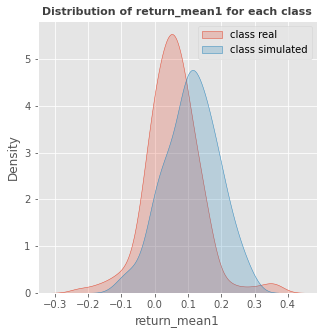

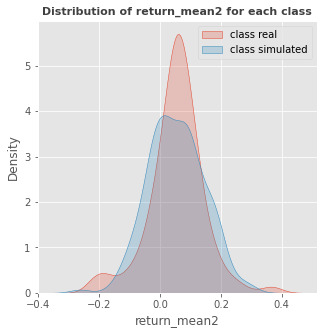

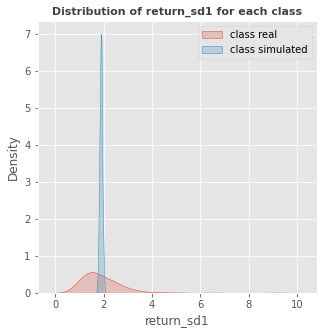

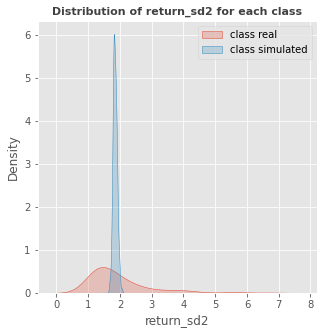

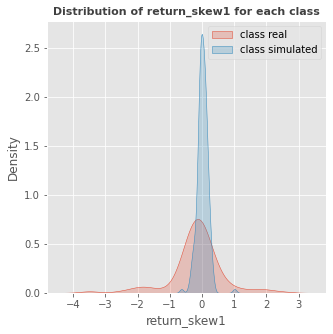

...

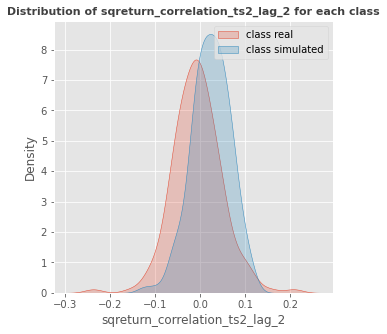

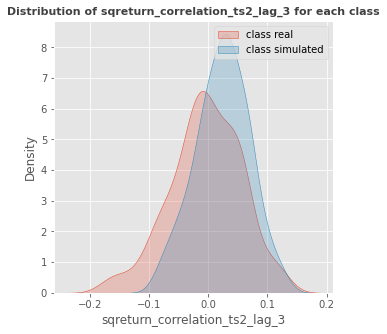

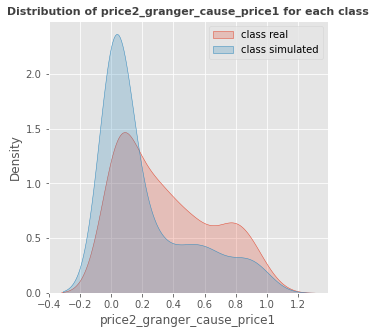

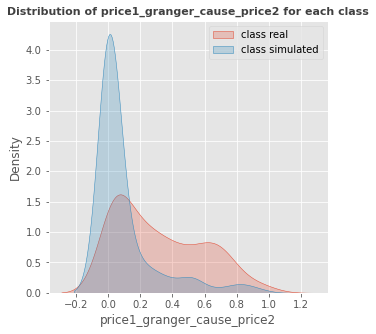

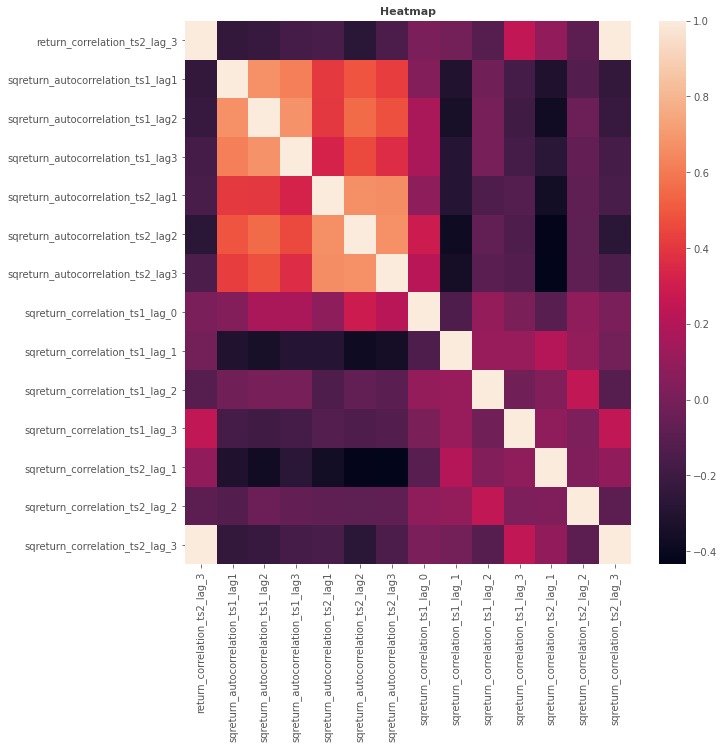

In [14]:
plt.rc('figure', max_open_warning = 0)
EDA.extensive_eda(X_train.iloc[:, 0:20], y_train, save_path="/Users/changmao/Desktop/OneDrive - Imperial College London/InferStat - MSc Summer Project/GitHub/Summer-Research-Project/Calibration/Cluster jobs/ou_jump_stvol/EDA_oujump")
EDA.extensive_eda(X_train.iloc[:, 20:36], y_train, save_path="/Users/changmao/Desktop/OneDrive - Imperial College London/InferStat - MSc Summer Project/GitHub/Summer-Research-Project/Calibration/Cluster jobs/ou_jump_stvol/EDA_oujump")

In [15]:
random_seed = 9868
real_statistics = create_statistics(
    label="real", 
    rolling_window=20, 
    return_csv_location=real_data_folder + "pair_returns_classify.csv", 
    price_csv_location=real_data_folder + "pair_prices_classify.csv")

n_sim_jumpou_log_prices = n_jumpou_simulation(
    random_seed=random_seed, num_sim=248,
    mu11=params[0], mu12=params[1], 
    mu21=params[2], mu22=params[3], 
    sigma11=params[4], sigma12=params[5], 
    sigma21=params[6], sigma22=params[7],
    j11=params[8], j12=params[9], 
    j21=params[10], j22=params[11],
    alpha=params[12], 
    beta1=beta1, beta2=beta2, 
    delta0=params[13], 
    mu1=params[14], mu2=params[15], 
    lambda11=params[16], lambda12=lambda12, 
    lambda21=lambda21, lambda22=1/params[16],
    xinit_vec=xinit_vec, T0=T0, T=T, length=length)

n_sim_jumpou_pair_prices = log_price_to_price(n_log_price=n_sim_jumpou_log_prices)
n_sim_jumpou_pair_returns = price_to_return(n_price=n_sim_jumpou_pair_prices)

n_sim_jumpou_pair_prices.to_csv("/Users/changmao/Desktop/OneDrive - Imperial College London/InferStat - MSc Summer Project/GitHub/Summer-Research-Project/Calibration/Cluster jobs/ou_jump_stvol/n_sim_jumpou_pair_prices.csv")
n_sim_jumpou_pair_returns.to_csv("/Users/changmao/Desktop/OneDrive - Imperial College London/InferStat - MSc Summer Project/GitHub/Summer-Research-Project/Calibration/Cluster jobs/ou_jump_stvol/n_sim_jumpou_pair_returns.csv")


simulated_statistics = create_statistics(
    label="simulated", 
    rolling_window=20, 
    return_csv_location="/Users/changmao/Desktop/OneDrive - Imperial College London/InferStat - MSc Summer Project/GitHub/Summer-Research-Project/Calibration/Cluster jobs/ou_jump_stvol/n_sim_jumpou_pair_returns.csv", 
    price_csv_location="/Users/changmao/Desktop/OneDrive - Imperial College London/InferStat - MSc Summer Project/GitHub/Summer-Research-Project/Calibration/Cluster jobs/ou_jump_stvol/n_sim_jumpou_pair_prices.csv")


dataset = pd.concat([real_statistics, simulated_statistics])
X = dataset.iloc[:, 0:36]
y = dataset.iloc[:, 36]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=random_seed)
automl = AutoML(eval_metric='accuracy')
automl.fit(X_train, y_train)
predictions = automl.predict(X_test)
accuracy_result = accuracy_score(y_test, predictions)

print(f"Accuracy of predictions:  {accuracy_result:.3f}")


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.5909  , p=0.2048  , df_denom=493, df_num=2
ssr based chi2 test:   chi2=3.2140  , p=0.2005  , df=2
likelihood ratio test: chi2=3.2037  , p=0.2015  , df=2
parameter F test:         F=1.5909  , p=0.2048  , df_denom=493, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=6.5049  , p=0.0016  , df_denom=493, df_num=2
ssr based chi2 test:   chi2=13.1418 , p=0.0014  , df=2
likelihood ratio test: chi2=12.9713 , p=0.0015  , df=2
parameter F test:         F=6.5049  , p=0.0016  , df_denom=493, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.6032  , p=0.4377  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.6068  , p=0.4360  , df=1
likelihood ratio test: chi2=0.6065  , p=0.4361  , df=1
parameter F test:         F=0.6032  , p=0.4377  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=11.8732 , p=0.0006  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.4071  , p=0.2399  , df_denom=490, df_num=3
ssr based chi2 test:   chi2=4.2815  , p=0.2326  , df=3
likelihood ratio test: chi2=4.2632  , p=0.2344  , df=3
parameter F test:         F=1.4071  , p=0.2399  , df_denom=490, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.6382  , p=0.1796  , df_denom=490, df_num=3
ssr based chi2 test:   chi2=4.9850  , p=0.1729  , df=3
likelihood ratio test: chi2=4.9601  , p=0.1747  , df=3
parameter F test:         F=1.6382  , p=0.1796  , df_denom=490, df_num=3

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.7299  , p=0.4825  , df_denom=493, df_num=2
ssr based chi2 test:   chi2=1.4746  , p=0.4784  , df=2
likelihood ratio test: chi2=1.4724  , p=0.4789  , df=2
parameter F test:         F=0.7299  , p=0.4825  , df_denom=493, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.6513  , p=0.5218  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.8855  , p=0.3471  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.8909  , p=0.3452  , df=1
likelihood ratio test: chi2=0.8901  , p=0.3455  , df=1
parameter F test:         F=0.8855  , p=0.3471  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.7701  , p=0.3806  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.7748  , p=0.3787  , df=1
likelihood ratio test: chi2=0.7742  , p=0.3789  , df=1
parameter F test:         F=0.7701  , p=0.3806  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.3677  , p=0.8317  , df_denom=487, df_num=4
ssr based chi2 test:   chi2=1.4978  , p=0.8270  , df=4
likelihood ratio test: chi2=1.4956  , p=0.8274  , df=4
parameter F test:         F=0.3677  , p=0.8317  , df_denom=487, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.8695  , p=0.1146  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.5593  , p=0.5720  , df_denom=493, df_num=2
ssr based chi2 test:   chi2=1.1299  , p=0.5684  , df=2
likelihood ratio test: chi2=1.1286  , p=0.5688  , df=2
parameter F test:         F=0.5593  , p=0.5720  , df_denom=493, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.3638  , p=0.6952  , df_denom=493, df_num=2
ssr based chi2 test:   chi2=0.7349  , p=0.6925  , df=2
likelihood ratio test: chi2=0.7344  , p=0.6927  , df=2
parameter F test:         F=0.3638  , p=0.6952  , df_denom=493, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0002  , p=0.9886  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.0002  , p=0.9885  , df=1
likelihood ratio test: chi2=0.0002  , p=0.9885  , df=1
parameter F test:         F=0.0002  , p=0.9886  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2422  , p=0.6228  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=10.0699 , p=0.0016  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=10.1308 , p=0.0015  , df=1
likelihood ratio test: chi2=10.0293 , p=0.0015  , df=1
parameter F test:         F=10.0699 , p=0.0016  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1132  , p=0.7366  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.1139  , p=0.7357  , df=1
likelihood ratio test: chi2=0.1139  , p=0.7357  , df=1
parameter F test:         F=0.1132  , p=0.7366  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.3763  , p=0.0131  , df_denom=493, df_num=2
ssr based chi2 test:   chi2=8.8414  , p=0.0120  , df=2
likelihood ratio test: chi2=8.7639  , p=0.0125  , df=2
parameter F test:         F=4.3763  , p=0.0131  , df_denom=493, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.6758  , p=0.0260  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.3529  , p=0.5527  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.3551  , p=0.5513  , df=1
likelihood ratio test: chi2=0.3549  , p=0.5513  , df=1
parameter F test:         F=0.3529  , p=0.5527  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.6498  , p=0.4206  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.6538  , p=0.4188  , df=1
likelihood ratio test: chi2=0.6533  , p=0.4189  , df=1
parameter F test:         F=0.6498  , p=0.4206  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=3.8344  , p=0.0098  , df_denom=490, df_num=3
ssr based chi2 test:   chi2=11.6676 , p=0.0086  , df=3
likelihood ratio test: chi2=11.5328 , p=0.0092  , df=3
parameter F test:         F=3.8344  , p=0.0098  , df_denom=490, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.1800  , p=0.3168  


Granger Causality
number of lags (no zero) 9
ssr based F test:         F=2.3409  , p=0.0137  , df_denom=472, df_num=9
ssr based chi2 test:   chi2=21.9160 , p=0.0091  , df=9
likelihood ratio test: chi2=21.4410 , p=0.0108  , df=9
parameter F test:         F=2.3409  , p=0.0137  , df_denom=472, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=0.7654  , p=0.6486  , df_denom=472, df_num=9
ssr based chi2 test:   chi2=7.1660  , p=0.6198  , df=9
likelihood ratio test: chi2=7.1142  , p=0.6252  , df=9
parameter F test:         F=0.7654  , p=0.6486  , df_denom=472, df_num=9

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.7966  , p=0.4514  , df_denom=493, df_num=2
ssr based chi2 test:   chi2=1.6094  , p=0.4472  , df=2
likelihood ratio test: chi2=1.6068  , p=0.4478  , df=2
parameter F test:         F=0.7966  , p=0.4514  , df_denom=493, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.0710  , p=0.0176  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.5485  , p=0.5782  , df_denom=493, df_num=2
ssr based chi2 test:   chi2=1.1081  , p=0.5746  , df=2
likelihood ratio test: chi2=1.1068  , p=0.5750  , df=2
parameter F test:         F=0.5485  , p=0.5782  , df_denom=493, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.7103  , p=0.0094  , df_denom=493, df_num=2
ssr based chi2 test:   chi2=9.5161  , p=0.0086  , df=2
likelihood ratio test: chi2=9.4263  , p=0.0090  , df=2
parameter F test:         F=4.7103  , p=0.0094  , df_denom=493, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.6434  , p=0.0269  , df_denom=493, df_num=2
ssr based chi2 test:   chi2=7.3607  , p=0.0252  , df=2
likelihood ratio test: chi2=7.3068  , p=0.0259  , df=2
parameter F test:         F=3.6434  , p=0.0269  , df_denom=493, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.2685  , p=0.0389  


Granger Causality
number of lags (no zero) 7
ssr based F test:         F=0.5360  , p=0.8073  , df_denom=478, df_num=7
ssr based chi2 test:   chi2=3.8699  , p=0.7946  , df=7
likelihood ratio test: chi2=3.8547  , p=0.7963  , df=7
parameter F test:         F=0.5360  , p=0.8073  , df_denom=478, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=2.2240  , p=0.0312  , df_denom=478, df_num=7
ssr based chi2 test:   chi2=16.0565 , p=0.0246  , df=7
likelihood ratio test: chi2=15.8005 , p=0.0270  , df=7
parameter F test:         F=2.2240  , p=0.0312  , df_denom=478, df_num=7

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.7815  , p=0.3771  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.7863  , p=0.3752  , df=1
likelihood ratio test: chi2=0.7856  , p=0.3754  , df=1
parameter F test:         F=0.7815  , p=0.3771  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.1180  , p=0.1462  


Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.7070  , p=0.0943  , df_denom=475, df_num=8
ssr based chi2 test:   chi2=14.1450 , p=0.0781  , df=8
likelihood ratio test: chi2=13.9455 , p=0.0832  , df=8
parameter F test:         F=1.7070  , p=0.0943  , df_denom=475, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.6345  , p=0.1125  , df_denom=475, df_num=8
ssr based chi2 test:   chi2=13.5437 , p=0.0945  , df=8
likelihood ratio test: chi2=13.3606 , p=0.1000  , df=8
parameter F test:         F=1.6345  , p=0.1125  , df_denom=475, df_num=8

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.5123  , p=0.5994  , df_denom=493, df_num=2
ssr based chi2 test:   chi2=1.0350  , p=0.5960  , df=2
likelihood ratio test: chi2=1.0339  , p=0.5963  , df=2
parameter F test:         F=0.5123  , p=0.5994  , df_denom=493, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.1450  , p=0.0164  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.8242  , p=0.1774  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=1.8352  , p=0.1755  , df=1
likelihood ratio test: chi2=1.8318  , p=0.1759  , df=1
parameter F test:         F=1.8242  , p=0.1774  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.3090  , p=0.5785  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.3109  , p=0.5771  , df=1
likelihood ratio test: chi2=0.3108  , p=0.5772  , df=1
parameter F test:         F=0.3090  , p=0.5785  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.4018  , p=0.2370  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=1.4103  , p=0.2350  , df=1
likelihood ratio test: chi2=1.4083  , p=0.2353  , df=1
parameter F test:         F=1.4018  , p=0.2370  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.7914  , p=0.3741  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.6655  , p=0.1975  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=1.6756  , p=0.1955  , df=1
likelihood ratio test: chi2=1.6728  , p=0.1959  , df=1
parameter F test:         F=1.6655  , p=0.1975  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.1818  , p=0.2775  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=1.1890  , p=0.2755  , df=1
likelihood ratio test: chi2=1.1876  , p=0.2758  , df=1
parameter F test:         F=1.1818  , p=0.2775  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.0367  , p=0.0253  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=5.0672  , p=0.0244  , df=1
likelihood ratio test: chi2=5.0416  , p=0.0247  , df=1
parameter F test:         F=5.0367  , p=0.0253  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0169  , p=0.8968  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.5113  , p=0.4749  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.5144  , p=0.4732  , df=1
likelihood ratio test: chi2=0.5141  , p=0.4733  , df=1
parameter F test:         F=0.5113  , p=0.4749  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1745  , p=0.6763  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.1756  , p=0.6752  , df=1
likelihood ratio test: chi2=0.1756  , p=0.6752  , df=1
parameter F test:         F=0.1745  , p=0.6763  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.8527  , p=0.3562  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.8579  , p=0.3543  , df=1
likelihood ratio test: chi2=0.8571  , p=0.3545  , df=1
parameter F test:         F=0.8527  , p=0.3562  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1165  , p=0.7330  

ssr based F test:         F=0.3113  , p=0.5771  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.3132  , p=0.5757  , df=1
likelihood ratio test: chi2=0.3131  , p=0.5758  , df=1
parameter F test:         F=0.3113  , p=0.5771  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.4801  , p=0.2243  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=1.4891  , p=0.2224  , df=1
likelihood ratio test: chi2=1.4869  , p=0.2227  , df=1
parameter F test:         F=1.4801  , p=0.2243  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.3110  , p=0.5773  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.3129  , p=0.5759  , df=1
likelihood ratio test: chi2=0.3128  , p=0.5759  , df=1
parameter F test:         F=0.3110  , p=0.5773  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1090  , p=0.7414  , df_denom=496, df_num=1
ssr based chi2 test: 


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.5424  , p=0.1115  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=2.5578  , p=0.1098  , df=1
likelihood ratio test: chi2=2.5512  , p=0.1102  , df=1
parameter F test:         F=2.5424  , p=0.1115  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1897  , p=0.6634  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.1908  , p=0.6622  , df=1
likelihood ratio test: chi2=0.1908  , p=0.6622  , df=1
parameter F test:         F=0.1897  , p=0.6634  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.7344  , p=0.1885  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=1.7449  , p=0.1865  , df=1
likelihood ratio test: chi2=1.7418  , p=0.1869  , df=1
parameter F test:         F=1.7344  , p=0.1885  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.5370  , p=0.4640  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.2960  , p=0.2751  , df_denom=490, df_num=3
ssr based chi2 test:   chi2=3.9437  , p=0.2676  , df=3
likelihood ratio test: chi2=3.9281  , p=0.2693  , df=3
parameter F test:         F=1.2960  , p=0.2751  , df_denom=490, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.8269  , p=0.4795  , df_denom=490, df_num=3
ssr based chi2 test:   chi2=2.5160  , p=0.4724  , df=3
likelihood ratio test: chi2=2.5096  , p=0.4736  , df=3
parameter F test:         F=0.8269  , p=0.4795  , df_denom=490, df_num=3

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=0.9946  , p=0.4343  , df_denom=478, df_num=7
ssr based chi2 test:   chi2=7.1806  , p=0.4103  , df=7
likelihood ratio test: chi2=7.1288  , p=0.4156  , df=7
parameter F test:         F=0.9946  , p=0.4343  , df_denom=478, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=1.0907  , p=0.3679  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.6220  , p=0.1834  , df_denom=490, df_num=3
ssr based chi2 test:   chi2=4.9355  , p=0.1766  , df=3
likelihood ratio test: chi2=4.9111  , p=0.1784  , df=3
parameter F test:         F=1.6220  , p=0.1834  , df_denom=490, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=2.8312  , p=0.0379  , df_denom=490, df_num=3
ssr based chi2 test:   chi2=8.6149  , p=0.0349  , df=3
likelihood ratio test: chi2=8.5411  , p=0.0361  , df=3
parameter F test:         F=2.8312  , p=0.0379  , df_denom=490, df_num=3

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.0912  , p=0.2967  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=1.0978  , p=0.2947  , df=1
likelihood ratio test: chi2=1.0966  , p=0.2950  , df=1
parameter F test:         F=1.0912  , p=0.2967  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.6270  , p=0.1057  

likelihood ratio test: chi2=5.7506  , p=0.0564  , df=2
parameter F test:         F=2.8630  , p=0.0580  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=3.3806  , p=0.0096  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=13.7719 , p=0.0081  , df=4
likelihood ratio test: chi2=13.5846 , p=0.0087  , df=4
parameter F test:         F=3.3806  , p=0.0096  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.3756  , p=0.8261  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=1.5301  , p=0.8213  , df=4
likelihood ratio test: chi2=1.5277  , p=0.8217  , df=4
parameter F test:         F=0.3756  , p=0.8261  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.6354  , p=0.0727  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=5.3242  , p=0.0698  , df=2
likelihood ratio test: chi2=5.2960  , p=0.0708  , df=2
parameter F test:         F=2.6354  , p


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=11.0768 , p=0.0009  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=11.1436 , p=0.0008  , df=1
likelihood ratio test: chi2=11.0213 , p=0.0009  , df=1
parameter F test:         F=11.0768 , p=0.0009  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2433  , p=0.6220  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.2448  , p=0.6208  , df=1
likelihood ratio test: chi2=0.2447  , p=0.6208  , df=1
parameter F test:         F=0.2433  , p=0.6220  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.6710  , p=0.6123  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=2.7337  , p=0.6033  , df=4
likelihood ratio test: chi2=2.7262  , p=0.6046  , df=4
parameter F test:         F=0.6710  , p=0.6123  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=2.0805  , p=0.0822  

likelihood ratio test: chi2=26.3683 , p=0.0009  , df=8
parameter F test:         F=3.2690  , p=0.0012  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=4.5159  , p=0.0000  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=37.4175 , p=0.0000  , df=8
likelihood ratio test: chi2=36.0655 , p=0.0000  , df=8
parameter F test:         F=4.5159  , p=0.0000  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.1868  , p=0.8296  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=0.3775  , p=0.8280  , df=2
likelihood ratio test: chi2=0.3773  , p=0.8281  , df=2
parameter F test:         F=0.1868  , p=0.8296  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.9657  , p=0.0196  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=8.0116  , p=0.0182  , df=2
likelihood ratio test: chi2=7.9480  , p=0.0188  , df=2
parameter F test:         F=3.9657  , p


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=6.1608  , p=0.0004  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=18.7460 , p=0.0003  , df=3
likelihood ratio test: chi2=18.4018 , p=0.0004  , df=3
parameter F test:         F=6.1608  , p=0.0004  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=12.5206 , p=0.0000  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=38.0972 , p=0.0000  , df=3
likelihood ratio test: chi2=36.7103 , p=0.0000  , df=3
parameter F test:         F=12.5206 , p=0.0000  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.5959  , p=0.0105  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=6.6358  , p=0.0100  , df=1
likelihood ratio test: chi2=6.5921  , p=0.0102  , df=1
parameter F test:         F=6.5959  , p=0.0105  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.6367  , p=0.4253  

ssr based F test:         F=2.6965  , p=0.1012  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.7128  , p=0.0995  , df=1
likelihood ratio test: chi2=2.7055  , p=0.1000  , df=1
parameter F test:         F=2.6965  , p=0.1012  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=13.9379 , p=0.0002  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=14.0221 , p=0.0002  , df=1
likelihood ratio test: chi2=13.8290 , p=0.0002  , df=1
parameter F test:         F=13.9379 , p=0.0002  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0002  , p=0.9876  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0002  , p=0.9875  , df=1
likelihood ratio test: chi2=0.0002  , p=0.9875  , df=1
parameter F test:         F=0.0002  , p=0.9876  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=1.1767  , p=0.3195  , df_denom=485, df_num=5
ssr based chi2 test: 

parameter F test:         F=5.9896  , p=0.0000  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1613  , p=0.6881  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1623  , p=0.6871  , df=1
likelihood ratio test: chi2=0.1623  , p=0.6871  , df=1
parameter F test:         F=0.1613  , p=0.6881  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.2353  , p=0.0043  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=8.2850  , p=0.0040  , df=1
likelihood ratio test: chi2=8.2171  , p=0.0041  , df=1
parameter F test:         F=8.2353  , p=0.0043  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=0.5598  , p=0.7309  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=2.8624  , p=0.7212  , df=5
likelihood ratio test: chi2=2.8542  , p=0.7225  , df=5
parameter F test:         F=0.5598  , p=0.7309  , df_denom=485, df_num=5

Granger Causality
nu


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.2657  , p=0.2829  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=2.5571  , p=0.2784  , df=2
likelihood ratio test: chi2=2.5505  , p=0.2794  , df=2
parameter F test:         F=1.2657  , p=0.2829  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=9.7127  , p=0.0001  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=19.6220 , p=0.0001  , df=2
likelihood ratio test: chi2=19.2460 , p=0.0001  , df=2
parameter F test:         F=9.7127  , p=0.0001  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.8852  , p=0.3472  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.8905  , p=0.3453  , df=1
likelihood ratio test: chi2=0.8897  , p=0.3455  , df=1
parameter F test:         F=0.8852  , p=0.3472  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=15.8237 , p=0.0001  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=16.0992 , p=0.0001  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=16.1964 , p=0.0001  , df=1
likelihood ratio test: chi2=15.9396 , p=0.0001  , df=1
parameter F test:         F=16.0992 , p=0.0001  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.3411  , p=0.5595  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.3431  , p=0.5580  , df=1
likelihood ratio test: chi2=0.3430  , p=0.5581  , df=1
parameter F test:         F=0.3411  , p=0.5595  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.7315  , p=0.1781  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=3.4980  , p=0.1739  , df=2
likelihood ratio test: chi2=3.4858  , p=0.1750  , df=2
parameter F test:         F=1.7315  , p=0.1781  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.1444  , p=0.3193  


Granger Causality
number of lags (no zero) 5
ssr based F test:         F=1.0776  , p=0.3718  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=5.5104  , p=0.3568  , df=5
likelihood ratio test: chi2=5.4800  , p=0.3601  , df=5
parameter F test:         F=1.0776  , p=0.3718  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=3.8190  , p=0.0021  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=19.5278 , p=0.0015  , df=5
likelihood ratio test: chi2=19.1532 , p=0.0018  , df=5
parameter F test:         F=3.8190  , p=0.0021  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.2543  , p=0.2633  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.2619  , p=0.2613  , df=1
likelihood ratio test: chi2=1.2603  , p=0.2616  , df=1
parameter F test:         F=1.2543  , p=0.2633  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=17.3496 , p=0.0000  


Granger Causality
number of lags (no zero) 8
ssr based F test:         F=3.5514  , p=0.0005  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=29.4257 , p=0.0003  , df=8
likelihood ratio test: chi2=28.5810 , p=0.0004  , df=8
parameter F test:         F=3.5514  , p=0.0005  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=4.2553  , p=0.0001  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=35.2581 , p=0.0000  , df=8
likelihood ratio test: chi2=34.0544 , p=0.0000  , df=8
parameter F test:         F=4.2553  , p=0.0001  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=2.3849  , p=0.0210  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=17.2174 , p=0.0160  , df=7
likelihood ratio test: chi2=16.9242 , p=0.0179  , df=7
parameter F test:         F=2.3849  , p=0.0210  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=2.2920  , p=0.0264  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1103  , p=0.7399  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1110  , p=0.7390  , df=1
likelihood ratio test: chi2=0.1110  , p=0.7390  , df=1
parameter F test:         F=0.1103  , p=0.7399  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=12.2545 , p=0.0005  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=12.3285 , p=0.0004  , df=1
likelihood ratio test: chi2=12.1790 , p=0.0005  , df=1
parameter F test:         F=12.2545 , p=0.0005  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=4.6662  , p=0.0032  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=14.1981 , p=0.0026  , df=3
likelihood ratio test: chi2=13.9995 , p=0.0029  , df=3
parameter F test:         F=4.6662  , p=0.0032  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=7.3601  , p=0.0001  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.5307  , p=0.6614  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=1.6147  , p=0.6561  , df=3
likelihood ratio test: chi2=1.6121  , p=0.6567  , df=3
parameter F test:         F=0.5307  , p=0.6614  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=5.0281  , p=0.0019  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=15.2994 , p=0.0016  , df=3
likelihood ratio test: chi2=15.0691 , p=0.0018  , df=3
parameter F test:         F=5.0281  , p=0.0019  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=2.1531  , p=0.0241  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=20.1561 , p=0.0170  , df=9
likelihood ratio test: chi2=19.7542 , p=0.0195  , df=9
parameter F test:         F=2.1531  , p=0.0241  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=3.1472  , p=0.0011  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1646  , p=0.6851  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1656  , p=0.6840  , df=1
likelihood ratio test: chi2=0.1656  , p=0.6841  , df=1
parameter F test:         F=0.1646  , p=0.6851  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.8224  , p=0.1776  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.8334  , p=0.1757  , df=1
likelihood ratio test: chi2=1.8300  , p=0.1761  , df=1
parameter F test:         F=1.8224  , p=0.1776  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=10.7846 , p=0.0000  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=43.9339 , p=0.0000  , df=4
likelihood ratio test: chi2=42.0994 , p=0.0000  , df=4
parameter F test:         F=10.7846 , p=0.0000  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=7.0962  , p=0.0000  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.3289  , p=0.0041  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=8.3792  , p=0.0038  , df=1
likelihood ratio test: chi2=8.3097  , p=0.0039  , df=1
parameter F test:         F=8.3289  , p=0.0041  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.4061  , p=0.5242  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.4086  , p=0.5227  , df=1
likelihood ratio test: chi2=0.4084  , p=0.5228  , df=1
parameter F test:         F=0.4061  , p=0.5242  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1457  , p=0.7028  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1466  , p=0.7018  , df=1
likelihood ratio test: chi2=0.1466  , p=0.7018  , df=1
parameter F test:         F=0.1457  , p=0.7028  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=21.9840 , p=0.0000  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.5659  , p=0.2099  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=3.1634  , p=0.2056  , df=2
likelihood ratio test: chi2=3.1534  , p=0.2067  , df=2
parameter F test:         F=1.5659  , p=0.2099  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=8.4295  , p=0.0003  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=17.0297 , p=0.0002  , df=2
likelihood ratio test: chi2=16.7455 , p=0.0002  , df=2
parameter F test:         F=8.4295  , p=0.0003  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.4725  , p=0.0038  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=8.5237  , p=0.0035  , df=1
likelihood ratio test: chi2=8.4518  , p=0.0036  , df=1
parameter F test:         F=8.4725  , p=0.0038  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.5335  , p=0.0063  

AutoML directory: AutoML_62
The task is binary_classification with evaluation metric accuracy
AutoML will use algorithms: ['Baseline', 'Linear', 'Decision Tree', 'Random Forest', 'Xgboost', 'Neural Network']
AutoML will ensemble availabe models


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.505747 trained in 34.89 seconds
2_DecisionTree accuracy 0.931034 trained in 10.84 seconds
3_Linear accuracy 0.977011 trained in 3.09 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 0.988506 trained in 3.41 seconds
5_Default_NeuralNetwork accuracy 0.988506 trained in 1.59 seconds
6_Default_RandomForest accuracy 0.988506 trained in 6.54 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 0.988506 trained in 0.17 seconds


An input array is constant; the correlation coefficent is not defined.


AutoML fit time: 70.57 seconds
AutoML best model: 4_Default_Xgboost
Accuracy of predictions:  0.919


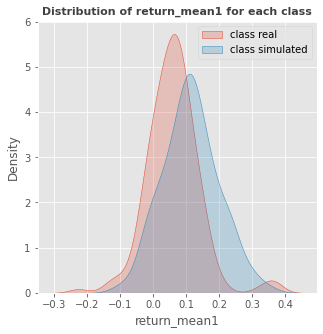

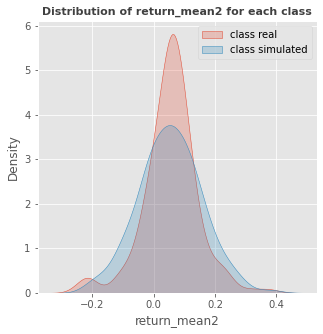

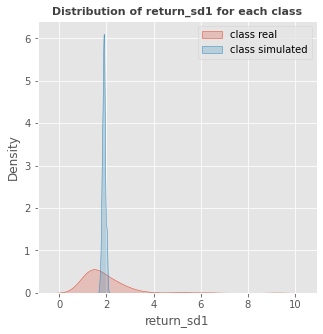

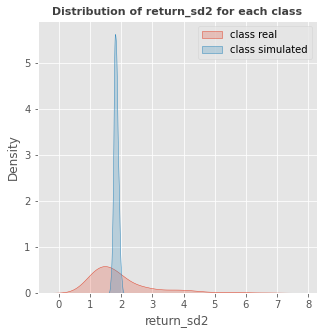

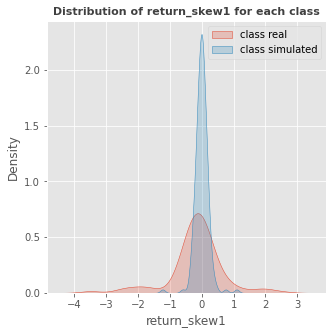

...

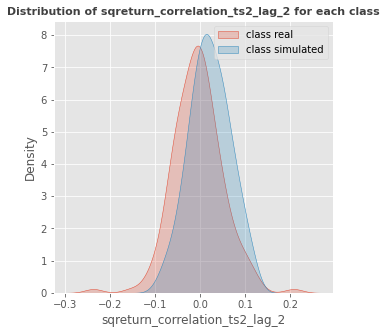

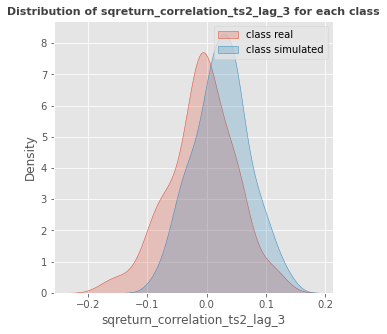

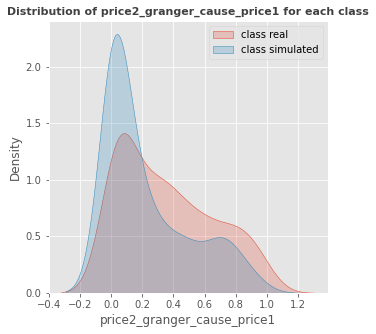

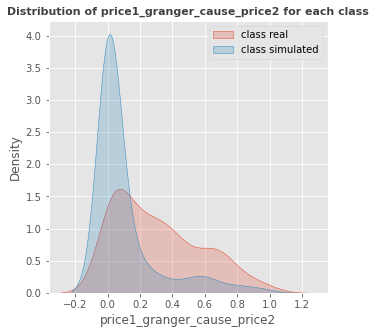

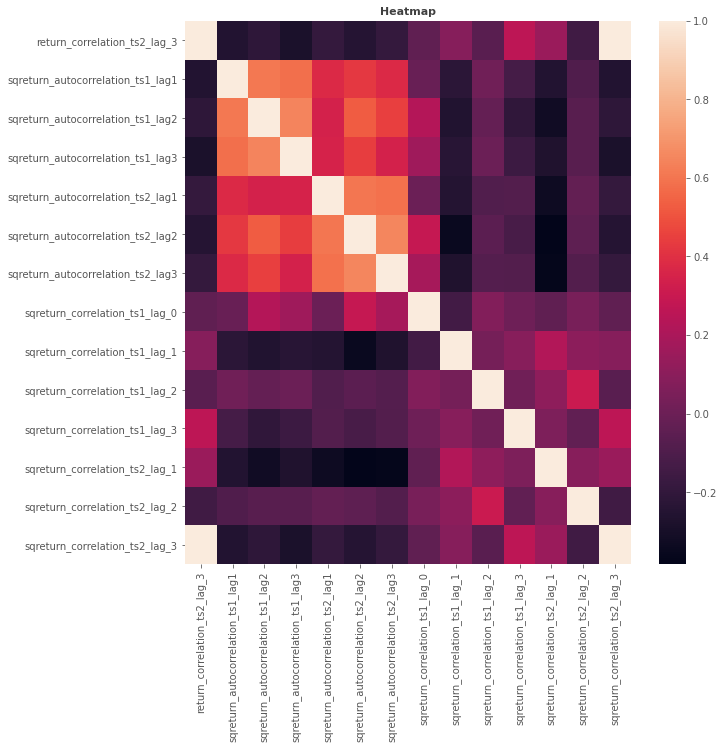

In [16]:
plt.rc('figure', max_open_warning = 0)
EDA.extensive_eda(X_train.iloc[:, 0:20], y_train, save_path="/Users/changmao/Desktop/OneDrive - Imperial College London/InferStat - MSc Summer Project/GitHub/Summer-Research-Project/Calibration/Cluster jobs/ou_jump_stvol/EDA_oujump_2")
EDA.extensive_eda(X_train.iloc[:, 20:36], y_train, save_path="/Users/changmao/Desktop/OneDrive - Imperial College London/InferStat - MSc Summer Project/GitHub/Summer-Research-Project/Calibration/Cluster jobs/ou_jump_stvol/EDA_oujump_2")